In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import seaborn as sns

import os
import sys
import annoy
from annoy import AnnoyIndex
import random

import glob

from IPython.display import display_markdown

from collections import Counter

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import cKDTree
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn.ensemble import RandomForestClassifier


import antares_client

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# set random seed for consistent results
import random
random.seed(0)

plt.style.use('fig_publication.mplstyle')
%config InlineBackend.figure_format = 'retina'  #for MacOS, make plots crisp

In [2]:
# From 106 available features from Kostya's lc_feature_extractor, use the 82 from SNAD Miner paper 
# R and g bands
feature_names_r_g = ['feature_amplitude_magn_r', 
                         'feature_anderson_darling_normal_magn_r',
                         'feature_beyond_1_std_magn_r', 
                         'feature_beyond_2_std_magn_r',
                         'feature_cusum_magn_r', 
                         #'feature_eta_e_magn_r',
                         'feature_inter_percentile_range_2_magn_r',
                         'feature_inter_percentile_range_10_magn_r',
                         'feature_inter_percentile_range_25_magn_r', 
                         'feature_kurtosis_magn_r',
                         'feature_linear_fit_slope_magn_r',
                         'feature_linear_fit_slope_sigma_magn_r',
                         #'feature_linear_fit_reduced_chi2_magn_r', 
                         #'feature_linear_trend_magn_r', # cadence removal
                         #'feature_linear_trend_sigma_magn_r',  # cadence removal
                         'feature_magnitude_percentage_ratio_40_5_magn_r',
                         'feature_magnitude_percentage_ratio_20_5_magn_r',
                         #'feature_maximum_slope_magn_r',
                         'feature_mean_magn_r',
                         'feature_median_absolute_deviation_magn_r',
                         'feature_percent_amplitude_magn_r',
                         'feature_median_buffer_range_percentage_10_magn_r',
                         'feature_median_buffer_range_percentage_20_magn_r',
                         'feature_percent_difference_magnitude_percentile_5_magn_r',
                         'feature_percent_difference_magnitude_percentile_10_magn_r',
                         #'feature_period_0_magn_r',  # should be negated
                         #'feature_period_s_to_n_0_magn_r', # cadence removal
                         #'feature_period_1_magn_r', 
                         #'feature_period_s_to_n_1_magn_r', # cadence removal
                         #'feature_period_2_magn_r', 
                         #'feature_period_s_to_n_2_magn_r', # cadence removal
                         #'feature_period_3_magn_r', 
                         #'feature_period_s_to_n_3_magn_r', # cadence removal
                         #'feature_period_4_magn_r', 
                         #'feature_period_s_to_n_4_magn_r', # cadence removal
                         #'feature_periodogram_amplitude_magn_r',
                         #'feature_periodogram_beyond_2_std_magn_r',  # cadence removal
                         #'feature_periodogram_beyond_3_std_magn_r',  # cadence removal
                         #'feature_periodogram_standard_deviation_magn_r',   # cadence removal
                         #'feature_chi2_magn_r',
                         'feature_skew_magn_r', 
                         'feature_standard_deviation_magn_r',
                         'feature_stetson_k_magn_r',
                         'feature_weighted_mean_magn_r',
                         'feature_anderson_darling_normal_flux_r', 
                         'feature_cusum_flux_r',
                         #'feature_eta_e_flux_r', 
                         'feature_excess_variance_flux_r',
                         'feature_kurtosis_flux_r', 
                         'feature_mean_variance_flux_r',
                         #'feature_chi2_flux_r', 
                         'feature_skew_flux_r',
                         'feature_stetson_k_flux_r',

                         'feature_amplitude_magn_g', 
                         'feature_anderson_darling_normal_magn_g',
                         'feature_beyond_1_std_magn_g', 
                         'feature_beyond_2_std_magn_g',
                         'feature_cusum_magn_g', 
                         #'feature_eta_e_magn_g',
                         'feature_inter_percentile_range_2_magn_g',
                         'feature_inter_percentile_range_10_magn_g',
                         'feature_inter_percentile_range_25_magn_g', 
                         'feature_kurtosis_magn_g',
                         'feature_linear_fit_slope_magn_g',
                         'feature_linear_fit_slope_sigma_magn_g',
                         #'feature_linear_fit_reduced_chi2_magn_g', 
                         #'feature_linear_trend_magn_g', # cadence removal
                         #'feature_linear_trend_sigma_magn_g',  # cadence removal
                         'feature_magnitude_percentage_ratio_40_5_magn_g',
                         'feature_magnitude_percentage_ratio_20_5_magn_g',
                         #'feature_maximum_slope_magn_g', 
                         'feature_mean_magn_g',
                         'feature_median_absolute_deviation_magn_g',
                         'feature_median_buffer_range_percentage_10_magn_g',
                         'feature_median_buffer_range_percentage_20_magn_g',
                         'feature_percent_amplitude_magn_g',
                         'feature_percent_difference_magnitude_percentile_5_magn_g',
                         'feature_percent_difference_magnitude_percentile_10_magn_g',
                         #'feature_period_0_magn_g',  # should be negated
                         #'feature_period_s_to_n_0_magn_g', # cadence removal
                         #'feature_period_1_magn_g', 
                         #'feature_period_s_to_n_1_magn_g', # cadence removal
                         #'feature_period_2_magn_g', 
                         #'feature_period_s_to_n_2_magn_g', # cadence removal
                         #'feature_period_3_magn_g', 
                         #'feature_period_s_to_n_3_magn_g', # cadence removal
                         #'feature_period_4_magn_g', 
                         #'feature_period_s_to_n_4_magn_g', # cadence removal
                         #'feature_periodogram_amplitude_magn_g',
                         #'feature_periodogram_beyond_2_std_magn_g',  # cadence removal
                         #'feature_periodogram_beyond_3_std_magn_g', # cadence removal
                         #'feature_periodogram_standard_deviation_magn_g',  # cadence removal
                         #'feature_chi2_magn_g',
                         'feature_skew_magn_g', 
                         'feature_standard_deviation_magn_g',
                         'feature_stetson_k_magn_g', 
                         'feature_weighted_mean_magn_g',
                         'feature_anderson_darling_normal_flux_g', 
                         'feature_cusum_flux_g',
                         #'feature_eta_e_flux_g', 
                         'feature_excess_variance_flux_g',
                         'feature_kurtosis_flux_g', 
                         'feature_mean_variance_flux_g',
                         #'feature_chi2_flux_g', 
                         'feature_skew_flux_g',
                         'feature_stetson_k_flux_g'] 
    
ztf_id_and_features_r_g = ['Unnamed: 0'] + ['locus_id', 'ra', 'dec',\
                            'tags', 'catalogs', 'ztf_object_id', 'ztf_ssnamenr', 'num_alerts',\
                            'num_mag_values', 'oldest_alert_id', 'oldest_alert_magnitude',\
                            'oldest_alert_observation_time', 'newest_alert_id',\
                            'newest_alert_magnitude', 'newest_alert_observation_time',\
                            'brightest_alert_id', 'brightest_alert_magnitude', \
                            'brightest_alert_observation_time'] + feature_names_r_g +\
                        ['horizons_targetname', 'anomaly', 'anom_score', 'anomaly_score',\
                         'anomaly_mask', 'anomaly_type', 'is_corrected', 'vpdf_extreme_version',\
                         'vpdf_extreme_faint', 'vpdf_extreme_bright', 'locus_gal_l', 'locus_gal_b']


feature_names_hostgal = [
#  'Unnamed: 0',
#  'level_0',
#  'index',
#  'objName',
#  'objAltName1',
#  'objAltName2',
#  'objAltName3',
#  'objID',
#  'uniquePspsOBid',
#  'ippObjID',
#  'surveyID',
#  'htmID',
#  'zoneID',
#  'tessID',
#  'projectionID',
#  'skyCellID',
#  'randomID',
#  'batchID',
#  'dvoRegionID',
#  'processingVersion',
#  'objInfoFlag',
#  'qualityFlag',
#  'raStack',
#  'decStack',
#  'raStackErr',
#  'decStackErr',
#  'raMean',
#  'decMean',
#  'raMeanErr',
#  'decMeanErr',
#  'epochMean',
#  'posMeanChisq',
#  'cx',
#  'cy',
#  'cz',
#  'lambda',
#  'beta',
#  'l',
#  'b',
#  'nStackObjectRows',
#  'nStackDetections',
#  'nDetections',
#  'ng',
#  'nr',
#  'ni',
#  'nz',
#  'ny',
#  'uniquePspsSTid',
#  'primaryDetection',
#  'bestDetection',
#  'gippDetectID',
#  'gstackDetectID',
#  'gstackImageID',
#  'gra',
#  'gdec',
#  'graErr',
#  'gdecErr',
#  'gEpoch',
#  'gPSFMag',
#  'gPSFMagErr',
#  'gApMag',
#  'gApMagErr',
#  'gKronMag',
#  'gKronMagErr',
#  'ginfoFlag',
#  'ginfoFlag2',
#  'ginfoFlag3',
#  'gnFrames',
#  'gxPos',
#  'gyPos',
#  'gxPosErr',
#  'gyPosErr',
#  'gpsfMajorFWHM',
#  'gpsfMinorFWHM',
#  'gpsfTheta',
#  'gpsfCore',
#  'gpsfLikelihood',
#  'gpsfQf',
#  'gpsfQfPerfect',
#  'gpsfChiSq',
 'gmomentXX',
 'gmomentXY',
 'gmomentYY',
 'gmomentR1',
 'gmomentRH',
 'gPSFFlux',
#  'gPSFFluxErr',
 'gApFlux',
#  'gApFluxErr',
#  'gApFillFac',
#  'gApRadius',
 'gKronFlux',
#  'gKronFluxErr',
 'gKronRad',
#  'gexpTime',
 'gExtNSigma',
#  'gsky',
#  'gskyErr',
#  'gzp',
#  'gPlateScale',
#  'rippDetectID',
#  'rstackDetectID',
#  'rstackImageID',
#  'rra',
#  'rdec',
#  'rraErr',
#  'rdecErr',
#  'rEpoch',
# 'rPSFMag',
#  'rPSFMagErr',
# 'rApMag',
#  'rApMagErr',
# 'rKronMag',
#  'rKronMagErr',
#  'rinfoFlag',
#  'rinfoFlag2',
#  'rinfoFlag3',
#  'rnFrames',
#  'rxPos',
#  'ryPos',
#  'rxPosErr',
#  'ryPosErr',
#  'rpsfMajorFWHM',
#  'rpsfMinorFWHM',
#  'rpsfTheta',
#  'rpsfCore',
#  'rpsfLikelihood',
#  'rpsfQf',
#  'rpsfQfPerfect',
#  'rpsfChiSq',
 'rmomentXX',
 'rmomentXY',
 'rmomentYY',
 'rmomentR1',
 'rmomentRH',
'rPSFFlux',
#  'rPSFFluxErr',
'rApFlux',
#  'rApFluxErr',
#  'rApFillFac',
# 'rApRadius',
'rKronFlux',
#  'rKronFluxErr',
'rKronRad',
#  'rexpTime',
 'rExtNSigma',
#  'rsky',
#  'rskyErr',
#  'rzp',
#  'rPlateScale',
#  'iippDetectID',
#  'istackDetectID',
#  'istackImageID',
#  'ira',
#  'idec',
#  'iraErr',
#  'idecErr',
#  'iEpoch',
#  'iPSFMag',
#  'iPSFMagErr',
#  'iApMag',
#  'iApMagErr',
#  'iKronMag',
#  'iKronMagErr',
#  'iinfoFlag',
#  'iinfoFlag2',
#  'iinfoFlag3',
#  'inFrames',
#  'ixPos',
#  'iyPos',
#  'ixPosErr',
#  'iyPosErr',
#  'ipsfMajorFWHM',
#  'ipsfMinorFWHM',
#  'ipsfTheta',
#  'ipsfCore',
#  'ipsfLikelihood',
#  'ipsfQf',
#  'ipsfQfPerfect',
#  'ipsfChiSq',
  'imomentXX',
 'imomentXY',
 'imomentYY',
 'imomentR1',
 'imomentRH',
 'iPSFFlux',
#  'iPSFFluxErr',
 'iApFlux',
#  'iApFluxErr',
#  'iApFillFac',
#  'iApRadius',
 'iKronFlux',
#  'iKronFluxErr',
 'iKronRad',
#  'iexpTime',
  'iExtNSigma',
#  'isky',
#  'iskyErr',
#  'izp',
#  'iPlateScale',
#  'zippDetectID',
#  'zstackDetectID',
#  'zstackImageID',
#  'zra',
#  'zdec',
#  'zraErr',
#  'zdecErr',
#  'zEpoch',
#  'zPSFMag',
#  'zPSFMagErr',
#  'zApMag',
#  'zApMagErr',
#  'zKronMag',
#  'zKronMagErr',
#  'zinfoFlag',
#  'zinfoFlag2',
#  'zinfoFlag3',
#  'znFrames',
#  'zxPos',
#  'zyPos',
#  'zxPosErr',
#  'zyPosErr',
#  'zpsfMajorFWHM',
#  'zpsfMinorFWHM',
#  'zpsfTheta',
#  'zpsfCore',
#  'zpsfLikelihood',
#  'zpsfQf',
#  'zpsfQfPerfect',
#  'zpsfChiSq',
  'zmomentXX',
 'zmomentXY',
 'zmomentYY',
 'zmomentR1',
 'zmomentRH',
 'zPSFFlux',
# #  'zPSFFluxErr',
 'zApFlux',
# #  'zApFluxErr',
# #  'zApFillFac',
# #  'zApRadius',
 'zKronFlux',
# #  'zKronFluxErr',
 'zKronRad',
# #  'zexpTime',
  'zExtNSigma',
#  'zsky',
#  'zskyErr',
#  'zzp',
#  'zPlateScale',
#  'yippDetectID',
#  'ystackDetectID',
#  'ystackImageID',
#  'yra',
#  'ydec',
#  'yraErr',
#  'ydecErr',
#  'yEpoch',
#  'yPSFMag',
#  'yPSFMagErr',
#  'yApMag',
#  'yApMagErr',
#  'yKronMag',
#  'yKronMagErr',
#  'yinfoFlag',
#  'yinfoFlag2',
#  'yinfoFlag3',
#  'ynFrames',
#  'yxPos',
#  'yyPos',
#  'yxPosErr',
#  'yyPosErr',
#  'ypsfMajorFWHM',
#  'ypsfMinorFWHM',
#  'ypsfTheta',
#  'ypsfCore',
#  'ypsfLikelihood',
#  'ypsfQf',
#  'ypsfQfPerfect',
#  'ypsfChiSq',
  'ymomentXX',
  'ymomentXY',
  'ymomentYY',
  'ymomentR1',
  'ymomentRH',
  'yPSFFlux',
# #   'yPSFFluxErr',
  'yApFlux',
# #   'yApFluxErr',
# #   'yApFillFac',
# #  'yApRadius',
 'yKronFlux',
# #  'yKronFluxErr',
 'yKronRad',
# #  'yexpTime',
  'yExtNSigma',
#  'ysky',
#  'yskyErr',
#  'yzp',
#  'yPlateScale',
#  'distance',
#  'SkyMapper_StarClass',
#  'gelong',
#  'g_a',
#  'g_b',
#  'g_pa',
#  'relong',
#  'r_a',
#  'r_b',
#  'r_pa',
#  'ielong',
#  'i_a',
#  'i_b',
#  'i_pa',
#  'zelong',
#  'z_a',
#  'z_b',
#  'z_pa',
   'i-z', # try throwing in
#    'g-r',
#    'r-i',
#    'g-i',
#    'z-y',
#   'g-rErr',
#   'r-iErr',
#   'i-zErr',
#   'z-yErr',
 'gApMag_gKronMag',
 'rApMag_rKronMag',
 'iApMag_iKronMag',
 'zApMag_zKronMag',
 'yApMag_yKronMag',
 '7DCD', 
#  'NED_name',
#  'NED_type',
#  'NED_vel',
#  'NED_redshift',
#  'NED_mag',
#  'class',
   'dist/DLR',
#   'dist',
#  'TransientClass',
#  'TransientRA',
#  'TransientDEC'
   ]

feature_names_tns = ['has_tns', 'tns_cls', 'spec_z', 'report_group']

lc_and_host_features = feature_names_r_g+feature_names_hostgal
lc_and_host_and_tns_features = lc_and_host_features + feature_names_tns

In [3]:
def plot_conf_matrix(y_test, y_pred, labels, title, kind, figsize=(6, 4)):
    if kind == 'completeness':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='true')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    if kind == 'purity':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='pred')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    plt.figure(figsize=figsize)
    sns.heatmap(heatmap, annot=annotations, fmt='s', cmap='Blues', vmin=0, vmax=1, annot_kws={"fontsize":18})
    plt.title(title, fontsize=24)
    plt.ylabel('True class', fontsize=24)
    plt.xlabel('Predicted class', fontsize=24)
    #plt.show()

In [187]:
def plot_RFC_prob_vs_lc(dataframe, anom_thresh):
    import antares_client

    df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
    anom_thresh = anom_thresh

    num_anom_epochs_l = []
    anom_ztfid_l, tnscls_l = [],[]
    for anom_ztfid, tnscls in zip(dataframe.index, dataframe.tns_cls):
        print(anom_ztfid, tnscls)
        try:
            lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
        except:
            print(f"couldn't feature space as func of time for {anom_ztfid}. Make anom epoch -9")
            num_anom_epochs_l.append(-9)
            continue

        lc_and_hosts_df = lc_and_hosts_df.dropna()
        anom_obj_df = lc_and_hosts_df[lc_and_host_features]

        
        try:
            pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
            num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
            num_anom_epochs_l.append(num_anom_epochs)
        except:
            print(f"{anom_ztfid} has some NaN host galaxy values from PS1 catalog. Skip!")
            continue

        try: 
            #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
            orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
            diff = len(orig)-len(pred_prob_anom)
            #if len(np.where(pred_prob_anom[:, 1]>=anom_thresh)) == 1:
            if not np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0] == 0:
                anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff
            else: anom_idx = lc_and_hosts_df.iloc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff
            anom_idx_is = True

        except: 
            print(f"Prediction doesn't exceed anom_threshold of {anom_thresh}% for {anom_ztfid}.")
            anom_idx_is = False

        ztf_id_ref = anom_ztfid 

        ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

        try: df_ref = ref_info.timeseries.to_pandas()
        except: 
            print(f"No ref_info.timeseries.to_pandas() for {anom_ztfid}. Continue...")
            continue

        print(num_anom_epochs)
        anom_ztfid_l.append(anom_ztfid), tnscls_l.append(tnscls)

        df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
        df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

        mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
        mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

        fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,10))
        ax1.invert_yaxis()
        ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
                    label=f'REF: {ztf_id_ref}')
        ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
        #ax1.axvline(x=lc_and_hosts_df.loc[lc_and_hosts_df.loc[anom_idx].obs_num].mjd_cutoff)
        if anom_idx_is == True:
            ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx])
        #ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))
        ax1.set_ylabel('Mag')


        print(f'https://alerce.online/object/{anom_ztfid}', tnscls)
        ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
        ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
        #ax2.axhline(y=50)

        ax2.set_ylabel('Probability (%)')


        #ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

        plt.xlabel('mjd_cutoff')
        plt.legend()
        plt.show()
        
def plot_RFC_prob_vs_lc_ztfid(anom_ztfid, anom_thresh, lc, meta, df_path):
    df_path = df_path
    anom_thresh = anom_thresh

    try:
        lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
    except:
        print(f"couldn't feature space as func of time for {anom_ztfid}. pass.")
        return

    lc_and_hosts_df = lc_and_hosts_df.dropna()
    
    try:
        anom_obj_df = lc_and_hosts_df[lc_and_host_features]
    except:
        print(f"{anom_ztfid} has some NaN LC features. Skip!")
        return

    try:
        pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
        num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
    except:
        print(f"{anom_ztfid} has some NaN host galaxy values from PS1 catalog. Skip!")
        return

    try: 
        #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
        orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
        #diff = len(orig)-len(pred_prob_anom)
        anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]]
        anom_idx_is = True
        print("Anomalous during timeseries!")

    except: 
        print(f"Prediction doesn't exceed anom_threshold of {anom_thresh}% for {anom_ztfid}.")
        anom_idx_is = False

    max_anom_score = max(pred_prob_anom[:, 1])
    print("max_anom_score", round(max_anom_score, 1))
    
    ztf_id_ref = anom_ztfid 

    df_ref_g = lc[(lc.PASSBAND == 'g')]
    df_ref_r = lc[(lc.PASSBAND == 'R')]

    mjd_idx_at_min_mag_r_ref = df_ref_r[['MAG']].reset_index().idxmin().MAG
    mjd_idx_at_min_mag_g_ref = df_ref_g[['MAG']].reset_index().idxmin().MAG

    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,10))
    ax1.invert_yaxis()
    ax1.errorbar(x=df_ref_r.MJD, y=df_ref_r.MAG, yerr=df_ref_r.MAGERR, fmt='o', c='r', 
                label=f'REF: {ztf_id_ref}')
    ax1.errorbar(x=df_ref_g.MJD, y=df_ref_g.MAG, yerr=df_ref_g.MAGERR, fmt='o', c='g')
    if anom_idx_is == True:
        print("MJD Cutoff anom_idx", anom_idx.mjd_cutoff)
        #print(lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx])
        ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx.obs_num].mjd_cutoff.values[0])
    #ax1.set_xlim(min(df_ref_r.MJD), max(df_ref_r.MJD))

    print(f'https://ziggy.ucolick.org/yse/transient_detail/{anom_ztfid}/')
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
    #ax2.axhline(y=50)

    #ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

    plt.xlabel('mjd_cutoff')
    plt.ylabel('Probability (%)')
    plt.legend()
    plt.show()
    
def save_RFC_prob_vs_lc_ztfid(anom_ztfid, anom_thresh, meta, df_path, clf, full_timeseries=True):
    df_path = df_path
    anom_thresh = anom_thresh

    try:
        lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
    except:
        print(f"couldn't feature space as func of time for {anom_ztfid}. pass.")
        return

    lc_and_hosts_df = lc_and_hosts_df.dropna()
    
    try:
        anom_obj_df = lc_and_hosts_df[lc_and_host_features]
    except:
        print(f"{anom_ztfid} has some NaN LC features. Skip!")
        return

    if full_timeseries: #default, full timeseries
        try:
            pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
            num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
        except:
            print(f"{anom_ztfid} has some NaN host galaxy values from PS1 catalog. Skip!")
            return

        try: 
            #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
            orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
            #diff = len(orig)-len(pred_prob_anom)
            anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]]
            anom_idx_is = True
            print("Anomalous during timeseries!")

        except: 
            print(f"Prediction doesn't exceed anom_threshold of {anom_thresh}% for {anom_ztfid}.")
            anom_idx_is = False
            
        max_anom_score = max(pred_prob_anom[:, 1])
            
    if not full_timeseries: # full LC ONLY
        anom_obj_df = pd.DataFrame(anom_obj_df.iloc[-1]).T # last row of df to test "full LC only"
            
        try:
            pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
            num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
            max_anom_score = max(pred_prob_anom[:, 1])
        except:
            print(f"{anom_ztfid} has some NaN host galaxy values from PS1 catalog. Skip!")
            return

        if num_anom_epochs == 1: 
            anom_idx_is = True
            print("Anomalous at end of full LC!")
        else:
            print(f"Prediction doesn't exceed anom_threshold of {anom_thresh}% for {anom_ztfid}.")
            anom_idx_is = False
        
    if anom_idx_is == True:
        anom_idx_is = "Other"
    elif anom_idx_is == False:
        anom_idx_is = "Normal"
    else: 
        anom_idx_is = "???"
        
    spec_class = meta["transient_spec_class"]
    best_z = meta["redshift"]
    z_type = meta["redshift_type"]
        
    return anom_ztfid, anom_idx_is, max_anom_score, spec_class, best_z, z_type

# Load YSE DR1

In [5]:
# Import custom file for parsing data into:
# list of SN names, list of dicts (SN metadata), and list of dataframes (SN photometry)
from read_yse_ztf_snana_dir import read_YSE_ZTF_snana_dir

# Read in YSE DR1 data
full_snid_list, full_meta_list, full_df_list = read_YSE_ZTF_snana_dir(dir_name='./YSEDR1/yse_dr1_zenodo_snr_geq_4')

# Other useful imports
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import sys
import random
from math import nan, isnan
import itertools
from collections import Counter

import matplotlib as mpl
mpl.rcParams['text.usetex'] = True
mpl.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #for \text command

# Make plots nice on Mac
%config InlineBackend.figure_format = 'retina'

<ipython-input-5-439435d26f7d>:21: MatplotlibDeprecationWarning: Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.
  mpl.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #for \text command


In [6]:
# Other useful functions

def get_param(meta_list, param):
    param_list = []
    
    for sn in meta_list:
        if param == 'peak_abs_mag':
            print(sn['object_id'], sn['transient_spec_class'])
            try: param_list.append(float(sn[param]))
            except: continue
        
        else: 
            try:
                param_list.append(sn[param])
            except: print(f"WARNING: {param} not in parameter list. Check!")
            
    return param_list 

def get_SNclass_param(meta_list, param, ifstr, ifprint=False):
    all_list, snII_list, snIa_list, snIbc_list, other_list = [], [], [], [], []
    
    for spec_sn in meta_list:
        
        if ifstr==True:
            try: all_list.append(str(spec_sn[param]))
            except: continue
                
            if spec_sn[param] == 'SNII':
                snII_list.append(str(spec_sn[param]))

            elif spec_sn[param] == 'SNIa':
                snIa_list.append(str(spec_sn[param]))

            elif spec_sn[param] == 'SNIbc':
                snIbc_list.append(str(spec_sn[param]))

            else: 
                if ifprint==True: print(spec_sn[param])
                other_list.append(str(spec_sn[param]))
                
        else:
            try: all_list.append(float(spec_sn[param]))
            except: continue

            if spec_sn['spectype_3class'] == 'SNII':
                snII_list.append(float(spec_sn[param]))

            elif spec_sn['spectype_3class'] == 'SNIa':
                snIa_list.append(float(spec_sn[param]))

            elif spec_sn['spectype_3class'] == 'SNIbc':
                snIbc_list.append(float(spec_sn[param]))

            else: 
                if ifprint==True: print(spec_sn['spectype_3class'])
                other_list.append(float(spec_sn[param]))
        
            
    return all_list, snII_list, snIa_list, snIbc_list, other_list

In [7]:
spectype_3class_l = get_param(meta_list=full_meta_list, param='spectype_3class')

# Separate for spec and phot data to make some analyis easier

# Get indices of Spec, Phot Sne
spec_idx_l, phot_idx_l = [],[]
for i, cls in enumerate(spectype_3class_l):
    if cls != 'NA':
        spec_idx_l.append(i)
    elif cls == 'NA':
        phot_idx_l.append(i)
    else: print("AHH!")
        
# Spectroscopic SNe only
spec_snid_list = [full_snid_list[i] for i in spec_idx_l]
spec_meta_list = [full_meta_list[i] for i in spec_idx_l]
spec_df_list = [full_df_list[i] for i in spec_idx_l]

# Photometric SNe only
phot_snid_list = [full_snid_list[i] for i in phot_idx_l]
phot_meta_list = [full_meta_list[i] for i in phot_idx_l]
phot_df_list = [full_df_list[i] for i in phot_idx_l]

In [8]:
# list of SN names
full_snid_list[0:3]

['2019lbi', '2019pmd', '2019ppi']

In [97]:
full_meta_list[0:3]

[{'object_id': '2019lbi',
  'original_object_id': '2019lbi',
  'ra': 190.088004,
  'dec': 1.273998,
  'mwebv': 0.015,
  'redshift': 0.013,
  'redshift_err': 0.005,
  'redshift_type': 'SPEC-Z',
  'redshift_frame': 'HELIO',
  'photo_z': 0.038,
  'photoz_err': 0.012,
  'sn_offset': 14.831,
  'host_gal_name': 'WISEA J124020.15+011624.2',
  'host_gal_name_source': '(NED)',
  'host_gal_z': 0.0158,
  'host_gal_z_err': 0.005,
  'host_gal_z_type': 'HOST-Z',
  'host_gal_z_frame': 'HELIO',
  'peakmjd': 58676.172,
  'host_logmass': -99.0,
  'peak_abs_mag': -16.708,
  'transient_spec_class': 'SNII',
  'spectype_3class': 'SNII',
  'parsnip_pred_class': 'SNIa',
  'parsnip_pred_conf': '49.7',
  'parsnip_s1': -0.063,
  'parsnip_s1_err': 0.127,
  'parsnip_s2': 0.758,
  'parsnip_s2_err': 0.273,
  'parsnip_s3': -0.112,
  'parsnip_s3_err': 0.124,
  'superraenn_pred_class': 'SNII',
  'superraenn_pred_conf': '91.7',
  'ztf_zeropoint': 27.5,
  'peakSNR': 61.164,
  'max_mjd_gap': 23.018,
  'nobs_before_peak': 

In [9]:
# list of dataframes (SN photometry)
full_df_list[0:3]

[          MJD PASSBAND       FLUX  FLUXERR     MAG  MAGERR PHOTFLAG
 0   58676.172        X  15240.973  258.852  17.042   0.018     0x00
 1   58676.192        Y  14246.757  232.926  17.116   0.018     0x00
 2   58679.187        X  14460.171  311.803  17.100   0.023     0x00
 3   58679.191        Y  13726.576  295.383  17.156   0.023     0x00
 4   58797.545        Y   6190.193  240.414  18.021   0.042     0x00
 ..        ...      ...        ...      ...     ...     ...      ...
 88  59032.280        z    618.992   98.058  20.521   0.172     0x00
 89  59039.300        r    553.884   83.581  20.641   0.164     0x00
 90  59041.280        r    583.879   81.826  20.584   0.152     0x00
 91  59041.280        z    519.282  103.647  20.711   0.217     0x00
 92  59048.280        r    497.846   59.789  20.757   0.130     0x00
 
 [93 rows x 7 columns],
           MJD PASSBAND       FLUX  FLUXERR     MAG  MAGERR PHOTFLAG
 0   58725.462        X   1094.346   78.982  19.902   0.078     0x00
 1   587

In [10]:
# TODO: get ZTFID... 

## Load pickle

In [11]:
n_estimators=100 #3500
max_depth=35 #35
random_state=11
max_features=35 # {“sqrt”, “log2”, None}, int or float, default=”sqrt” - sqrt(120) ~ 10
#class_weight={"None": 1, "SLSN-II": 1, "SN II": 1, 'SN IIP': 1, 'SN IIb': 1, 'SN IIn': 1, 'SN Ia': 1,
#       'SN Ia-91T-like': 1, 'SN Ib': 1, 'SN Ic': 1, 'SN Ic-BL': 1, 'TDE': 1} #"balanced"
class_weight={"Normal": 1, "Other": 1} #"balanced"

figure_path = f"/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/RFC/SMOTE_train_test_70-30_min14_kneighbors8/cls=binary_n_estimators={n_estimators}_max_depth={max_depth}_rs={random_state}_max_feats={max_features}_cw=balanced/figures"
model_path = f"/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/RFC/SMOTE_train_test_70-30_min14_kneighbors8/cls=binary_n_estimators={n_estimators}_max_depth={max_depth}_rs={random_state}_max_feats={max_features}_cw=balanced/model"
if not os.path.exists(figure_path):
    os.makedirs(figure_path)
    
if not os.path.exists(model_path):
    os.makedirs(model_path)

cm_path = f"{figure_path}/confusion_matrix/"
if not os.path.exists(cm_path):
    os.makedirs(cm_path)

In [12]:
with open(f'{model_path}/cls=binary_n_estimators={n_estimators}_max_depth={max_depth}_rs={random_state}_max_feats={max_features}_cw=balanced.pkl', 'rb') as f:
    clf = pickle.load(f)

# make timeseries files of YSE DR1

In [13]:
import requests
from requests.auth import HTTPBasicAuth
import astropy.table as at
import matplotlib
from matplotlib.transforms import Bbox
from matplotlib.backends.backend_pdf import PdfPages
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy.coordinates import Angle
import astropy.units as u
from astropy.visualization import PercentileInterval, AsinhStretch
from astroquery.mast import Catalogs
from astroquery.sdss import SDSS
from astroquery.simbad import Simbad

import light_curve as lc
from itertools import chain
import light_curve as lc
from astropy.table import MaskedColumn

from PIL import Image
import os
import sys
import shutil
import glob
import json

import math

import warnings
warnings.filterwarnings("ignore")

import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle

import os
import sys
import annoy
from annoy import AnnoyIndex
import random



from IPython.display import display_markdown

from collections import Counter

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import cKDTree
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA

from alerce.core import Alerce
alerce = Alerce()

import antares_client

df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries"

plt.style.use('fig_publication.mplstyle')
%config InlineBackend.figure_format = 'retina'  #for MacOS, make plots crisp


In [14]:
def replace_magn_with_flux(s):
    if 'magnitude' in s:
        return s.replace('magnitudes', 'fluxes').replace('magnitude', 'flux')
    return f'{s} for flux light curve'

def create_base_features_class(
        magn_extractor,
        flux_extractor,
        bands=('R', 'g',),
    ):
    feature_names = ([f'{name}_magn' for name in magn_extractor.names]
                     + [f'{name}_flux' for name in flux_extractor.names])
    
    property_names = {band: [f'feature_{name}_{band}'.lower()
                             for name in feature_names]
                      for band in bands}
    
    features_count = len(feature_names)
    
    return feature_names, property_names, features_count


MAGN_EXTRACTOR = lc.Extractor(
    lc.Amplitude(),
    lc.AndersonDarlingNormal(),
    lc.BeyondNStd(1.0),
    lc.BeyondNStd(2.0),
    lc.Cusum(),
    lc.EtaE(),
    lc.InterPercentileRange(0.02),
    lc.InterPercentileRange(0.1),
    lc.InterPercentileRange(0.25),
    lc.Kurtosis(),
    lc.LinearFit(),
    lc.LinearTrend(),
    lc.MagnitudePercentageRatio(0.4, 0.05),
    lc.MagnitudePercentageRatio(0.2, 0.05),
    lc.MaximumSlope(),
    lc.Mean(),
    lc.MedianAbsoluteDeviation(),
    lc.PercentAmplitude(),
    lc.PercentDifferenceMagnitudePercentile(0.05),
    lc.PercentDifferenceMagnitudePercentile(0.1),
    lc.MedianBufferRangePercentage(0.1),
    lc.MedianBufferRangePercentage(0.2),
    lc.Periodogram(
        peaks=5,
        resolution=10.0,
        max_freq_factor=2.0,
        nyquist='average',
        fast=True,
        features=(
            lc.Amplitude(),
            lc.BeyondNStd(2.0),
            lc.BeyondNStd(3.0),
            lc.StandardDeviation(),
        ),
    ),
    lc.ReducedChi2(),
    lc.Skew(),
    lc.StandardDeviation(),
    lc.StetsonK(),
    lc.WeightedMean(),
)

FLUX_EXTRACTOR = lc.Extractor(
    lc.AndersonDarlingNormal(),
    lc.Cusum(),
    lc.EtaE(),
    lc.ExcessVariance(),
    lc.Kurtosis(),
    lc.MeanVariance(),
    lc.ReducedChi2(),
    lc.Skew(),
    lc.StetsonK(),
)

def remove_simultaneous_alerts(table):
    """Remove alert duplicates"""
    dt = np.diff(table['ant_mjd'], append=np.inf)
    return table[dt != 0]
    
def get_detections(photometry, band):
    """Extract clean light curve in given band from locus photometry"""
    band_lc = photometry[(photometry['ant_passband'] == band) & (~photometry['ant_mag'].isna())]
    idx = ~MaskedColumn(band_lc['ant_mag']).mask
    detections = remove_simultaneous_alerts(band_lc[idx])
    return detections

In [15]:
import astro_ghost
# from astro_ghost.PS1QueryFunctions import getAllPostageStamps
# from astro_ghost.TNSQueryFunctions import getTNSSpectra
# from astro_ghost.NEDQueryFunctions import getNEDSpectra
from astro_ghost.ghostHelperFunctions import getTransientHosts, getGHOST
from astropy.coordinates import SkyCoord
from astropy import units as u
from datetime import datetime
import tempfile

# Throw RA/DEC into ghost with just DLR method, gentle starcut
# Sets environ var to find ghost.csv
os.environ['GHOST_PATH'] = './host_info'
# Then don't use getGHOST(real=True, verbose=verbose)
getGHOST(real=True,verbose=False)

GHOST database already exists in the install path!


In [16]:
astro_ghost.__version__

'2.0.16'

In [24]:
def extract_lc_and_host_features_YSEDR1(IAU_name, ysedr1_lightcurve, spec_class, ra, dec, show_lc=False, show_host=False):
    IAU_name = IAU_name
    spec_class = spec_class
    df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries"
        
    min_obs_count=4

    lightcurve = ysedr1_lightcurve
    feature_names, property_names, features_count = create_base_features_class(MAGN_EXTRACTOR, FLUX_EXTRACTOR)


    g_obs = list(ysedr1_lightcurve[ysedr1_lightcurve.PASSBAND == "g"].MJD)
    r_obs = list(ysedr1_lightcurve[ysedr1_lightcurve.PASSBAND == "R"].MJD)
    mjd_l = sorted(g_obs+r_obs)

    lc_properties_d_l = []
    len_det_counter_r,len_det_counter_g = 0,0

    all_detections = ysedr1_lightcurve
    for ob, mjd in enumerate(mjd_l): # requires 4 obs
        # do time evolution of detections - in chunks
        detections_pb = all_detections[all_detections["MJD"].values <= mjd]
        #print(detections)
        lc_properties_d={}
        for band, names in property_names.items():
            detections = detections_pb[detections_pb["PASSBAND"] == band]

            # Ensure locus has >3 obs for calculation
            if (len(detections) < min_obs_count):
                continue
            #print(detections)

            t = detections['MJD'].values
            m = detections['MAG'].values
            merr = detections['MAGERR'].values
            flux = detections['FLUX'].values
            fluxerr = detections['FLUXERR'].values

            try:
                magn_features = MAGN_EXTRACTOR(
                    t,
                    m,
                    merr,
                    fill_value=None,
                )
            except: 
                print(f"{IAU_name} is maybe not sorted?")
                return
            
            flux_features = FLUX_EXTRACTOR(
                t,
                flux,
                fluxerr,
                fill_value=None,
            )

            # After successfully calculating features, set locus properties and tag
            lc_properties_d["obs_num"] = int(ob)
            lc_properties_d["mjd_cutoff"] = mjd
            lc_properties_d["ztf_object_id"] = IAU_name
            #print(band, m)
            for name, value in zip(names, chain(magn_features, flux_features)):
                lc_properties_d[name] = value
                #if name == "feature_amplitude_magn_g": print(m, value, band)
            #print("%%%%%%%%")
        lc_properties_d_l.append(lc_properties_d)

    lc_properties_d_l = [d for d in lc_properties_d_l if d]
    lc_properties_df = pd.DataFrame(lc_properties_d_l)
    if len(lc_properties_df) == 0: 
        print(f"Not enough obs for {IAU_name}. pass!\n")
        return
    print(f"Extracted LC features for {IAU_name}!")
    
    # Get GHOST features
    ra,dec=float(ra),float(dec)
    snName=[IAU_name, IAU_name]
    snCoord = [SkyCoord(ra*u.deg, dec*u.deg, frame='icrs'), SkyCoord(ra*u.deg, dec*u.deg, frame='icrs')]
    with tempfile.TemporaryDirectory() as tmp:
        try:
            hosts = getTransientHosts(transientName=snName, snCoord=snCoord, GLADE=True, verbose=0, 
                                  starcut='gentle', ascentMatch=False, savepath=tmp, redo_search=False)
        except:
            print(f"GHOST error for {IAU_name}. Retry without GLADE. \n")
            hosts = getTransientHosts(transientName=snName, snCoord=snCoord, GLADE=False, verbose=0, 
                                  starcut='gentle', ascentMatch=False, savepath=tmp, redo_search=False)       
            
    if len(hosts) > 1:
        hosts = pd.DataFrame(hosts.loc[0]).T
    
    hosts_df = hosts[feature_names_hostgal]
    hosts_df = hosts_df[~hosts_df.isnull().any(axis=1)]

    if len(hosts_df) < 1:
        # if any features are nan, we can't use as input
        print(f"Some features are NaN for {IAU_name}. Skip!\n")
        return
        
    if show_host:
        print(f'http://ps1images.stsci.edu/cgi-bin/ps1cutouts?pos={hosts.raMean.values[0]}+{hosts.decMean.values[0]}&filter=color')
    
    # Define the label array
    label_arr = np.array(['ILRT', 'SLSN-I', 'SLSN-II', 'SN', 'SNII', 'SNII-pec', 'SNIIP',
       'SNIIb', 'SNIIn', 'SNIa-norm', 'SN Ia-91T-like', 'SNIa-91bg-like',
       'SNIa-CSM', 'SNIa-Ca-rich', 'SNIa-pec', 'SN Iax[02cx-like]',
       'SNIb', 'SNIb-Ca-rich', 'SNIb/c', 'SNIbc', 'SNIbn', 'SNIc', 'SNIc-BL',
       'SNIcn', 'TDE', "NA", "PHOT"])

    # Define the spectroscopic class
    spec_class = spec_class

    # Find the index of the spectroscopic class in the label array
    class_index = np.where(label_arr == spec_class)[0]

    # Create a one-hot encoded array with all zeros
    onehot_array = np.zeros(len(label_arr), dtype=float)

    # Set the corresponding index to 1
    onehot_array[class_index] = 1

    # Reshape the array to have a shape of (1, num_classes)
    onehot_array = onehot_array.reshape(1, -1)
    
    onehot_df = pd.DataFrame(np.array(onehot_array, dtype=float), columns=label_arr)
    onehot_df = pd.concat([onehot_df] * len(lc_properties_df), ignore_index=True)
    
    hosts_df = hosts[feature_names_hostgal]
    hosts_df = pd.concat([hosts_df] * len(lc_properties_df), ignore_index=True)

    lc_and_hosts_df = pd.concat([lc_properties_df, hosts_df, onehot_df], axis=1)
    lc_and_hosts_df = lc_and_hosts_df.set_index('ztf_object_id')
    lc_and_hosts_df.to_csv(f'{df_path}/{lc_and_hosts_df.index[0]}_timeseries.csv')
    
    print(f"Saved results for {IAU_name}!\n")

In [28]:
%%time

for i, (name, lc, meta) in enumerate(zip(full_snid_list[1805:], full_df_list[1805:], full_meta_list[1805:])):
    lc_grXY = lc[(lc.PASSBAND != 'i') & (lc.PASSBAND != 'z')].reset_index(drop=True)
    # (g, r, i or z for PS1-griz, respectively; X for ZTF-g; Y for ZTF-r)
    lc_grXY["PASSBAND"] = lc_grXY["PASSBAND"].map({"X": "g", "g": "g", "Y": "R", "r": "R"})
    
    if i % 50 == 0: print(i)
        
#     extract_lc_and_host_features_YSEDR1(IAU_name=name, 
#                                             ysedr1_lightcurve=lc_grXY, 
#                                             spec_class=meta["transient_spec_class"], 
#                                             ra=meta["ra"],
#                                             dec=meta["dec"],
#                                             show_lc=False, 
#                                             show_host=False)

    
    if os.path.exists(f"/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries/{name}_timeseries.csv"): 
        print(f'{name} is already made. Continue!\n')
        continue
    
    else:
        # make timeseries files
        extract_lc_and_host_features_YSEDR1(IAU_name=name, 
                                            ysedr1_lightcurve=lc_grXY, 
                                            spec_class=meta["transient_spec_class"], 
                                            ra=meta["ra"],
                                            dec=meta["dec"],
                                            show_lc=False, 
                                            show_host=False)


0
2021tvz is already made. Continue!

2021txi is already made. Continue!

2021udc is already made. Continue!

2021ueu is already made. Continue!

2021ufx is already made. Continue!

2021uhf is maybe not sorted?
Extracted LC features for 2021uhl!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021uhl!

Extracted LC features for 2021uil!
Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Saved results for 2021uil!

Extracted LC features for 2021uip!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021uip!

Extracted LC features for 2021uiq!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021uiq!

Extracted LC features for 2021ukf!
Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Some feature

Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Some features are NaN for 2021vym. Skip!

Not enough obs for 2021vzt. pass!

Not enough obs for 2021wbk. pass!

Extracted LC features for 2021wbn!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Some features are NaN for 2021wbn. Skip!

Extracted LC features for 2021wd!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021wd!

Extracted LC features for 2021wfg!
Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Some features are NaN for 2021wfg. Skip!

Extracted LC features for 2021wfn!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 0.0% of events.
Some features are NaN for 2021wfn. Skip!

Not enough obs for 2021whv. pass!

Extracted LC features for 2021wjs!
Found 2 hosts in GLADE

Found matches for 50.0% of events.
Saved results for 2021xjh!

Extracted LC features for 2021xkm!
Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Saved results for 2021xkm!

Not enough obs for 2021xmq. pass!

Extracted LC features for 2021xox!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Some features are NaN for 2021xox. Skip!

Extracted LC features for 2021xpq!
Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Saved results for 2021xpq!

Extracted LC features for 2021xqw!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021xqw!

Extracted LC features for 2021xre!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 0.0% of events.
Some features are NaN for 2021xre. Skip!

Extracted LC features for 2021xvu!
Found 2 hosts in GLADE! See gladeDL

Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Saved results for 2021zri!

Extracted LC features for 2021ztz!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021ztz!

Not enough obs for 2021zuf. pass!

Extracted LC features for 2021zvo!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021zvo!

Extracted LC features for 2021zvx!
Found no hosts in GLADE.
Finding northern sources with Pan-starrs...
Found matches for 50.0% of events.
Saved results for 2021zvx!

Extracted LC features for 2021zzv!
Found 2 hosts in GLADE! See gladeDLR.txt for details.
Found matches for 50.0% of events.
Saved results for 2021zzv!

CPU times: user 11min 29s, sys: 44.7 s, total: 12min 14s
Wall time: 1h 31min 55s


# Run AD model for YSE DR1

In [100]:
%%time

fps = glob.glob("/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries/*")

ztfid_l, anom_idx_is_l, max_anom_score_l, spec_class_l, best_z_l, z_type_l = [], [], [], [], [], []
for fp in fps:
    ztfid = fp.split('/')[-1].split('_')[0]
    
    for meta in full_meta_list:
        if ztfid == meta["object_id"]:
    
            try:
                anom_ztfid, anom_idx_is, max_anom_score, spec_class, best_z, z_type = save_RFC_prob_vs_lc_ztfid(anom_ztfid=ztfid, 
                                      anom_thresh=50, 
                                      meta=meta,
                                      df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries",
                                      clf=clf,
                                      full_timeseries=False
                                     )
            except: continue
            ztfid_l.append(anom_ztfid), anom_idx_is_l.append(anom_idx_is), max_anom_score_l.append(max_anom_score), 
            spec_class_l.append(spec_class), best_z_l.append(best_z), z_type_l.append(z_type)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021iyu.
Prediction doesn't exceed anom_threshold of 50% for 2020van.
Prediction doesn't exceed anom_threshold of 50% for 2020mvu.
Prediction doesn't exceed anom_threshold of 50% for 2020olk.
Prediction doesn't exceed anom_threshold of 50% for 2021bbp.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020vuc.
Prediction doesn't exceed anom_threshold of 50% for 2021lzg.
Prediction doesn't exceed anom_threshold of 50% for 2021kbn.
Prediction doesn't exceed anom_threshold of 50% for 2020mks.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020qda.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020qqi.
Anomalous at end of full LC!
2021rge has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020jli.
Prediction doesn't exceed anom_threshold of 50% for 2020zqn.
Prediction doesn't exceed anom_threshold of 50% for 2021vhk.
2021oqc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020pix.
Prediction doesn't exceed anom_threshold of 50% for 2021abj.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2021rbq.
Prediction doesn't exceed anom_threshold of 50% for 2020two.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021sil.
2020aeyo has some NaN LC features. Skip!
2021qsr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020nki.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2019zag.
2020lez has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021gdv.
2021abgy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020uwl.
Prediction doesn't exceed anom_threshold of 50% for 2020dxa.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020wxz.
Prediction doesn't exceed anom_threshold of 50% for 2020aov.
Prediction doesn't exceed anom_threshold of 50% for 2020rom.
2020zrv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iww.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2020sxs.
Prediction doesn't exceed anom_threshold of 50% for 2020tkd.
Prediction doesn't exceed anom_threshold of 50% for 2020vzd.
Prediction doesn't exceed anom_threshold of 50% for 2021qgw.
Prediction doesn't exceed anom_threshold of 50% for 2021xgi.
Prediction doesn't exceed anom_threshold of 50% for 2020jts.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020kax.
Prediction doesn't exceed anom_threshold of 50% for 2021kdb.
Prediction doesn't exceed anom_threshold of 50% for 2021acfw.
2020pip has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020amc.
Anomalous at end of full LC!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021lhf.
Prediction doesn't exceed anom_threshold of 50% for 2021kpo.
Prediction doesn't exceed anom_threshold of 50% for 2020lly.
Prediction doesn't exceed anom_threshold of 50% for 2021bpq.
Prediction doesn't exceed anom_threshold of 50% for 2021nmk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020rcr.
Prediction doesn't exceed anom_threshold of 50% for 2021mqr.
Prediction doesn't exceed anom_threshold of 50% for 2020rii.
Prediction doesn't exceed anom_threshold of 50% for 2021amm.
Prediction doesn't exceed anom_threshold of 50% for 2020tle.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021zzv.
Prediction doesn't exceed anom_threshold of 50% for 2020ebm.
Prediction doesn't exceed anom_threshold of 50% for 2020iul.
Prediction doesn't exceed anom_threshold of 50% for 2021sne.
2021lra has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020abrb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ikz.
Prediction doesn't exceed anom_threshold of 50% for 2021qas.
Prediction doesn't exceed anom_threshold of 50% for 2020advk.
Prediction doesn't exceed anom_threshold of 50% for 2021doz.
2021aamp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020iio.
Prediction doesn't exceed anom_threshold of 50% for 2021abwm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021kcc.
Prediction doesn't exceed anom_threshold of 50% for 2021xic.
Prediction doesn't exceed anom_threshold of 50% for 2020ltk.
2020aaca has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021yuc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021obg.
Prediction doesn't exceed anom_threshold of 50% for 2021wlq.
Prediction doesn't exceed anom_threshold of 50% for 2021aox.
Prediction doesn't exceed anom_threshold of 50% for 2020aewm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021isf.
2020bso has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021log.
Prediction doesn't exceed anom_threshold of 50% for 2020lac.
Prediction doesn't exceed anom_threshold of 50% for 2021in.
Prediction doesn't exceed anom_threshold of 50% for 2021buj.
Prediction doesn't exceed anom_threshold of 50% for 2021gik.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2021oax.
2021kiw has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021kbi.
Prediction doesn't exceed anom_threshold of 50% for 2020abpx.
Prediction doesn't exceed anom_threshold of 50% for 2021hpz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021apd.
Prediction doesn't exceed anom_threshold of 50% for 2020jpm.
Prediction doesn't exceed anom_threshold of 50% for 2021mge.
Prediction doesn't exceed anom_threshold of 50% for 2020acyp.
Prediction doesn't exceed anom_threshold of 50% for 2020wwr.
2021aow has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kwa.
Prediction doesn't exceed anom_threshold of 50% for 2021iyr.
Prediction doesn't exceed anom_threshold of 50% for 2020aevg.
Prediction doesn't exceed anom_threshold of 50% for 2020ovk.
Prediction doesn't exceed anom_threshold of 50% for 2020acwz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021ort.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020dyc.
Prediction doesn't exceed anom_threshold of 50% for 2020wyx.
2020irb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iwx.
Prediction doesn't exceed anom_threshold of 50% for 2019lbi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020abul.
Prediction doesn't exceed anom_threshold of 50% for 2021ihk.
2020oix has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020achi.
Prediction doesn't exceed anom_threshold of 50% for 2021aceh.
Prediction doesn't exceed anom_threshold of 50% for 2021abpc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021txi.
Anomalous at end of full LC!
2020hra has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021upd.
Prediction doesn't exceed anom_threshold of 50% for 2020aapb.
Prediction doesn't exceed anom_threshold of 50% for 2020iqr.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020bta.
Prediction doesn't exceed anom_threshold of 50% for 2021lhi.
Prediction doesn't exceed anom_threshold of 50% for 2021vcz.
Prediction doesn't exceed anom_threshold of 50% for 2020nis.
Prediction doesn't exceed anom_threshold of 50% for 2020gcv.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021tfw.
Prediction doesn't exceed anom_threshold of 50% for 2021uqi.
2019wcb has some NaN LC features. Skip!
2021afeb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021acgu.
Prediction doesn't exceed anom_threshold of 50% for 2021adug.
Prediction doesn't exceed anom_threshold of 50% for 2020woh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020oa.
2020lyv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ofq.
2021ypp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020juq.
Prediction doesn't exceed anom_threshold of 50% for 2021shf.
Prediction doesn't exceed anom_threshold of 50% for 2020kiq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021gpt.
Prediction doesn't exceed anom_threshold of 50% for 2020bct.
2020vzc has some NaN LC features. Skip!
2020kvb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tkc.
Prediction doesn't exceed anom_threshold of 50% for 2021bsf.
Prediction doesn't exceed anom_threshold of 50% for 2020qwb.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020iyt.
Prediction doesn't exceed anom_threshold of 50% for 2020jjb.
Prediction doesn't exceed anom_threshold of 50% for 2020roj.
Prediction doesn't exceed anom_threshold of 50% for 2021jox.
Prediction doesn't exceed anom_threshold of 50% for 2021tjh.
Prediction doesn't exceed anom_threshold of 50% for 2020qxm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ndi.
2020qrv has some NaN LC features. Skip!
2021ctd has some NaN LC features. Skip!
2021wlv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wms.
2021abwj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lzh.
2020aehy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019yjl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021jvo.
Prediction doesn't exceed anom_threshold of 50% for 2020advl.
Prediction doesn't exceed anom_threshold of 50% for 2020oot.
Prediction doesn't exceed anom_threshold of 50% for 2021ojn.
Prediction doesn't exceed anom_threshold of 50% for 2021sdy.
Prediction doesn't exceed anom_threshold of 50% for 2020kpf.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020tfy.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021mzk.
Prediction doesn't exceed anom_threshold of 50% for 2020hik.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020rok.
Prediction doesn't exceed anom_threshold of 50% for 2021joy.
Prediction doesn't exceed anom_threshold of 50% for 2020kvc.
Prediction doesn't exceed anom_threshold of 50% for 2021abgw.
2021van has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020iyu.
Prediction doesn't exceed anom_threshold of 50% for 2021vku.
Prediction doesn't exceed anom_threshold of 50% for 2021zvo.
Prediction doesn't exceed anom_threshold of 50% for 2020qhp.
Prediction doesn't exceed anom_threshold of 50% for 2020fhj.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ypq.
Prediction doesn't exceed anom_threshold of 50% for 2021qed.
Prediction doesn't exceed anom_threshold of 50% for 2020nva.
Prediction doesn't exceed anom_threshold of 50% for 2020twa.
Prediction doesn't exceed anom_threshold of 50% for 2021sjr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021ygl.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2021hid.
Prediction doesn't exceed anom_threshold of 50% for 2019wcc.
Prediction doesn't exceed anom_threshold of 50% for 2021ztz.
Prediction doesn't exceed anom_threshold of 50% for 2021bzl.
Prediction doesn't exceed anom_threshold of 50% for 2021xqw.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2020pfy.
Prediction doesn't exceed anom_threshold of 50% for 2021hlp.
2020qqg has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ito.
2020tfx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kqb.
Prediction doesn't exceed anom_threshold of 50% for 2020zkg.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020nrp.
2020abrd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021rrc.
Prediction doesn't exceed anom_threshold of 50% for 2021wog.
Prediction doesn't exceed anom_threshold of 50% for 2020oou.
Prediction doesn't exceed anom_threshold of 50% for 2021oaq.
2020oen has some NaN LC features. Skip!
2021abwk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kld.
Prediction doesn't exceed anom_threshold of 50% for 2021lqw.
Prediction doesn't exceed anom_threshold of 50% for 2020qfz.
Prediction doesn't exceed anom_threshold of 50% for 2021ils.
Prediction doesn't exceed anom_threshold of 50% for 2021hzh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021wmr.
Prediction doesn't exceed anom_threshold of 50% for 2021cte.
2021acjn has some NaN LC features. Skip!
2021mgl has some NaN LC features. Skip!
2021jw has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021tji.
2021iys has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020adkc.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021ovd.
Prediction doesn't exceed anom_threshold of 50% for 2021owa.
Prediction doesn't exceed anom_threshold of 50% for 2020acyq.
Prediction doesn't exceed anom_threshold of 50% for 2020jnz.
Prediction doesn't exceed anom_threshold of 50% for 2020rkr.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021aov.
Prediction doesn't exceed anom_threshold of 50% for 2021mxw.
Prediction doesn't exceed anom_threshold of 50% for 2020jed.
Prediction doesn't exceed anom_threshold of 50% for 2021mgd.
Prediction doesn't exceed anom_threshold of 50% for 2020aahq.
2021sfe has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020kgr.
Prediction doesn't exceed anom_threshold of 50% for 2020tzs.
2021vqz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021accm.
Prediction doesn't exceed anom_threshold of 50% for 2021iok.
Prediction doesn't exceed anom_threshold of 50% for 2021seu.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020ebc.
Prediction doesn't exceed anom_threshold of 50% for 2021btn.
Prediction doesn't exceed anom_threshold of 50% for 2021abje.
Prediction doesn't exceed anom_threshold of 50% for 2021rgc.
Prediction doesn't exceed anom_threshold of 50% for 2020abhk.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2020aapc.
Prediction doesn't exceed anom_threshold of 50% for 2020agv.
Prediction doesn't exceed anom_threshold of 50% for 2021aci.
Prediction doesn't exceed anom_threshold of 50% for 2020acun.
2020hfm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021fom.
Prediction doesn't exceed anom_threshold of 50% for 2020abwx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021gyv.
Prediction doesn't exceed anom_threshold of 50% for 2021kor.
2021sjz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tvl.
Prediction doesn't exceed anom_threshold of 50% for 2020hpu.
Prediction doesn't exceed anom_threshold of 50% for 2020oiy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020aqn.
Prediction doesn't exceed anom_threshold of 50% for 2020azp.
Prediction doesn't exceed anom_threshold of 50% for 2021scq.
Prediction doesn't exceed anom_threshold of 50% for 2021kfy.
2020imp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iwy.
Prediction doesn't exceed anom_threshold of 50% for 2019uev.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2020tip.
Prediction doesn't exceed anom_threshold of 50% for 2021bzk.
Prediction doesn't exceed anom_threshold of 50% for 2021pgu.
2021ygk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020amb.
Prediction doesn't exceed anom_threshold of 50% for 2020rmy.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020hro.
Prediction doesn't exceed anom_threshold of 50% for 2021dkj.
Prediction doesn't exceed anom_threshold of 50% for 2020ino.
2020vyu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019yfu.
Prediction doesn't exceed anom_threshold of 50% for 2020jtr.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021pzs.
Prediction doesn't exceed anom_threshold of 50% for 2020oiv.
Prediction doesn't exceed anom_threshold of 50% for 2021cqv.
Anomalous at end of full LC!
2020bii has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kcl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020sga.
Prediction doesn't exceed anom_threshold of 50% for 2020abjq.
Prediction doesn't exceed anom_threshold of 50% for 2020vds.
Prediction doesn't exceed anom_threshold of 50% for 2020kvd.
Prediction doesn't exceed anom_threshold of 50% for 2020lnm.
Prediction doesn't exceed anom_threshold of 50% for 2020sxr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020rol.
Prediction doesn't exceed anom_threshold of 50% for 2020her.
Prediction doesn't exceed anom_threshold of 50% for 2021pde.
Prediction doesn't exceed anom_threshold of 50% for 2021qvo.
Prediction doesn't exceed anom_threshold of 50% for 2020noq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2019tvv.
Prediction doesn't exceed anom_threshold of 50% for 2020lky.
2021aoy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020dwg.
Prediction doesn't exceed anom_threshold of 50% for 2020jzx.
Anomalous at end of full LC!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


2021wmu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021dgu.
Prediction doesn't exceed anom_threshold of 50% for 2020ltj.
Prediction doesn't exceed anom_threshold of 50% for 2021kcb.
Prediction doesn't exceed anom_threshold of 50% for 2021abwl.
2021sgo has some NaN LC features. Skip!
2021oav has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020advj.
Prediction doesn't exceed anom_threshold of 50% for 2020psv.
Prediction doesn't exceed anom_threshold of 50% for 2021ryz.
Prediction doesn't exceed anom_threshold of 50% for 2020knv.
Prediction doesn't exceed anom_threshold of 50% for 2020nxl.
Prediction doesn't exceed anom_threshold of 50% for 2021ina.
2020abrc has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

2021dph has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020opa.
Prediction doesn't exceed anom_threshold of 50% for 2020rcs.
Prediction doesn't exceed anom_threshold of 50% for 2021acwo.
Prediction doesn't exceed anom_threshold of 50% for 2020aczf.
Prediction doesn't exceed anom_threshold of 50% for 2020jmm.
2020tmi has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020tfw.
2021gcv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020skv.
Prediction doesn't exceed anom_threshold of 50% for 2020aejb.
Prediction doesn't exceed anom_threshold of 50% for 2020shf.
Prediction doesn't exceed anom_threshold of 50% for 2021kbo.
2020jzp has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021mgc.
Prediction doesn't exceed anom_threshold of 50% for 2021actw.
2020jdf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021jkg.
Prediction doesn't exceed anom_threshold of 50% for 2021hdq.
Prediction doesn't exceed anom_threshold of 50% for 2020acyv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020hju.
Anomalous at end of full LC!
2021dsp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iyt.
Prediction doesn't exceed anom_threshold of 50% for 2021bwy.
Prediction doesn't exceed anom_threshold of 50% for 2020aewd.
2020ejj has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020abjy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021qxm.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020tvk.
Prediction doesn't exceed anom_threshold of 50% for 2020sdy.
Prediction doesn't exceed anom_threshold of 50% for 2021gyq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020zoy.
Prediction doesn't exceed anom_threshold of 50% for 2020pvj.
Prediction doesn't exceed anom_threshold of 50% for 2021pyk.
Prediction doesn't exceed anom_threshold of 50% for 2021aahm.
Prediction doesn't exceed anom_threshold of 50% for 2020rxy.
Prediction doesn't exceed anom_threshold of 50% for 2020szo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021sun.
Prediction doesn't exceed anom_threshold of 50% for 2020btg.
Prediction doesn't exceed anom_threshold of 50% for 2020kzy.
Prediction doesn't exceed anom_threshold of 50% for 2020tlf.
Prediction doesn't exceed anom_threshold of 50% for 2021agu.
2020rij has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021dpj.
Prediction doesn't exceed anom_threshold of 50% for 2021dqo.
Prediction doesn't exceed anom_threshold of 50% for 2020awg.
2021doy has some NaN LC features. Skip!
2020odn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aalv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020abra.
Prediction doesn't exceed anom_threshold of 50% for 2020iky.
Prediction doesn't exceed anom_threshold of 50% for 2021inc.
Prediction doesn't exceed anom_threshold of 50% for 2020abxz.
Prediction doesn't exceed anom_threshold of 50% for 2020txk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021wlr.
Prediction doesn't exceed anom_threshold of 50% for 2020yza.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020abpt.
Prediction doesn't exceed anom_threshold of 50% for 2020neh.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021naw.
Prediction doesn't exceed anom_threshold of 50% for 2020sxp.
Prediction doesn't exceed anom_threshold of 50% for 2020kvf.
2021ndc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021qyb.
2020irn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020hep.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ovg.
Prediction doesn't exceed anom_threshold of 50% for 2020yac.
Prediction doesn't exceed anom_threshold of 50% for 2020ron.
Prediction doesn't exceed anom_threshold of 50% for 2020wfg.
Prediction doesn't exceed anom_threshold of 50% for 2020apf.
Prediction doesn't exceed anom_threshold of 50% for 2020juu.
Prediction doesn't exceed anom_threshold of 50% for 2021bmt.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020vzg.
Prediction doesn't exceed anom_threshold of 50% for 2020aym.
Prediction doesn't exceed anom_threshold of 50% for 2020aeeg.
Prediction doesn't exceed anom_threshold of 50% for 2020nvd.
Anomalous at end of full LC!
Anomalous at end of full LC!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021itd.
Prediction doesn't exceed anom_threshold of 50% for 2021gmv.
2020kuv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020llz.
Prediction doesn't exceed anom_threshold of 50% for 2020ftl.
Prediction doesn't exceed anom_threshold of 50% for 2020rfe.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020mza.
Prediction doesn't exceed anom_threshold of 50% for 2021ygi.
2019wcf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wue.
Prediction doesn't exceed anom_threshold of 50% for 2020wzd.
2021yfd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021yga.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020actn.
Prediction doesn't exceed anom_threshold of 50% for 2020zqm.
Prediction doesn't exceed anom_threshold of 50% for 2020bte.
2020lyz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021unv.
Prediction doesn't exceed anom_threshold of 50% for 2021rh.
Prediction doesn't exceed anom_threshold of 50% for 2021oov.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020tuy.
Prediction doesn't exceed anom_threshold of 50% for 2021gzc.
Prediction doesn't exceed anom_threshold of 50% for 2020zmn.
Prediction doesn't exceed anom_threshold of 50% for 2021zcj.
Prediction doesn't exceed anom_threshold of 50% for 2020ohy.
2020pux has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acih.
Prediction doesn't exceed anom_threshold of 50% for 2021ufx.
Prediction doesn't exceed anom_threshold of 50% for 2020adc.
Prediction doesn't exceed anom_threshold of 50% for 2021uxn.
Prediction doesn't exceed anom_threshold of 50% for 2020rof.
2021abgz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021gnn.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020adkf.
2020acyt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020lks.
2020tee has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ivw.
Prediction doesn't exceed anom_threshold of 50% for 2021qve.
Prediction doesn't exceed anom_threshold of 50% for 2021iyv.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020nde.
2021kbm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020sia.
2020qfw has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021cth.
Prediction doesn't exceed anom_threshold of 50% for 2021wlz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021mga.
Prediction doesn't exceed anom_threshold of 50% for 2020ikq.
Prediction doesn't exceed anom_threshold of 50% for 2020zjo.
Prediction doesn't exceed anom_threshold of 50% for 2020mju.
Prediction doesn't exceed anom_threshold of 50% for 2021aru.
Prediction doesn't exceed anom_threshold of 50% for 2020rvq.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020oox.
Prediction doesn't exceed anom_threshold of 50% for 2021aafe.
Prediction doesn't exceed anom_threshold of 50% for 2020jlj.
Prediction doesn't exceed anom_threshold of 50% for 2020aaur.
Prediction doesn't exceed anom_threshold of 50% for 2021adew.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020rhg.
Prediction doesn't exceed anom_threshold of 50% for 2021pcn.
Prediction doesn't exceed anom_threshold of 50% for 2021efy.
2020ngu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020nlk.
Prediction doesn't exceed anom_threshold of 50% for 2020urt.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020icp.
Prediction doesn't exceed anom_threshold of 50% for 2021tux.
Prediction doesn't exceed anom_threshold of 50% for 2021aaez.
Prediction doesn't exceed anom_threshold of 50% for 2021ctg.
2021wmp has some NaN LC features. Skip!
2021wlu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aaoa.
Prediction doesn't exceed anom_threshold of 50% for 2020kns.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020zke.
Prediction doesn't exceed anom_threshold of 50% for 2021oas.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021pca.
Prediction doesn't exceed anom_threshold of 50% for 2021acvo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021ghe.
Prediction doesn't exceed anom_threshold of 50% for 2020qqe.
Prediction doesn't exceed anom_threshold of 50% for 2021iqw.
Prediction doesn't exceed anom_threshold of 50% for 2021aaws.
2021hbx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019wca.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020zj.
Prediction doesn't exceed anom_threshold of 50% for 2019vuz.
Prediction doesn't exceed anom_threshold of 50% for 2020vfc.
Prediction doesn't exceed anom_threshold of 50% for 2020aeqm.
Prediction doesn't exceed anom_threshold of 50% for 2021nlj.
Prediction doesn't exceed anom_threshold of 50% for 2020eru.
2021aaie has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020iga.
Prediction doesn't exceed anom_threshold of 50% for 2020kbl.
Prediction doesn't exceed anom_threshold of 50% for 2020kir.
2021she has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lta.
Prediction doesn't exceed anom_threshold of 50% for 2020jur.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020iri.
Prediction doesn't exceed anom_threshold of 50% for 2020lom.
Prediction doesn't exceed anom_threshold of 50% for 2020kva.
Prediction doesn't exceed anom_threshold of 50% for 2020lev.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020bwr.
Prediction doesn't exceed anom_threshold of 50% for 2020aesp.
Prediction doesn't exceed anom_threshold of 50% for 2021qxh.
Prediction doesn't exceed anom_threshold of 50% for 2020add.
Prediction doesn't exceed anom_threshold of 50% for 2020mms.
Prediction doesn't exceed anom_threshold of 50% for 2020acct.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021scs.
Prediction doesn't exceed anom_threshold of 50% for 2020hrb.
Prediction doesn't exceed anom_threshold of 50% for 2020dec.
2021sjx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021kzx.
Prediction doesn't exceed anom_threshold of 50% for 2020thx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020kuy.
Prediction doesn't exceed anom_threshold of 50% for 2019xbj.
Prediction doesn't exceed anom_threshold of 50% for 2020ite.
Prediction doesn't exceed anom_threshold of 50% for 2021dpe.
Prediction doesn't exceed anom_threshold of 50% for 2021im.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021rga.
Prediction doesn't exceed anom_threshold of 50% for 2021rfd.
Prediction doesn't exceed anom_threshold of 50% for 2020acdu.
Prediction doesn't exceed anom_threshold of 50% for 2021dov.
Prediction doesn't exceed anom_threshold of 50% for 2020aajf.
Prediction doesn't exceed anom_threshold of 50% for 2021inl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021uip.
2021wmx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021qht.
Prediction doesn't exceed anom_threshold of 50% for 2020icx.
Prediction doesn't exceed anom_threshold of 50% for 2021zfy.
Prediction doesn't exceed anom_threshold of 50% for 2021tup.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020shc.
Prediction doesn't exceed anom_threshold of 50% for 2021kbj.
Prediction doesn't exceed anom_threshold of 50% for 2020teb.
2021abbi has some NaN LC features. Skip!
2021aot has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020jnx.
Prediction doesn't exceed anom_threshold of 50% for 2020acys.
2020kux has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020thy.
Prediction doesn't exceed anom_threshold of 50% for 2021abor.
Prediction doesn't exceed anom_threshold of 50% for 2020abim.
Prediction doesn't exceed anom_threshold of 50% for 2020iqp.
Prediction doesn't exceed anom_threshold of 50% for 2020sex.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020xku.
Prediction doesn't exceed anom_threshold of 50% for 2021aabr.
Prediction doesn't exceed anom_threshold of 50% for 2020uaq.
Prediction doesn't exceed anom_threshold of 50% for 2020epi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020aefy.
Prediction doesn't exceed anom_threshold of 50% for 2020igh.
Prediction doesn't exceed anom_threshold of 50% for 2021scr.
Prediction doesn't exceed anom_threshold of 50% for 2021mim.
2021rui has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020azs.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020achk.
Prediction doesn't exceed anom_threshold of 50% for 2020wyz.
Prediction doesn't exceed anom_threshold of 50% for 2019wkf.
Prediction doesn't exceed anom_threshold of 50% for 2020acwx.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021qxi.
Prediction doesn't exceed anom_threshold of 50% for 2020jny.
Prediction doesn't exceed anom_threshold of 50% for 2020aavd.
Prediction doesn't exceed anom_threshold of 50% for 2020fsc.
Prediction doesn't exceed anom_threshold of 50% for 2020rkq.
2020acyr has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020ivq.
Prediction doesn't exceed anom_threshold of 50% for 2020qsy.
2021iyp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kry.
Prediction doesn't exceed anom_threshold of 50% for 2021sff.
Prediction doesn't exceed anom_threshold of 50% for 2021xin.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020jpo.
Prediction doesn't exceed anom_threshold of 50% for 2021uo.
Prediction doesn't exceed anom_threshold of 50% for 2021uiq.
Prediction doesn't exceed anom_threshold of 50% for 2020rtb.
Prediction doesn't exceed anom_threshold of 50% for 2021snh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020skr.
Prediction doesn't exceed anom_threshold of 50% for 2021sev.
Prediction doesn't exceed anom_threshold of 50% for 2020zji.
2021dow has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020cyz.
Prediction doesn't exceed anom_threshold of 50% for 2021hxv.
2020jxa has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021fui.
Prediction doesn't exceed anom_threshold of 50% for 2020tgv.
Prediction doesn't exceed anom_threshold of 50% for 2021tci.
Prediction doesn't exceed anom_threshold of 50% for 2021abax.
Prediction doesn't exceed anom_threshold of 50% for 2020qql.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ghd.
Prediction doesn't exceed anom_threshold of 50% for 2020vbs.
Prediction doesn't exceed anom_threshold of 50% for 2021wqr.
Prediction doesn't exceed anom_threshold of 50% for 2020duv.
Prediction doesn't exceed anom_threshold of 50% for 2021rgh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021acvn.
2020oov has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021oar.
2021jvm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wr.
Prediction doesn't exceed anom_threshold of 50% for 2020aaaq.
2021qjh has some NaN LC features. Skip!
2021wlt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wmq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021ctf.
Prediction doesn't exceed anom_threshold of 50% for 2021sgk.
Prediction doesn't exceed anom_threshold of 50% for 2021smp.
2020aevm has some NaN LC features. Skip!
2021xvu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ixs.
Prediction doesn't exceed anom_threshold of 50% for 2021vjs.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020irh.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020fwz.
Prediction doesn't exceed anom_threshold of 50% for 2019yyb.
Prediction doesn't exceed anom_threshold of 50% for 2021joz.
2021ypr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021shd.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2021udc.
Prediction doesn't exceed anom_threshold of 50% for 2020rrn.
Prediction doesn't exceed anom_threshold of 50% for 2020sdu.
Prediction doesn't exceed anom_threshold of 50% for 2020twb.
Prediction doesn't exceed anom_threshold of 50% for 2021sjq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020nvb.
Prediction doesn't exceed anom_threshold of 50% for 2021xpq.
Prediction doesn't exceed anom_threshold of 50% for 2020qtp.
Prediction doesn't exceed anom_threshold of 50% for 2020aeql.
Prediction doesn't exceed anom_threshold of 50% for 2019zha.
Prediction doesn't exceed anom_threshold of 50% for 2020nbo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021wuc.
Prediction doesn't exceed anom_threshold of 50% for 2021hby.
Prediction doesn't exceed anom_threshold of 50% for 2020jip.
Prediction doesn't exceed anom_threshold of 50% for 2020yhn.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020lex.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021kxk.
Prediction doesn't exceed anom_threshold of 50% for 2020irg.
2020nap has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021qxn.
Prediction doesn't exceed anom_threshold of 50% for 2020azt.
Prediction doesn't exceed anom_threshold of 50% for 2021abym.
2020pwl has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020hrd.
2021vwz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iae.
Prediction doesn't exceed anom_threshold of 50% for 2021nma.
Prediction doesn't exceed anom_threshold of 50% for 2020zpi.
2020zql has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lii.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020jba.
Prediction doesn't exceed anom_threshold of 50% for 2021nip.
Prediction doesn't exceed anom_threshold of 50% for 2020itc.
Prediction doesn't exceed anom_threshold of 50% for 2021zqb.
Prediction doesn't exceed anom_threshold of 50% for 2020kpk.
Prediction doesn't exceed anom_threshold of 50% for 2020tlo.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021lgc.
Prediction doesn't exceed anom_threshold of 50% for 2020jlk.
Prediction doesn't exceed anom_threshold of 50% for 2021rgg.
Prediction doesn't exceed anom_threshold of 50% for 2021ycq.
Prediction doesn't exceed anom_threshold of 50% for 2020hif.
Prediction doesn't exceed anom_threshold of 50% for 2021dpc.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2021achw has some NaN LC features. Skip!
2020acds has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020pyf.
Anomalous at end of full LC!
2020xoc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020dbd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2019wqf.
Prediction doesn't exceed anom_threshold of 50% for 2020jzs.
Prediction doesn't exceed anom_threshold of 50% for 2020kmm.
2021kbl has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020qfv.
Prediction doesn't exceed anom_threshold of 50% for 2020ted.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2021iyw.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021hol.
Prediction doesn't exceed anom_threshold of 50% for 2020hjv.
Prediction doesn't exceed anom_threshold of 50% for 2021jkd.
Prediction doesn't exceed anom_threshold of 50% for 2020fsd.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020nor.
Prediction doesn't exceed anom_threshold of 50% for 2021bbz.
Prediction doesn't exceed anom_threshold of 50% for 2020ppe.
Prediction doesn't exceed anom_threshold of 50% for 2021cta.
Prediction doesn't exceed anom_threshold of 50% for 2021wmv.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2021wls.
Prediction doesn't exceed anom_threshold of 50% for 2020acgk.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020ikx.
Prediction doesn't exceed anom_threshold of 50% for 2020kop.
Prediction doesn't exceed anom_threshold of 50% for 2021tvn.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2021dox.
2021agt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020jfx.
Prediction doesn't exceed anom_threshold of 50% for 2020wto.
Prediction doesn't exceed anom_threshold of 50% for 2021phy.
2021afkm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020nlb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021tfr.
Prediction doesn't exceed anom_threshold of 50% for 2020kuw.
2021zkm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021vvw.
Prediction doesn't exceed anom_threshold of 50% for 2021sjv.
Prediction doesn't exceed anom_threshold of 50% for 2020fo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020kit.
2021shc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021zcc.
Prediction doesn't exceed anom_threshold of 50% for 2020igg.
Prediction doesn't exceed anom_threshold of 50% for 2020qht.
Prediction doesn't exceed anom_threshold of 50% for 2021bmu.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ogq.
Prediction doesn't exceed anom_threshold of 50% for 2021ypu.
2020jtq has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021coc.
Prediction doesn't exceed anom_threshold of 50% for 2020roo.
Prediction doesn't exceed anom_threshold of 50% for 2021fsb.
2019uez has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020aot has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021vjt.
Prediction doesn't exceed anom_threshold of 50% for 2020von.
Prediction doesn't exceed anom_threshold of 50% for 2020zyj.
2021acey has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020pth.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021pzl.
2020anm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020adob.
Prediction doesn't exceed anom_threshold of 50% for 2021abmt.
Prediction doesn't exceed anom_threshold of 50% for 2020hmc.
Prediction doesn't exceed anom_threshold of 50% for 2020ciu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020utj.
Prediction doesn't exceed anom_threshold of 50% for 2020alx.
Prediction doesn't exceed anom_threshold of 50% for 2020rfx.
Prediction doesn't exceed anom_threshold of 50% for 2020ghq.
Prediction doesn't exceed anom_threshold of 50% for 2021kpq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020lgy.
Prediction doesn't exceed anom_threshold of 50% for 2020iqc.
Prediction doesn't exceed anom_threshold of 50% for 2021key.
Prediction doesn't exceed anom_threshold of 50% for 2020xkf.
Anomalous at end of full LC!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021hwj.
Prediction doesn't exceed anom_threshold of 50% for 2020woq.
Prediction doesn't exceed anom_threshold of 50% for 2021acfi.
Prediction doesn't exceed anom_threshold of 50% for 2020rsp.
2020nrh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aekp.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020abyb.
Prediction doesn't exceed anom_threshold of 50% for 2021cbe.
Prediction doesn't exceed anom_threshold of 50% for 2021dpw.
Prediction doesn't exceed anom_threshold of 50% for 2019ytc.
2021rgs has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021utd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021gca.
2020kqz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021zqv.
2021fwo has some NaN LC features. Skip!
2020usk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020xst.
Prediction doesn't exceed anom_threshold of 50% for 2021nug.
Prediction doesn't exceed anom_threshold of 50% for 2021kbx.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020kfg.
Prediction doesn't exceed anom_threshold of 50% for 2021mfy.
Prediction doesn't exceed anom_threshold of 50% for 2020ppq.
Prediction doesn't exceed anom_threshold of 50% for 2020qgo.
2020aecv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020qfj.
2020xft has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ivj.
Prediction doesn't exceed anom_threshold of 50% for 2021isp.
Prediction doesn't exceed anom_threshold of 50% for 2020svo.
2021aon has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020yeg.
Prediction doesn't exceed anom_threshold of 50% for 2021afe.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021tvz.
Prediction doesn't exceed anom_threshold of 50% for 2020ski.
Prediction doesn't exceed anom_threshold of 50% for 2021aahr.
Prediction doesn't exceed anom_threshold of 50% for 2021ueu.
Prediction doesn't exceed anom_threshold of 50% for 2020tvt.
2021nsk has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021suq.
Prediction doesn't exceed anom_threshold of 50% for 2020iqk.
Prediction doesn't exceed anom_threshold of 50% for 2020nib.
Prediction doesn't exceed anom_threshold of 50% for 2020aepz.
Prediction doesn't exceed anom_threshold of 50% for 2020wzq.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020yix.
2021qxr has some NaN LC features. Skip!
2019unp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021rkd.
Prediction doesn't exceed anom_threshold of 50% for 2020uwr.
2020addt has some NaN LC features. Skip!
2020azh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020achp.
2020imh has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021foz.
Prediction doesn't exceed anom_threshold of 50% for 2020rrr.
Prediction doesn't exceed anom_threshold of 50% for 2020rsw.
Prediction doesn't exceed anom_threshold of 50% for 2020inw.
Prediction doesn't exceed anom_threshold of 50% for 2021nra.
2020aenc has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020eyv.
Prediction doesn't exceed anom_threshold of 50% for 2019zix.
Prediction doesn't exceed anom_threshold of 50% for 2020nim.
Prediction doesn't exceed anom_threshold of 50% for 2020aeqp.
2020utm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020yiw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021pgm.
Prediction doesn't exceed anom_threshold of 50% for 2020admp.
Prediction doesn't exceed anom_threshold of 50% for 2021xyf.
Prediction doesn't exceed anom_threshold of 50% for 2020abji.
Prediction doesn't exceed anom_threshold of 50% for 2020acvi.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021cox.
Prediction doesn't exceed anom_threshold of 50% for 2021jof.
Prediction doesn't exceed anom_threshold of 50% for 2020ykb.
Prediction doesn't exceed anom_threshold of 50% for 2021ofo.
Prediction doesn't exceed anom_threshold of 50% for 2020aciz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020jtj.
Prediction doesn't exceed anom_threshold of 50% for 2021sbc.
Prediction doesn't exceed anom_threshold of 50% for 2020sgy.
Prediction doesn't exceed anom_threshold of 50% for 2020ilb.
Prediction doesn't exceed anom_threshold of 50% for 2020mbi.
2020ltr has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020tqz.
Prediction doesn't exceed anom_threshold of 50% for 2021xbd.
Prediction doesn't exceed anom_threshold of 50% for 2021zmr.
2020iiv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020zhh.
Prediction doesn't exceed anom_threshold of 50% for 2020kxv.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021tks.
2020vkd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020usl.
Prediction doesn't exceed anom_threshold of 50% for 2020aawu.
Prediction doesn't exceed anom_threshold of 50% for 2020iuu.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021afj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021bf.
Prediction doesn't exceed anom_threshold of 50% for 2020opy.
2021chy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020jyp.
Prediction doesn't exceed anom_threshold of 50% for 2021arg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020odt.
2020xek has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020knn.
2020trj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020evq.
Prediction doesn't exceed anom_threshold of 50% for 2020nrg.
2020yyc has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021achl.
Prediction doesn't exceed anom_threshold of 50% for 2020awu.
Prediction doesn't exceed anom_threshold of 50% for 2021aagz.
Prediction doesn't exceed anom_threshold of 50% for 2020hwk.
Prediction doesn't exceed anom_threshold of 50% for 2021ipg.
2020qpu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020itx.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020able.
Prediction doesn't exceed anom_threshold of 50% for 2020kpp.
Prediction doesn't exceed anom_threshold of 50% for 2020lhy.
Prediction doesn't exceed anom_threshold of 50% for 2021thk.
Prediction doesn't exceed anom_threshold of 50% for 2020has.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021cka.
2021aoi has some NaN LC features. Skip!
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021zri.
Prediction doesn't exceed anom_threshold of 50% for 2021khl.
Anomalous at end of full LC!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020kfh.
Prediction doesn't exceed anom_threshold of 50% for 2021nuh.
2021hqa has some NaN LC features. Skip!
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021pti.
2021rpa has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021us.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020mcd.
2020lzp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aeja.
Prediction doesn't exceed anom_threshold of 50% for 2021vtq.
Prediction doesn't exceed anom_threshold of 50% for 2020vpn.
Prediction doesn't exceed anom_threshold of 50% for 2021jzf.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021cdn.
Prediction doesn't exceed anom_threshold of 50% for 2020aasl.
Prediction doesn't exceed anom_threshold of 50% for 2021rkc.
Prediction doesn't exceed anom_threshold of 50% for 2021uyq.
Prediction doesn't exceed anom_threshold of 50% for 2021ljb.
Prediction doesn't exceed anom_threshold of 50% for 2021krk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020tan.
Prediction doesn't exceed anom_threshold of 50% for 2021zvx.
Prediction doesn't exceed anom_threshold of 50% for 2021qxu.
Prediction doesn't exceed anom_threshold of 50% for 2020pcz.
Prediction doesn't exceed anom_threshold of 50% for 2020hgw.
Prediction doesn't exceed anom_threshold of 50% for 2020aeqx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020nie.
Prediction doesn't exceed anom_threshold of 50% for 2021abeu.
Prediction doesn't exceed anom_threshold of 50% for 2021nsl.
Prediction doesn't exceed anom_threshold of 50% for 2020ioz.
2021qes has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020lxe.
Prediction doesn't exceed anom_threshold of 50% for 2020jwr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021dkz.
Prediction doesn't exceed anom_threshold of 50% for 2020pzl.
Prediction doesn't exceed anom_threshold of 50% for 2021uil.
Prediction doesn't exceed anom_threshold of 50% for 2020kfi.
2020aehn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021low.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020iwi.
Prediction doesn't exceed anom_threshold of 50% for 2020ore.
Prediction doesn't exceed anom_threshold of 50% for 2020acyo.
Prediction doesn't exceed anom_threshold of 50% for 2021hem.
Prediction doesn't exceed anom_threshold of 50% for 2020use.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021reh.
Prediction doesn't exceed anom_threshold of 50% for 2020lhx.
Prediction doesn't exceed anom_threshold of 50% for 2021thj.
Prediction doesn't exceed anom_threshold of 50% for 2020mjn.
Prediction doesn't exceed anom_threshold of 50% for 2021achm.
Prediction doesn't exceed anom_threshold of 50% for 2020absw.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


2021vrt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020evp.
Prediction doesn't exceed anom_threshold of 50% for 2020kob.
Prediction doesn't exceed anom_threshold of 50% for 2020wnz.
Prediction doesn't exceed anom_threshold of 50% for 2020era.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021nsm.
Prediction doesn't exceed anom_threshold of 50% for 2020lxd.
Prediction doesn't exceed anom_threshold of 50% for 2021kni.
Prediction doesn't exceed anom_threshold of 50% for 2020lsz.
2020qte has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ehh.
2020abhu has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020abip.
Prediction doesn't exceed anom_threshold of 50% for 2021kzd.
Prediction doesn't exceed anom_threshold of 50% for 2020mzr.
Prediction doesn't exceed anom_threshold of 50% for 2021vjf.
Prediction doesn't exceed anom_threshold of 50% for 2021dk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021aczd.
Prediction doesn't exceed anom_threshold of 50% for 2019pmd.
Prediction doesn't exceed anom_threshold of 50% for 2020apu.
Prediction doesn't exceed anom_threshold of 50% for 2021atj.
Prediction doesn't exceed anom_threshold of 50% for 2021lux.
Prediction doesn't exceed anom_threshold of 50% for 2020qhn.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2021ibg.
Prediction doesn't exceed anom_threshold of 50% for 2020qbu.
Prediction doesn't exceed anom_threshold of 50% for 2021dhc.
2020wmb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021pn.
Prediction doesn't exceed anom_threshold of 50% for 2020jtk.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021ulp.
Prediction doesn't exceed anom_threshold of 50% for 2020aafm.
Prediction doesn't exceed anom_threshold of 50% for 2021hjj.
Prediction doesn't exceed anom_threshold of 50% for 2021yny.
Prediction doesn't exceed anom_threshold of 50% for 2021akq.
Prediction doesn't exceed anom_threshold of 50% for 2021tex.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2020utl.
Prediction doesn't exceed anom_threshold of 50% for 2021hca.
Prediction doesn't exceed anom_threshold of 50% for 2020abix.
2020rsv has some NaN LC features. Skip!
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020acjk.
Prediction doesn't exceed anom_threshold of 50% for 2020trk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

2020odu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021hyf.
Prediction doesn't exceed anom_threshold of 50% for 2021bg.
Prediction doesn't exceed anom_threshold of 50% for 2020aaua.
Prediction doesn't exceed anom_threshold of 50% for 2020acqi.
Prediction doesn't exceed anom_threshold of 50% for 2020itq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2019zfv.
Prediction doesn't exceed anom_threshold of 50% for 2021lgq.
Prediction doesn't exceed anom_threshold of 50% for 2021abam.
Prediction doesn't exceed anom_threshold of 50% for 2020pni.
Prediction doesn't exceed anom_threshold of 50% for 2020usm.
2020tom has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020zbr.
Prediction doesn't exceed anom_threshold of 50% for 2020whv.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021wli.
Prediction doesn't exceed anom_threshold of 50% for 2020ufe.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020fle.
Prediction doesn't exceed anom_threshold of 50% for 2020skh.
Prediction doesn't exceed anom_threshold of 50% for 2020war.
Prediction doesn't exceed anom_threshold of 50% for 2020clh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021iv.
Prediction doesn't exceed anom_threshold of 50% for 2021bh.
2021afd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021gis.
2020kpv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aapa.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020dwq.
Prediction doesn't exceed anom_threshold of 50% for 2020qyx.
Prediction doesn't exceed anom_threshold of 50% for 2021kwy.
Prediction doesn't exceed anom_threshold of 50% for 2020svn.
Anomalous at end of full LC!
2020ypn has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020mbg.
2021puj has some NaN LC features. Skip!
2020adti has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ibh.
Prediction doesn't exceed anom_threshold of 50% for 2020tue.
Prediction doesn't exceed anom_threshold of 50% for 2021ofa.
2021dl has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020mye.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

2020abkb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021bsv.
Prediction doesn't exceed anom_threshold of 50% for 2020rw.
2020wzp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aave.
Prediction doesn't exceed anom_threshold of 50% for 2019wbw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020jcy.
Prediction doesn't exceed anom_threshold of 50% for 2020rmo.
Prediction doesn't exceed anom_threshold of 50% for 2020yiy.
Prediction doesn't exceed anom_threshold of 50% for 2021ylc.
Prediction doesn't exceed anom_threshold of 50% for 2021lit.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ej.
Prediction doesn't exceed anom_threshold of 50% for 2020lxc.
Prediction doesn't exceed anom_threshold of 50% for 2021aabh.
Prediction doesn't exceed anom_threshold of 50% for 2021aacm.
Prediction doesn't exceed anom_threshold of 50% for 2020oku.
2020mnx has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020aaer.
2020oaf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ikk.
2021kpp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aly.
2020utk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021vaw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020ees.
Prediction doesn't exceed anom_threshold of 50% for 2021gda.
Prediction doesn't exceed anom_threshold of 50% for 2020anl.
Prediction doesn't exceed anom_threshold of 50% for 2021mba.
2021jzh has some NaN LC features. Skip!
2021aakk has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020acbb.
Prediction doesn't exceed anom_threshold of 50% for 2020acmm.
Prediction doesn't exceed anom_threshold of 50% for 2020aeid.
Prediction doesn't exceed anom_threshold of 50% for 2020vtq.
Prediction doesn't exceed anom_threshold of 50% for 2021qhg.
Prediction doesn't exceed anom_threshold of 50% for 2020zcp.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2021xhy.
Prediction doesn't exceed anom_threshold of 50% for 2021smj.
2021sft has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020qrn.
2021abha has some NaN LC features. Skip!
2020kxp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020toj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021msx.
2020usj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aaws.
Prediction doesn't exceed anom_threshold of 50% for 2020akx.
Prediction doesn't exceed anom_threshold of 50% for 2021cjj.
Prediction doesn't exceed anom_threshold of 50% for 2021qua.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021cca.
Prediction doesn't exceed anom_threshold of 50% for 2019ucc.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021aamo.
Prediction doesn't exceed anom_threshold of 50% for 2021rxa.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2019zsy.
Prediction doesn't exceed anom_threshold of 50% for 2021nsh.
Prediction doesn't exceed anom_threshold of 50% for 2021xei.
Prediction doesn't exceed anom_threshold of 50% for 2020far.
Prediction doesn't exceed anom_threshold of 50% for 2021psl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020adly.
2021wtv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020abcn.
Prediction doesn't exceed anom_threshold of 50% for 2019zit.
2021liv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020lgr.
Prediction doesn't exceed anom_threshold of 50% for 2020fwj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020jjp.
Prediction doesn't exceed anom_threshold of 50% for 2021acza.
Prediction doesn't exceed anom_threshold of 50% for 2020irx.
Prediction doesn't exceed anom_threshold of 50% for 2020tug.
Prediction doesn't exceed anom_threshold of 50% for 2021luu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021gqc.
Prediction doesn't exceed anom_threshold of 50% for 2020imk.
Prediction doesn't exceed anom_threshold of 50% for 2020zfn.
Prediction doesn't exceed anom_threshold of 50% for 2021pc.
2020azk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020hr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021qbv.
Prediction doesn't exceed anom_threshold of 50% for 2020qgl.
Prediction doesn't exceed anom_threshold of 50% for 2020pqw.
Prediction doesn't exceed anom_threshold of 50% for 2020jpw.
2021rpe has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021uhl.
Prediction doesn't exceed anom_threshold of 50% for 2020acsq.
Prediction doesn't exceed anom_threshold of 50% for 2020rki.
Prediction doesn't exceed anom_threshold of 50% for 2020jdz.
Prediction doesn't exceed anom_threshold of 50% for 2021rem.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020fxe.
Prediction doesn't exceed anom_threshold of 50% for 2020yda.
Prediction doesn't exceed anom_threshold of 50% for 2021srs.
2020abnt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020iwl.
Prediction doesn't exceed anom_threshold of 50% for 2021adnw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020uzk.
Prediction doesn't exceed anom_threshold of 50% for 2021ipc.
Prediction doesn't exceed anom_threshold of 50% for 2020evu.
Prediction doesn't exceed anom_threshold of 50% for 2021zep.
Prediction doesn't exceed anom_threshold of 50% for 2021sou.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020sjo.
Prediction doesn't exceed anom_threshold of 50% for 2020prg.
Prediction doesn't exceed anom_threshold of 50% for 2020pyy.
Prediction doesn't exceed anom_threshold of 50% for 2021jvu.
Prediction doesn't exceed anom_threshold of 50% for 2020unn.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020hwg.
Prediction doesn't exceed anom_threshold of 50% for 2020ewx.
2021znf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tfc.
Prediction doesn't exceed anom_threshold of 50% for 2019wmr.
Prediction doesn't exceed anom_threshold of 50% for 2020dtk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021aaqn.
Prediction doesn't exceed anom_threshold of 50% for 2020acxg.
Prediction doesn't exceed anom_threshold of 50% for 2021uww.
Prediction doesn't exceed anom_threshold of 50% for 2020uys.
Prediction doesn't exceed anom_threshold of 50% for 2021hzs.
Prediction doesn't exceed anom_threshold of 50% for 2020wbh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020aahb.
Prediction doesn't exceed anom_threshold of 50% for 2020xgz.
Prediction doesn't exceed anom_threshold of 50% for 2021atg.
Prediction doesn't exceed anom_threshold of 50% for 2020juk.
Prediction doesn't exceed anom_threshold of 50% for 2020zgc.
2021vjk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020yjc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ann.
2020nhl has some NaN LC features. Skip!
2020nbw has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021kpr.
Prediction doesn't exceed anom_threshold of 50% for 2021gfv.
Prediction doesn't exceed anom_threshold of 50% for 2021lce.
Prediction doesn't exceed anom_threshold of 50% for 2021abng.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020aazk.
Prediction doesn't exceed anom_threshold of 50% for 2021acgo.
Prediction doesn't exceed anom_threshold of 50% for 2020rss.
Prediction doesn't exceed anom_threshold of 50% for 2020acjn.
2020znh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021xdd.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous at end of full LC!
2021ath has some NaN LC features. Skip!
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021pd.
Prediction doesn't exceed anom_threshold of 50% for 2021ype.
Prediction doesn't exceed anom_threshold of 50% for 2020apw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

2020nue has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020smi.
Prediction doesn't exceed anom_threshold of 50% for 2020abjb.
Prediction doesn't exceed anom_threshold of 50% for 2021kyv.
Prediction doesn't exceed anom_threshold of 50% for 2020ovv.
Prediction doesn't exceed anom_threshold of 50% for 2020abci.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2020nbx.
Prediction doesn't exceed anom_threshold of 50% for 2021oet.
Prediction doesn't exceed anom_threshold of 50% for 2021fnt.
Prediction doesn't exceed anom_threshold of 50% for 2020ujp.
Prediction doesn't exceed anom_threshold of 50% for 2020rxb.
Prediction doesn't exceed anom_threshold of 50% for 2021tsj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020xaq.
Prediction doesn't exceed anom_threshold of 50% for 2020ioy.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021nyt.
Prediction doesn't exceed anom_threshold of 50% for 2021dnm.
Prediction doesn't exceed anom_threshold of 50% for 2019wyp.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021arl.
Prediction doesn't exceed anom_threshold of 50% for 2020awv.
2020tra has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020evr.
Anomalous at end of full LC!
2020lhz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020gll.
Prediction doesn't exceed anom_threshold of 50% for 2021ccl.
Prediction doesn't exceed anom_threshold of 50% for 2019yuj.
2021rfz has some NaN LC features. Skip!
2020svk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ydf.
Prediction doesn't exceed anom_threshold of 50% for 2021hdj.
2021dsk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019zqa.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

2021bbb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020sck.
Prediction doesn't exceed anom_threshold of 50% for 2021sgt.
Prediction doesn't exceed anom_threshold of 50% for 2021xbg.
2021rqo has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021dmu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020oxt has some NaN LC features. Skip!
2021aaqi has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ivf.
Prediction doesn't exceed anom_threshold of 50% for 2021mpm.
Prediction doesn't exceed anom_threshold of 50% for 2021afi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021be.
Prediction doesn't exceed anom_threshold of 50% for 2021lfv.
Prediction doesn't exceed anom_threshold of 50% for 2020tga.
2021vmm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020iuv.
2020qze has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tyw.
2020koh has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020tri.
Prediction doesn't exceed anom_threshold of 50% for 2021ied.
Prediction doesn't exceed anom_threshold of 50% for 2020qnh.
2020ije has some NaN LC features. Skip!
2021qkr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020odw.
Prediction doesn't exceed anom_threshold of 50% for 2020advq.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020mka.
Prediction doesn't exceed anom_threshold of 50% for 2021sjn.
Prediction doesn't exceed anom_threshold of 50% for 2021nsg.
2020pvy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020cwg.
Prediction doesn't exceed anom_threshold of 50% for 2021yrx.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rst.
Prediction doesn't exceed anom_threshold of 50% for 2021rbc.
Prediction doesn't exceed anom_threshold of 50% for 2020mqf.
2020tbu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021kqp.
2021vcg has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ehb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020mrv.
Prediction doesn't exceed anom_threshold of 50% for 2020row.
Prediction doesn't exceed anom_threshold of 50% for 2021bxe.
Prediction doesn't exceed anom_threshold of 50% for 2020ixl.
Prediction doesn't exceed anom_threshold of 50% for 2021gdd.
2021qls has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020xbi.
2021kms has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020xhr.
Prediction doesn't exceed anom_threshold of 50% for 2020aqz.
Prediction doesn't exceed anom_threshold of 50% for 2021pl.
Prediction doesn't exceed anom_threshold of 50% for 2020uhm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021pzh.
Prediction doesn't exceed anom_threshold of 50% for 2021dha.
Prediction doesn't exceed anom_threshold of 50% for 2021hye.
Prediction doesn't exceed anom_threshold of 50% for 2021oal.
Prediction doesn't exceed anom_threshold of 50% for 2021achf.
2021kkv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020skd.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021xkm.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020nrm.
Prediction doesn't exceed anom_threshold of 50% for 2020lbh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021gba.
Prediction doesn't exceed anom_threshold of 50% for 2020kpz.
Prediction doesn't exceed anom_threshold of 50% for 2019zgp.
Prediction doesn't exceed anom_threshold of 50% for 2021vml.
Prediction doesn't exceed anom_threshold of 50% for 2020zti.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021afh.
Prediction doesn't exceed anom_threshold of 50% for 2020ivg.
Prediction doesn't exceed anom_threshold of 50% for 2021eng.
Prediction doesn't exceed anom_threshold of 50% for 2020eaf.
Prediction doesn't exceed anom_threshold of 50% for 2021tjt.
Prediction doesn't exceed anom_threshold of 50% for 2021abhe.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020mwc has some NaN LC features. Skip!
2020usn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021at.
Prediction doesn't exceed anom_threshold of 50% for 2021rdf.
2020adjs has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021cjn.
2021aaqh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020acxa.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020acmi.
Prediction doesn't exceed anom_threshold of 50% for 2021qbx.
Prediction doesn't exceed anom_threshold of 50% for 2020qmy.
Prediction doesn't exceed anom_threshold of 50% for 2020scj.
2021xix has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019szh.
2020aalu has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021huz.
Prediction doesn't exceed anom_threshold of 50% for 2020ptm.
Prediction doesn't exceed anom_threshold of 50% for 2021pqw.
Prediction doesn't exceed anom_threshold of 50% for 2021qgl.
Prediction doesn't exceed anom_threshold of 50% for 2020aegj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ixm.
Prediction doesn't exceed anom_threshold of 50% for 2020sym.
Prediction doesn't exceed anom_threshold of 50% for 2021jna.
Prediction doesn't exceed anom_threshold of 50% for 2020mrw.
Prediction doesn't exceed anom_threshold of 50% for 2021lix.
2020nhj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021bzq.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2021cmo.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020yiu.
Prediction doesn't exceed anom_threshold of 50% for 2020rmc.
Prediction doesn't exceed anom_threshold of 50% for 2020fuq.
2021aaiz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021beb.
Prediction doesn't exceed anom_threshold of 50% for 2020aena.
Prediction doesn't exceed anom_threshold of 50% for 2021nsf.
Prediction doesn't exceed anom_threshold of 50% for 2020kak.
2020lyb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021psj.
2020ybc has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021ygy.
Prediction doesn't exceed anom_threshold of 50% for 2020pf.
2020elt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021yow.
2021jni has some NaN LC features. Skip!
2021qsi has some NaN LC features. Skip!
2020abkf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021bsr.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ldd.
Prediction doesn't exceed anom_threshold of 50% for 2020tkw.
2020imm has some NaN LC features. Skip!
2020nud has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020zmv.
2021lus has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021scl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021yqa.
Prediction doesn't exceed anom_threshold of 50% for 2021ypd.
Prediction doesn't exceed anom_threshold of 50% for 2021ati.
Prediction doesn't exceed anom_threshold of 50% for 2020nqu.
Prediction doesn't exceed anom_threshold of 50% for 2020kfj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021xbn.
Prediction doesn't exceed anom_threshold of 50% for 2020jpq.
Prediction doesn't exceed anom_threshold of 50% for 2020wbf.
Prediction doesn't exceed anom_threshold of 50% for 2021ptk.
2021fvg has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021dsj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021wrt.
Prediction doesn't exceed anom_threshold of 50% for 2020pog.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020jgl.
Anomalous at end of full LC!
2019ytn has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020ahd.
2020nfh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020itz.
Prediction doesn't exceed anom_threshold of 50% for 2021aegy.
2020koa has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021idh.
Prediction doesn't exceed anom_threshold of 50% for 2021wd.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

Prediction doesn't exceed anom_threshold of 50% for 2020aww.
Anomalous at end of full LC!
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021wlm.
Prediction doesn't exceed anom_threshold of 50% for 2020fla.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020ulz.
2020acxf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021cji.
Prediction doesn't exceed anom_threshold of 50% for 2020poh.
Prediction doesn't exceed anom_threshold of 50% for 2020uxw.
Prediction doesn't exceed anom_threshold of 50% for 2021fwm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021amq.
Prediction doesn't exceed anom_threshold of 50% for 2020riu.
Prediction doesn't exceed anom_threshold of 50% for 2021zqt.
Prediction doesn't exceed anom_threshold of 50% for 2020vbj.
Prediction doesn't exceed anom_threshold of 50% for 2020lht.
Prediction doesn't exceed anom_threshold of 50% for 2020tly.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020tfb.
Prediction doesn't exceed anom_threshold of 50% for 2020ijc.
Prediction doesn't exceed anom_threshold of 50% for 2020kon.
Prediction doesn't exceed anom_threshold of 50% for 2020odq.
Prediction doesn't exceed anom_threshold of 50% for 2020iow.
Prediction doesn't exceed anom_threshold of 50% for 2021skm.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rsr.
Prediction doesn't exceed anom_threshold of 50% for 2021oez.
Prediction doesn't exceed anom_threshold of 50% for 2020rla.
Prediction doesn't exceed anom_threshold of 50% for 2020alz.
Prediction doesn't exceed anom_threshold of 50% for 2020acty.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kps.
Prediction doesn't exceed anom_threshold of 50% for 2021urb.
2020zrj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020slb.
2021tqq has some NaN LC features. Skip!
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021dib.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021lut.
Prediction doesn't exceed anom_threshold of 50% for 2020nuc.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021kyp.
2021aeuw has some NaN LC features. Skip!
2020abka has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aesh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2020heg.
Prediction doesn't exceed anom_threshold of 50% for 2021mwb.
Prediction doesn't exceed anom_threshold of 50% for 2021ynu.
Anomalous at end of full LC!
Prediction doesn't exceed anom_threshold of 50% for 2021acfc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020jww.
Prediction doesn't exceed anom_threshold of 50% for 2020pwr.
Prediction doesn't exceed anom_threshold of 50% for 2021vva.
Prediction doesn't exceed anom_threshold of 50% for 2021nsi.
Prediction doesn't exceed anom_threshold of 50% for 2020vxe.
Prediction doesn't exceed anom_threshold of 50% for 2020zjp.
2020xef has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

Prediction doesn't exceed anom_threshold of 50% for 2021lru.
Prediction doesn't exceed anom_threshold of 50% for 2020aeti.
Prediction doesn't exceed anom_threshold of 50% for 2020glj.
Prediction doesn't exceed anom_threshold of 50% for 2021afg.
Prediction doesn't exceed anom_threshold of 50% for 2021adnv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020xye.
Prediction doesn't exceed anom_threshold of 50% for 2021aaej.
2021ptl has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021sld.
2020qmv has some NaN LC features. Skip!
2020qgm has some NaN LC features. Skip!
CPU times: user 38.5 s, sys: 6.46 s, total: 44.9 s
Wall time: 50.9 s


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [101]:
ysedr1_df = pd.DataFrame(zip(ztfid_l, anom_idx_is_l, max_anom_score_l, spec_class_l, best_z_l, z_type_l), 
                             columns=["Disc. Internal Name", "RFC_best_cls", "max_anom_score", "spec_class", "best_z", "z_type"])
ysedr1_df = ysedr1_df.set_index("Disc. Internal Name")
ysedr1_df

,RFC_best_cls,max_anom_score,spec_class,best_z,z_type
Disc. Internal Name,,,,,
2021iyu,Normal,20.000000,NA,0.1991,HOST-Z
2020van,Normal,49.000000,NA,0.2070,PHOTO-Z
2020mvu,Normal,33.000000,NA,0.1530,PHOTO-Z
2020olk,Normal,30.000000,NA,0.1140,PHOTO-Z
2021bbp,Normal,46.996510,NA,0.1710,PHOTO-Z
...,...,...,...,...,...
2021afg,Normal,15.000000,NA,0.1209,HOST-Z
2021adnv,Normal,11.000000,SNIa-norm,0.1900,SPEC-Z
2020xye,Normal,20.000000,NA,0.1970,PHOTO-Z


In [102]:
di  = {'CV': 'Other', 
      'SLSN-I': 'Other', 
      'SLSN-II': 'Other', 
      'SNII': 'Normal', 
      'SNIIP': 'Normal', 
      'SNIIb': 'Other', 
      'SNIIn': 'Other',
      'SNII-pec': 'Other',
      'SNIa-norm': 'Normal', 
      'SNIa-91T-like': 'Normal', 
      'SNIa-CSM': 'Other',
      'SNIa-SC': 'Other',
      'SNIa-91bg-like': 'Normal',
      'SNIax[02cx-like]': 'Other',
      'SNIax': 'Other',
      'SNIa-pec': 'Other', 
      'SNIb': 'Other',
      'SNIb-pec': 'Other',
      'SNIb/c': 'Other',
      'SNIbn': 'Other',
      'SNIc': 'Other',
      'SNIc-BL': 'Other', 
      'SNIcn': 'Other',
      'TDE': 'Other',
      'None': 'Other',
      'SN': 'Other',
      'SNI': 'Other',
      'Other': 'Other',
      'LBV': 'Other',
      'LRN': 'Other',
      'NA': 'NA'}

ysedr1_df["spec_class_norm_anom"] = ysedr1_df["spec_class"].copy()
ysedr1_df = ysedr1_df.replace({"spec_class_norm_anom": di})
ysedr1_df

,RFC_best_cls,max_anom_score,spec_class,best_z,z_type,spec_class_norm_anom
Disc. Internal Name,,,,,,
2021iyu,Normal,20.000000,NA,0.1991,HOST-Z,NA
2020van,Normal,49.000000,NA,0.2070,PHOTO-Z,NA
2020mvu,Normal,33.000000,NA,0.1530,PHOTO-Z,NA
2020olk,Normal,30.000000,NA,0.1140,PHOTO-Z,NA
2021bbp,Normal,46.996510,NA,0.1710,PHOTO-Z,NA
...,...,...,...,...,...,...
2021afg,Normal,15.000000,NA,0.1209,HOST-Z,NA
2021adnv,Normal,11.000000,SNIa-norm,0.1900,SPEC-Z,Normal
2020xye,Normal,20.000000,NA,0.1970,PHOTO-Z,NA


In [103]:
# full LC only (39 spec+phot w/ "other"/anomaly classification)
higest_anom_score_df = ysedr1_df.nlargest(51, 'max_anom_score')

for obj, score, spec, z, z_type, spec_norm_anom, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df["spec_class"], 
                                   higest_anom_score_df["best_z"], 
                                   higest_anom_score_df["z_type"], 
                                   higest_anom_score_df["spec_class_norm_anom"], 
                                   higest_anom_score_df.RFC_best_cls):
    print(f"https://ziggy.ucolick.org/yse/transient_detail/{obj}/", round(score, 1), spec, z, z_type, spec_norm_anom, rfc_cls)

https://ziggy.ucolick.org/yse/transient_detail/2020xsy/ 91.0 SLSN-II 0.27 SPEC-Z Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020acyu/ 89.0 NA 0.254 PHOTO-Z NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021bmv/ 81.0 SNIIn 0.09 SPEC-Z Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021nxq/ 80.0 SLSN-I 0.15 SPEC-Z Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020qmj/ 79.0 SNIIn 0.022 SPEC-Z Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021hrj/ 78.0 SNIb 0.022 SPEC-Z Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021too/ 77.9 SNIc-BL 0.07 SPEC-Z Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021rmq/ 73.0 NA 0.131 PHOTO-Z NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020jvi/ 72.0 NA 0.192 PHOTO-Z NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020kmj/ 71.0 NA 0.0799 HOST-Z NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021dpa/ 70.0 NA 0.152 PHOTO-Z NA Other
https://zigg

## vetting
https://ziggy.ucolick.org/yse/transient_detail/2020xsy/ 91.0 SLSN-II Other Other 
https://ziggy.ucolick.org/yse/transient_detail/2020acyu/ 89.0 NA NA Other -- IIn if photoz is right (photoz = 0.254, abs mag ~ -20.50)
https://ziggy.ucolick.org/yse/transient_detail/2021bmv/ 81.0 SNIIn Other Other -- 
https://ziggy.ucolick.org/yse/transient_detail/2021nxq/ 80.0 SLSN-I Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020qmj/ 79.0 SNIIn Other Other 
https://ziggy.ucolick.org/yse/transient_detail/2021hrj/ 78.0 SNIb Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021too/ 77.9 SNIc-BL Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021rmq/ 73.0 NA NA Other -- II/IIn
https://ziggy.ucolick.org/yse/transient_detail/2020jvi/ 72.0 NA NA Other --IIn if photoz is right (photoz = 0.192, abs mag ~ -20.2)
https://ziggy.ucolick.org/yse/transient_detail/2020kmj/ 71.0 NA NA Other -- normal II if photoz is right (photoz = 0.0799, abs mag ~ -18.25)
https://ziggy.ucolick.org/yse/transient_detail/2021dpa/ 70.0 NA NA Other -- normal II/ IIn w/ very weird slow 120d RISE?
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 70.0 SNIa-norm Normal Other -- Ia-norm spec. But that z=0.12 puts abs mag ~ -20.6 mag. Ia-SC????
https://ziggy.ucolick.org/yse/transient_detail/2021aadc/ 67.0 SLSN-II Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020kre/ 66.0 SNIa-CSM Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021vwx/ 66.0 SNIa-norm Normal Other -- no 2nd bump, no rise. ParSNIP/SR also thought Ibc. SALT fit is even bad. Spec is def Ia norm though.
https://ziggy.ucolick.org/yse/transient_detail/2020wwt/ 65.0 NA NA Other -- looks normal Ia
https://ziggy.ucolick.org/yse/transient_detail/2020kps/ 64.0 NA NA Other - blue, nuclear, likely TDE
https://ziggy.ucolick.org/yse/transient_detail/2021ofr/ 63.0 NA NA Other -- likely Ia. One bad epoch. early time excess?
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 61.0 SNIa-norm Normal Other -- Ia-norm spec. But slightly overluminous for Ia, -19.6 abs mag, z=0.127. Faint host.
https://ziggy.ucolick.org/yse/transient_detail/2021mms/ 60.0 NA NA Other -- IIn if photoz is right (z=0.239), abs mag ~ -20.2 mag. Looks IIn evolution 
https://ziggy.ucolick.org/yse/transient_detail/2021gno/ 59.0 SNIb-pec Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020icw/ 58.0 NA NA Other -- likely Ia normal, no second max
https://ziggy.ucolick.org/yse/transient_detail/2021ygj/ 57.0 NA NA Other -- def fall of IIn or SLSN (prob IIn). 100d, abs mag ~ -19.6 mag.
https://ziggy.ucolick.org/yse/transient_detail/2020imb/ 57.0 NA NA Other -- likely II, but lasted 500d 
https://ziggy.ucolick.org/yse/transient_detail/2019uit/ 57.0 SNIIn Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020lrr/ 56.0 SNII Normal Other -- looks normal SN II, between IIL/IIP, kinda weird LC
https://ziggy.ucolick.org/yse/transient_detail/2021sjw/ 55.0 NA NA Other -- not sure.
https://ziggy.ucolick.org/yse/transient_detail/2020tjd/ 55.0 SNIIb Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020pss/ 55.0 NA NA Other -- IIn/SLSN if photo-z is right (z=0.213), then abs mag ~-20.5.
https://ziggy.ucolick.org/yse/transient_detail/2021xjh/ 55.0 SNIa-91T-like Normal Other -- Ia-91T
https://ziggy.ucolick.org/yse/transient_detail/2020itp/ 55.0 NA NA Other -- not sure. Ia/Ibc ? Bright like Ia if photoz is right, but LC evolution looks more Ibc. elliptical host so Ia?
https://ziggy.ucolick.org/yse/transient_detail/2021qxp/ 55.0 NA NA Other -- II normal?
https://ziggy.ucolick.org/yse/transient_detail/2020rdu/ 55.0 SNIIn Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021rmi/ 55.0 NA NA Other --  Ia normal?
https://ziggy.ucolick.org/yse/transient_detail/2021nue/ 55.0 SNII Normal Other -- II normal
https://ziggy.ucolick.org/yse/transient_detail/2020kmv/ 54.9 NA NA Other -- Ia normal? nuclear
https://ziggy.ucolick.org/yse/transient_detail/2021pnp/ 54.9 SNIIb Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021cuw/ 53.0 NA NA Other -- subluminous Ia?
https://ziggy.ucolick.org/yse/transient_detail/2020kfy/ 52.9 NA NA Other -- Ia normal? nuclear
https://ziggy.ucolick.org/yse/transient_detail/2021aff/ 52.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020ika/ 52.0 NA NA Other -- Ia-SC/91T if photoz is right (photoz = 0.207, abs mag ~ -21)
https://ziggy.ucolick.org/yse/transient_detail/2021bbd/ 52.0 NA NA Other -- nice II normal
https://ziggy.ucolick.org/yse/transient_detail/2020abbj/ 51.2 NA NA Other -- Ia normal? But bad SALT fit.
https://ziggy.ucolick.org/yse/transient_detail/2020abgb/ 51.0 NA NA Other -- likely IIn if photoz is right (z~0.133), abs mag ~ -19.4 mag). evolution is IIn-esque
https://ziggy.ucolick.org/yse/transient_detail/2020rpl/ 51.0 NA NA Other -- II-normal?
https://ziggy.ucolick.org/yse/transient_detail/2020nwa/ 51.0 NA NA Other -- Ia normal? 
https://ziggy.ucolick.org/yse/transient_detail/2020uba/ 51.0 NA NA Other -- Ibc? reddened Ia? (but low extinction)
https://ziggy.ucolick.org/yse/transient_detail/2021wlp/ 51.0 NA NA Other -- very high z Ia?/ overluminous Ia? z~0.262 if photoz is right, abs mag ~-20.2 mag
https://ziggy.ucolick.org/yse/transient_detail/2020mor/ 51.0 NA NA Other -- Ia normal? Maybe overluminous Ia if photoz is right.
https://ziggy.ucolick.org/yse/transient_detail/2020qlp/ 50.0 NA NA Other -- high z / overluminous Ia?
https://ziggy.ucolick.org/yse/transient_detail/2019ppi/ 50.0 SNII Normal Other

(array([1.96078431, 4.90196078, 2.94117647, 3.92156863, 6.8627451 ,
        0.98039216, 8.82352941, 3.92156863, 2.94117647, 4.90196078,
        3.92156863, 0.98039216, 0.98039216, 1.96078431, 0.        ]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
        0.22, 0.24, 0.26, 0.28, 0.3 ]),
 <BarContainer object of 15 artists>)

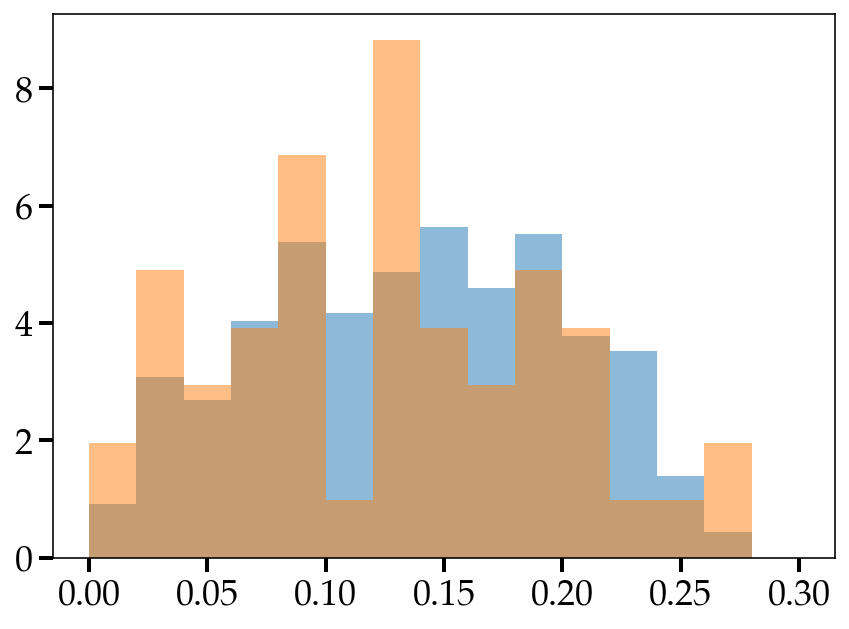

In [120]:
plt.hist(ysedr1_df.best_z, bins=np.linspace(0, 0.3, 16), alpha=0.5, density=True)
plt.hist(higest_anom_score_df.best_z, bins=np.linspace(0, 0.3, 16), alpha=0.5, density=True)

In [134]:
len(ysedr1_df)

1153

p_value: 0.8768119540475026
The distributions are the same (fail to reject the null hypothesis)


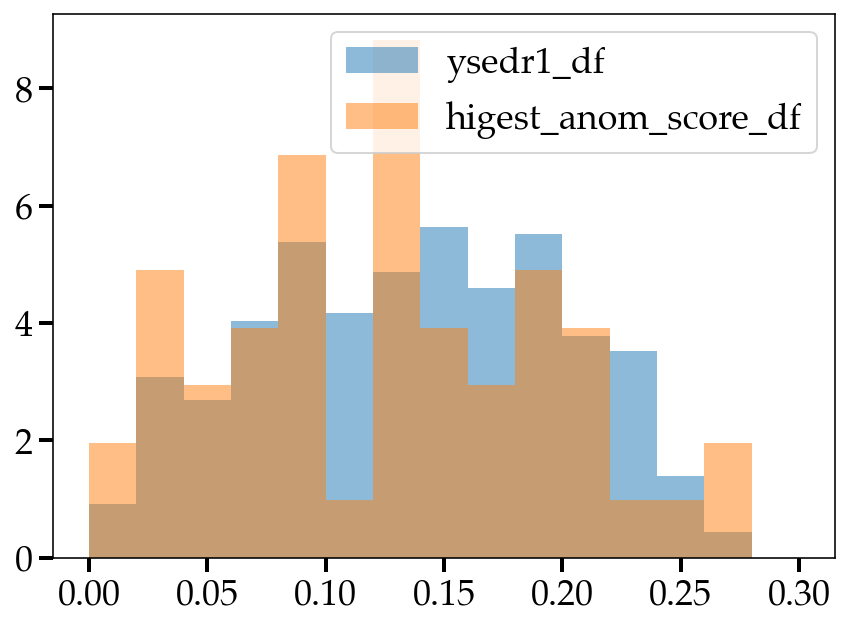

In [138]:
from scipy import stats

# Assuming ysedr1_df.best_z and higest_anom_score_df.best_z are your data arrays

# Plot histograms
plt.hist(ysedr1_df.best_z, bins=np.linspace(0, 0.3, 16), alpha=0.5, density=True, label='ysedr1_df')
plt.hist(higest_anom_score_df.best_z, bins=np.linspace(0, 0.3, 16), alpha=0.5, density=True, label='higest_anom_score_df')
plt.legend()

# Perform K-S test
import random

# Assuming ysedr1_df.best_z has 1153 objects and higest_anom_score_df.best_z has 51 objects

# Downsample the larger sample to match the size of the smaller sample
if len(ysedr1_df.best_z) > len(higest_anom_score_df.best_z):
    ysedr1_df_best_z_downsample_l = random.sample(list(ysedr1_df.best_z), len(higest_anom_score_df.best_z))

# Now both samples have the same size
# You can proceed with your K-S test or other analyses


ks_statistic, p_value = stats.ks_2samp(ysedr1_df_best_z_downsample_l, higest_anom_score_df.best_z)

# Output the test result
if p_value < 0.05:
    print(f"p_value: {p_value}")
    print("The distributions are different (reject the null hypothesis)")
else:
    print(f"p_value: {p_value}")
    print("The distributions are the same (fail to reject the null hypothesis)")

plt.show()


Good both samples are same, so anom detection is tagging objects at all z similar to full z distr, so it's not just picking up brightest or farthest objects

In [121]:
np.linspace(0, 0.3, 16)

array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
       0.22, 0.24, 0.26, 0.28, 0.3 ])

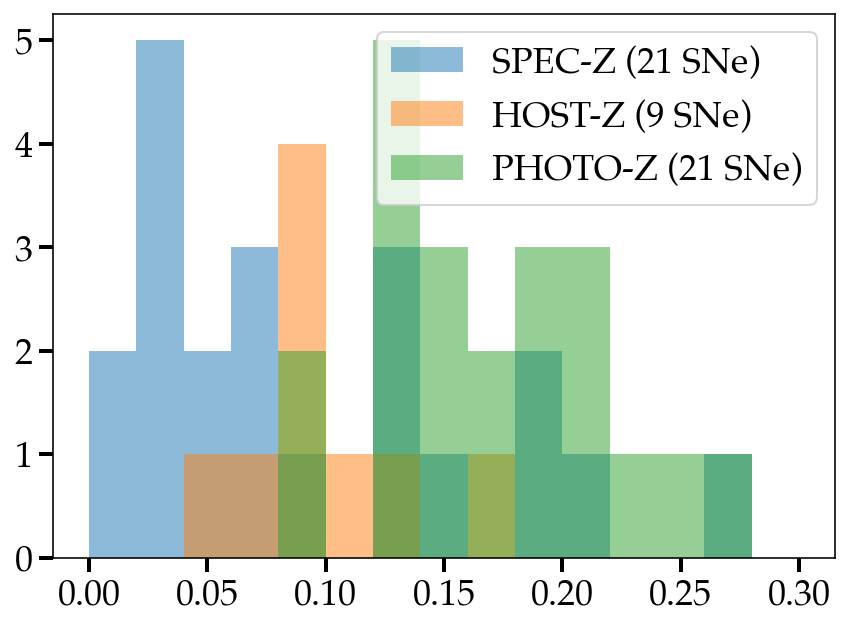

In [130]:
plt.hist(higest_anom_score_df[higest_anom_score_df.z_type == "SPEC-Z"].best_z, bins=np.linspace(0, 0.3, 16), 
         alpha=0.5, density=False,
         label=f"SPEC-Z ({len(higest_anom_score_df[higest_anom_score_df.z_type == 'SPEC-Z'])} SNe)")
plt.hist(higest_anom_score_df[higest_anom_score_df.z_type == "HOST-Z"].best_z, bins=np.linspace(0, 0.3, 16),
         alpha=0.5, density=False, 
         label=f"HOST-Z ({len(higest_anom_score_df[higest_anom_score_df.z_type == 'HOST-Z'])} SNe)")
plt.hist(higest_anom_score_df[higest_anom_score_df.z_type == "PHOTO-Z"].best_z, bins=np.linspace(0, 0.3, 16), 
         alpha=0.5, density=False, 
         label=f"PHOTO-Z ({len(higest_anom_score_df[higest_anom_score_df.z_type == 'PHOTO-Z'])} SNe)")
plt.legend()

2020xsy 90.99704306043245 SLSN-II Other Other
Anomalous during timeseries!
max_anom_score 98.0
MJD Cutoff anom_idx 59230.61
https://ziggy.ucolick.org/yse/transient_detail/2020xsy/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


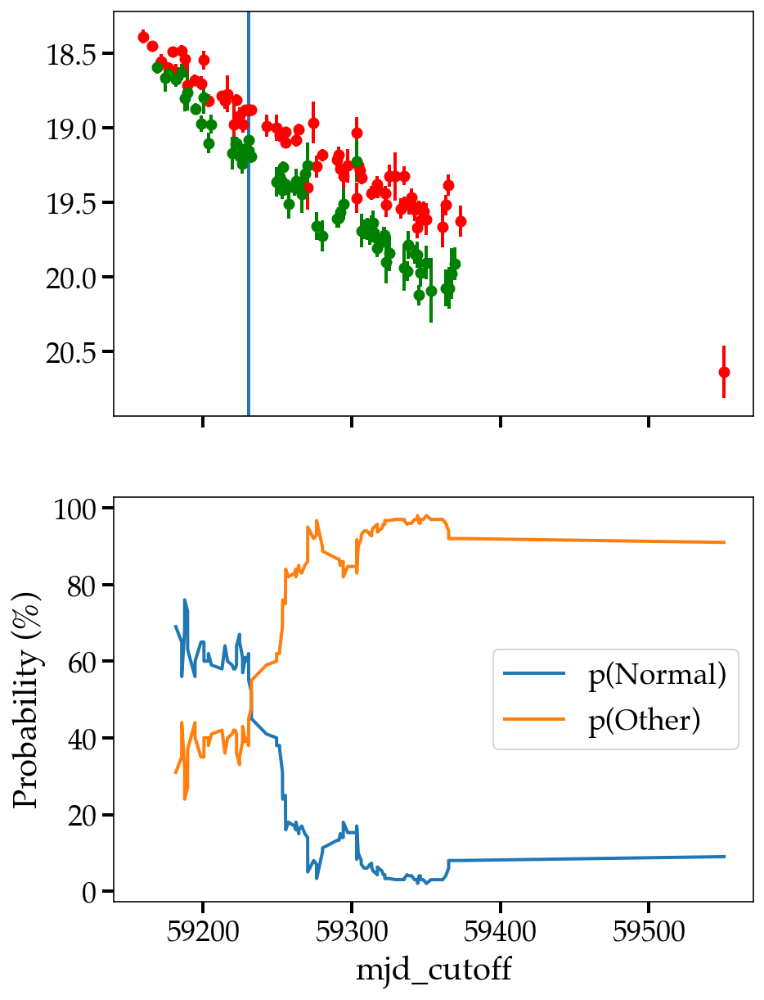

%%%%%%%%%%%%
2020acyu 88.96441883531054 NA NA Other
Anomalous during timeseries!
max_anom_score 90.0
MJD Cutoff anom_idx 59218.53
https://ziggy.ucolick.org/yse/transient_detail/2020acyu/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


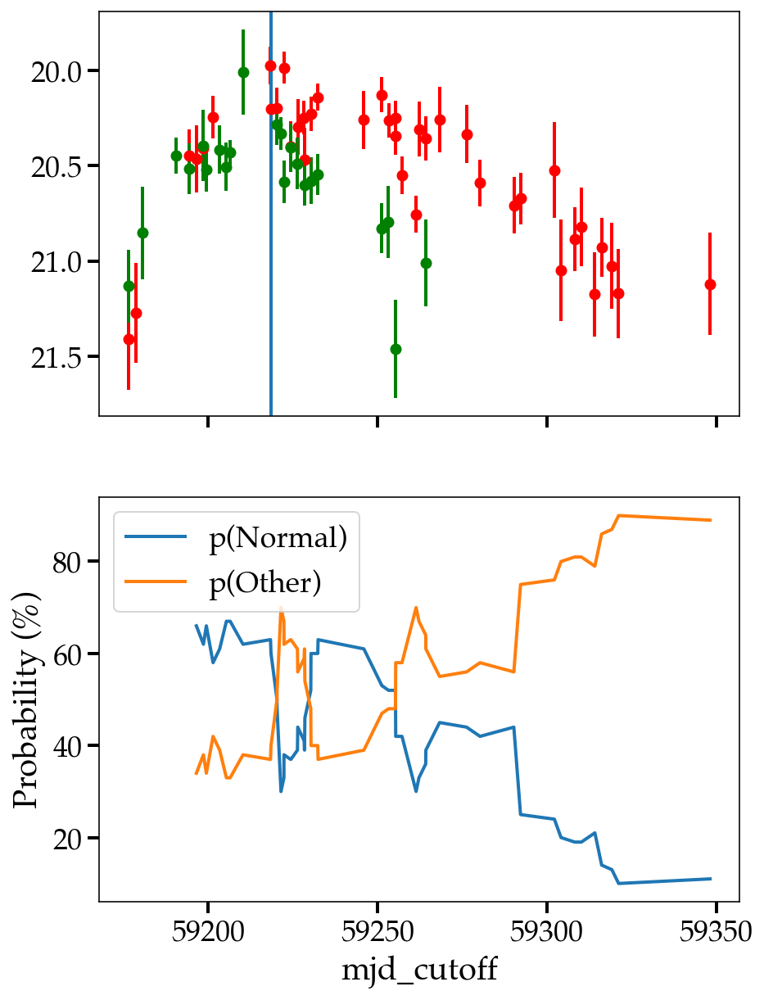

%%%%%%%%%%%%
2021bmv 80.98102869808423 SNIIn Other Other
Anomalous during timeseries!
max_anom_score 85.0
MJD Cutoff anom_idx 59263.132
https://ziggy.ucolick.org/yse/transient_detail/2021bmv/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


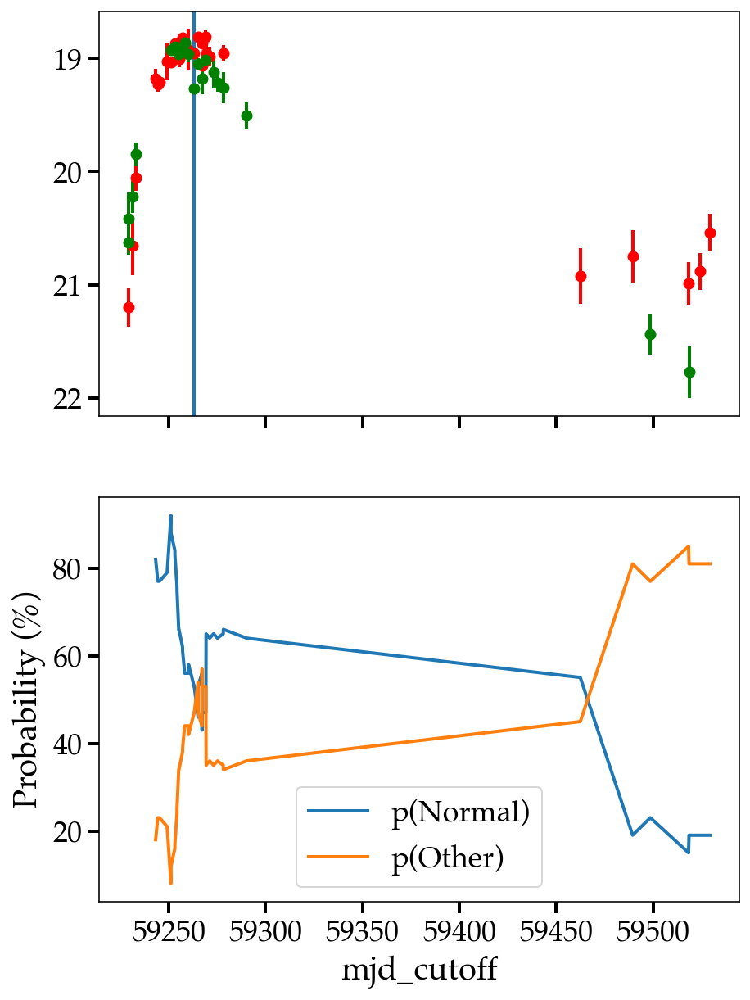

%%%%%%%%%%%%
2021nxq 79.98613418394845 SLSN-I Other Other
Anomalous during timeseries!
max_anom_score 89.0
MJD Cutoff anom_idx 59408.236
https://ziggy.ucolick.org/yse/transient_detail/2021nxq/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


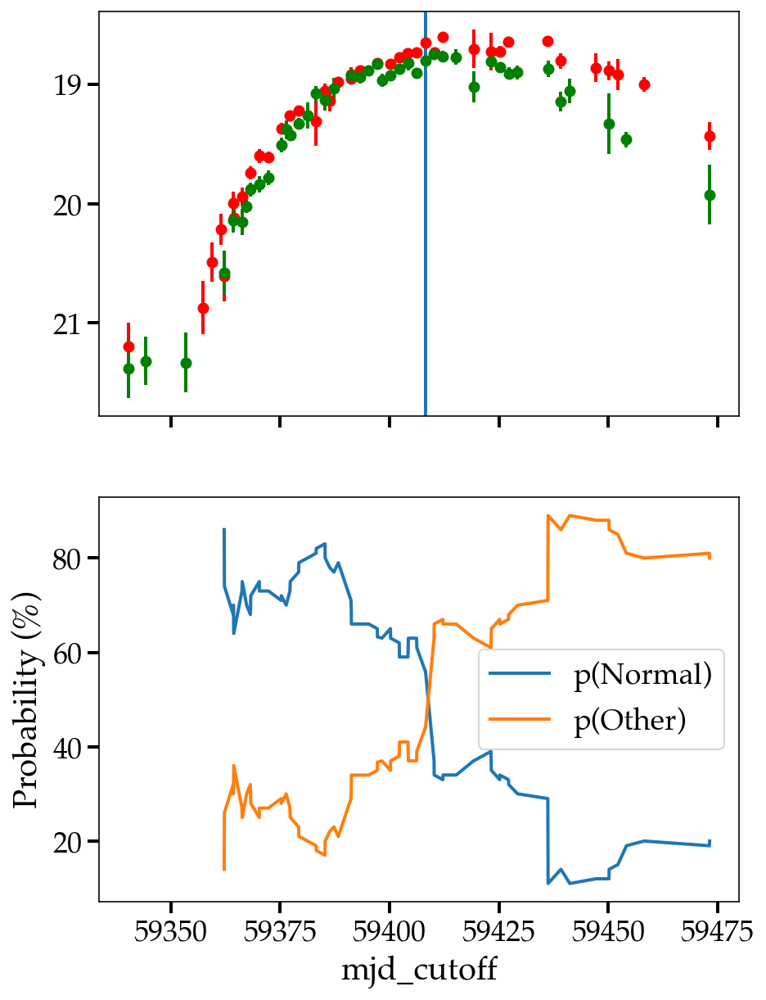

%%%%%%%%%%%%
2020qmj 79.0 SNIIn Other Other
Anomalous during timeseries!
max_anom_score 82.0
MJD Cutoff anom_idx 59121.33
https://ziggy.ucolick.org/yse/transient_detail/2020qmj/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


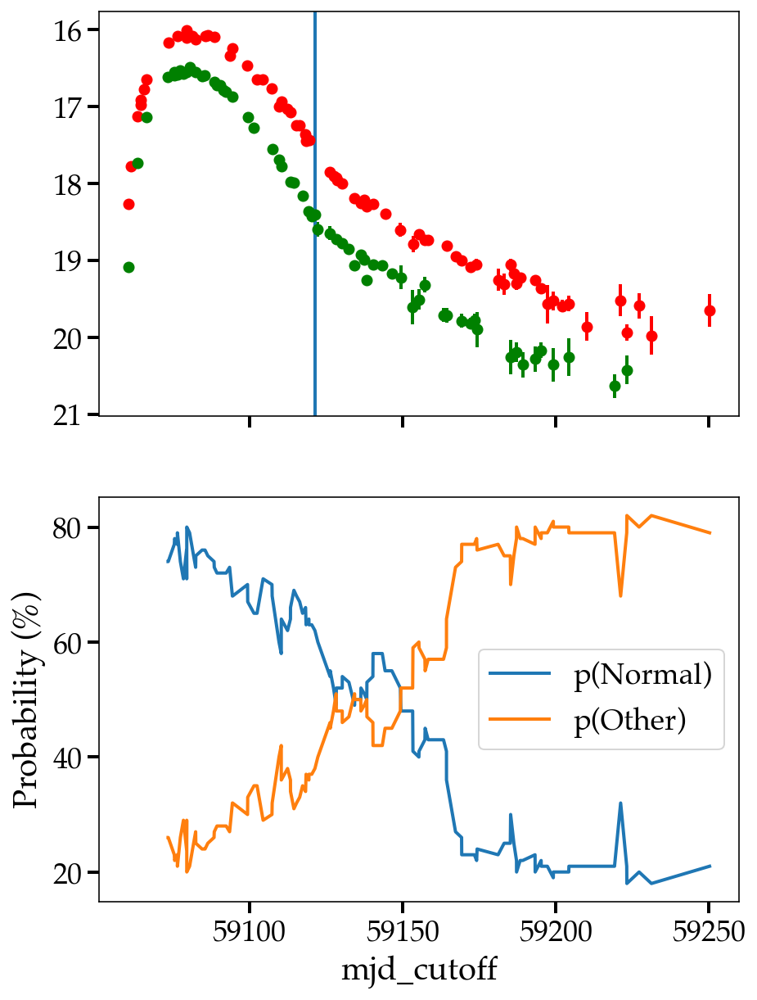

%%%%%%%%%%%%
2021hrj 77.98460752495343 SNIb Other Other
Anomalous during timeseries!
max_anom_score 88.0
MJD Cutoff anom_idx 59324.213
https://ziggy.ucolick.org/yse/transient_detail/2021hrj/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


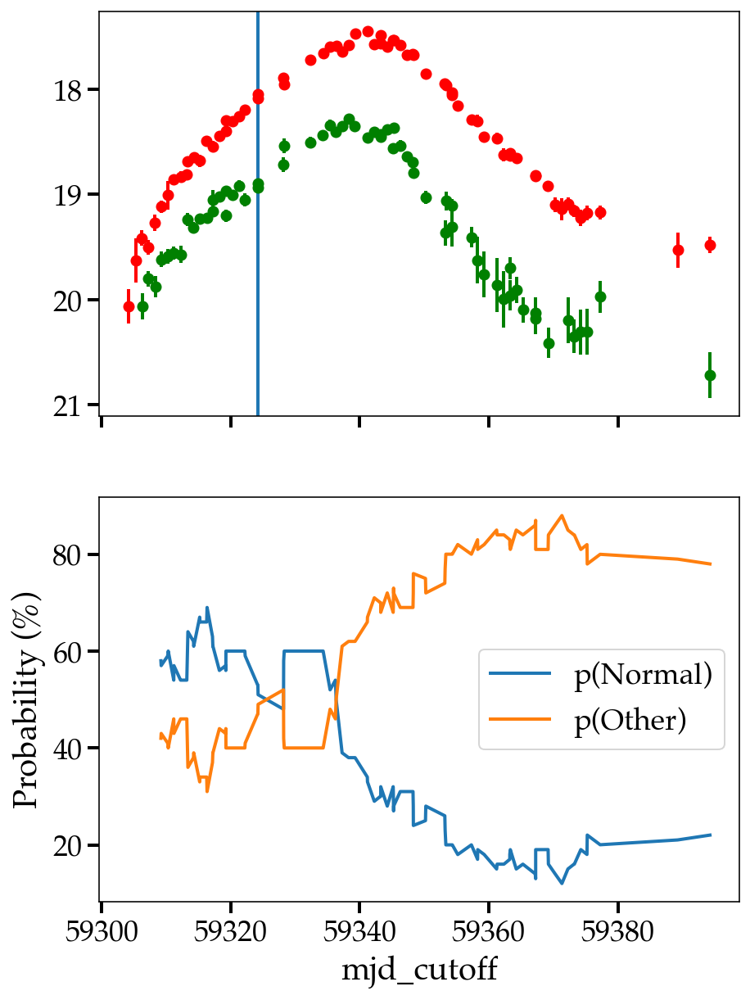

%%%%%%%%%%%%
2021too 77.93139050530584 SNIc-BL Other Other
Anomalous during timeseries!
max_anom_score 81.9
MJD Cutoff anom_idx 59453.278
https://ziggy.ucolick.org/yse/transient_detail/2021too/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


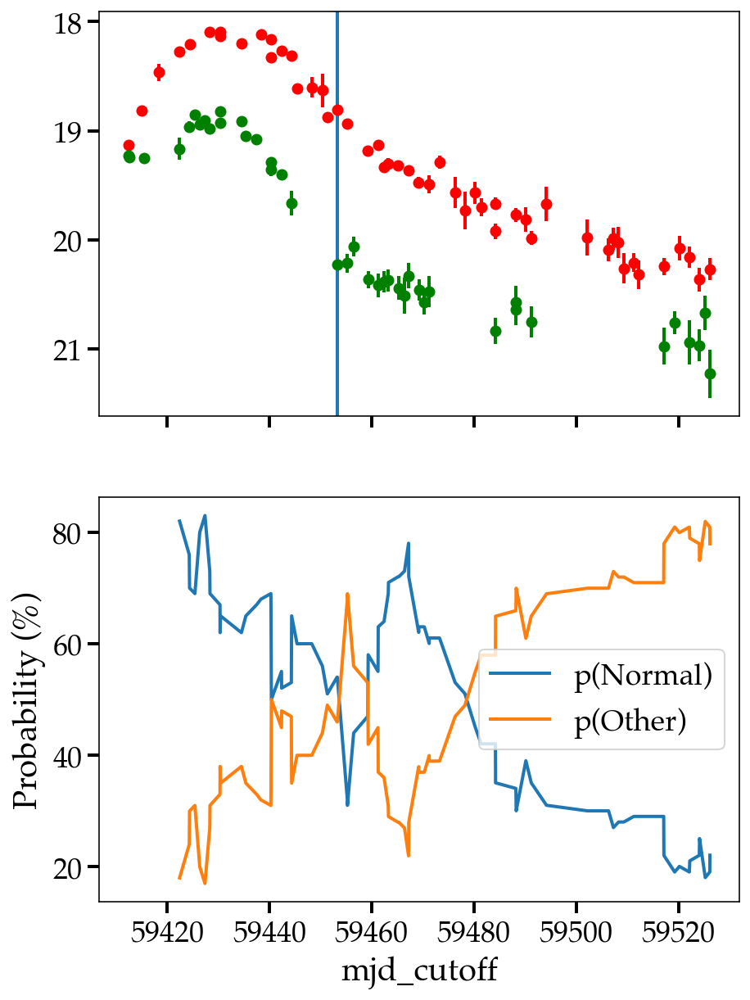

%%%%%%%%%%%%
2021rmq 72.99675160386735 NA NA Other
Anomalous during timeseries!
max_anom_score 73.0
MJD Cutoff anom_idx 59375.216
https://ziggy.ucolick.org/yse/transient_detail/2021rmq/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


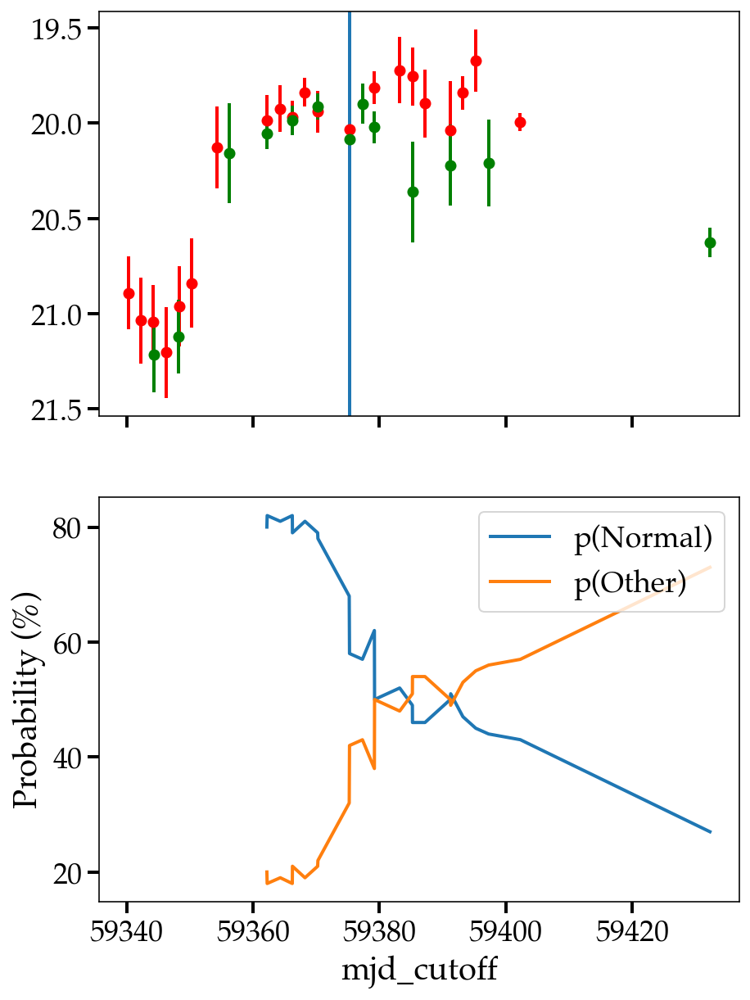

%%%%%%%%%%%%
2020jvi 71.97926734409106 NA NA Other
Anomalous during timeseries!
max_anom_score 84.0
MJD Cutoff anom_idx 59040.232
https://ziggy.ucolick.org/yse/transient_detail/2020jvi/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


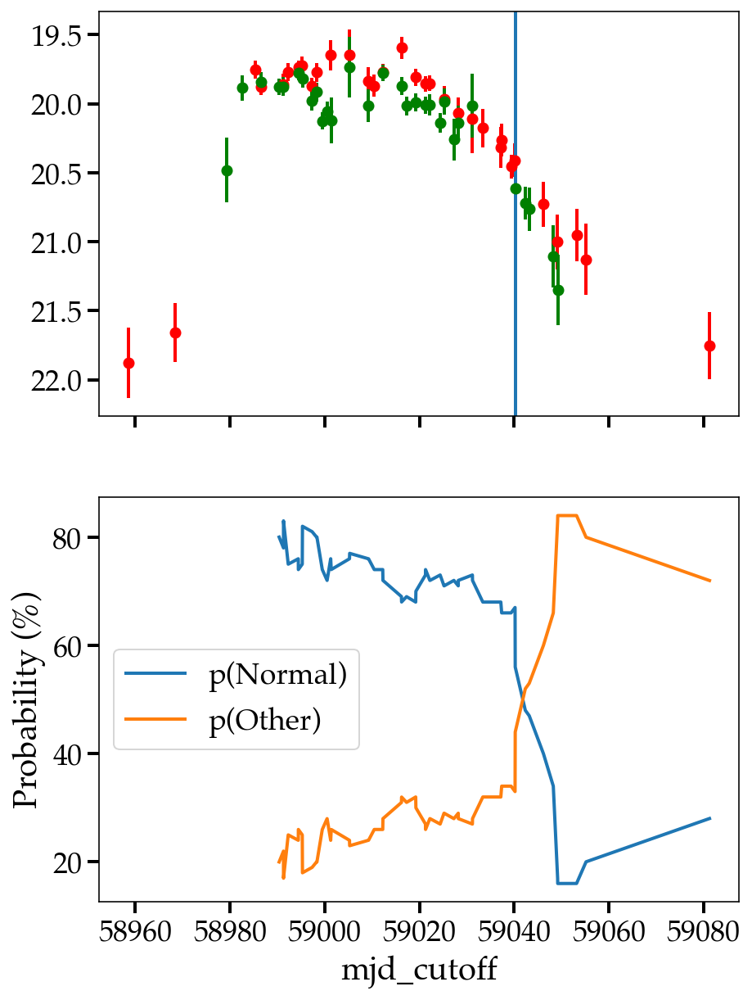

%%%%%%%%%%%%
2020kmj 70.9907478168183 NA NA Other
Anomalous during timeseries!
max_anom_score 76.0
MJD Cutoff anom_idx 58991.227
https://ziggy.ucolick.org/yse/transient_detail/2020kmj/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


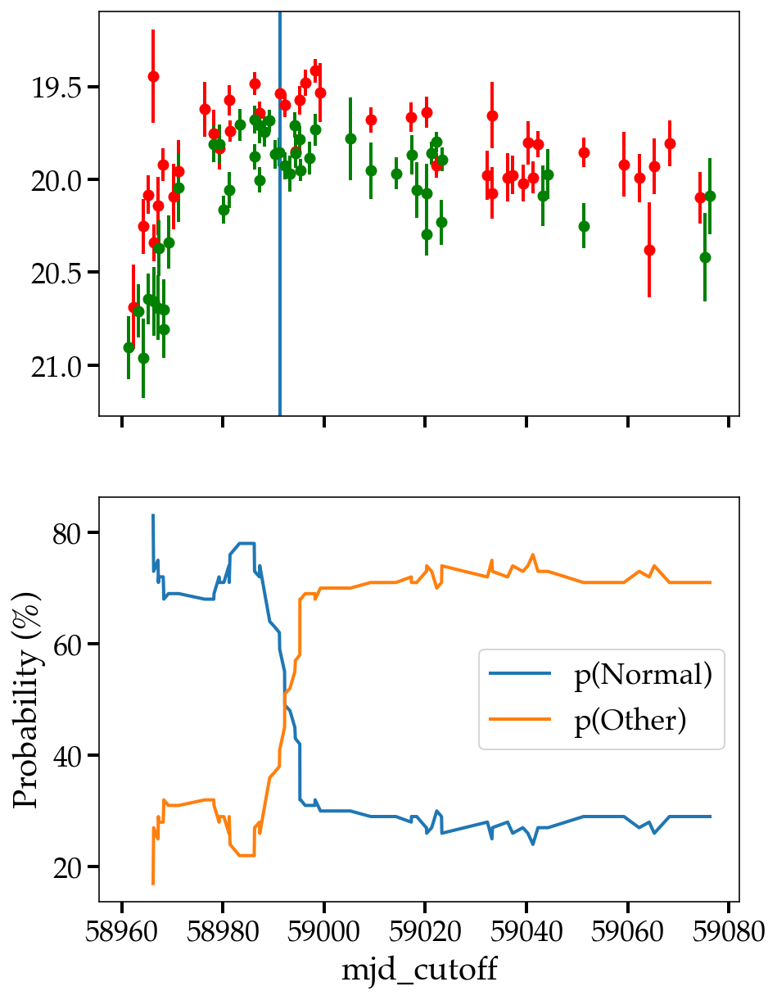

%%%%%%%%%%%%
2021dpa 69.99969278033794 NA NA Other
Anomalous during timeseries!
max_anom_score 73.0
MJD Cutoff anom_idx 59319.199
https://ziggy.ucolick.org/yse/transient_detail/2021dpa/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


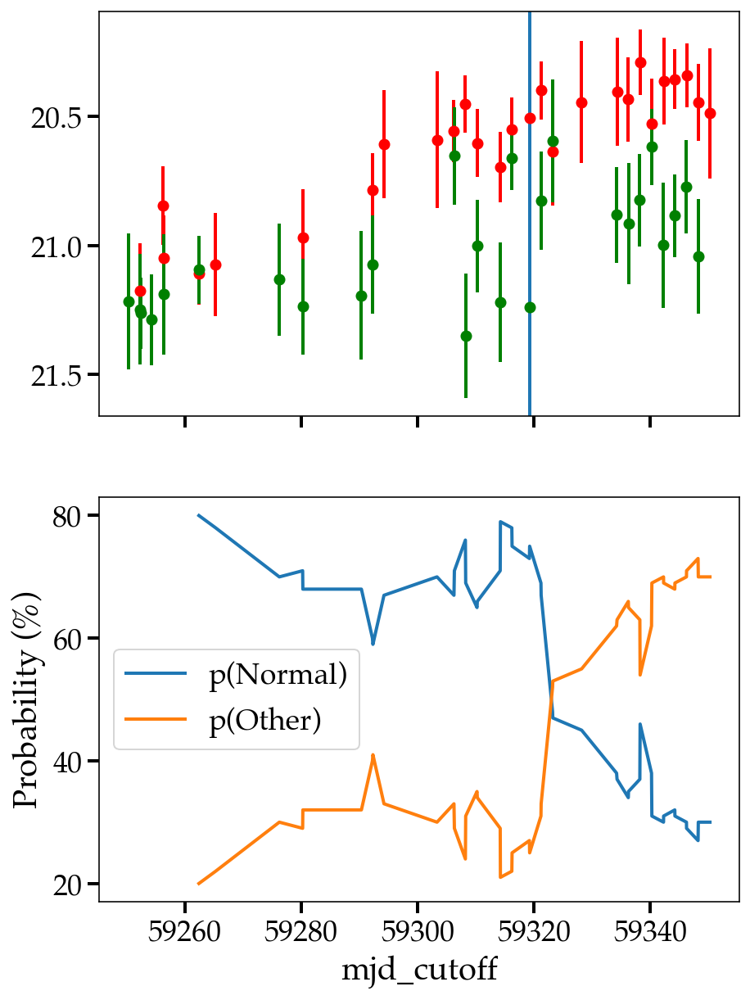

%%%%%%%%%%%%
2020kvl 69.98558803430345 SNIa-norm Normal Other
Anomalous during timeseries!
max_anom_score 72.0
MJD Cutoff anom_idx 59032.27
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


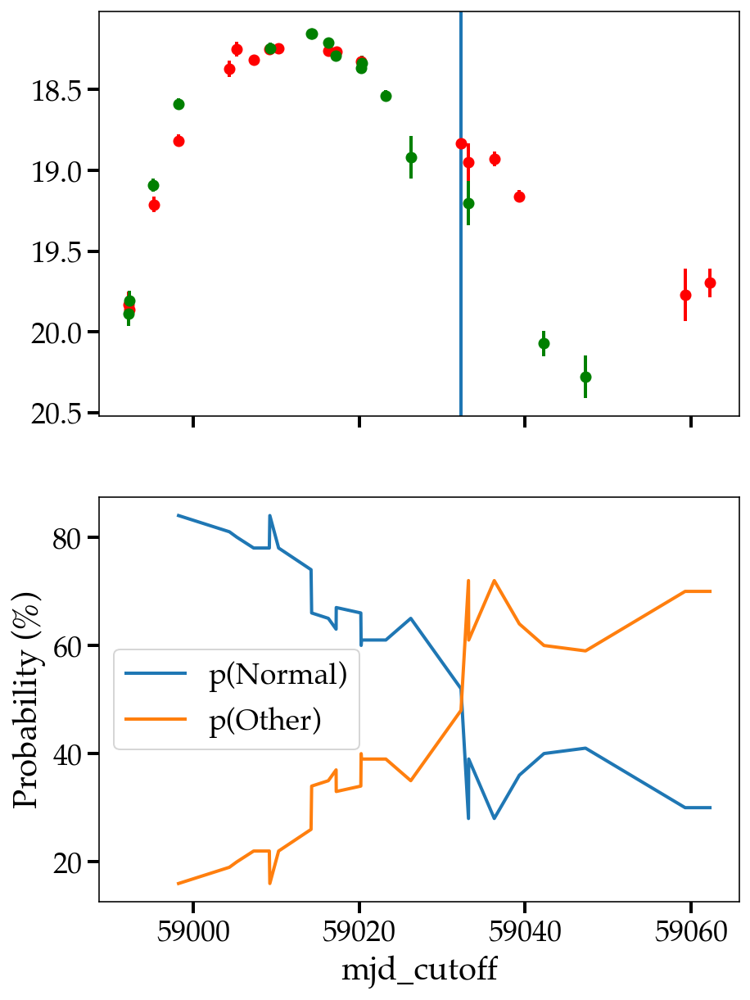

%%%%%%%%%%%%
2021aadc 66.99704306043245 SLSN-II Other Other
Anomalous during timeseries!
max_anom_score 85.0
MJD Cutoff anom_idx 59519.28
https://ziggy.ucolick.org/yse/transient_detail/2021aadc/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


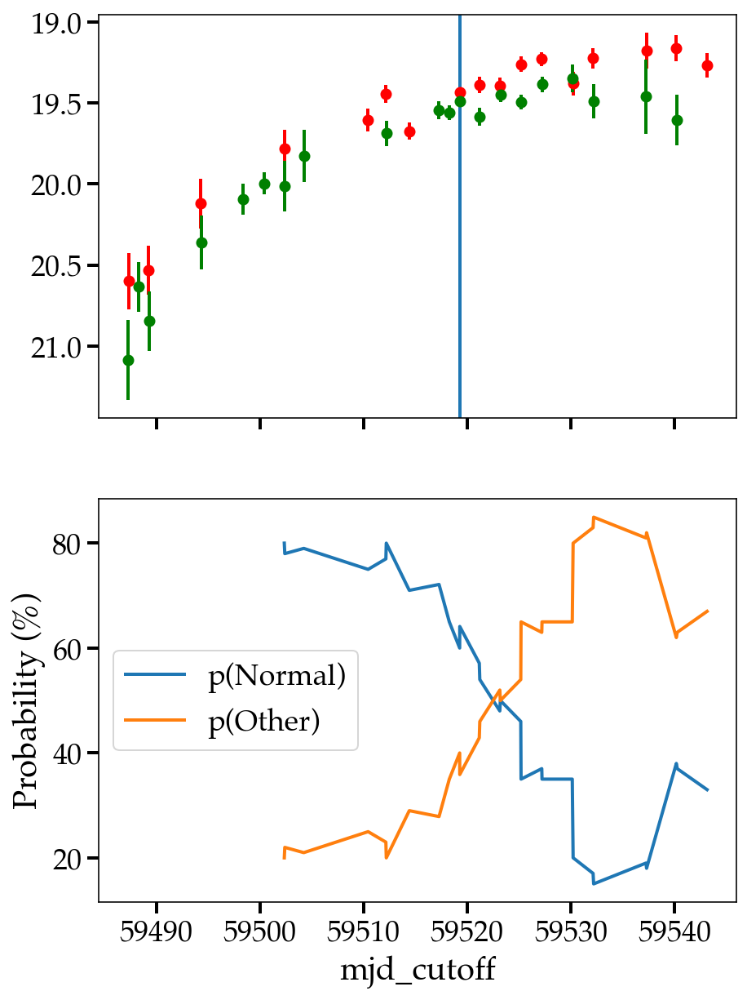

%%%%%%%%%%%%
2020kre 65.98665910253592 SNIa-CSM Other Other
Anomalous during timeseries!
max_anom_score 82.0
MJD Cutoff anom_idx 59009.17
https://ziggy.ucolick.org/yse/transient_detail/2020kre/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


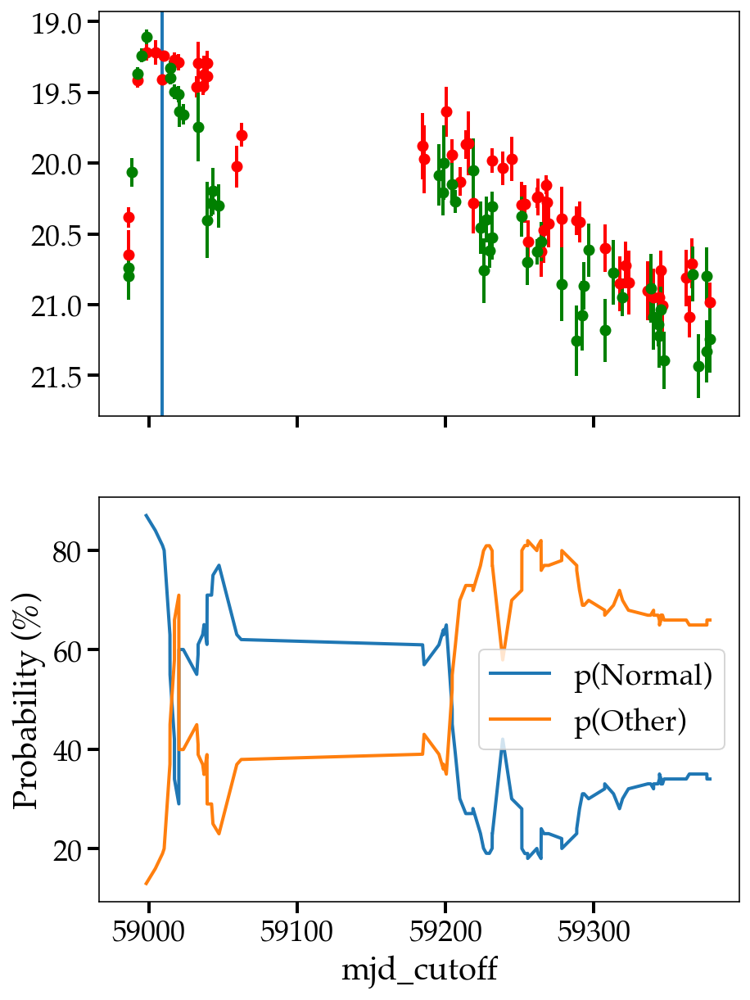

%%%%%%%%%%%%
2021vwx 65.97943661013434 SNIa-norm Normal Other
Anomalous during timeseries!
max_anom_score 69.8
MJD Cutoff anom_idx 59518.52
https://ziggy.ucolick.org/yse/transient_detail/2021vwx/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


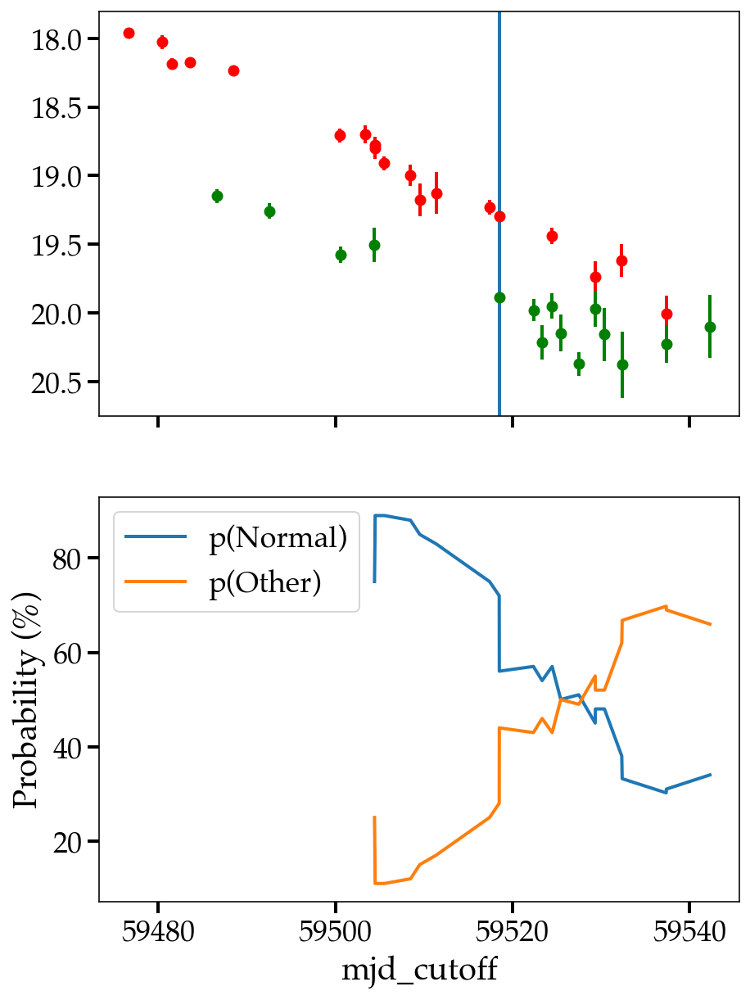

%%%%%%%%%%%%
2020wwt 64.98192590289628 NA NA Other
Anomalous during timeseries!
max_anom_score 72.0
MJD Cutoff anom_idx 59131.317
https://ziggy.ucolick.org/yse/transient_detail/2020wwt/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


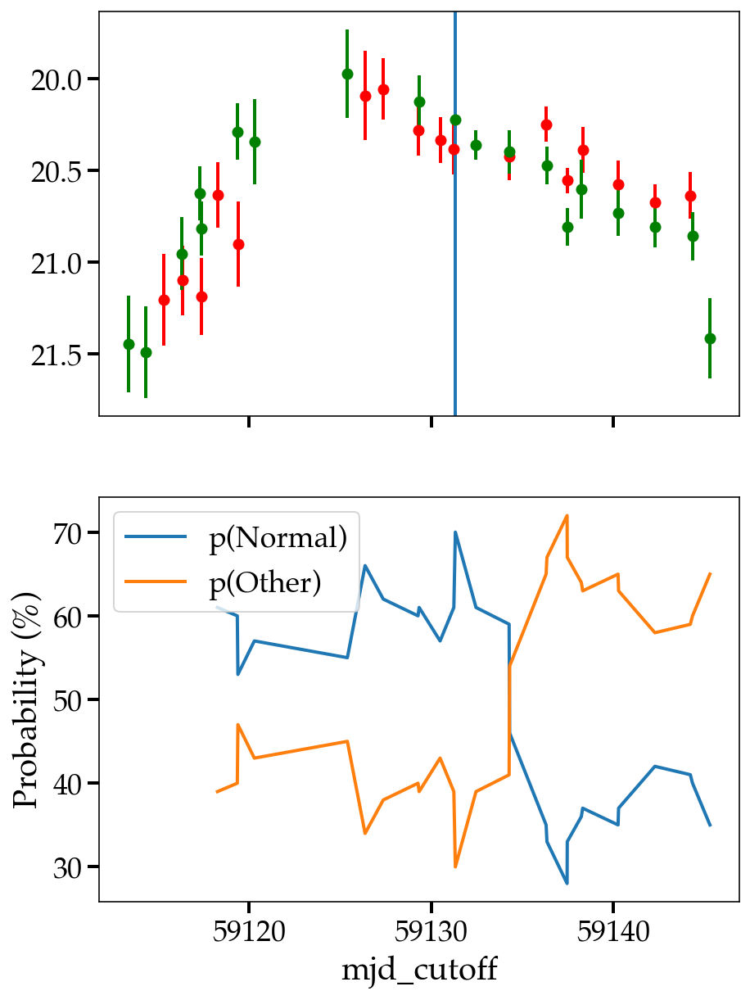

%%%%%%%%%%%%
2020kps 64.0 NA NA Other
Prediction doesn't exceed anom_threshold of 50% for 2020kps.
max_anom_score 64.0
https://ziggy.ucolick.org/yse/transient_detail/2020kps/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


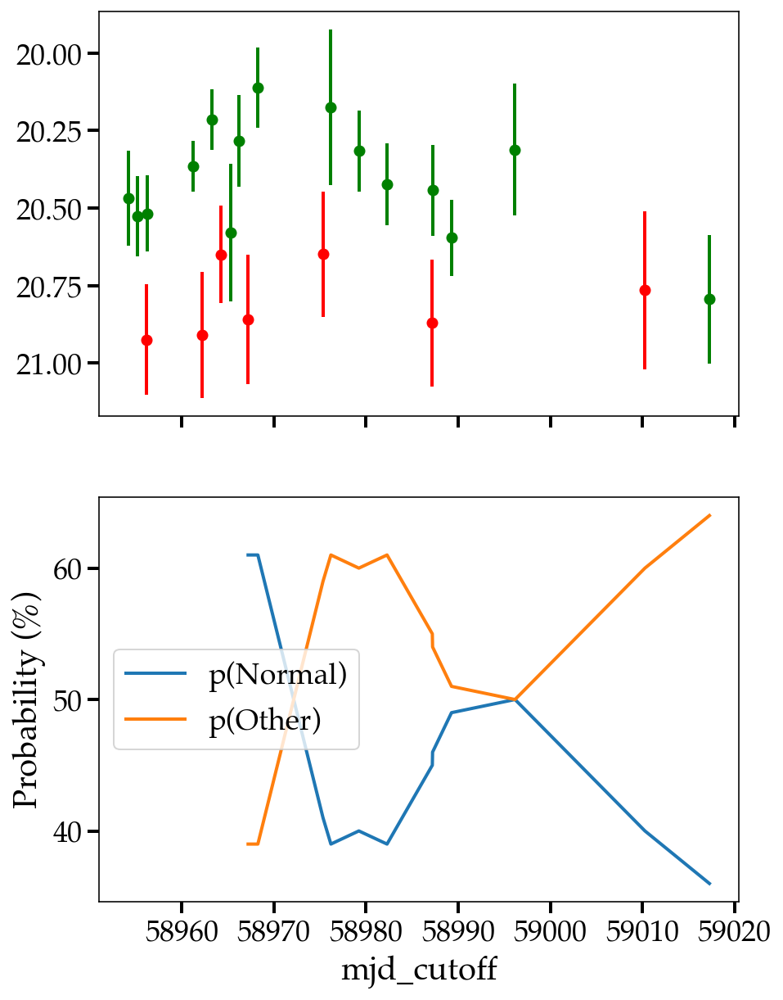

%%%%%%%%%%%%
2021ofr 62.96002933285412 NA NA Other
Anomalous during timeseries!
max_anom_score 76.0
MJD Cutoff anom_idx 59383.196
https://ziggy.ucolick.org/yse/transient_detail/2021ofr/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


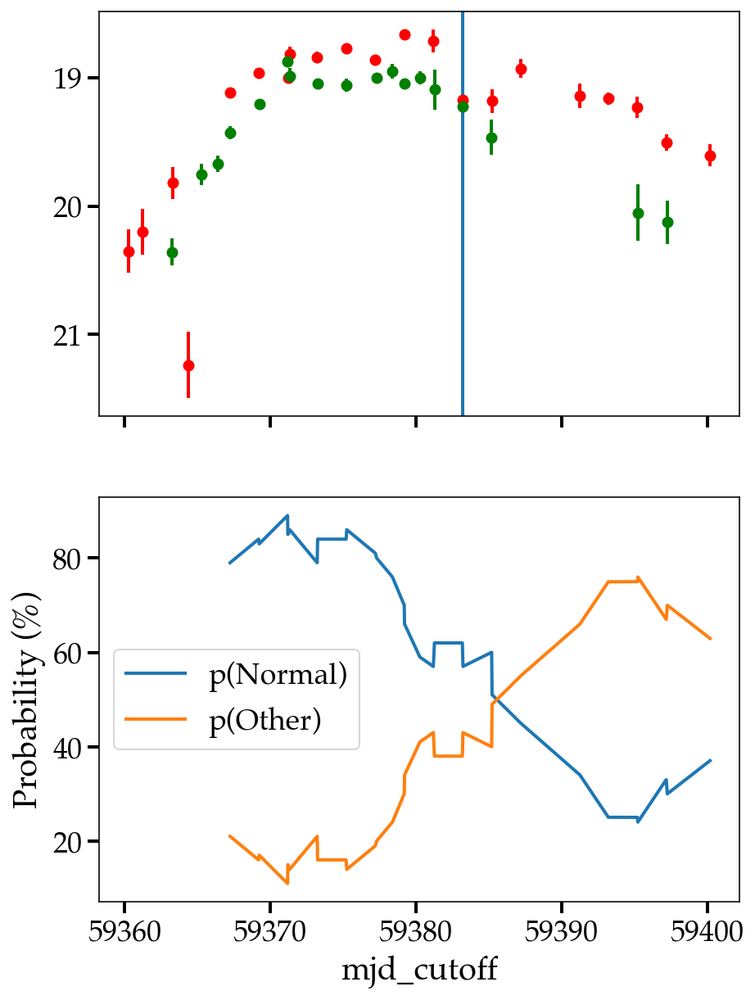

%%%%%%%%%%%%
2020qkx 60.998415213946124 SNIa-norm Normal Other
Anomalous during timeseries!
max_anom_score 89.0
MJD Cutoff anom_idx 59069.381
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


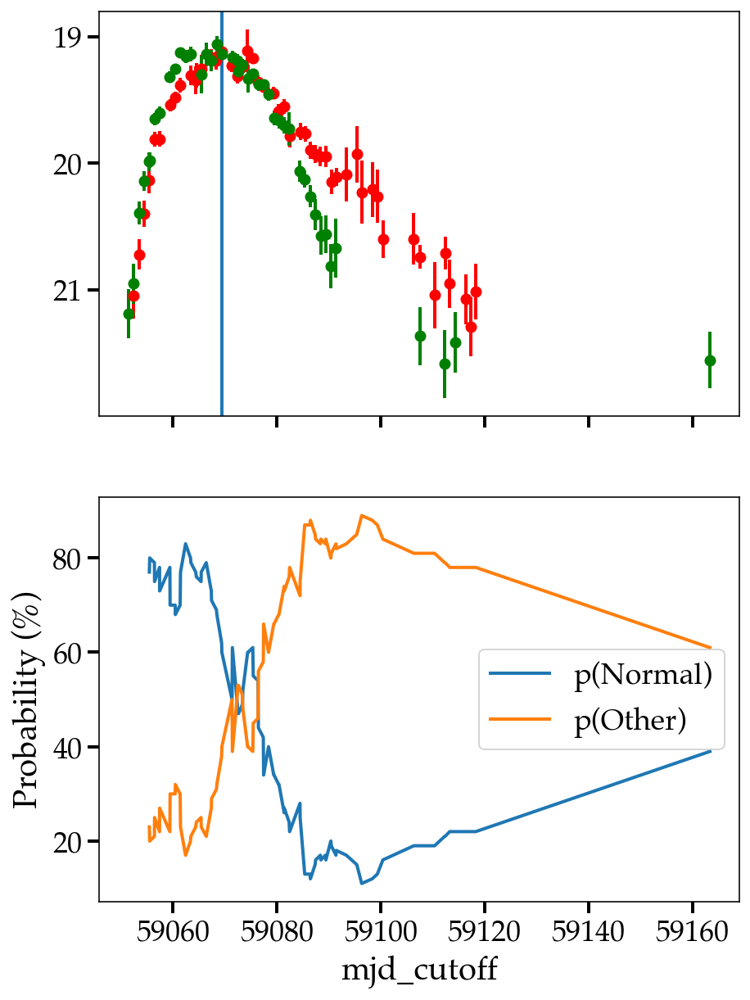

%%%%%%%%%%%%
2021mms 60.0 NA NA Other
Anomalous during timeseries!
max_anom_score 65.0
MJD Cutoff anom_idx 59374.32
https://ziggy.ucolick.org/yse/transient_detail/2021mms/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


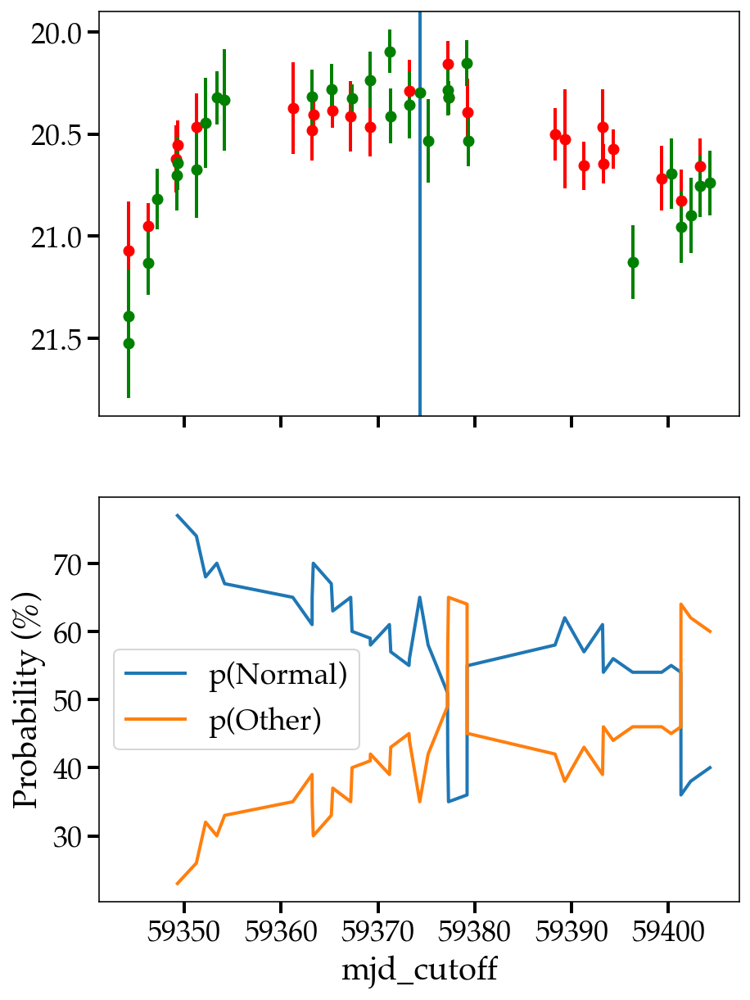

%%%%%%%%%%%%
2021gno 58.998754669987555 SNIb-pec Other Other
Anomalous during timeseries!
max_anom_score 78.0
MJD Cutoff anom_idx 59321.253
https://ziggy.ucolick.org/yse/transient_detail/2021gno/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


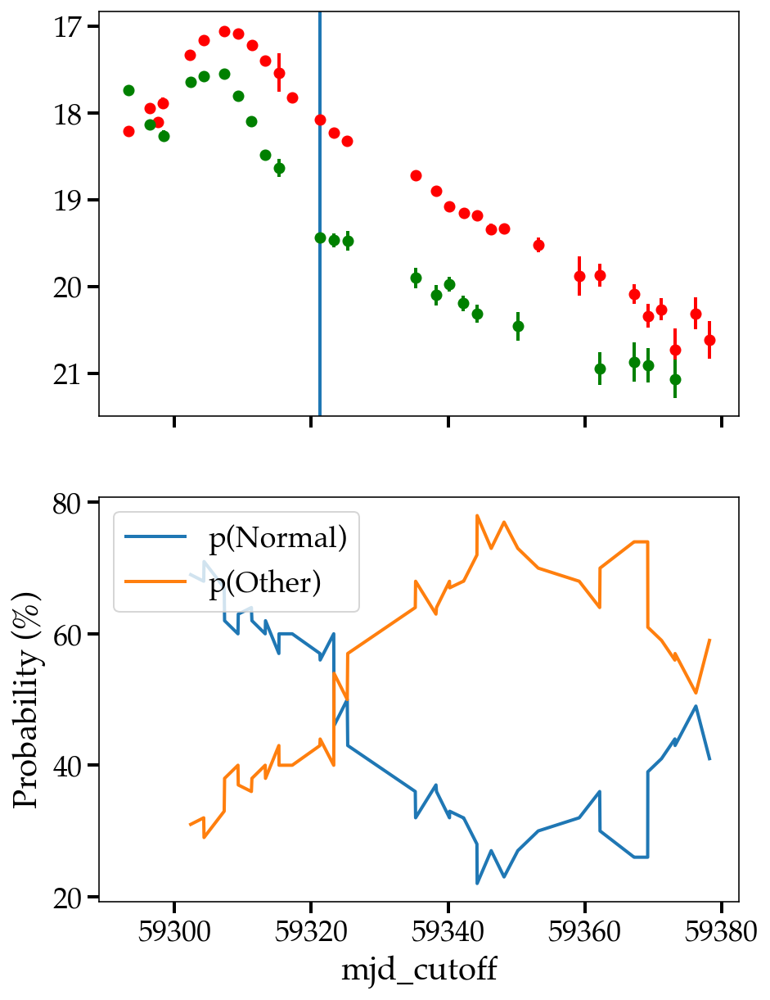

%%%%%%%%%%%%
2020icw 57.96506900626866 NA NA Other
Anomalous during timeseries!
max_anom_score 58.0
MJD Cutoff anom_idx 58987.215
https://ziggy.ucolick.org/yse/transient_detail/2020icw/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


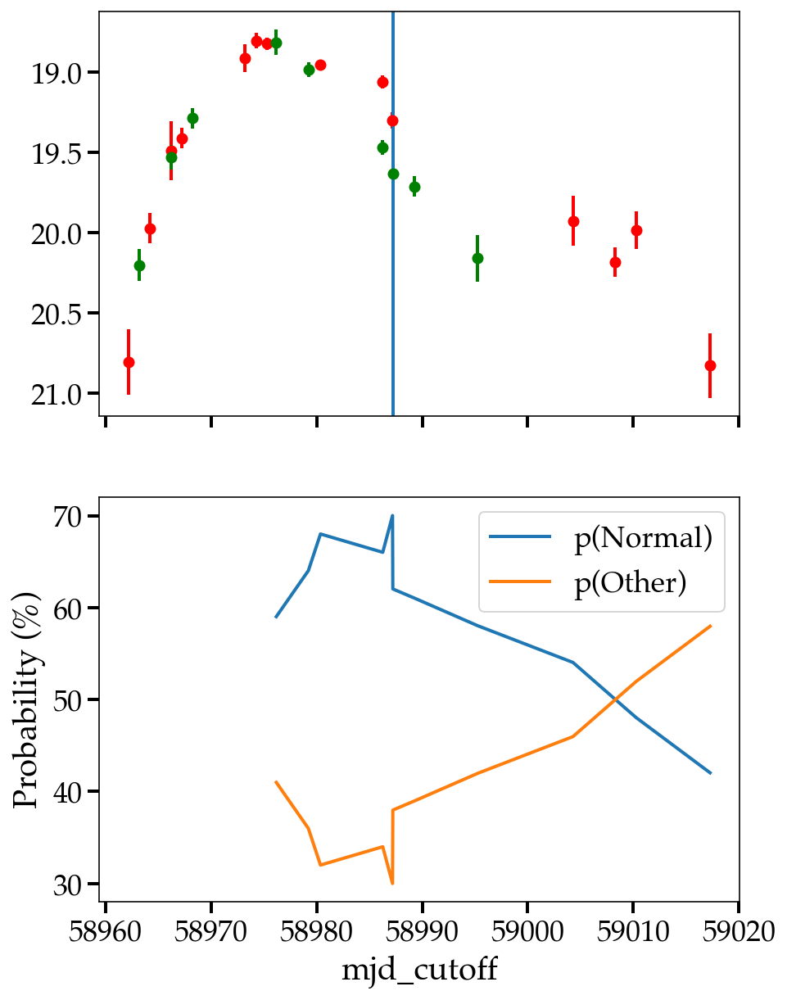

%%%%%%%%%%%%
2021ygj 56.99651027530051 NA NA Other
Anomalous during timeseries!
max_anom_score 58.0
MJD Cutoff anom_idx 59523.256
https://ziggy.ucolick.org/yse/transient_detail/2021ygj/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


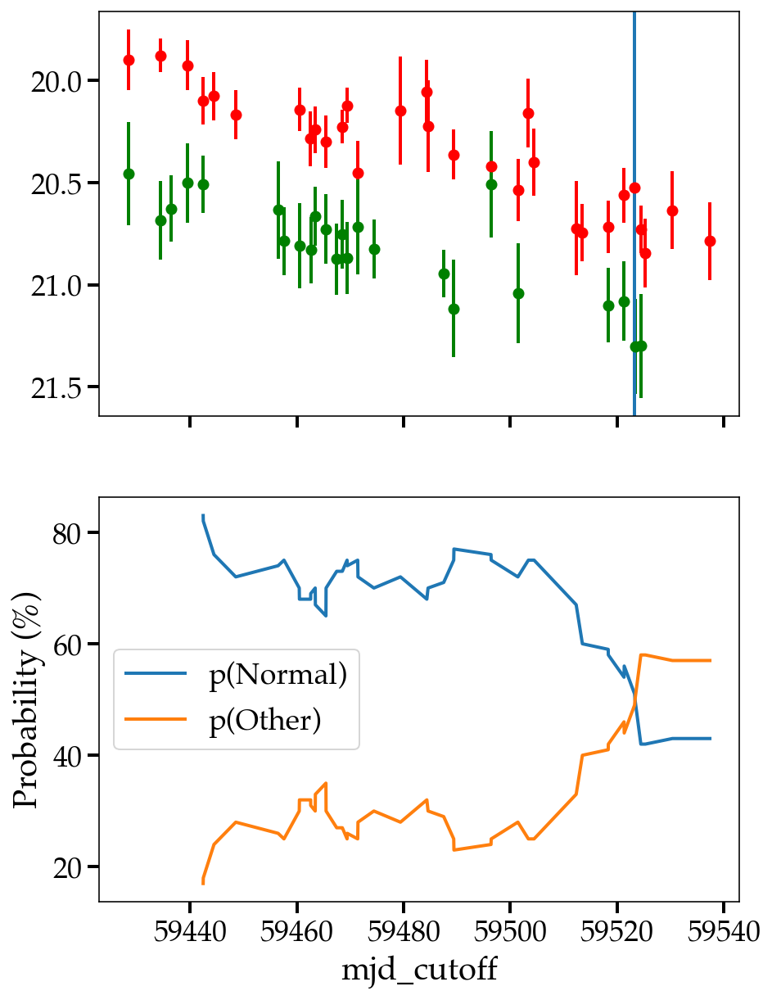

%%%%%%%%%%%%
2020imb 56.99037340721831 NA NA Other
Anomalous during timeseries!
max_anom_score 68.0
MJD Cutoff anom_idx 58997.175
https://ziggy.ucolick.org/yse/transient_detail/2020imb/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


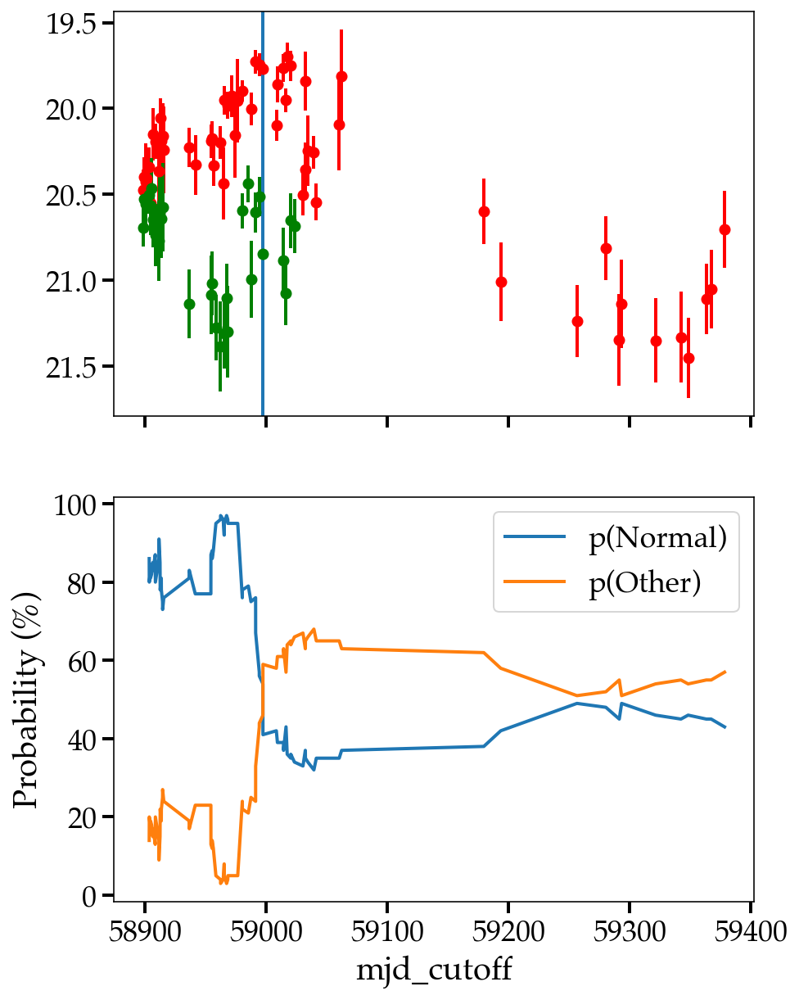

%%%%%%%%%%%%
2019uit 56.98605865526194 SNIIn Other Other
Anomalous during timeseries!
max_anom_score 60.0
MJD Cutoff anom_idx 58992.35
https://ziggy.ucolick.org/yse/transient_detail/2019uit/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


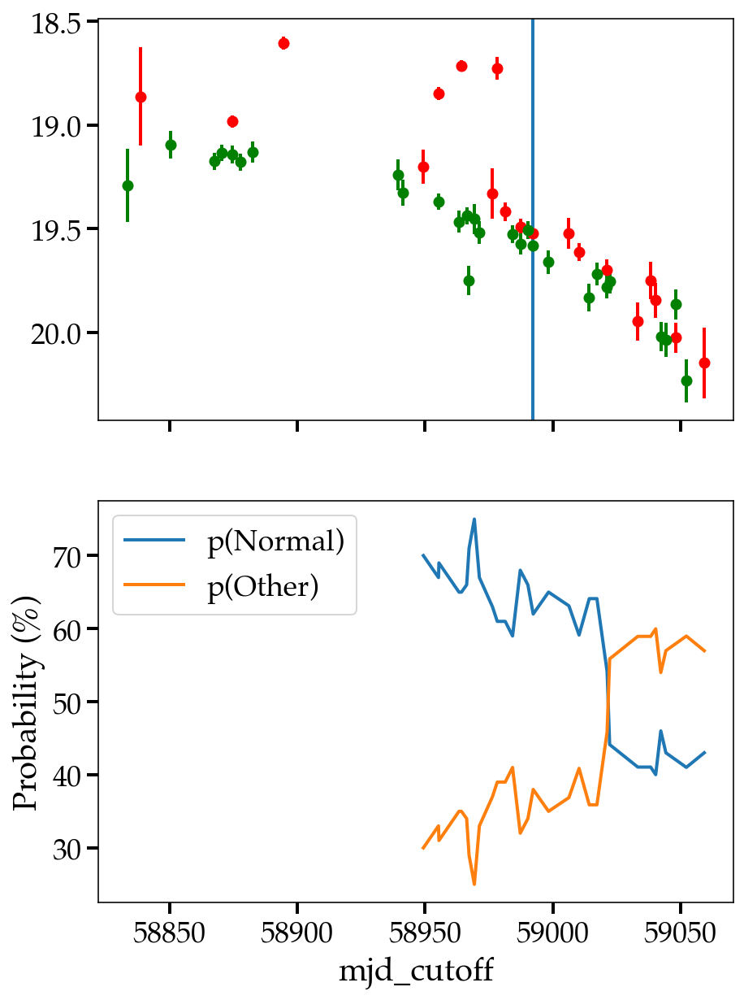

%%%%%%%%%%%%
2020lrr 55.97480912617947 SNII Normal Other
Anomalous during timeseries!
max_anom_score 56.0
MJD Cutoff anom_idx 59074.179
https://ziggy.ucolick.org/yse/transient_detail/2020lrr/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


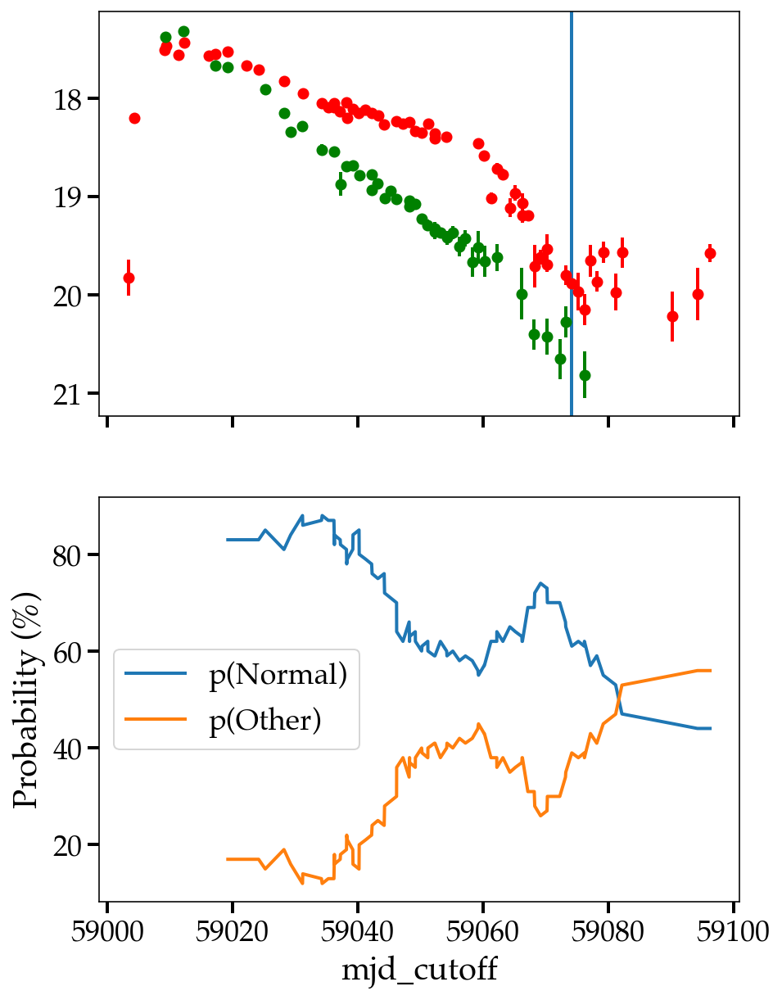

%%%%%%%%%%%%
2021sjw 55.00000000000001 NA NA Other
Anomalous during timeseries!
max_anom_score 55.0
MJD Cutoff anom_idx 59349.322
https://ziggy.ucolick.org/yse/transient_detail/2021sjw/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


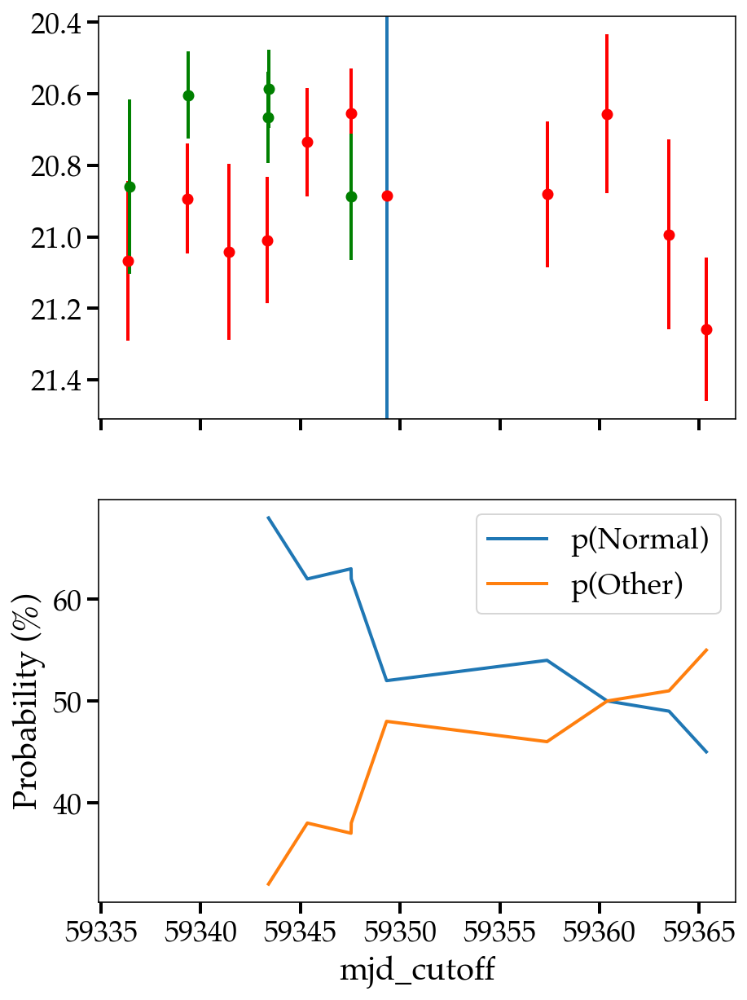

%%%%%%%%%%%%
2020tjd 54.999453850354996 SNIIb Other Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.2s finished


Anomalous during timeseries!
max_anom_score 61.0
MJD Cutoff anom_idx 59219.273
https://ziggy.ucolick.org/yse/transient_detail/2020tjd/


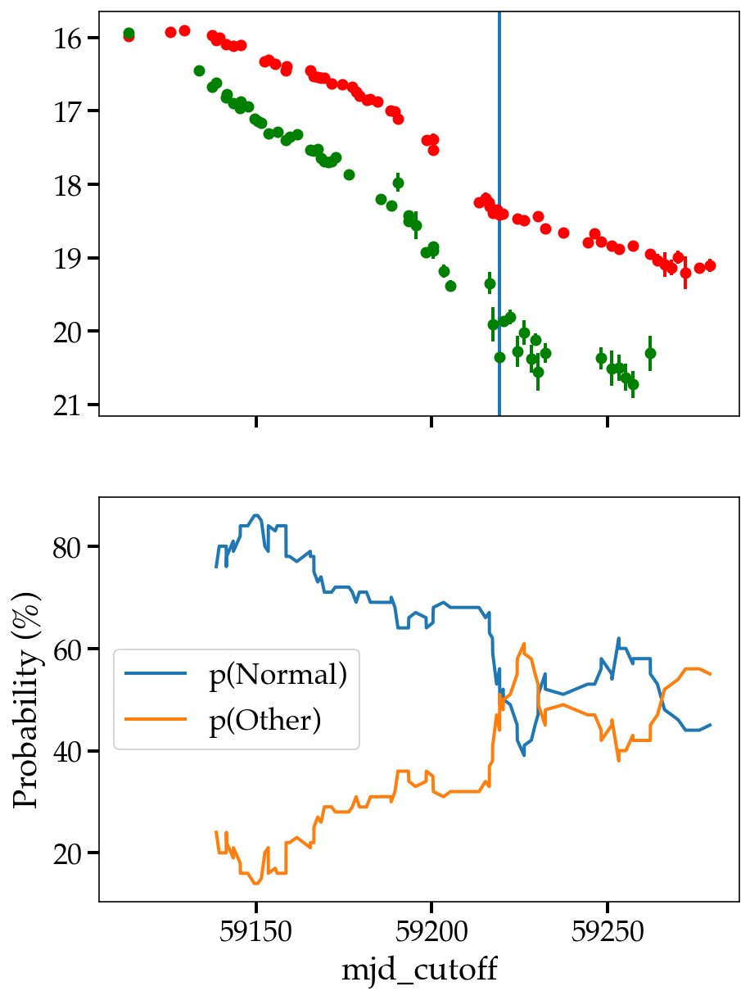

%%%%%%%%%%%%
2020pss 54.9965102753005 NA NA Other
Prediction doesn't exceed anom_threshold of 50% for 2020pss.
max_anom_score 55.0
https://ziggy.ucolick.org/yse/transient_detail/2020pss/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


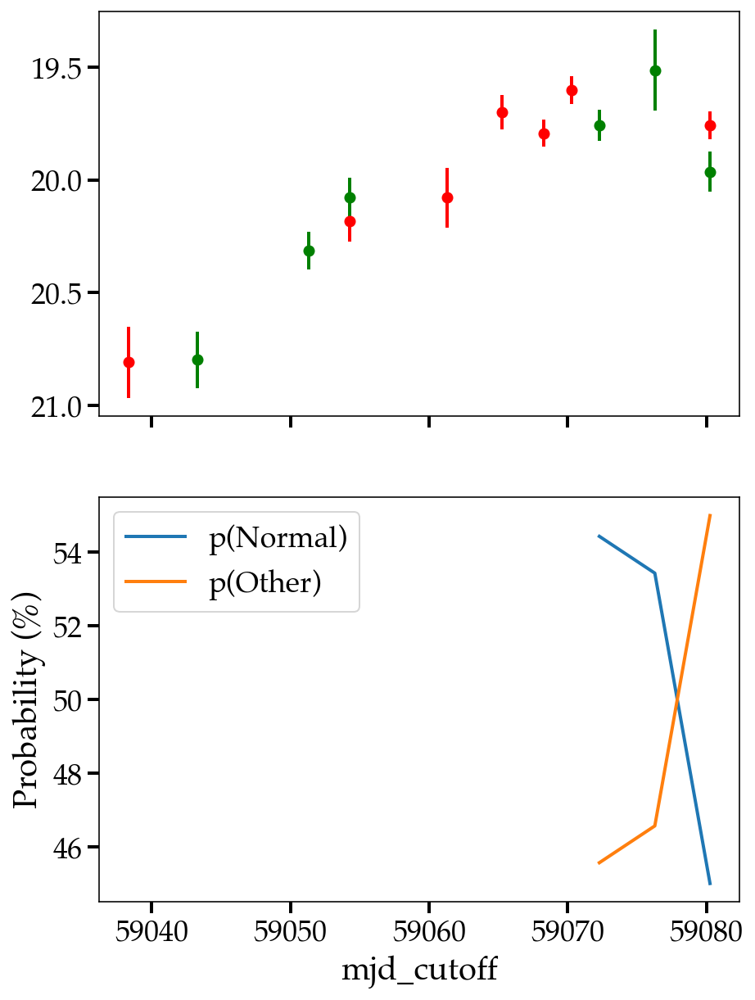

%%%%%%%%%%%%
2021xjh 54.9965102753005 SNIa-91T-like Normal Other
Anomalous during timeseries!
max_anom_score 64.0
MJD Cutoff anom_idx 59473.27
https://ziggy.ucolick.org/yse/transient_detail/2021xjh/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


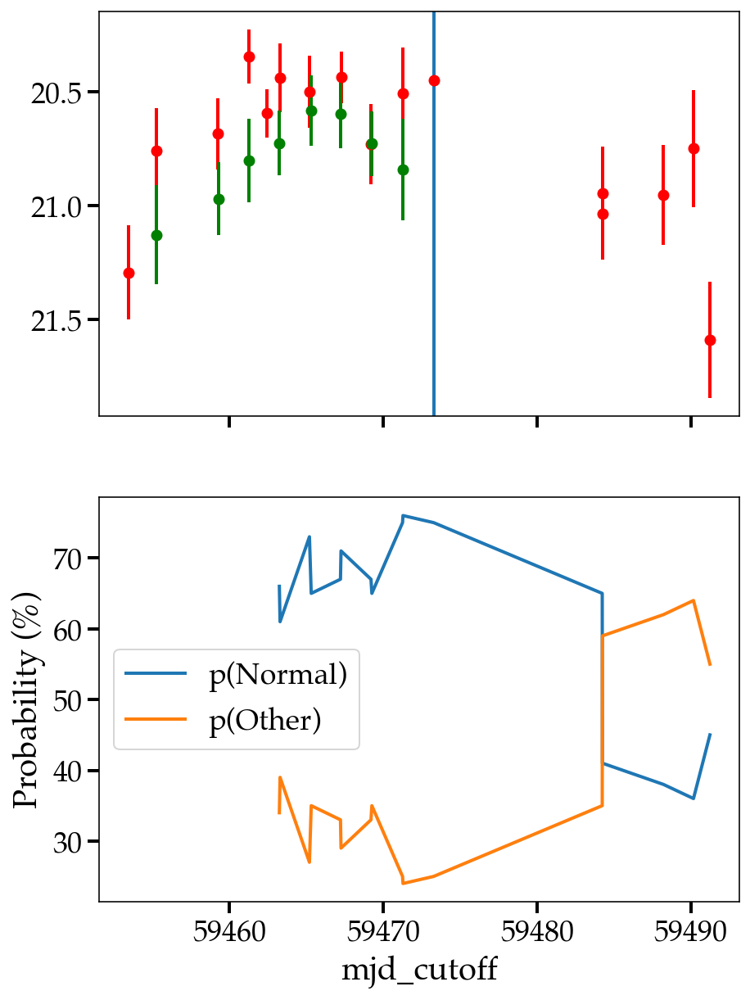

%%%%%%%%%%%%
2020itp 54.99470712773466 NA NA Other
Anomalous during timeseries!
max_anom_score 73.0
MJD Cutoff anom_idx 58985.38
https://ziggy.ucolick.org/yse/transient_detail/2020itp/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


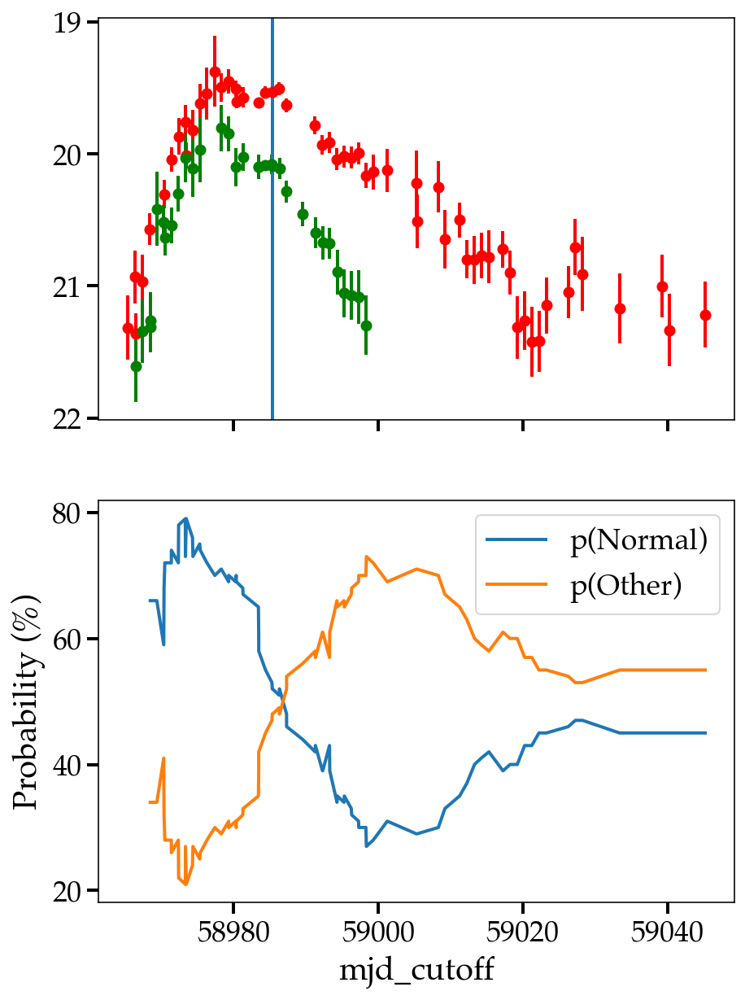

%%%%%%%%%%%%
2021qxp 54.98865275827588 NA NA Other
Prediction doesn't exceed anom_threshold of 50% for 2021qxp.
max_anom_score 66.0
https://ziggy.ucolick.org/yse/transient_detail/2021qxp/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


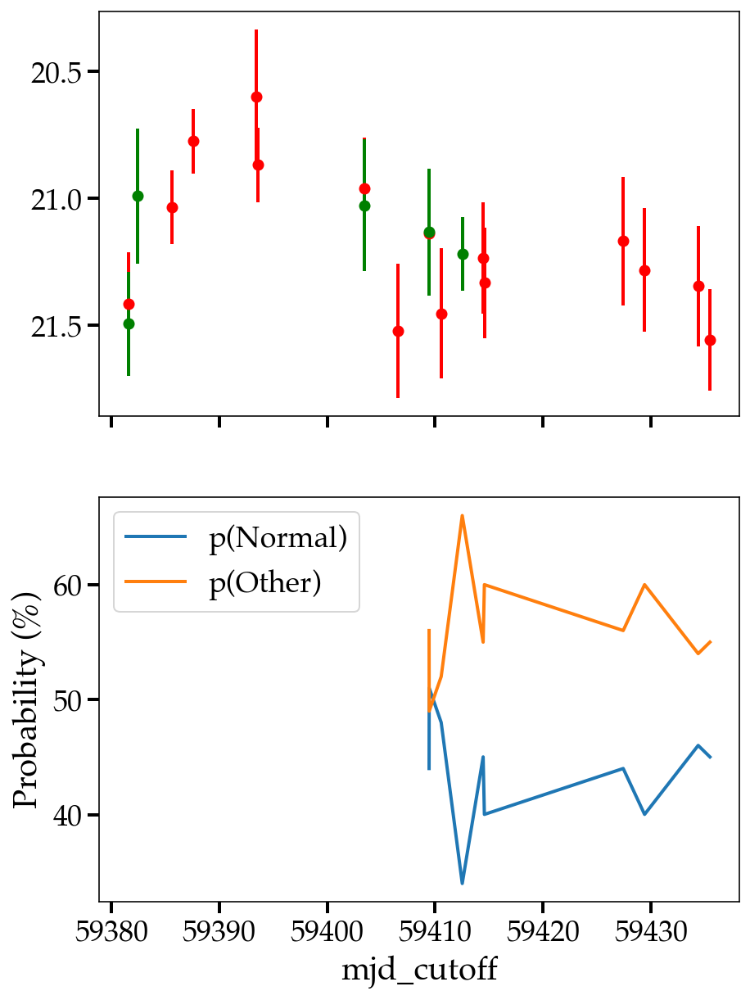

%%%%%%%%%%%%
2020rdu 54.98102869808421 SNIIn Other Other
Anomalous during timeseries!
max_anom_score 56.0
MJD Cutoff anom_idx 59078.195
https://ziggy.ucolick.org/yse/transient_detail/2020rdu/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


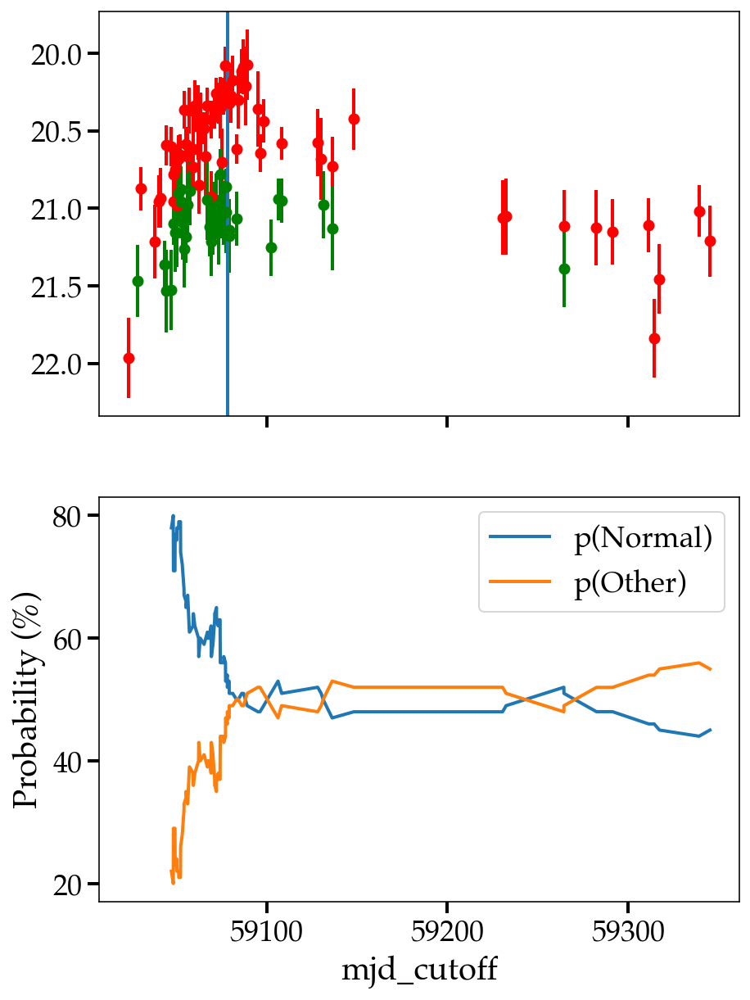

%%%%%%%%%%%%
2021rmi 54.974823362384015 NA NA Other
Anomalous during timeseries!
max_anom_score 58.0
MJD Cutoff anom_idx 59402.236
https://ziggy.ucolick.org/yse/transient_detail/2021rmi/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


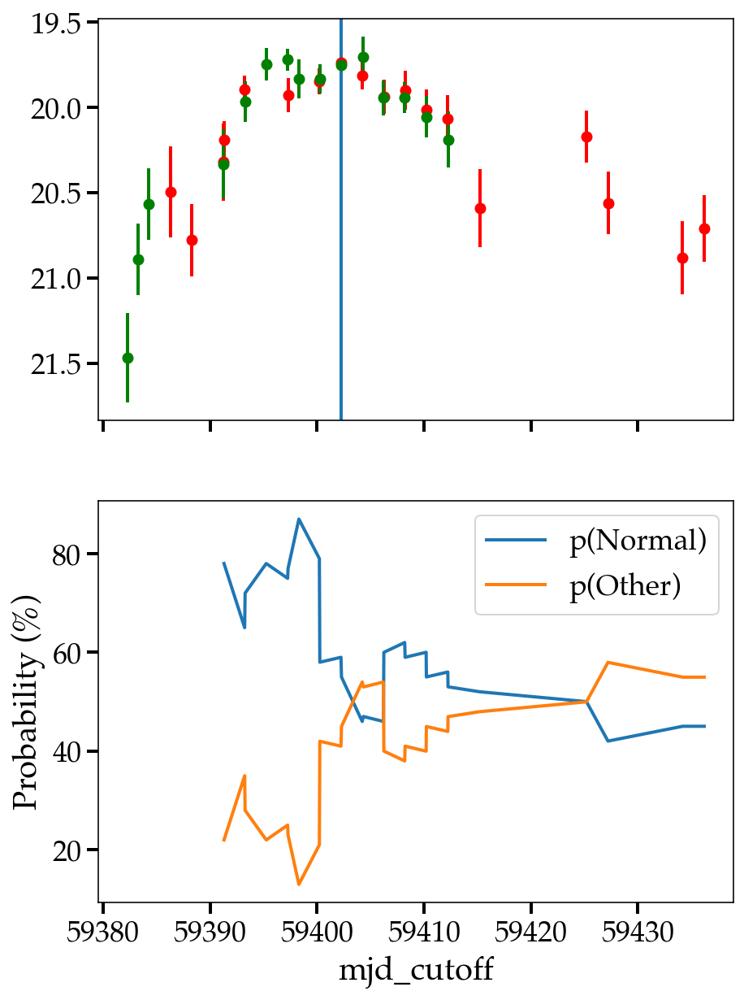

%%%%%%%%%%%%
2021nue 54.961852997494795 SNII Normal Other
Anomalous during timeseries!
max_anom_score 55.0
MJD Cutoff anom_idx 59484.23
https://ziggy.ucolick.org/yse/transient_detail/2021nue/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


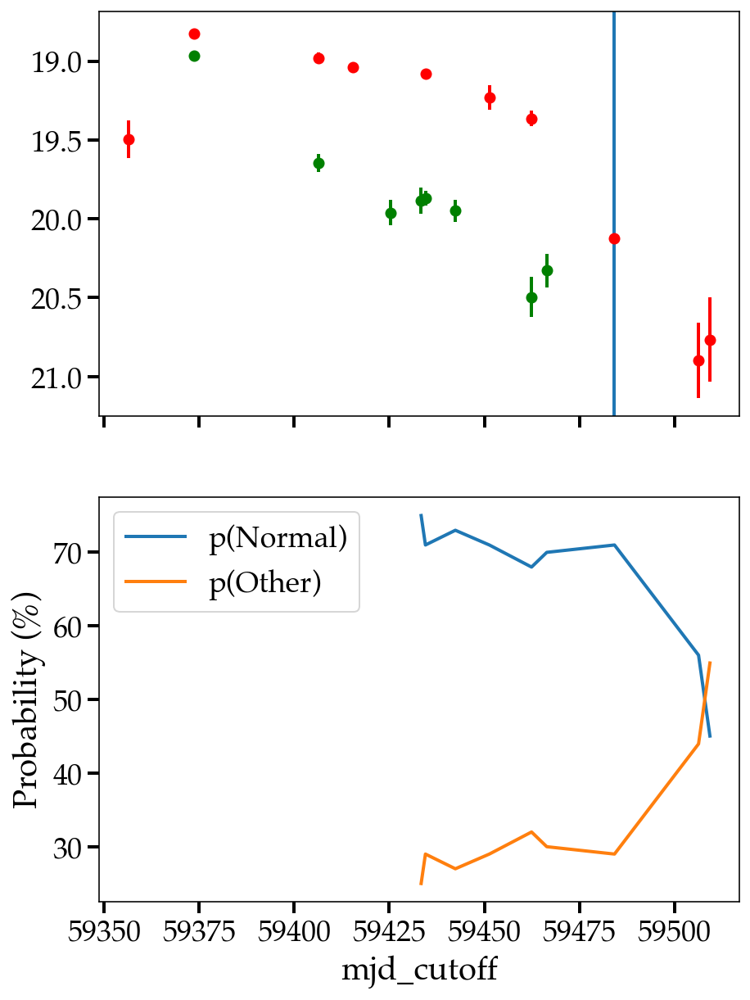

%%%%%%%%%%%%
2020kmv 54.91542791930119 NA NA Other
Anomalous during timeseries!
max_anom_score 54.9
MJD Cutoff anom_idx 58998.225
https://ziggy.ucolick.org/yse/transient_detail/2020kmv/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


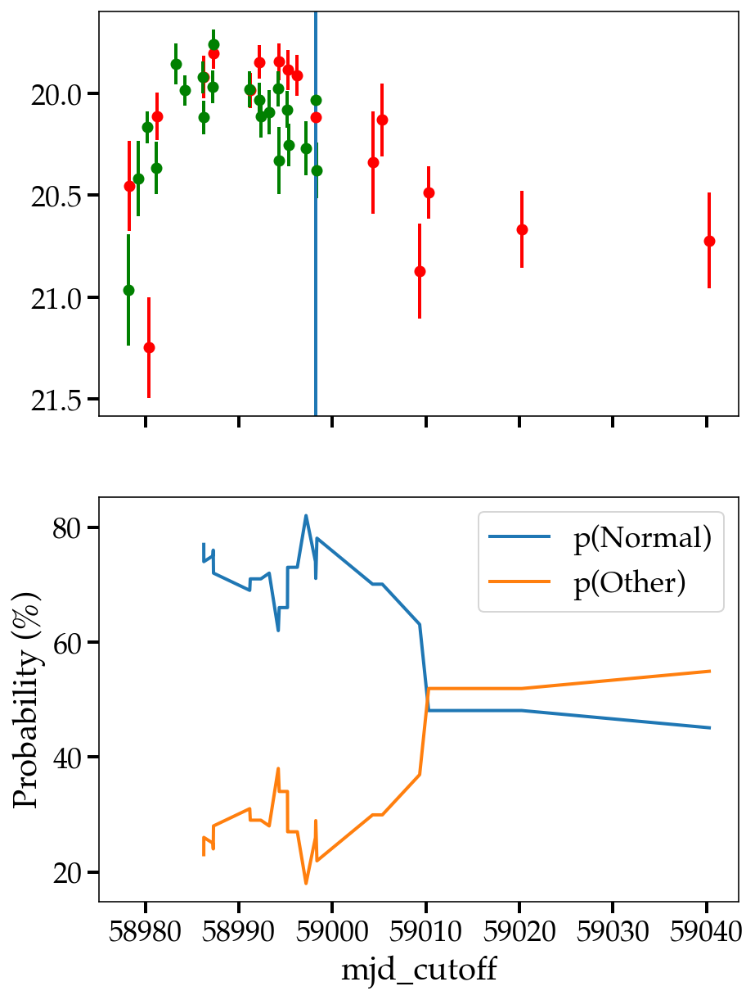

%%%%%%%%%%%%
2021pnp 54.87384681152431 SNIIb Other Other
Anomalous during timeseries!
max_anom_score 79.0
MJD Cutoff anom_idx 59415.197
https://ziggy.ucolick.org/yse/transient_detail/2021pnp/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


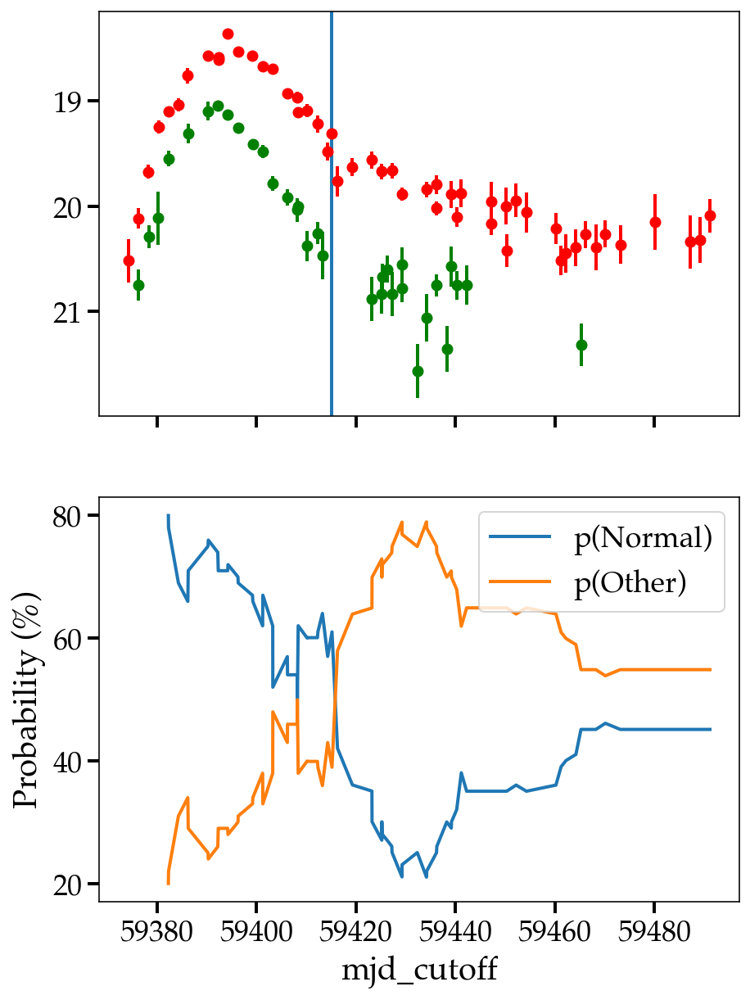

%%%%%%%%%%%%
2021cuw 52.9965102753005 NA NA Other
Anomalous during timeseries!
max_anom_score 53.0
MJD Cutoff anom_idx 59276.229
https://ziggy.ucolick.org/yse/transient_detail/2021cuw/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


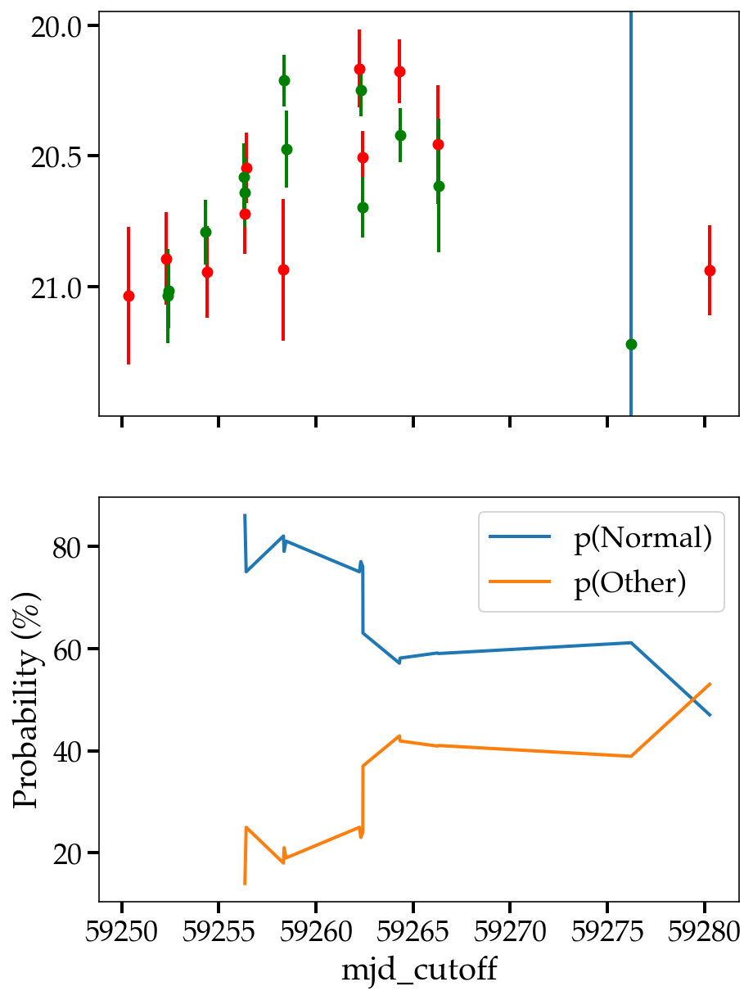

%%%%%%%%%%%%
2020kfy 52.93510100486243 NA NA Other
Anomalous during timeseries!
max_anom_score 52.9
MJD Cutoff anom_idx 59005.246
https://ziggy.ucolick.org/yse/transient_detail/2020kfy/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


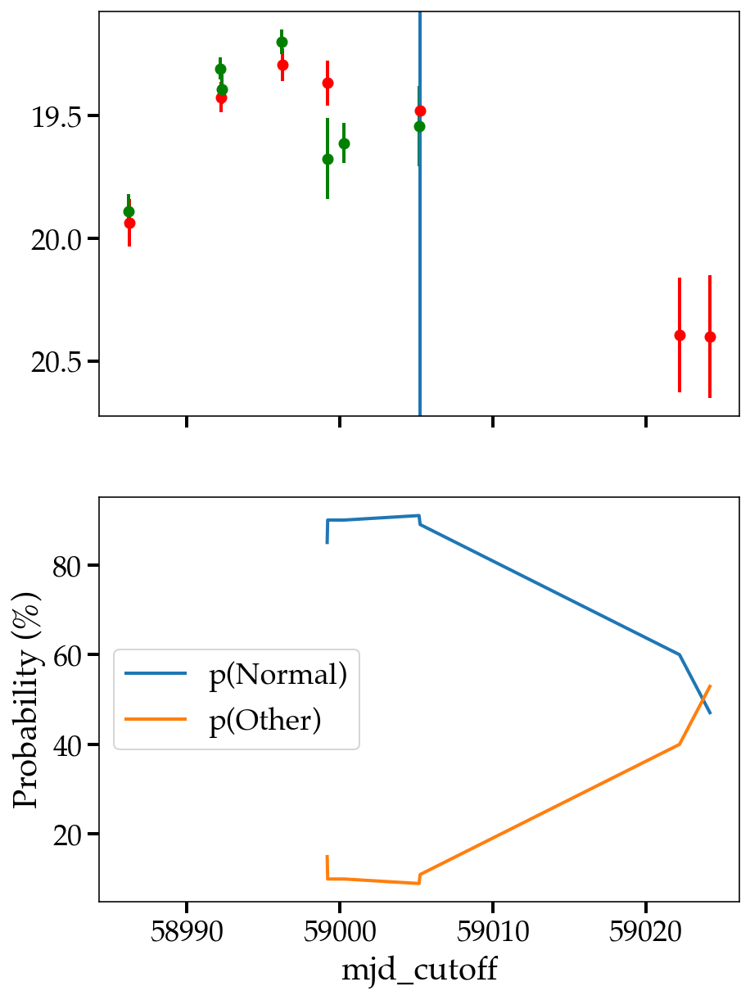

%%%%%%%%%%%%
2021aff 51.99969278033794 SNII Normal Other
Anomalous during timeseries!
max_anom_score 63.0
MJD Cutoff anom_idx 59228.462
https://ziggy.ucolick.org/yse/transient_detail/2021aff/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


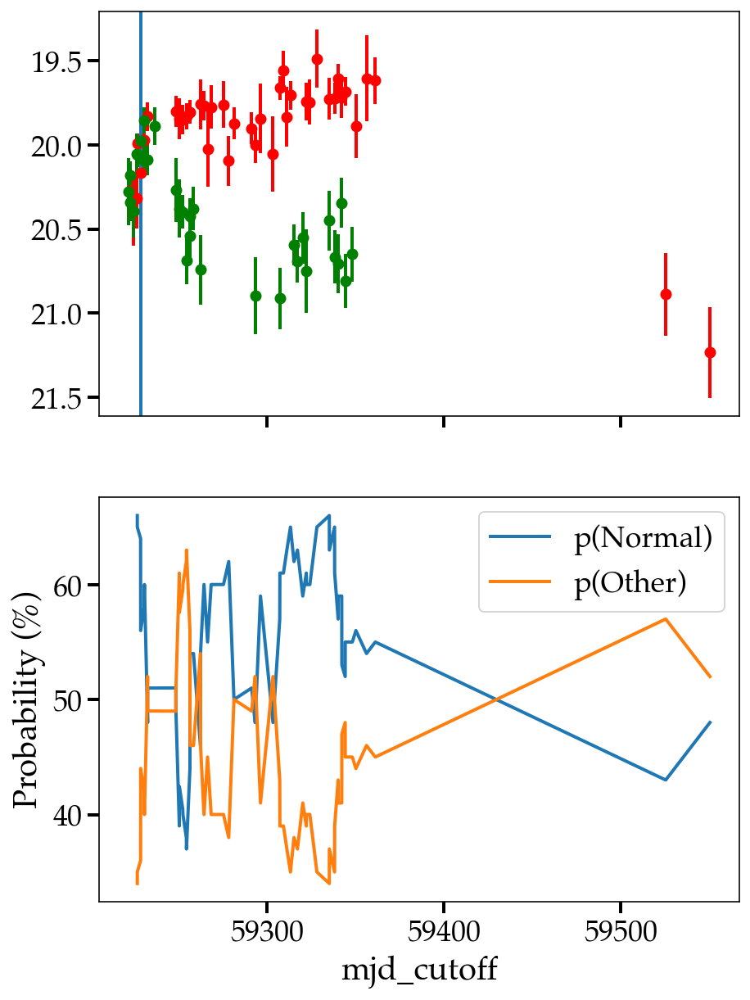

%%%%%%%%%%%%
2020ika 51.98317721502445 NA NA Other
Anomalous during timeseries!
max_anom_score 53.0
MJD Cutoff anom_idx 58994.27
https://ziggy.ucolick.org/yse/transient_detail/2020ika/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


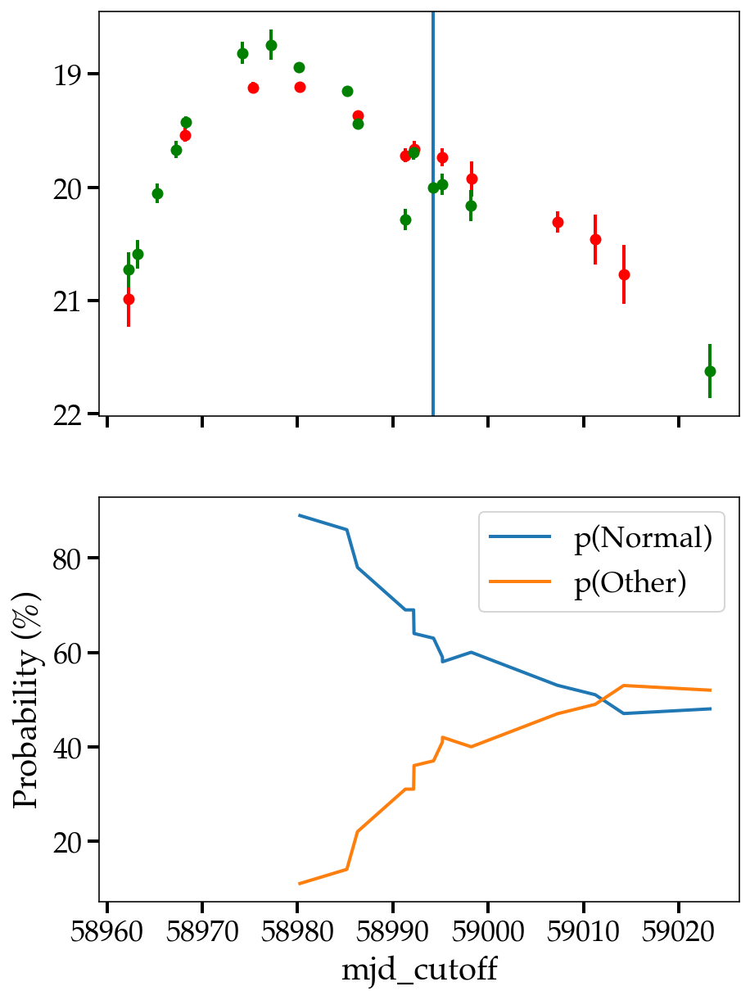

%%%%%%%%%%%%
2021bbd 51.982515890193696 NA NA Other
Anomalous during timeseries!
max_anom_score 52.0
MJD Cutoff anom_idx 59376.215
https://ziggy.ucolick.org/yse/transient_detail/2021bbd/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


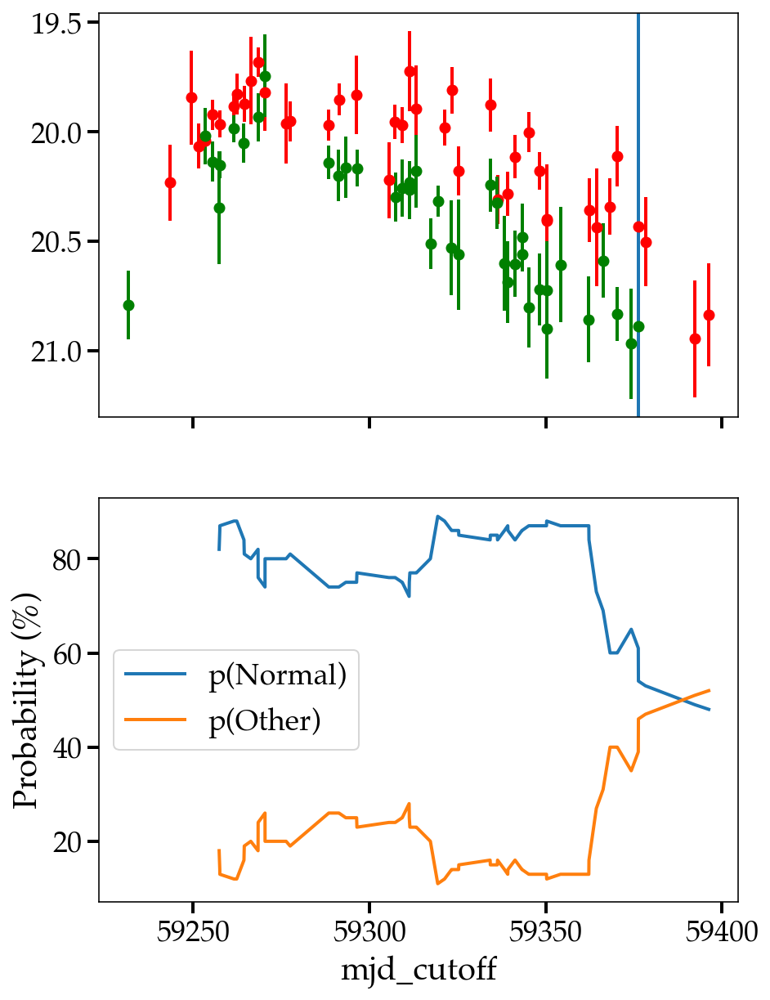

%%%%%%%%%%%%
2020abbj 51.22061379077304 NA NA Other
Anomalous during timeseries!
max_anom_score 51.2
MJD Cutoff anom_idx 59260.4
https://ziggy.ucolick.org/yse/transient_detail/2020abbj/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


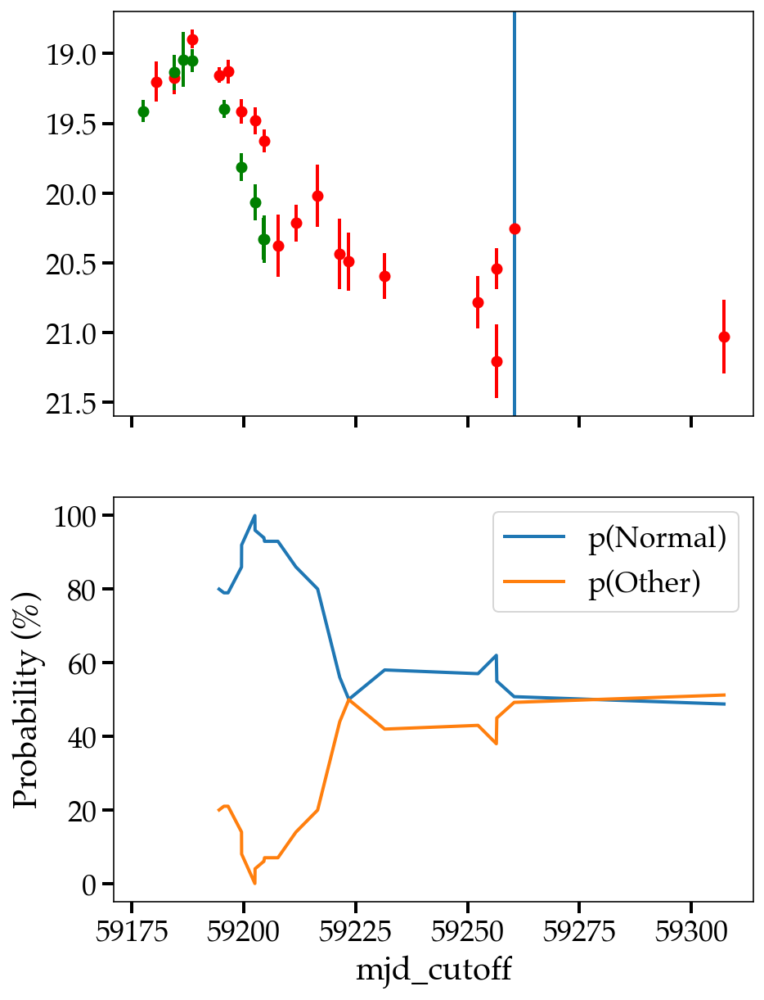

%%%%%%%%%%%%
2020abgb 51.0 NA NA Other
Anomalous during timeseries!
max_anom_score 55.0
MJD Cutoff anom_idx 59198.394
https://ziggy.ucolick.org/yse/transient_detail/2020abgb/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


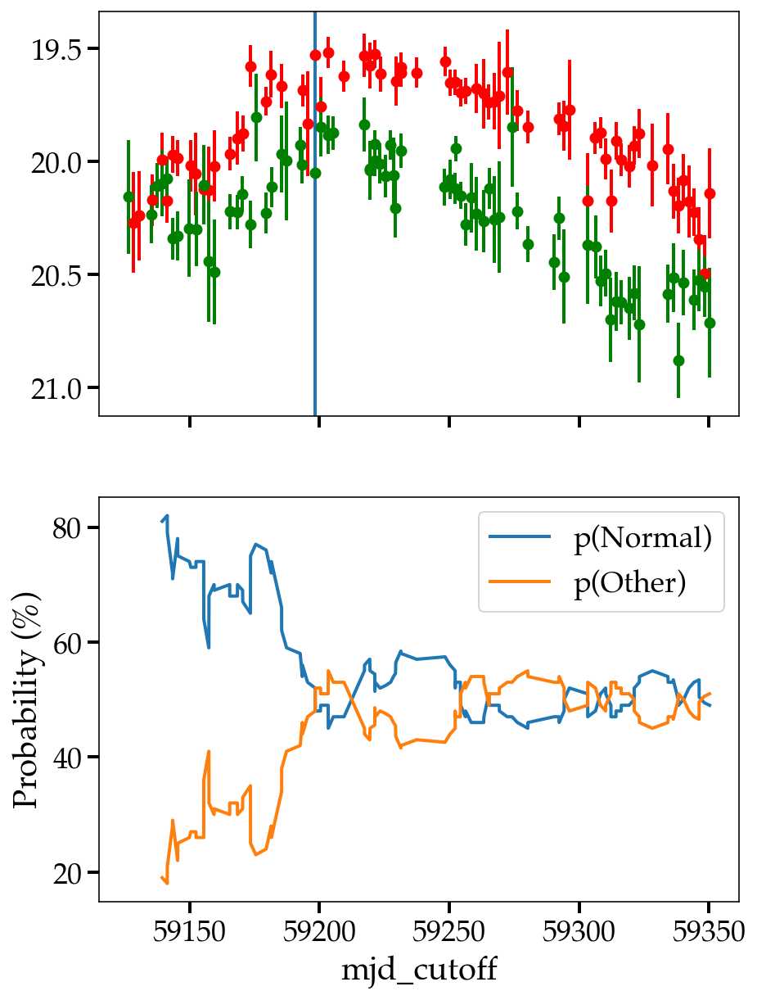

%%%%%%%%%%%%
2020rpl 51.0 NA NA Other
Anomalous during timeseries!
max_anom_score 51.0
MJD Cutoff anom_idx 59077.456
https://ziggy.ucolick.org/yse/transient_detail/2020rpl/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


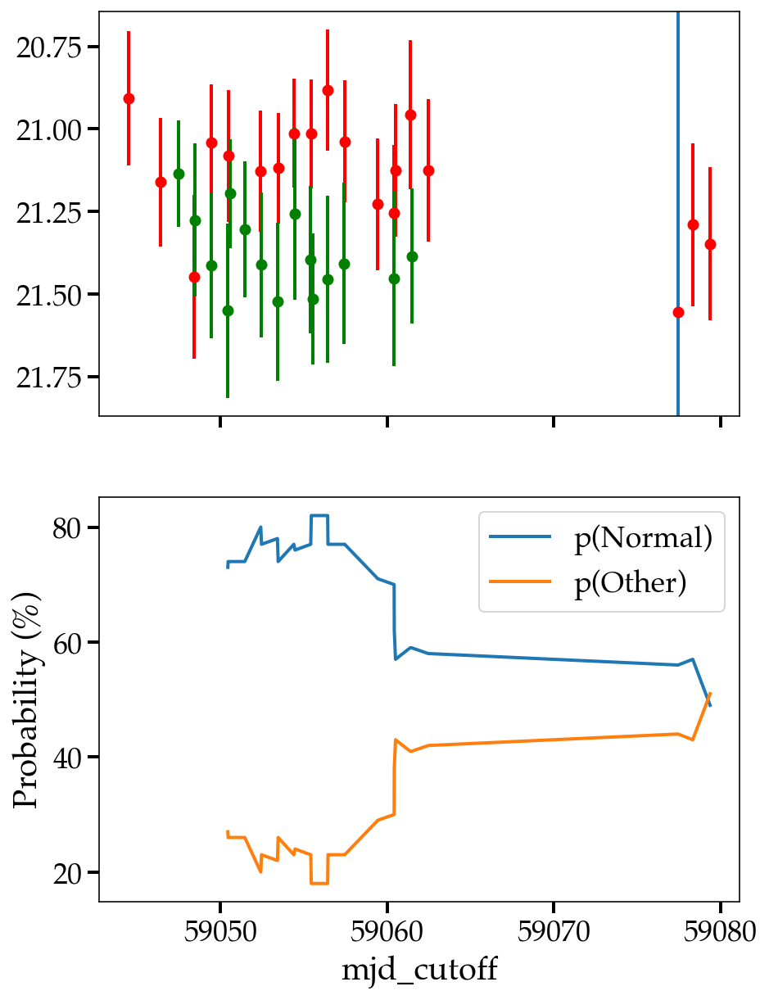

%%%%%%%%%%%%
2020nwa 50.99969278033794 NA NA Other
Anomalous during timeseries!
max_anom_score 51.0
MJD Cutoff anom_idx 59043.357
https://ziggy.ucolick.org/yse/transient_detail/2020nwa/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


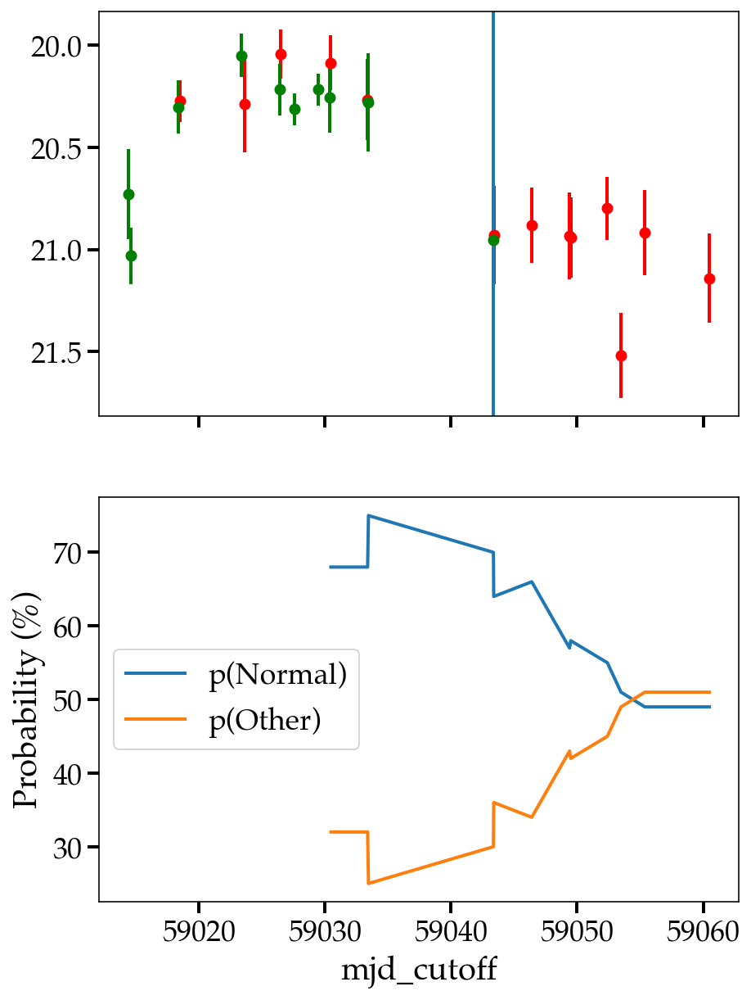

%%%%%%%%%%%%
2020uba 50.99370475638585 NA NA Other
Anomalous during timeseries!
max_anom_score 52.0
MJD Cutoff anom_idx 59138.296
https://ziggy.ucolick.org/yse/transient_detail/2020uba/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


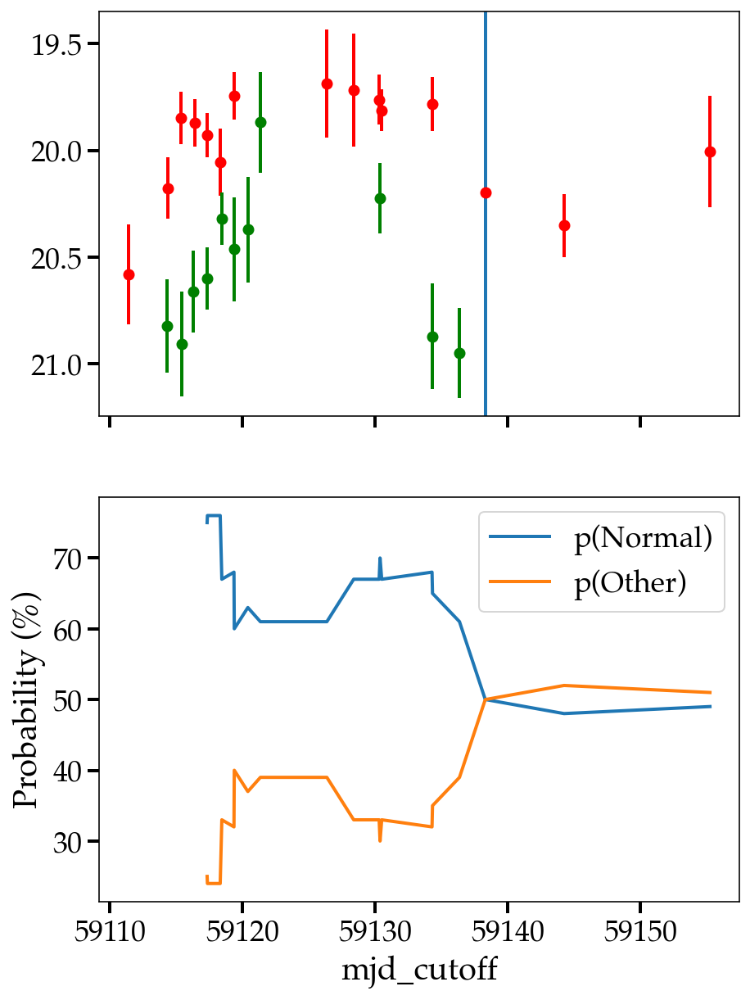

%%%%%%%%%%%%
2021wlp 50.992565055762086 NA NA Other
Anomalous during timeseries!
max_anom_score 57.0
MJD Cutoff anom_idx 59453.34
https://ziggy.ucolick.org/yse/transient_detail/2021wlp/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


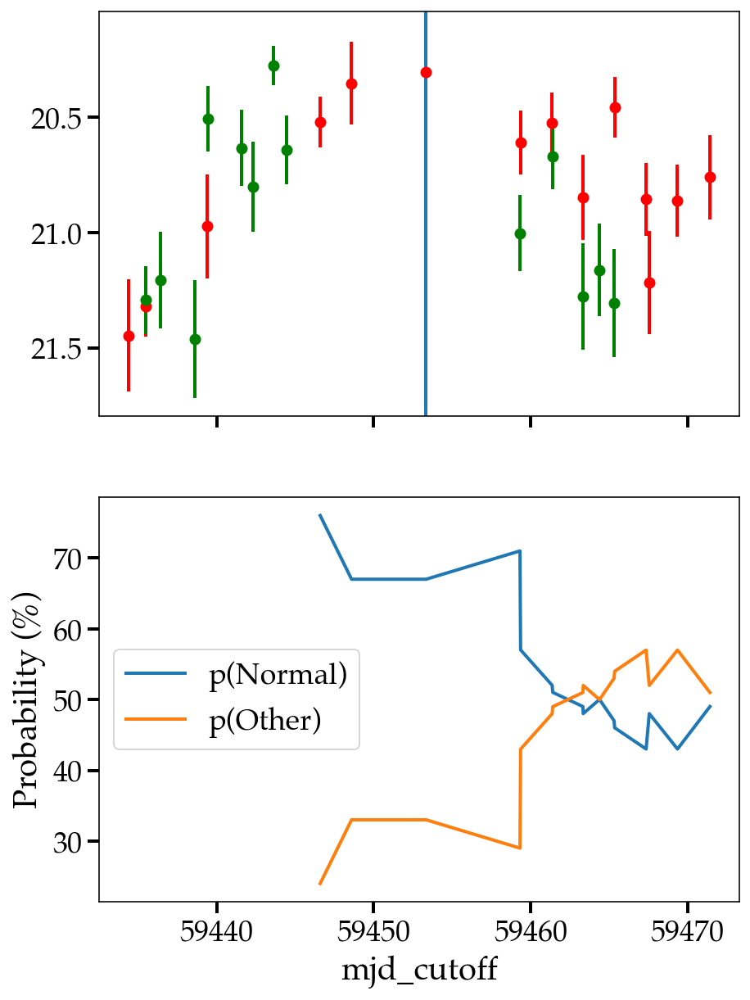

%%%%%%%%%%%%
2020mor 50.96760307423156 NA NA Other
Anomalous during timeseries!
max_anom_score 51.0
MJD Cutoff anom_idx 59051.27
https://ziggy.ucolick.org/yse/transient_detail/2020mor/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


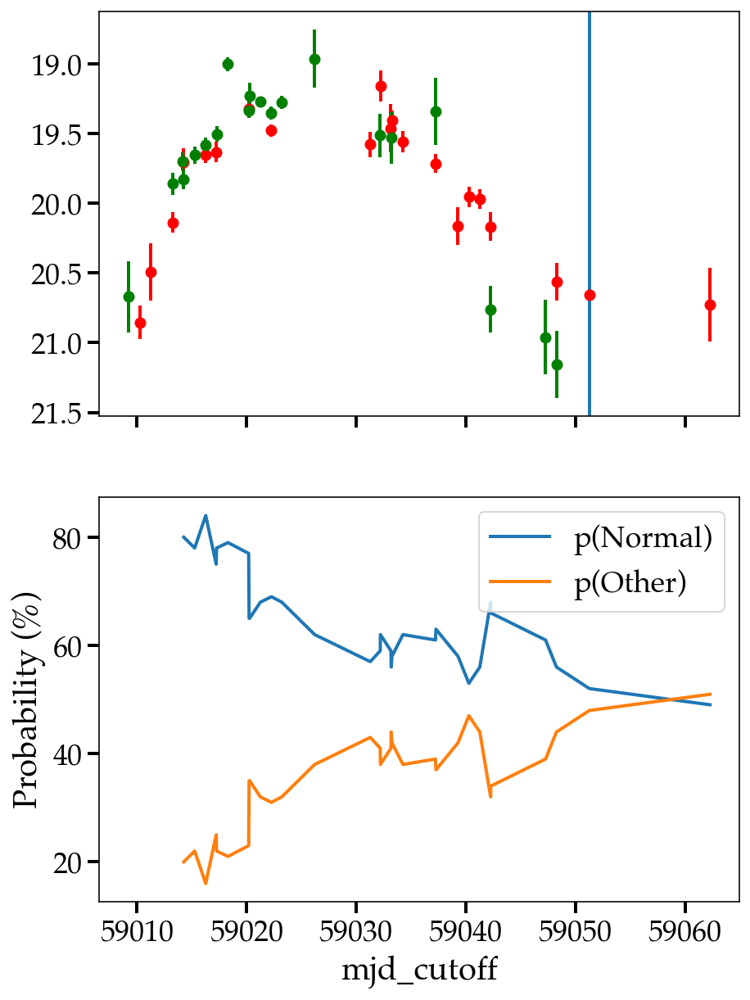

%%%%%%%%%%%%
2020qlp 50.0 NA NA Other
Anomalous during timeseries!
max_anom_score 52.0
MJD Cutoff anom_idx 59080.339
https://ziggy.ucolick.org/yse/transient_detail/2020qlp/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


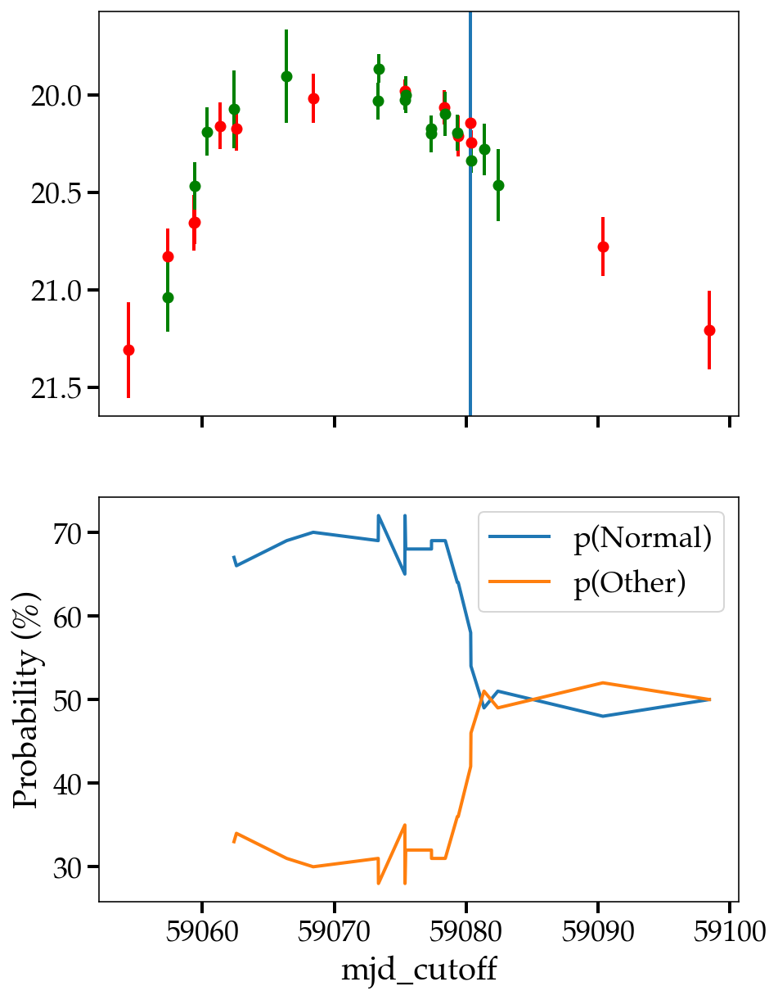

%%%%%%%%%%%%
2019ppi 50.0 SNII Normal Other
Anomalous during timeseries!
max_anom_score 60.0
MJD Cutoff anom_idx 58766.532
https://ziggy.ucolick.org/yse/transient_detail/2019ppi/


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


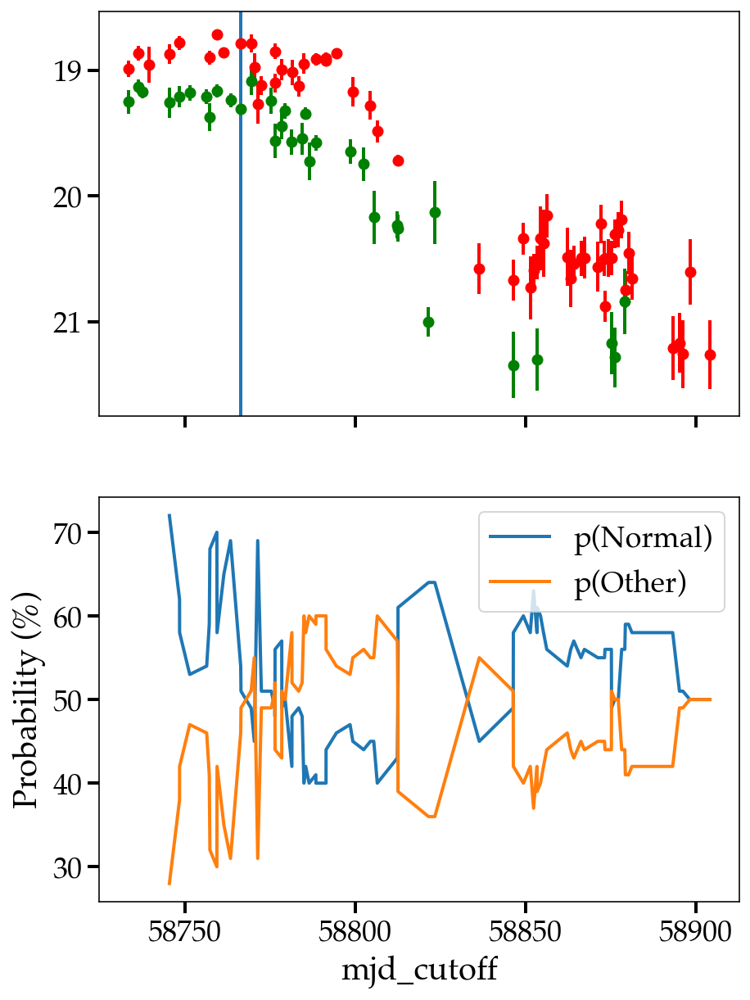

%%%%%%%%%%%%


In [190]:
#plot
for obj, score, cls, cls2, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df["spec_class"], 
                                   higest_anom_score_df["spec_class_norm_anom"], 
                                   higest_anom_score_df.RFC_best_cls):
    print(obj, score, cls, cls2, rfc_cls)
    
    sn_idx = full_snid_list.index(obj)
    meta = full_meta_list[sn_idx]
    
    lc = full_df_list[sn_idx]
    lc_grXY = lc[(lc.PASSBAND != 'i') & (lc.PASSBAND != 'z')].reset_index(drop=True)
    # (g, r, i or z for PS1-griz, respectively; X for ZTF-g; Y for ZTF-r)
    lc_grXY["PASSBAND"] = lc_grXY["PASSBAND"].map({"X": "g", "g": "g", "Y": "R", "r": "R"})
    lc = lc_grXY
    
    plot_RFC_prob_vs_lc_ztfid(anom_ztfid=obj, 
                              anom_thresh=50, 
                              lc=lc,
                              meta=meta,
                              df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries",
                             )
    print("%%%%%%%%%%%%")

In [146]:
[obj for obj in higest_anom_score_df.index]

full_snid_list.index('2020xsy')

1052

In [147]:
full_meta_list[1052]

{'object_id': '2020xsy',
 'original_object_id': '2020xsy',
 'ra': 163.766692,
 'dec': -1.539883,
 'mwebv': 0.039,
 'redshift': 0.27,
 'redshift_err': 0.005,
 'redshift_type': 'SPEC-Z',
 'redshift_frame': 'HELIO',
 'photo_z': 0.121,
 'photoz_err': 0.068,
 'sn_offset': -99.0,
 'host_gal_name': 'None (or error)',
 'host_gal_name_source': '(NED)',
 'host_gal_z': -99.0,
 'host_gal_z_err': 0.005,
 'host_gal_z_type': 'HOST-Z',
 'host_gal_z_frame': 'HELIO',
 'peakmjd': 59159.497,
 'host_logmass': -99.0,
 'peak_abs_mag': -22.303,
 'transient_spec_class': 'SLSN-II',
 'spectype_3class': 'Other',
 'parsnip_pred_class': 'SNII',
 'parsnip_pred_conf': '49.2',
 'parsnip_s1': -0.2,
 'parsnip_s1_err': 0.057,
 'parsnip_s2': 1.607,
 'parsnip_s2_err': 0.07,
 'parsnip_s3': -1.038,
 'parsnip_s3_err': 0.023,
 'superraenn_pred_class': 'SNIa',
 'superraenn_pred_conf': '50.0',
 'ztf_zeropoint': 27.5,
 'peakSNR': 40.375,
 'max_mjd_gap': 10.036,
 'nobs_before_peak': 0,
 'nobs_to_peak': 1,
 'nobs_after_peak': 155,


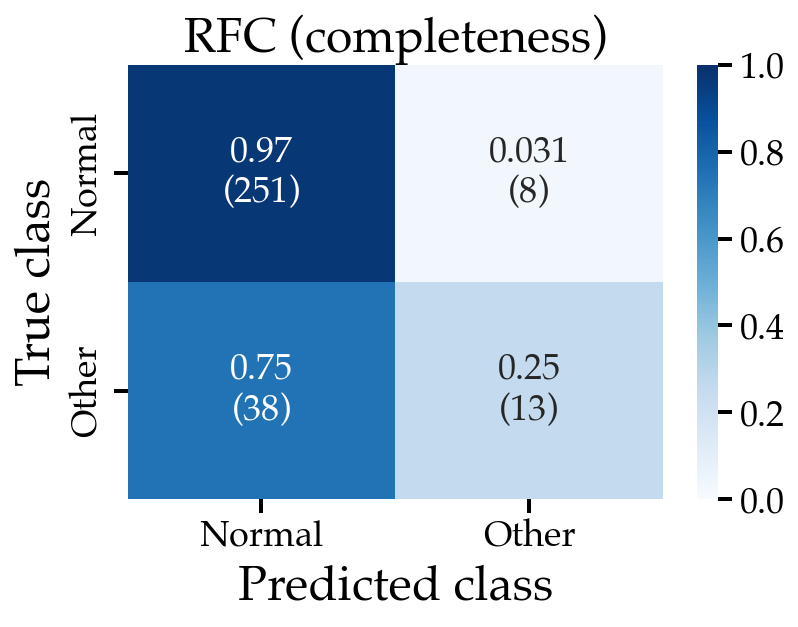

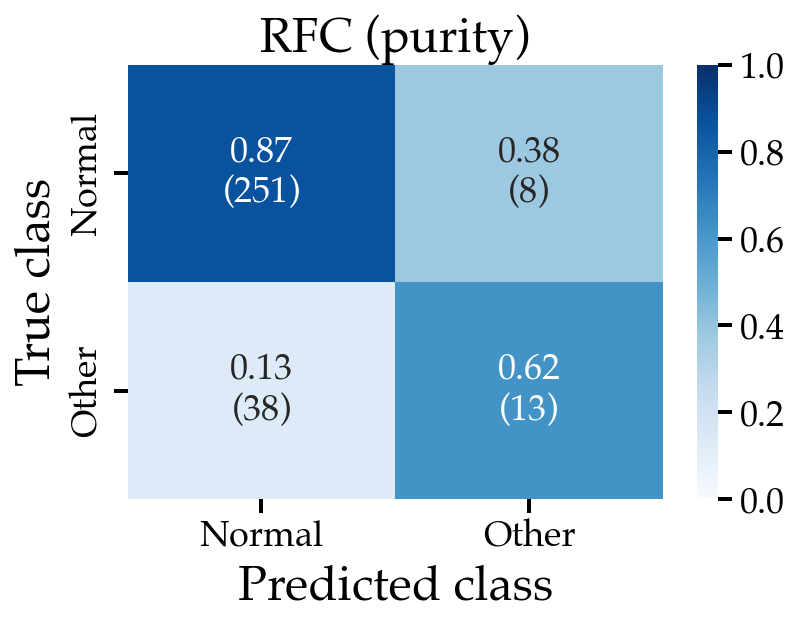

In [33]:
# Confusion matrices

spec_ysedr1_df = ysedr1_df[ysedr1_df.spec_class != "NA"]

title='RFC'
true_labels = np.array(spec_ysedr1_df['spec_class_norm_anom'])
predicted_labels = np.array(spec_ysedr1_df['RFC_best_cls'])
# define the class labels
class_names = np.unique(true_labels)
nclasses = len(class_names)

KINDS = ['completeness', 'purity']
for KIND in KINDS:
    # Sims test set
    plot_conf_matrix(true_labels, predicted_labels, labels=class_names, 
             title=f'{title} ({KIND})', kind=KIND)
    #plt.savefig(f'{cm_path}/confmatrix_YSEDR1_timeseries_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')
    plt.savefig(f'{cm_path}/confmatrix_YSEDR1_fullLConly_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')

    plt.show()
    plt.close()

In [34]:
# full LC only (14 spec w/ "other"/anomaly classification)

In [35]:
missclassified_df = spec_ysedr1_df[(spec_ysedr1_df["RFC_best_cls"] == "Other") & (spec_ysedr1_df["spec_class_norm_anom"] == "Normal")]
missclassified_df

,RFC_best_cls,max_anom_score,spec_class,spec_class_norm_anom
Disc. Internal Name,,,,
2021vwx,Other,65.979437,SNIa-norm,Normal
2020kvl,Other,69.985588,SNIa-norm,Normal
2020qkx,Other,60.998415,SNIa-norm,Normal
2021aff,Other,51.999693,SNII,Normal
2020lrr,Other,55.974809,SNII,Normal
2021xjh,Other,54.996510,SNIa-91T-like,Normal
2019ppi,Other,50.000000,SNII,Normal
2021nue,Other,54.961853,SNII,Normal


In [36]:
for obj, score, spec, spec_norm_anom, rfc_cls in zip(missclassified_df.index, 
                                   missclassified_df.max_anom_score,
                                   missclassified_df["spec_class"], 
                                   missclassified_df["spec_class_norm_anom"], 
                                   missclassified_df.RFC_best_cls):
    print(f"https://ziggy.ucolick.org/yse/transient_detail/{obj}/", round(score, 1), spec, spec_norm_anom, rfc_cls)

https://ziggy.ucolick.org/yse/transient_detail/2021vwx/ 66.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 70.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 61.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021aff/ 52.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020lrr/ 56.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021xjh/ 55.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2019ppi/ 50.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021nue/ 55.0 SNII Normal Other


## TODO: check spectra
https://ziggy.ucolick.org/yse/transient_detail/2021vwx/ 66.0 SNIa-norm Normal Other -- no 2nd bump, no rise. ParSNIP/SR also thought Ibc. SALT fit is even bad. Spec is def Ia norm though.
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 70.0 SNIa-norm Normal Other --Ia-norm spec. But that z=0.12 puts abs mag ~ -20.6 mag. Ia-SC????
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 61.0 SNIa-norm Normal Other -- Ia-norm spec. But slightly overluminous for Ia, -19.6 abs mag, z=0.127. Faint host.
https://ziggy.ucolick.org/yse/transient_detail/2021aff/ 52.0 SNII Normal Other -- looks normal SN II, but lasted 300d 
https://ziggy.ucolick.org/yse/transient_detail/2020lrr/ 56.0 SNII Normal Other -- looks normal SN II, between IIL/IIP, kinda weird LC
https://ziggy.ucolick.org/yse/transient_detail/2021xjh/ 55.0 SNIa-91T-like Normal Other -- Ia-91T
https://ziggy.ucolick.org/yse/transient_detail/2019ppi/ 50.0 SNII Normal Other -- looks normal SN II
https://ziggy.ucolick.org/yse/transient_detail/2021nue/ 55.0 SNII Normal Other -- II normal

### Full timeseries

In [51]:
%%time

fps = glob.glob("/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries/*")

ztfid_l, anom_idx_is_l, max_anom_score_l, spec_class_l = [], [], [], []
for fp in fps:
    ztfid = fp.split('/')[-1].split('_')[0]
    
    for meta in full_meta_list:
        if ztfid == meta["object_id"]:
    
            try:
                anom_ztfid, anom_idx_is, max_anom_score, spec_class = save_RFC_prob_vs_lc_ztfid(anom_ztfid=ztfid, 
                                      anom_thresh=50, 
                                      meta=meta,
                                      df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/notebooks/YSEDR1/timeseries",
                                      clf=clf,
                                      full_timeseries=True
                                     )
            except: continue
            ztfid_l.append(anom_ztfid), anom_idx_is_l.append(anom_idx_is), max_anom_score_l.append(max_anom_score), spec_class_l.append(spec_class)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021iyu.
Prediction doesn't exceed anom_threshold of 50% for 2020van.
Prediction doesn't exceed anom_threshold of 50% for 2020mvu.
Prediction doesn't exceed anom_threshold of 50% for 2020olk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021bbp.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020vuc.
Prediction doesn't exceed anom_threshold of 50% for 2021lzg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021kbn.
Prediction doesn't exceed anom_threshold of 50% for 2020mks.
Prediction doesn't exceed anom_threshold of 50% for 2020qda.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qqi.
Anomalous during timeseries!
2021rge has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020jli.
Prediction doesn't exceed anom_threshold of 50% for 2020zqn.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021vhk.
2021oqc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020pix.
Prediction doesn't exceed anom_threshold of 50% for 2021abj.
Prediction doesn't exceed anom_threshold of 50% for 2021rbq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020two.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021sil.
2020aeyo has some NaN LC features. Skip!
2021qsr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020nki.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2019zag.
2020lez has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021gdv.
2021abgy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020uwl.
Prediction doesn't exceed anom_threshold of 50% for 2020dxa.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020wxz.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020rom.
2020zrv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iww.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020sxs.
Prediction doesn't exceed anom_threshold of 50% for 2020tkd.
Prediction doesn't exceed anom_threshold of 50% for 2020vzd.
Prediction doesn't exceed anom_threshold of 50% for 2021qgw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021xgi.
Prediction doesn't exceed anom_threshold of 50% for 2020jts.
Prediction doesn't exceed anom_threshold of 50% for 2020kax.
Prediction doesn't exceed anom_threshold of 50% for 2021kdb.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021acfw.
2020pip has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020amc.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021lhf.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kpo.
Prediction doesn't exceed anom_threshold of 50% for 2020lly.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021nmk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021mqr.
Prediction doesn't exceed anom_threshold of 50% for 2020rii.
Prediction doesn't exceed anom_threshold of 50% for 2021amm.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020tle.
Prediction doesn't exceed anom_threshold of 50% for 2021zzv.
Prediction doesn't exceed anom_threshold of 50% for 2020ebm.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021sne.
2021lra has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020abrb.
Prediction doesn't exceed anom_threshold of 50% for 2020ikz.
Prediction doesn't exceed anom_threshold of 50% for 2021qas.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020advk.
Prediction doesn't exceed anom_threshold of 50% for 2021doz.
2021aamp has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021abwm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021kcc.
Prediction doesn't exceed anom_threshold of 50% for 2021xic.
Prediction doesn't exceed anom_threshold of 50% for 2020ltk.
2020aaca has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021yuc.
Prediction doesn't exceed anom_threshold of 50% for 2021obg.
Prediction doesn't exceed anom_threshold of 50% for 2021wlq.
Prediction doesn't exceed anom_threshold of 50% for 2021aox.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021isf.
2020bso has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021log.
Prediction doesn't exceed anom_threshold of 50% for 2020lac.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021in.
Prediction doesn't exceed anom_threshold of 50% for 2021buj.
Prediction doesn't exceed anom_threshold of 50% for 2021gik.
Prediction doesn't exceed anom_threshold of 50% for 2021oax.
2021kiw has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kbi.
Prediction doesn't exceed anom_threshold of 50% for 2020abpx.
Prediction doesn't exceed anom_threshold of 50% for 2021hpz.
Prediction doesn't exceed anom_threshold of 50% for 2021apd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020jpm.
Prediction doesn't exceed anom_threshold of 50% for 2021mge.
Prediction doesn't exceed anom_threshold of 50% for 2020acyp.
Prediction doesn't exceed anom_threshold of 50% for 2020wwr.
2021aow has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kwa.
Prediction doesn't exceed anom_threshold of 50% for 2021iyr.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ovk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acwz.
Prediction doesn't exceed anom_threshold of 50% for 2021ort.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020dyc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020wyx.
2020irb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iwx.
Prediction doesn't exceed anom_threshold of 50% for 2019lbi.
Prediction doesn't exceed anom_threshold of 50% for 2020abul.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
2020oix has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020achi.
Prediction doesn't exceed anom_threshold of 50% for 2021aceh.
Prediction doesn't exceed anom_threshold of 50% for 2021abpc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021txi.
Anomalous during timeseries!
2020hra has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021upd.
Prediction doesn't exceed anom_threshold of 50% for 2020aapb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020iqr.
Prediction doesn't exceed anom_threshold of 50% for 2020bta.
Anomalous during timeseries!
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020gcv.
Prediction doesn't exceed anom_threshold of 50% for 2021tfw.
Prediction doesn't exceed anom_threshold of 50% for 2021uqi.
2019wcb has some NaN LC features. Skip!
2021afeb has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021acgu.
Prediction doesn't exceed anom_threshold of 50% for 2021adug.
Prediction doesn't exceed anom_threshold of 50% for 2020woh.
Prediction doesn't exceed anom_threshold of 50% for 2020oa.
2020lyv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
2021ypp has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021shf.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020bct.
2020vzc has some NaN LC features. Skip!
2020kvb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tkc.
Prediction doesn't exceed anom_threshold of 50% for 2021bsf.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qwb.
Prediction doesn't exceed anom_threshold of 50% for 2020iyt.
Prediction doesn't exceed anom_threshold of 50% for 2020jjb.
Prediction doesn't exceed anom_threshold of 50% for 2020roj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021jox.
Prediction doesn't exceed anom_threshold of 50% for 2021tjh.
Prediction doesn't exceed anom_threshold of 50% for 2020qxm.
Anomalous during timeseries!
2020qrv has some NaN LC features. Skip!
2021ctd has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2021wlv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wms.
2021abwj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lzh.
2020aehy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019yjl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021jvo.
Prediction doesn't exceed anom_threshold of 50% for 2020advl.
Prediction doesn't exceed anom_threshold of 50% for 2020oot.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021sdy.
Prediction doesn't exceed anom_threshold of 50% for 2020kpf.
Prediction doesn't exceed anom_threshold of 50% for 2020tfy.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021mzk.
Prediction doesn't exceed anom_threshold of 50% for 2020hik.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020rok.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021joy.
Prediction doesn't exceed anom_threshold of 50% for 2020kvc.
Prediction doesn't exceed anom_threshold of 50% for 2021abgw.
2021van has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020iyu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021vku.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020qhp.
Prediction doesn't exceed anom_threshold of 50% for 2020fhj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ypq.
Prediction doesn't exceed anom_threshold of 50% for 2021qed.
Prediction doesn't exceed anom_threshold of 50% for 2020nva.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021sjr.
Prediction doesn't exceed anom_threshold of 50% for 2021ygl.
Prediction doesn't exceed anom_threshold of 50% for 2021hid.
Prediction doesn't exceed anom_threshold of 50% for 2019wcc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ztz.
Prediction doesn't exceed anom_threshold of 50% for 2021bzl.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020pfy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021hlp.
2020qqg has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ito.
2020tfx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kqb.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020nrp.
2020abrd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021rrc.
Prediction doesn't exceed anom_threshold of 50% for 2021wog.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020oou.
Prediction doesn't exceed anom_threshold of 50% for 2021oaq.
2020oen has some NaN LC features. Skip!
2021abwk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kld.
Prediction doesn't exceed anom_threshold of 50% for 2021lqw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qfz.
Prediction doesn't exceed anom_threshold of 50% for 2021ils.
Prediction doesn't exceed anom_threshold of 50% for 2021hzh.
Prediction doesn't exceed anom_threshold of 50% for 2021wmr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021cte.
2021acjn has some NaN LC features. Skip!
2021mgl has some NaN LC features. Skip!
2021jw has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021tji.
2021iys has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020adkc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021owa.
Prediction doesn't exceed anom_threshold of 50% for 2020acyq.
Prediction doesn't exceed anom_threshold of 50% for 2020jnz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rkr.
Prediction doesn't exceed anom_threshold of 50% for 2021aov.
Prediction doesn't exceed anom_threshold of 50% for 2021mxw.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021mgd.
Anomalous during timeseries!
2021sfe has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kgr.
Prediction doesn't exceed anom_threshold of 50% for 2020tzs.
2021vqz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021accm.
Prediction doesn't exceed anom_threshold of 50% for 2021iok.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ebc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021btn.
Prediction doesn't exceed anom_threshold of 50% for 2021abje.
Prediction doesn't exceed anom_threshold of 50% for 2021rgc.
Prediction doesn't exceed anom_threshold of 50% for 2020abhk.
Prediction doesn't exceed anom_threshold of 50% for 2020aapc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020agv.
Prediction doesn't exceed anom_threshold of 50% for 2021aci.
Prediction doesn't exceed anom_threshold of 50% for 2020acun.
2020hfm has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021fom.
Prediction doesn't exceed anom_threshold of 50% for 2020abwx.
Prediction doesn't exceed anom_threshold of 50% for 2021gyv.
Prediction doesn't exceed anom_threshold of 50% for 2021kor.
2021sjz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020tvl.
Prediction doesn't exceed anom_threshold of 50% for 2020hpu.
Prediction doesn't exceed anom_threshold of 50% for 2020oiy.
Prediction doesn't exceed anom_threshold of 50% for 2020aqn.
Prediction doesn't exceed anom_threshold of 50% for 2020azp.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021scq.
Prediction doesn't exceed anom_threshold of 50% for 2021kfy.
2020imp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iwy.
Prediction doesn't exceed anom_threshold of 50% for 2019uev.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021bzk.
Prediction doesn't exceed anom_threshold of 50% for 2021pgu.
2021ygk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020amb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rmy.
Prediction doesn't exceed anom_threshold of 50% for 2020hro.
Prediction doesn't exceed anom_threshold of 50% for 2021dkj.
Prediction doesn't exceed anom_threshold of 50% for 2020ino.
2020vyu has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2019yfu.
Prediction doesn't exceed anom_threshold of 50% for 2020jtr.
Prediction doesn't exceed anom_threshold of 50% for 2021pzs.
Prediction doesn't exceed anom_threshold of 50% for 2020oiv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Anomalous during timeseries!
2020bii has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020kcl.
Prediction doesn't exceed anom_threshold of 50% for 2020sga.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020abjq.
Prediction doesn't exceed anom_threshold of 50% for 2020vds.
Prediction doesn't exceed anom_threshold of 50% for 2020kvd.
Prediction doesn't exceed anom_threshold of 50% for 2020lnm.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020sxr.
Prediction doesn't exceed anom_threshold of 50% for 2020rol.
Prediction doesn't exceed anom_threshold of 50% for 2020her.
Prediction doesn't exceed anom_threshold of 50% for 2021pde.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021qvo.
Prediction doesn't exceed anom_threshold of 50% for 2020noq.
Prediction doesn't exceed anom_threshold of 50% for 2019tvv.
Prediction doesn't exceed anom_threshold of 50% for 2020lky.
2021aoy has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020dwg.
Prediction doesn't exceed anom_threshold of 50% for 2020jzx.
Anomalous during timeseries!
2021wmu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021dgu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ltj.
Prediction doesn't exceed anom_threshold of 50% for 2021kcb.
Prediction doesn't exceed anom_threshold of 50% for 2021abwl.
2021sgo has some NaN LC features. Skip!
2021oav has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020advj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021ryz.
Prediction doesn't exceed anom_threshold of 50% for 2020knv.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ina.
2020abrc has some NaN LC features. Skip!
2021dph has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020opa.
Prediction doesn't exceed anom_threshold of 50% for 2020rcs.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021acwo.
Prediction doesn't exceed anom_threshold of 50% for 2020aczf.
Prediction doesn't exceed anom_threshold of 50% for 2020jmm.
2020tmi has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tfw.
2021gcv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020skv.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020shf.
Prediction doesn't exceed anom_threshold of 50% for 2021kbo.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020jzp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021mgc.
Prediction doesn't exceed anom_threshold of 50% for 2021actw.
2020jdf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021jkg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021hdq.
Prediction doesn't exceed anom_threshold of 50% for 2020acyv.
Prediction doesn't exceed anom_threshold of 50% for 2020hju.
Anomalous during timeseries!
2021dsp has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021iyt.
Prediction doesn't exceed anom_threshold of 50% for 2021bwy.
Prediction doesn't exceed anom_threshold of 50% for 2020aewd.
2020ejj has some NaN LC features. Skip!
2020abjy has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021qxm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020tvk.
Prediction doesn't exceed anom_threshold of 50% for 2020sdy.
Prediction doesn't exceed anom_threshold of 50% for 2021gyq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020zoy.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021pyk.
Prediction doesn't exceed anom_threshold of 50% for 2021aahm.
Prediction doesn't exceed anom_threshold of 50% for 2020rxy.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020szo.
Prediction doesn't exceed anom_threshold of 50% for 2021sun.
Prediction doesn't exceed anom_threshold of 50% for 2020btg.
Prediction doesn't exceed anom_threshold of 50% for 2020kzy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021agu.
2020rij has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021dpj.
Prediction doesn't exceed anom_threshold of 50% for 2021dqo.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020awg.
2021doy has some NaN LC features. Skip!
2020odn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aalv.
Prediction doesn't exceed anom_threshold of 50% for 2020abra.
Prediction doesn't exceed anom_threshold of 50% for 2020iky.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021inc.
Prediction doesn't exceed anom_threshold of 50% for 2020abxz.
Prediction doesn't exceed anom_threshold of 50% for 2020txk.
Prediction doesn't exceed anom_threshold of 50% for 2021wlr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020yza.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020abpt.
Prediction doesn't exceed anom_threshold of 50% for 2020neh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020sxp.
Prediction doesn't exceed anom_threshold of 50% for 2020kvf.
2021ndc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021qyb.
2020irn has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ovg.
Prediction doesn't exceed anom_threshold of 50% for 2020yac.
Prediction doesn't exceed anom_threshold of 50% for 2020ron.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020apf.
Prediction doesn't exceed anom_threshold of 50% for 2020juu.
Prediction doesn't exceed anom_threshold of 50% for 2021bmt.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020vzg.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020aeeg.
Prediction doesn't exceed anom_threshold of 50% for 2020nvd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021itd.
Prediction doesn't exceed anom_threshold of 50% for 2021gmv.
2020kuv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020llz.
Prediction doesn't exceed anom_threshold of 50% for 2020ftl.
Prediction doesn't exceed anom_threshold of 50% for 2020rfe.
Prediction doesn't exceed anom_threshold of 50% for 2020mza.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021ygi.
2019wcf has some NaN LC features. Skip!
Anomalous during timeseries!
Anomalous during timeseries!
2021yfd has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021yga.
Prediction doesn't exceed anom_threshold of 50% for 2020actn.
Prediction doesn't exceed anom_threshold of 50% for 2020zqm.
Prediction doesn't exceed anom_threshold of 50% for 2020bte.
2020lyz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021unv.
Prediction doesn't exceed anom_threshold of 50% for 2021rh.
Prediction doesn't exceed anom_threshold of 50% for 2021oov.
Prediction doesn't exceed anom_threshold of 50% for 2020tuy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021gzc.
Prediction doesn't exceed anom_threshold of 50% for 2020zmn.
Prediction doesn't exceed anom_threshold of 50% for 2021zcj.
Prediction doesn't exceed anom_threshold of 50% for 2020ohy.
2020pux has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acih.
Prediction doesn't exceed anom_threshold of 50% for 2021ufx.
Prediction doesn't exceed anom_threshold of 50% for 2020adc.
Prediction doesn't exceed anom_threshold of 50% for 2021uxn.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rof.
2021abgz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021gnn.
Prediction doesn't exceed anom_threshold of 50% for 2020adkf.
2020acyt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020lks.
2020tee has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ivw.
Prediction doesn't exceed anom_threshold of 50% for 2021qve.
Prediction doesn't exceed anom_threshold of 50% for 2021iyv.
Prediction doesn't exceed anom_threshold of 50% for 2020nde.
2021kbm has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
2020qfw has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021cth.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021mga.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ikq.
Prediction doesn't exceed anom_threshold of 50% for 2020zjo.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021aru.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rvq.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021aafe.
Prediction doesn't exceed anom_threshold of 50% for 2020jlj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aaur.
Prediction doesn't exceed anom_threshold of 50% for 2021adew.
Prediction doesn't exceed anom_threshold of 50% for 2020rhg.
Prediction doesn't exceed anom_threshold of 50% for 2021pcn.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021efy.
2020ngu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020nlk.
Prediction doesn't exceed anom_threshold of 50% for 2020urt.
Prediction doesn't exceed anom_threshold of 50% for 2020icp.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021tux.
Prediction doesn't exceed anom_threshold of 50% for 2021aaez.
Prediction doesn't exceed anom_threshold of 50% for 2021ctg.
2021wmp has some NaN LC features. Skip!
2021wlu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aaoa.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020kns.
Prediction doesn't exceed anom_threshold of 50% for 2020zke.
Prediction doesn't exceed anom_threshold of 50% for 2021oas.
Prediction doesn't exceed anom_threshold of 50% for 2020pss.
Prediction doesn't exceed anom_threshold of 50% for 2021pca.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021acvo.
Prediction doesn't exceed anom_threshold of 50% for 2021ghe.
Prediction doesn't exceed anom_threshold of 50% for 2020qqe.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021aaws.
2021hbx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019wca.
Prediction doesn't exceed anom_threshold of 50% for 2020zj.
Prediction doesn't exceed anom_threshold of 50% for 2019vuz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020vfc.
Prediction doesn't exceed anom_threshold of 50% for 2020aeqm.
Prediction doesn't exceed anom_threshold of 50% for 2021nlj.
Prediction doesn't exceed anom_threshold of 50% for 2020eru.
2021aaie has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020kir.
2021she has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lta.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020jur.
Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020lom.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020kva.
Prediction doesn't exceed anom_threshold of 50% for 2020lev.
Prediction doesn't exceed anom_threshold of 50% for 2020bwr.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021qxh.
Prediction doesn't exceed anom_threshold of 50% for 2020add.
Prediction doesn't exceed anom_threshold of 50% for 2020mms.
Prediction doesn't exceed anom_threshold of 50% for 2020acct.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021scs.
Prediction doesn't exceed anom_threshold of 50% for 2020hrb.
Prediction doesn't exceed anom_threshold of 50% for 2020dec.
2021sjx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021kzx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020thx.
Prediction doesn't exceed anom_threshold of 50% for 2020kuy.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ite.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021dpe.
Prediction doesn't exceed anom_threshold of 50% for 2021im.
Prediction doesn't exceed anom_threshold of 50% for 2021rga.
Prediction doesn't exceed anom_threshold of 50% for 2021rfd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acdu.
Prediction doesn't exceed anom_threshold of 50% for 2021dov.
Prediction doesn't exceed anom_threshold of 50% for 2020aajf.
Prediction doesn't exceed anom_threshold of 50% for 2021inl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021uip.
2021wmx has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020icx.
Prediction doesn't exceed anom_threshold of 50% for 2021zfy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020shc.
Prediction doesn't exceed anom_threshold of 50% for 2021kbj.
Prediction doesn't exceed anom_threshold of 50% for 2020teb.
2021abbi has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2021aot has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020jnx.
Prediction doesn't exceed anom_threshold of 50% for 2020acys.
2020kux has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020thy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021abor.
Prediction doesn't exceed anom_threshold of 50% for 2020abim.
Prediction doesn't exceed anom_threshold of 50% for 2020iqp.
Prediction doesn't exceed anom_threshold of 50% for 2020sex.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020xku.
Prediction doesn't exceed anom_threshold of 50% for 2021aabr.
Prediction doesn't exceed anom_threshold of 50% for 2020uaq.
Prediction doesn't exceed anom_threshold of 50% for 2020epi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aefy.
Prediction doesn't exceed anom_threshold of 50% for 2020igh.
Prediction doesn't exceed anom_threshold of 50% for 2021scr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021mim.
2021rui has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020azs.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020achk.
Prediction doesn't exceed anom_threshold of 50% for 2020wyz.
Prediction doesn't exceed anom_threshold of 50% for 2019wkf.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acwx.
Prediction doesn't exceed anom_threshold of 50% for 2021qxi.
Prediction doesn't exceed anom_threshold of 50% for 2020jny.
Prediction doesn't exceed anom_threshold of 50% for 2020aavd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020fsc.
Prediction doesn't exceed anom_threshold of 50% for 2020rkq.
2020acyr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ivq.
Prediction doesn't exceed anom_threshold of 50% for 2020qsy.
2021iyp has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020kry.
Prediction doesn't exceed anom_threshold of 50% for 2021sff.
Prediction doesn't exceed anom_threshold of 50% for 2021xin.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020jpo.
Prediction doesn't exceed anom_threshold of 50% for 2021uo.
Prediction doesn't exceed anom_threshold of 50% for 2021uiq.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020skr.
Prediction doesn't exceed anom_threshold of 50% for 2021sev.
Prediction doesn't exceed anom_threshold of 50% for 2020zji.
2021dow has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020cyz.
Prediction doesn't exceed anom_threshold of 50% for 2021hxv.
2020jxa has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021fui.
Prediction doesn't exceed anom_threshold of 50% for 2020tgv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021tci.
Prediction doesn't exceed anom_threshold of 50% for 2021abax.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021ghd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020vbs.
Prediction doesn't exceed anom_threshold of 50% for 2021wqr.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021rgh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021acvn.
2020oov has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021oar.
2021jvm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aaaq.
2021qjh has some NaN LC features. Skip!
2021wlt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021wmq.
Prediction doesn't exceed anom_threshold of 50% for 2021ctf.
Prediction doesn't exceed anom_threshold of 50% for 2021sgk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021smp.
2020aevm has some NaN LC features. Skip!
2021xvu has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021vjs.
Prediction doesn't exceed anom_threshold of 50% for 2020irh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020fwz.
Prediction doesn't exceed anom_threshold of 50% for 2019yyb.
Anomalous during timeseries!
2021ypr has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021shd.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020rrn.
Prediction doesn't exceed anom_threshold of 50% for 2020sdu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021sjq.
Prediction doesn't exceed anom_threshold of 50% for 2020nvb.
Prediction doesn't exceed anom_threshold of 50% for 2021xpq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qtp.
Prediction doesn't exceed anom_threshold of 50% for 2020aeql.
Prediction doesn't exceed anom_threshold of 50% for 2019zha.
Prediction doesn't exceed anom_threshold of 50% for 2020nbo.
Prediction doesn't exceed anom_threshold of 50% for 2021wuc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021hby.
Prediction doesn't exceed anom_threshold of 50% for 2020jip.
Prediction doesn't exceed anom_threshold of 50% for 2020yhn.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020lex.
Prediction doesn't exceed anom_threshold of 50% for 2021kxk.
Prediction doesn't exceed anom_threshold of 50% for 2020irg.
2020nap has some NaN LC features. Skip!
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020azt.
Prediction doesn't exceed anom_threshold of 50% for 2021abym.
2020pwl has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020hrd.
2021vwz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021iae.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021nma.
Prediction doesn't exceed anom_threshold of 50% for 2020zpi.
2020zql has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lii.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021nip.
Prediction doesn't exceed anom_threshold of 50% for 2020itc.
Prediction doesn't exceed anom_threshold of 50% for 2021zqb.
Prediction doesn't exceed anom_threshold of 50% for 2020kpk.
Prediction doesn't exceed anom_threshold of 50% for 2020tlo.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021lgc.
Prediction doesn't exceed anom_threshold of 50% for 2020jlk.
Prediction doesn't exceed anom_threshold of 50% for 2021rgg.
Prediction doesn't exceed anom_threshold of 50% for 2021ycq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020hif.
Prediction doesn't exceed anom_threshold of 50% for 2021dpc.
2021achw has some NaN LC features. Skip!
2020acds has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020pyf.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020xoc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020dbd.
Prediction doesn't exceed anom_threshold of 50% for 2019wqf.
Prediction doesn't exceed anom_threshold of 50% for 2020jzs.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020kmm.
2021kbl has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020qfv.
Prediction doesn't exceed anom_threshold of 50% for 2020ted.
Prediction doesn't exceed anom_threshold of 50% for 2021iyw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021jkd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020fsd.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021bbz.
Prediction doesn't exceed anom_threshold of 50% for 2020ppe.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021wmv.
Prediction doesn't exceed anom_threshold of 50% for 2021wls.
Prediction doesn't exceed anom_threshold of 50% for 2020acgk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ikx.
Prediction doesn't exceed anom_threshold of 50% for 2020kop.
Prediction doesn't exceed anom_threshold of 50% for 2021tvn.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021dox.
2021agt has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020wto.
Prediction doesn't exceed anom_threshold of 50% for 2021phy.
2021afkm has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020nlb.
Prediction doesn't exceed anom_threshold of 50% for 2021tfr.
Prediction doesn't exceed anom_threshold of 50% for 2020kuw.
2021zkm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021vvw.
Prediction doesn't exceed anom_threshold of 50% for 2021sjv.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020fo.
Prediction doesn't exceed anom_threshold of 50% for 2020kit.
2021shc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021zcc.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qht.
Prediction doesn't exceed anom_threshold of 50% for 2021bmu.
Prediction doesn't exceed anom_threshold of 50% for 2021ogq.
Prediction doesn't exceed anom_threshold of 50% for 2021ypu.
2020jtq has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021coc.
Prediction doesn't exceed anom_threshold of 50% for 2020roo.
Prediction doesn't exceed anom_threshold of 50% for 2021fsb.
2019uez has some NaN LC features. Skip!
2020aot has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021vjt.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020von.
Prediction doesn't exceed anom_threshold of 50% for 2020zyj.
2021acey has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020pth.
Prediction doesn't exceed anom_threshold of 50% for 2021pzl.
2020anm has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020adob.
Prediction doesn't exceed anom_threshold of 50% for 2021abmt.
Prediction doesn't exceed anom_threshold of 50% for 2020hmc.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020utj.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020rfx.
Prediction doesn't exceed anom_threshold of 50% for 2020ghq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kpq.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020iqc.
Prediction doesn't exceed anom_threshold of 50% for 2021key.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020xkf.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021hwj.
Prediction doesn't exceed anom_threshold of 50% for 2020woq.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021acfi.
Prediction doesn't exceed anom_threshold of 50% for 2020rsp.
2020nrh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aekp.
Prediction doesn't exceed anom_threshold of 50% for 2020abyb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021cbe.
Prediction doesn't exceed anom_threshold of 50% for 2021dpw.
Prediction doesn't exceed anom_threshold of 50% for 2019ytc.
2021rgs has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021utd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021gca.
2020kqz has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021zqv.
2021fwo has some NaN LC features. Skip!
2020usk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020xst.
Prediction doesn't exceed anom_threshold of 50% for 2021nug.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kbx.
Prediction doesn't exceed anom_threshold of 50% for 2020kfg.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ppq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qgo.
2020aecv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020qfj.
2020xft has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ivj.
Prediction doesn't exceed anom_threshold of 50% for 2021isp.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020svo.
2021aon has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020yeg.
Prediction doesn't exceed anom_threshold of 50% for 2021afe.
Prediction doesn't exceed anom_threshold of 50% for 2021tvz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ski.
Prediction doesn't exceed anom_threshold of 50% for 2021aahr.
Prediction doesn't exceed anom_threshold of 50% for 2021ueu.
Prediction doesn't exceed anom_threshold of 50% for 2020tvt.
2021nsk has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021suq.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020nib.
Prediction doesn't exceed anom_threshold of 50% for 2020aepz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020wzq.
Prediction doesn't exceed anom_threshold of 50% for 2020yix.
2021qxr has some NaN LC features. Skip!
2019unp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021rkd.
Prediction doesn't exceed anom_threshold of 50% for 2020uwr.
2020addt has some NaN LC features. Skip!
2020azh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020achp.
2020imh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021foz.
Prediction doesn't exceed anom_threshold of 50% for 2020rrr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rsw.
Prediction doesn't exceed anom_threshold of 50% for 2020inw.
Prediction doesn't exceed anom_threshold of 50% for 2021nra.
2020aenc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020eyv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2019zix.
Prediction doesn't exceed anom_threshold of 50% for 2020nim.
Prediction doesn't exceed anom_threshold of 50% for 2020aeqp.
2020utm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020yiw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021pgm.
Prediction doesn't exceed anom_threshold of 50% for 2020admp.
Prediction doesn't exceed anom_threshold of 50% for 2021xyf.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acvi.
Prediction doesn't exceed anom_threshold of 50% for 2021cox.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ykb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ofo.
Prediction doesn't exceed anom_threshold of 50% for 2020aciz.
Prediction doesn't exceed anom_threshold of 50% for 2020jtj.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ilb.
Prediction doesn't exceed anom_threshold of 50% for 2020mbi.
2020ltr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tqz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021xbd.
Prediction doesn't exceed anom_threshold of 50% for 2021zmr.
2020iiv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020zhh.
Prediction doesn't exceed anom_threshold of 50% for 2020kxv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021tks.
2020vkd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020usl.
Prediction doesn't exceed anom_threshold of 50% for 2020aawu.
Prediction doesn't exceed anom_threshold of 50% for 2020iuu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021afj.
Prediction doesn't exceed anom_threshold of 50% for 2021bf.
Anomalous during timeseries!
2021chy has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020jyp.
Prediction doesn't exceed anom_threshold of 50% for 2021arg.
Prediction doesn't exceed anom_threshold of 50% for 2020odt.
2020xek has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020knn.
2020trj has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020evq.
Prediction doesn't exceed anom_threshold of 50% for 2020nrg.
2020yyc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021achl.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020hwk.
Prediction doesn't exceed anom_threshold of 50% for 2021ipg.
2020qpu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020itx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020able.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020lhy.
Prediction doesn't exceed anom_threshold of 50% for 2021thk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020has.
Prediction doesn't exceed anom_threshold of 50% for 2021cka.
2021aoi has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021zri.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021khl.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020kfh.
Prediction doesn't exceed anom_threshold of 50% for 2021nuh.
2021hqa has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021pti.
2021rpa has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021us.
Prediction doesn't exceed anom_threshold of 50% for 2020mcd.
2020lzp has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021aeja.
Prediction doesn't exceed anom_threshold of 50% for 2021vtq.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021jzf.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021cdn.
Prediction doesn't exceed anom_threshold of 50% for 2020aasl.
Prediction doesn't exceed anom_threshold of 50% for 2021rkc.
Prediction doesn't exceed anom_threshold of 50% for 2021uyq.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ljb.
Prediction doesn't exceed anom_threshold of 50% for 2021krk.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021zvx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021qxu.
Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020aeqx.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020nie.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021nsl.
Prediction doesn't exceed anom_threshold of 50% for 2020ioz.
2021qes has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020lxe.
Prediction doesn't exceed anom_threshold of 50% for 2020jwr.
Prediction doesn't exceed anom_threshold of 50% for 2021dkz.
Prediction doesn't exceed anom_threshold of 50% for 2020pzl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021uil.
Prediction doesn't exceed anom_threshold of 50% for 2020kfi.
2020aehn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021low.
Prediction doesn't exceed anom_threshold of 50% for 2020iwi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ore.
Prediction doesn't exceed anom_threshold of 50% for 2020acyo.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020use.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021reh.
Prediction doesn't exceed anom_threshold of 50% for 2020lhx.
Prediction doesn't exceed anom_threshold of 50% for 2021thj.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021achm.
Prediction doesn't exceed anom_threshold of 50% for 2020absw.
2021vrt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020evp.
Prediction doesn't exceed anom_threshold of 50% for 2020kob.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020wnz.
Prediction doesn't exceed anom_threshold of 50% for 2020era.
Prediction doesn't exceed anom_threshold of 50% for 2021nsm.
Prediction doesn't exceed anom_threshold of 50% for 2020lxd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021kni.
Prediction doesn't exceed anom_threshold of 50% for 2020lsz.
2020qte has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ehh.
2020abhu has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020abip.
Prediction doesn't exceed anom_threshold of 50% for 2021kzd.
Prediction doesn't exceed anom_threshold of 50% for 2020mzr.
Prediction doesn't exceed anom_threshold of 50% for 2021vjf.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021dk.
Prediction doesn't exceed anom_threshold of 50% for 2021aczd.
Prediction doesn't exceed anom_threshold of 50% for 2019pmd.
Prediction doesn't exceed anom_threshold of 50% for 2020apu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021atj.
Prediction doesn't exceed anom_threshold of 50% for 2021lux.
Prediction doesn't exceed anom_threshold of 50% for 2020qhn.
Prediction doesn't exceed anom_threshold of 50% for 2021ibg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020qbu.
Prediction doesn't exceed anom_threshold of 50% for 2021dhc.
2020wmb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021pn.
Prediction doesn't exceed anom_threshold of 50% for 2020jtk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ulp.
Prediction doesn't exceed anom_threshold of 50% for 2020aafm.
Prediction doesn't exceed anom_threshold of 50% for 2021hjj.
Prediction doesn't exceed anom_threshold of 50% for 2021yny.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021akq.
Prediction doesn't exceed anom_threshold of 50% for 2021tex.
Prediction doesn't exceed anom_threshold of 50% for 2020utl.
Prediction doesn't exceed anom_threshold of 50% for 2021hca.
Prediction doesn't exceed anom_threshold of 50% for 2020abix.
2020rsv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020acjk.
Prediction doesn't exceed anom_threshold of 50% for 2020trk.
2020odu has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021hyf.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021bg.
Prediction doesn't exceed anom_threshold of 50% for 2020aaua.
Prediction doesn't exceed anom_threshold of 50% for 2020acqi.
Prediction doesn't exceed anom_threshold of 50% for 2020itq.
Prediction doesn't exceed anom_threshold of 50% for 2019zfv.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021lgq.
Prediction doesn't exceed anom_threshold of 50% for 2021abam.
Prediction doesn't exceed anom_threshold of 50% for 2020pni.
Prediction doesn't exceed anom_threshold of 50% for 2020usm.
2020tom has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020zbr.
Prediction doesn't exceed anom_threshold of 50% for 2020whv.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021wli.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ufe.
Prediction doesn't exceed anom_threshold of 50% for 2020fle.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020war.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020clh.
Prediction doesn't exceed anom_threshold of 50% for 2021iv.
Prediction doesn't exceed anom_threshold of 50% for 2021bh.
2021afd has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021gis.
2020kpv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020dwq.
Prediction doesn't exceed anom_threshold of 50% for 2020qyx.
Prediction doesn't exceed anom_threshold of 50% for 2021kwy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020svn.
Anomalous during timeseries!
2020ypn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020mbg.
2021puj has some NaN LC features. Skip!
2020adti has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020tue.
Prediction doesn't exceed anom_threshold of 50% for 2021ofa.
2021dl has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020mye.
2020abkb has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021bsv.
Prediction doesn't exceed anom_threshold of 50% for 2020rw.
2020wzp has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021aave.
Prediction doesn't exceed anom_threshold of 50% for 2019wbw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020jcy.
Prediction doesn't exceed anom_threshold of 50% for 2020rmo.
Prediction doesn't exceed anom_threshold of 50% for 2020yiy.
Prediction doesn't exceed anom_threshold of 50% for 2021ylc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021lit.
Prediction doesn't exceed anom_threshold of 50% for 2020ej.
Prediction doesn't exceed anom_threshold of 50% for 2020lxc.
Prediction doesn't exceed anom_threshold of 50% for 2021aabh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021aacm.
Prediction doesn't exceed anom_threshold of 50% for 2020oku.
2020mnx has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aaer.
2020oaf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ikk.
2021kpp has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
2020utk has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020ees.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020anl.
Prediction doesn't exceed anom_threshold of 50% for 2021mba.
2021jzh has some NaN LC features. Skip!
2021aakk has some NaN LC features. Skip!
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020acmm.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020vtq.
Prediction doesn't exceed anom_threshold of 50% for 2021qhg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020zcp.
Prediction doesn't exceed anom_threshold of 50% for 2021xhy.
Prediction doesn't exceed anom_threshold of 50% for 2021smj.
2021sft has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020qrn.
2021abha has some NaN LC features. Skip!
2020kxp has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2020toj.
Prediction doesn't exceed anom_threshold of 50% for 2021msx.
2020usj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020aaws.
Prediction doesn't exceed anom_threshold of 50% for 2020akx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021cjj.
Prediction doesn't exceed anom_threshold of 50% for 2021qua.
Prediction doesn't exceed anom_threshold of 50% for 2021cca.
Prediction doesn't exceed anom_threshold of 50% for 2019ucc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021aamo.
Prediction doesn't exceed anom_threshold of 50% for 2021rxa.
Prediction doesn't exceed anom_threshold of 50% for 2019zsy.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021nsh.
Prediction doesn't exceed anom_threshold of 50% for 2021xei.
Prediction doesn't exceed anom_threshold of 50% for 2020far.
Prediction doesn't exceed anom_threshold of 50% for 2021psl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
2021wtv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020abcn.
Prediction doesn't exceed anom_threshold of 50% for 2019zit.
2021liv has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020fwj.
Prediction doesn't exceed anom_threshold of 50% for 2020jjp.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020irx.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021luu.
Prediction doesn't exceed anom_threshold of 50% for 2021gqc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020imk.
Prediction doesn't exceed anom_threshold of 50% for 2020zfn.
Prediction doesn't exceed anom_threshold of 50% for 2021pc.
2020azk has some NaN LC features. Skip!
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021qbv.
Prediction doesn't exceed anom_threshold of 50% for 2020qgl.
Prediction doesn't exceed anom_threshold of 50% for 2020pqw.
Prediction doesn't exceed anom_threshold of 50% for 2020jpw.
2021rpe has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021uhl.
Prediction doesn't exceed anom_threshold of 50% for 2020acsq.
Prediction doesn't exceed anom_threshold of 50% for 2020rki.
Prediction doesn't exceed anom_threshold of 50% for 2020jdz.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021rem.
Prediction doesn't exceed anom_threshold of 50% for 2020fxe.
Prediction doesn't exceed anom_threshold of 50% for 2020yda.
Prediction doesn't exceed anom_threshold of 50% for 2021srs.
2020abnt has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020iwl.
Prediction doesn't exceed anom_threshold of 50% for 2021adnw.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020uzk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021ipc.
Prediction doesn't exceed anom_threshold of 50% for 2020evu.
Prediction doesn't exceed anom_threshold of 50% for 2021zep.
Prediction doesn't exceed anom_threshold of 50% for 2021sou.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020sjo.
Prediction doesn't exceed anom_threshold of 50% for 2020prg.
Prediction doesn't exceed anom_threshold of 50% for 2020pyy.
Prediction doesn't exceed anom_threshold of 50% for 2021jvu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020hwg.
Prediction doesn't exceed anom_threshold of 50% for 2020ewx.
2021znf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tfc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2019wmr.
Prediction doesn't exceed anom_threshold of 50% for 2020dtk.
Prediction doesn't exceed anom_threshold of 50% for 2021aaqn.
Prediction doesn't exceed anom_threshold of 50% for 2020acxg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021uww.
Prediction doesn't exceed anom_threshold of 50% for 2020uys.
Prediction doesn't exceed anom_threshold of 50% for 2021hzs.
Prediction doesn't exceed anom_threshold of 50% for 2020wbh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aahb.
Prediction doesn't exceed anom_threshold of 50% for 2020xgz.
Prediction doesn't exceed anom_threshold of 50% for 2021atg.
Prediction doesn't exceed anom_threshold of 50% for 2020juk.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020zgc.
2021vjk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020yjc.
Prediction doesn't exceed anom_threshold of 50% for 2020ann.
2020nhl has some NaN LC features. Skip!
2020nbw has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021kpr.
Prediction doesn't exceed anom_threshold of 50% for 2021gfv.
Prediction doesn't exceed anom_threshold of 50% for 2021lce.
Prediction doesn't exceed anom_threshold of 50% for 2021abng.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aazk.
Prediction doesn't exceed anom_threshold of 50% for 2021acgo.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020acjn.
2020znh has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021xdd.
Anomalous during timeseries!
2021ath has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021pd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021ype.
Prediction doesn't exceed anom_threshold of 50% for 2020apw.
2020nue has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020smi.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020abjb.
Prediction doesn't exceed anom_threshold of 50% for 2021kyv.
Prediction doesn't exceed anom_threshold of 50% for 2020ovv.
Prediction doesn't exceed anom_threshold of 50% for 2020abci.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020nbx.
Prediction doesn't exceed anom_threshold of 50% for 2021oet.
Prediction doesn't exceed anom_threshold of 50% for 2021fnt.
Prediction doesn't exceed anom_threshold of 50% for 2020ujp.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020rxb.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020xaq.
Prediction doesn't exceed anom_threshold of 50% for 2020ioy.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021nyt.
Prediction doesn't exceed anom_threshold of 50% for 2021dnm.
Prediction doesn't exceed anom_threshold of 50% for 2019wyp.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020awv.
2020tra has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020kps.
2020lhz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020gll.
Prediction doesn't exceed anom_threshold of 50% for 2021ccl.
Prediction doesn't exceed anom_threshold of 50% for 2019yuj.
2021rfz has some NaN LC features. Skip!
2020svk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ydf.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021hdj.
2021dsk has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019zqa.
2021bbb has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020sck.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2021sgt.
Prediction doesn't exceed anom_threshold of 50% for 2021xbg.
2021rqo has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021dmu.
2020oxt has some NaN LC features. Skip!
2021aaqi has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020ivf.
Prediction doesn't exceed anom_threshold of 50% for 2021mpm.
Prediction doesn't exceed anom_threshold of 50% for 2021afi.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021lfv.
Prediction doesn't exceed anom_threshold of 50% for 2020tga.
2021vmm has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020iuv.
2020qze has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020tyw.
2020koh has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021ied.
Prediction doesn't exceed anom_threshold of 50% for 2020qnh.
2020ije has some NaN LC features. Skip!
2021qkr has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020odw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020advq.
Prediction doesn't exceed anom_threshold of 50% for 2020mka.
Prediction doesn't exceed anom_threshold of 50% for 2021sjn.
Prediction doesn't exceed anom_threshold of 50% for 2021nsg.
2020pvy has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020cwg.
Prediction doesn't exceed anom_threshold of 50% for 2021yrx.
Prediction doesn't exceed anom_threshold of 50% for 2020rst.
Prediction doesn't exceed anom_threshold of 50% for 2021rbc.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Prediction doesn't exceed anom_threshold of 50% for 2020mqf.
2020tbu has some NaN LC features. Skip!
Anomalous during timeseries!
2021vcg has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ehb.
Prediction doesn't exceed anom_threshold of 50% for 2020mrv.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021bxe.
Prediction doesn't exceed anom_threshold of 50% for 2020ixl.
Prediction doesn't exceed anom_threshold of 50% for 2021gdd.
2021qls has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020xbi.
2021kms has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020xhr.
Prediction doesn't exceed anom_threshold of 50% for 2020aqz.
Prediction doesn't exceed anom_threshold of 50% for 2021pl.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020uhm.
Prediction doesn't exceed anom_threshold of 50% for 2021pzh.
Prediction doesn't exceed anom_threshold of 50% for 2021dha.
Prediction doesn't exceed anom_threshold of 50% for 2021hye.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021oal.
Prediction doesn't exceed anom_threshold of 50% for 2021achf.
2021kkv has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020skd.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021xkm.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020nrm.
Prediction doesn't exceed anom_threshold of 50% for 2020lbh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021gba.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2019zgp.
Prediction doesn't exceed anom_threshold of 50% for 2021vml.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020zti.
Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021eng.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020eaf.
Prediction doesn't exceed anom_threshold of 50% for 2021tjt.
Prediction doesn't exceed anom_threshold of 50% for 2021abhe.
2020mwc has some NaN LC features. Skip!
2020usn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021at.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

Prediction doesn't exceed anom_threshold of 50% for 2021rdf.
2020adjs has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021cjn.
2021aaqh has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020acxa.
Prediction doesn't exceed anom_threshold of 50% for 2020acmi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020qmy.
Prediction doesn't exceed anom_threshold of 50% for 2020scj.
2021xix has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2019szh.
2020aalu has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021huz.
Prediction doesn't exceed anom_threshold of 50% for 2020ptm.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021qgl.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aegj.
Prediction doesn't exceed anom_threshold of 50% for 2020ixm.
Prediction doesn't exceed anom_threshold of 50% for 2020sym.
Prediction doesn't exceed anom_threshold of 50% for 2021jna.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020mrw.
Prediction doesn't exceed anom_threshold of 50% for 2021lix.
2020nhj has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021bzq.
Prediction doesn't exceed anom_threshold of 50% for 2021cmo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020yiu.
Prediction doesn't exceed anom_threshold of 50% for 2020rmc.
Prediction doesn't exceed anom_threshold of 50% for 2020fuq.
2021aaiz has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021nsf.
Prediction doesn't exceed anom_threshold of 50% for 2020kak.
2020lyb has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2021psj.
2020ybc has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021ygy.
Prediction doesn't exceed anom_threshold of 50% for 2020pf.
2020elt has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021yow.
2021jni has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2021qsi has some NaN LC features. Skip!
2020abkf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021bsr.
Prediction doesn't exceed anom_threshold of 50% for 2020ldd.
Prediction doesn't exceed anom_threshold of 50% for 2020tkw.
2020imm has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2020nud has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020zmv.
2021lus has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021scl.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021ati.
Prediction doesn't exceed anom_threshold of 50% for 2020nqu.
Prediction doesn't exceed anom_threshold of 50% for 2020kfj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021xbn.
Prediction doesn't exceed anom_threshold of 50% for 2020jpq.
Prediction doesn't exceed anom_threshold of 50% for 2020wbf.
Prediction doesn't exceed anom_threshold of 50% for 2021ptk.
2021fvg has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021dsj.
Prediction doesn't exceed anom_threshold of 50% for 2021wrt.
Prediction doesn't exceed anom_threshold of 50% for 2020pog.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020jgl.
Anomalous during timeseries!
2019ytn has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2020ahd.
2020nfh has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Prediction doesn't exceed anom_threshold of 50% for 2020itz.
Prediction doesn't exceed anom_threshold of 50% for 2021aegy.
2020koa has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021wd.


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aww.
Anomalous during timeseries!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021wlm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020fla.
Anomalous during timeseries!
2020acxf has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021cji.
Prediction doesn't exceed anom_threshold of 50% for 2020poh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020uxw.
Prediction doesn't exceed anom_threshold of 50% for 2021fwm.
Prediction doesn't exceed anom_threshold of 50% for 2021amq.
Prediction doesn't exceed anom_threshold of 50% for 2020riu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021zqt.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020lht.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020tfb.
Prediction doesn't exceed anom_threshold of 50% for 2020ijc.
Prediction doesn't exceed anom_threshold of 50% for 2020kon.
Prediction doesn't exceed anom_threshold of 50% for 2020odq.
Prediction doesn't exceed anom_threshold of 50% for 2020iow.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021skm.
Prediction doesn't exceed anom_threshold of 50% for 2020rsr.
Prediction doesn't exceed anom_threshold of 50% for 2021oez.
Prediction doesn't exceed anom_threshold of 50% for 2020rla.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020alz.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021kps.
Prediction doesn't exceed anom_threshold of 50% for 2021urb.
2020zrj has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Anomalous during timeseries!
2021tqq has some NaN LC features. Skip!
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021dib.
Prediction doesn't exceed anom_threshold of 50% for 2021lut.


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020nuc.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021kyp.
2021aeuw has some NaN LC features. Skip!
2020abka has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020aesh.
Prediction doesn't exceed anom_threshold of 50% for 2021qxp.
Prediction doesn't exceed anom_threshold of 50% for 2020heg.
Anomalous during timeseries!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021ynu.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021acfc.
Prediction doesn't exceed anom_threshold of 50% for 2020jww.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2021vva.
Prediction doesn't exceed anom_threshold of 50% for 2021nsi.
Prediction doesn't exceed anom_threshold of 50% for 2020vxe.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2020zjp.
2020xef has some NaN LC features. Skip!
Prediction doesn't exceed anom_threshold of 50% for 2021lru.
Anomalous during timeseries!
Prediction doesn't exceed anom_threshold of 50% for 2020glj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Prediction doesn't exceed anom_threshold of 50% for 2021afg.
Prediction doesn't exceed anom_threshold of 50% for 2021adnv.
Prediction doesn't exceed anom_threshold of 50% for 2020xye.
Prediction doesn't exceed anom_threshold of 50% for 2021aaej.
2021ptl has some NaN LC features. Skip!


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Anomalous during timeseries!
2020qmv has some NaN LC features. Skip!
2020qgm has some NaN LC features. Skip!
CPU times: user 52.3 s, sys: 7.42 s, total: 59.7 s
Wall time: 1min 7s


In [52]:
ysedr1_df = pd.DataFrame(zip(ztfid_l, anom_idx_is_l, max_anom_score_l, spec_class_l), 
                             columns=["Disc. Internal Name", "RFC_best_cls", "max_anom_score", "spec_class"])
ysedr1_df = ysedr1_df.set_index("Disc. Internal Name")
ysedr1_df

,RFC_best_cls,max_anom_score,spec_class
Disc. Internal Name,,,
2021iyu,Normal,24.000000,NA
2020van,Normal,49.000000,NA
2020mvu,Normal,33.000000,NA
2020olk,Normal,30.000000,NA
2021bbp,Normal,46.996510,NA
...,...,...,...
2021afg,Normal,40.000000,NA
2021adnv,Normal,11.000000,SNIa-norm
2020xye,Normal,37.000000,NA


In [93]:
Counter(ysedr1_df.spec_class)

Counter({'NA': 843,
         'SNIIn': 8,
         'SNIa-91T-like': 11,
         'SNII': 52,
         'SNIa-norm': 195,
         'SNIIb': 7,
         'SNIc-BL': 3,
         'SNIb': 5,
         'Other': 1,
         'SNIbn': 2,
         'TDE': 3,
         'LBV': 1,
         'SNIc': 7,
         'SNIb-pec': 2,
         'SNIa-CSM': 3,
         'SNIa-91bg-like': 1,
         'SN': 4,
         'SNIa-SC': 1,
         'SLSN-II': 2,
         'SLSN-I': 1,
         'SNIax': 1})

In [53]:
di  = {'CV': 'Other', 
      'SLSN-I': 'Other', 
      'SLSN-II': 'Other', 
      'SNII': 'Normal', 
      'SNIIP': 'Normal', 
      'SNIIb': 'Other', 
      'SNIIn': 'Other',
      'SNII-pec': 'Other',
      'SNIa-norm': 'Normal', 
      'SNIa-91T-like': 'Normal', 
      'SNIa-CSM': 'Other',
      'SNIa-SC': 'Other',
      'SNIa-91bg-like': 'Normal',
      'SNIax[02cx-like]': 'Other',
      'SNIax': 'Other',
      'SNIa-pec': 'Other', 
      'SNIb': 'Other',
      'SNIb-pec': 'Other',
      'SNIb/c': 'Other',
      'SNIbn': 'Other',
      'SNIc': 'Other',
      'SNIc-BL': 'Other', 
      'SNIcn': 'Other',
      'TDE': 'Other',
      'None': 'Other',
      'SN': 'Other',
      'SNI': 'Other',
      'Other': 'Other',
      'LBV': 'Other',
      'LRN': 'Other',
      'NA': 'NA'}

ysedr1_df["spec_class_norm_anom"] = ysedr1_df["spec_class"].copy()
ysedr1_df = ysedr1_df.replace({"spec_class_norm_anom": di})
ysedr1_df

,RFC_best_cls,max_anom_score,spec_class,spec_class_norm_anom
Disc. Internal Name,,,,
2021iyu,Normal,24.000000,NA,NA
2020van,Normal,49.000000,NA,NA
2020mvu,Normal,33.000000,NA,NA
2020olk,Normal,30.000000,NA,NA
2021bbp,Normal,46.996510,NA,NA
...,...,...,...,...
2021afg,Normal,40.000000,NA,NA
2021adnv,Normal,11.000000,SNIa-norm,Normal
2020xye,Normal,37.000000,NA,NA


In [62]:
# full timeseries only (XX spec+phot w/ "other"/anomaly classification)
higest_anom_score_df = ysedr1_df.nlargest(198, 'max_anom_score')

for obj, score, spec, spec_norm_anom, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df["spec_class"], 
                                   higest_anom_score_df["spec_class_norm_anom"], 
                                   higest_anom_score_df.RFC_best_cls):
    print(f"https://ziggy.ucolick.org/yse/transient_detail/{obj}/", round(score, 1), spec, spec_norm_anom, rfc_cls)

https://ziggy.ucolick.org/yse/transient_detail/2020xsy/ 98.0 SLSN-II Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020hjv/ 91.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020tip/ 90.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020acyu/ 90.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021nxq/ 89.0 SLSN-I Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 89.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020opy/ 89.0 TDE Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021hrj/ 88.0 SNIb Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020qql/ 88.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021bmv/ 85.0 SNIIn Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021aadc/ 85.0 SLSN-II Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020jvi/ 84.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020

! https://ziggy.ucolick.org/yse/transient_detail/2020xsy/ 98.0 SLSN-II Other Other
? https://ziggy.ucolick.org/yse/transient_detail/2020hjv/ 91.0 NA NA Other ~ -20 abs mag, if photo-z is right? Ia-SC? 
! https://ziggy.ucolick.org/yse/transient_detail/2020tip/ 90.0 SNIa-norm Normal Other -- 91T / 99aa like? weird b/c litte/no Si in spectrum...
! https://ziggy.ucolick.org/yse/transient_detail/2020acyu/ 90.0 NA NA Other -- IIn if photoz is right (-20.25 abs mag)
! https://ziggy.ucolick.org/yse/transient_detail/2021nxq/ 89.0 SLSN-I Other Other
? https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 89.0 SNIa-norm Normal Other -- Ia-norm spec. But slightly overluminous for Ia, -19.6 abs mag, z=0.127. Faint host.
! https://ziggy.ucolick.org/yse/transient_detail/2020opy/ 89.0 TDE Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2021hrj/ 88.0 SNIb Other Other
? https://ziggy.ucolick.org/yse/transient_detail/2020qql/ 88.0 SNIa-norm Normal Other -- Ia-norm spec. But slightly overluminous for Ia, -19.6 abs mag, z=0.076
! https://ziggy.ucolick.org/yse/transient_detail/2021bmv/ 85.0 SNIIn Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2021aadc/ 85.0 SLSN-II Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2020jvi/ 84.0 NA NA Other -- IIn if photoz is right (-20 abs mag)
! https://ziggy.ucolick.org/yse/transient_detail/2020qmj/ 82.0 SNIIn Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2020kre/ 82.0 SNIa-CSM Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2021too/ 81.9 SNIc-BL Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2019vuz/ 79.0 NA NA Normal -- Blue. nuclear. bright. likely TDE.
! https://ziggy.ucolick.org/yse/transient_detail/2021pnp/ 79.0 SNIIb Other Other
! https://ziggy.ucolick.org/yse/transient_detail/2021gno/ 78.0 SNIb-pec Other Other
X https://ziggy.ucolick.org/yse/transient_detail/2020rss/ 77.0 NA NA Other -- Ia normal?
? https://ziggy.ucolick.org/yse/transient_detail/2020kbl/ 77.0 SNIa-norm Normal Other -- Ia-norm spec. But maxes out color on SALT fit c=0.3. In a merger/spiral gal? Not obviously elliptical.
? https://ziggy.ucolick.org/yse/transient_detail/2020kmj/ 76.0 NA NA Other -- normal II if photoz is right (photoz = 0.0799, abs mag ~ -18.25). But in elliptical galaxy (maybe? hard to tell!)
X https://ziggy.ucolick.org/yse/transient_detail/2021ofr/ 76.0 NA NA Other -- likely Ia. One bad epoch. early time excess?
! https://ziggy.ucolick.org/yse/transient_detail/2021udc/ 75.0 SNIIb Other Other
X https://ziggy.ucolick.org/yse/transient_detail/2021bpq/ 75.0 SNIa-norm Normal Other -- Ia-norm spec. IDK why, need to see timeseries evolution.
! https://ziggy.ucolick.org/yse/transient_detail/2021btn/ 75.0 SNII Normal Normal -- AWFUL spec but RECLASSIFY as Ibc!
? https://ziggy.ucolick.org/yse/transient_detail/2021ojn/ 74.0 SNIa-norm Normal Other -- Ia-norm spec. IDK why, need to see timeseries evolution. BUT it does have 4 spectra so someone thought it was interesting...
! https://ziggy.ucolick.org/yse/transient_detail/2021dpa/ 73.0 NA NA Other -- normal II/ IIn w/ very weird slow 120d RISE?
! https://ziggy.ucolick.org/yse/transient_detail/2020tan/ 73.0 SNIIn Other Other
? https://ziggy.ucolick.org/yse/transient_detail/2021rmq/ 73.0 NA NA Other -- II/IIn?
? https://ziggy.ucolick.org/yse/transient_detail/2020itp/ 73.0 NA NA Other -- not sure. Ia/Ibc ? Bright like Ia if photoz is right, but LC evolution looks more Ibc. elliptical host so Ia?
! https://ziggy.ucolick.org/yse/transient_detail/2020acun/ 72.9 SNII Normal Normal -- RECLASSIFY AS Ic/Ic-BL?! Bad spec though
! https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 72.0 SNIa-norm Normal Other -- Ia-norm spec. But that z=0.12 puts abs mag ~ -20.6 mag. Ia-SC????
? https://ziggy.ucolick.org/yse/transient_detail/2020wwt/ 72.0 NA NA Other -- Not sure. Could be Ia, but in spiral. Also PS1-r image is messed up...
! https://ziggy.ucolick.org/yse/transient_detail/2020ivg/ 72.0 SNIIb Other Other
X https://ziggy.ucolick.org/yse/transient_detail/2020wfg/ 72.0 SNIa-norm Normal Other -- spec Ia normal to me.
! https://ziggy.ucolick.org/yse/transient_detail/2020kpz/ 71.0 SNII Normal Other -- lasted 400d w/ pre-explosion data??
X https://ziggy.ucolick.org/yse/transient_detail/2020sgy/ 71.0 NA NA Other -- prob Ia normal? Faint host. If photoz is right, overluminous Ia. but SALT z estimate is more reasonable.
X https://ziggy.ucolick.org/yse/transient_detail/2020iga/ 71.0 NA NA Other -- prob Ia normal? nuclear.
? https://ziggy.ucolick.org/yse/transient_detail/2020vpn/ 70.0 NA NA Other -- ? Weird LC in elliptical. Ia/II...?
! https://ziggy.ucolick.org/yse/transient_detail/2020acct/ 70.0 SNIc Other Normal
! https://ziggy.ucolick.org/yse/transient_detail/2019wmr/ 70.0 SNII Normal Normal -- spec is normal II (i guess, lots of host contamination) but LC is weird for II

= ! (25/41 = 61%) --> !/? (35/41 = 85%)
= ? (10/41 = 24%) --^
= X (6/41 = 15%)

# ARE MOST TAGGED Ia norms all high z (from photoz...?)
# What is z range of train set??
# TODO: Plot LC evolution -- when are these high scores?
______
X https://ziggy.ucolick.org/yse/transient_detail/2021vwx/ 69.8 SNIa-norm Normal Other  -- no 2nd bump, no rise. ParSNIP/SR also thought Ibc. SALT fit is even bad. Spec is def Ia norm though (z=0.06)
https://ziggy.ucolick.org/yse/transient_detail/2020jba/ 68.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021tux/ 68.0 SNIb Other Normal
https://ziggy.ucolick.org/yse/transient_detail/2020imb/ 68.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021wue/ 68.0 SNIa-norm Normal Other -- (photoz = 0.108)
https://ziggy.ucolick.org/yse/transient_detail/2021ofq/ 68.0 SNIa-norm Normal Other -- (photoz = 0.19)
https://ziggy.ucolick.org/yse/transient_detail/2021gpt/ 68.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020nxl/ 67.0 NA NA Other -- (photoz = 0.112)
https://ziggy.ucolick.org/yse/transient_detail/2021mxw/ 67.0 NA NA Normal -- (photoz = 0.202)
https://ziggy.ucolick.org/yse/transient_detail/2021afh/ 67.0 NA NA Other (photoz = 0.197)
https://ziggy.ucolick.org/yse/transient_detail/2020aym/ 66.0 NA NA Other -- (photoz = 0.19)
https://ziggy.ucolick.org/yse/transient_detail/2021qxp/ 66.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020skh/ 66.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021vaw/ 66.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021mms/ 65.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021vcz/ 65.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020hep/ 65.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020tlf/ 64.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020adly/ 64.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020kps/ 64.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2021xjh/ 64.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020pvj/ 64.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021joz/ 64.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021aff/ 63.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021ihk/ 63.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021cqv/ 63.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020ndi/ 63.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021cta/ 63.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020iul/ 62.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020oox/ 61.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021ypd/ 61.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aeti/ 61.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021aapa/ 61.0 SNIIn Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020tjd/ 61.0 SNIIb Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020iio/ 61.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020ulz/ 60.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020kiq/ 60.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021snh/ 60.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020abji/ 60.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2019ppi/ 60.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2019uit/ 60.0 SNIIn Other Other
________
https://ziggy.ucolick.org/yse/transient_detail/2021bg/ 59.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2021pqw/ 59.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aeid/ 59.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021arl/ 59.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020iqk/ 59.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aesp/ 59.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020twb/ 59.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020wzd/ 59.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aejb/ 58.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2019xbj/ 58.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020evr/ 58.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021ygj/ 58.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020rsp/ 58.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2021rmi/ 58.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020icw/ 58.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020vbj/ 57.7 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020mju/ 57.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021be/ 57.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021zvo/ 57.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021wlz/ 57.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021wlp/ 57.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020awu/ 57.0 SN Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021kqp/ 57.0 SN Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020jed/ 57.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020sia/ 57.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020adob/ 56.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2021jof/ 56.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020acjk/ 56.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020lgr/ 56.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021tup/ 56.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021ovd/ 56.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020hgw/ 56.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2019uev/ 56.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020rdu/ 56.0 SNIIn Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021iqw/ 56.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021mwb/ 56.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021cjj/ 56.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020lrr/ 56.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020psv/ 56.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020nis/ 55.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020mjn/ 55.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020abgb/ 55.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021sjw/ 55.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020kpp/ 55.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020pss/ 55.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020iri/ 55.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020nor/ 55.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021ibh/ 55.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020row/ 55.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021seu/ 55.0 Other Other Other
https://ziggy.ucolick.org/yse/transient_detail/2021nue/ 55.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020acty/ 55.0 SNIb Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020kmv/ 54.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021idh/ 54.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020igg/ 54.6 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020xku/ 54.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020rtb/ 54.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aevg/ 54.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020tug/ 54.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020twa/ 54.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021xqw/ 54.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021qbx/ 53.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aahq/ 53.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021rrc/ 53.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2021qht/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aasl/ 53.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020ciu/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020juq/ 53.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021cuw/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020tri/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021zvx/ 53.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020zkg/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021abeu/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020tly/ 53.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020lgy/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020jfx/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020ika/ 53.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021aagz/ 53.0 SNIa-SC Other Other
https://ziggy.ucolick.org/yse/transient_detail/2020kfy/ 52.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021beb/ 52.9 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020unn/ 52.2 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020yix/ 52.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2021sbc/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020pcz/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020qlp/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020pzl/ 52.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020aly/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021acza/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020slb/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020pwr/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021sld/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020ixs/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021yqa/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020uba/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021bbd/ 52.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021hol/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021mfy/ 51.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021tsj/ 51.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021gda/ 51.5 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020abbj/ 51.2 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aov/ 51.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020rpl/ 51.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020nwa/ 51.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020acbb/ 51.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020gll/ 51.0 NA NA Normal
https://ziggy.ucolick.org/yse/transient_detail/2020duv/ 51.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021qxn/ 51.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021hem/ 51.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020mor/ 51.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020rcr/ 50.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020aewm/ 50.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021lhi/ 50.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021naw/ 50.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020alx/ 50.0 NA NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020hr/ 50.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020aena/ 50.0 NA NA Other

In [ ]:
plt.hist(higest_anom_score_df.spec_z)

In [ ]:
#plot
for obj, score, cls, cls2, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df["spec_class"], 
                                   higest_anom_score_df["spec_class_norm_anom"], 
                                   higest_anom_score_df.RFC_best_cls):
    print(cls, cls2, rfc_cls)
    plot_RFC_prob_vs_lc_ztfid(anom_ztfid=obj, 
                              anom_thresh=50, 
                              df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/repo/notebooks/YSEDR1/timeseries",
                             )
    print("%%%%%%%%%%%%")

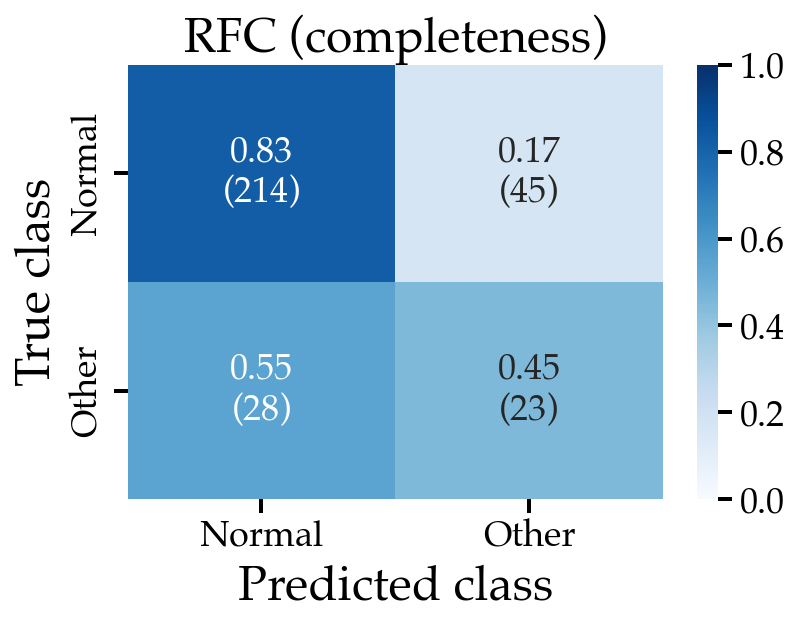

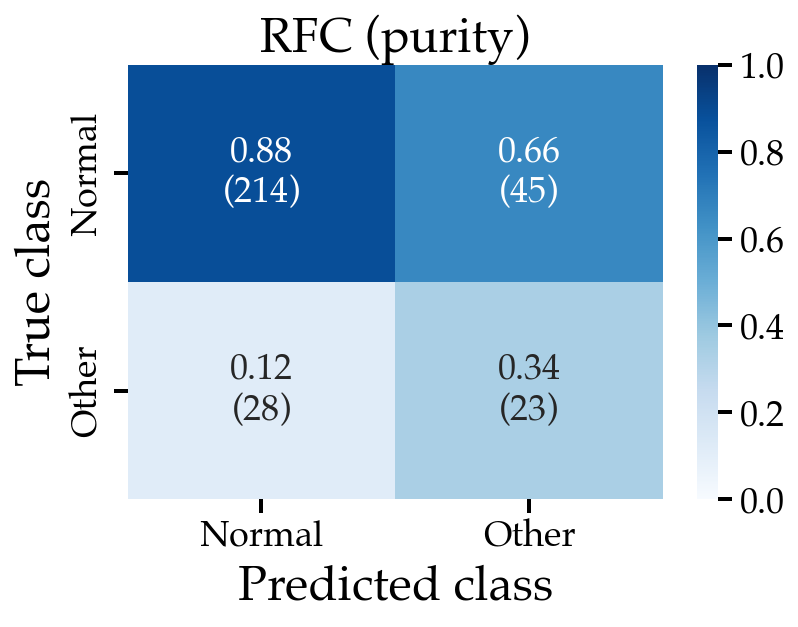

In [91]:
# Confusion matrices

#max_anom_score_thresh = 50
#spec_ysedr1_df = ysedr1_df[(ysedr1_df.spec_class != "NA") & (ysedr1_df.max_anom_score >= max_anom_score_thresh)]
spec_ysedr1_df = ysedr1_df[(ysedr1_df.spec_class != "NA")]

title='RFC'
true_labels = np.array(spec_ysedr1_df['spec_class_norm_anom'])
predicted_labels = np.array(spec_ysedr1_df['RFC_best_cls'])
# define the class labels
class_names = np.unique(true_labels)
nclasses = len(class_names)

KINDS = ['completeness', 'purity']
for KIND in KINDS:
    # Sims test set
    plot_conf_matrix(true_labels, predicted_labels, labels=class_names, 
             title=f'{title} ({KIND})', kind=KIND)
    plt.savefig(f'{cm_path}/confmatrix_YSEDR1_timeseries_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')
    #plt.savefig(f'{cm_path}/confmatrix_YSEDR1_timeseries_max_anom_score_geq_{max_anom_score_thresh}_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')
    #plt.savefig(f'{cm_path}/confmatrix_YSEDR1_fullLConly_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')

    plt.show()
    plt.close()

In [66]:
missclassified_df = spec_ysedr1_df[(spec_ysedr1_df["RFC_best_cls"] == "Other") & (spec_ysedr1_df["spec_class_norm_anom"] == "Normal")]
missclassified_df = missclassified_df.nlargest(45, 'max_anom_score')


In [96]:
Counter(missclassified_df.spec_class)

Counter({'SNIa-norm': 32, 'SNII': 9, 'SNIa-91T-like': 4})

In [67]:
for obj, score, spec, spec_norm_anom, rfc_cls in zip(missclassified_df.index, 
                                   missclassified_df.max_anom_score,
                                   missclassified_df["spec_class"], 
                                   missclassified_df["spec_class_norm_anom"], 
                                   missclassified_df.RFC_best_cls):
    print(f"https://ziggy.ucolick.org/yse/transient_detail/{obj}/", round(score, 1), spec, spec_norm_anom, rfc_cls)

https://ziggy.ucolick.org/yse/transient_detail/2020tip/ 90.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 89.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020qql/ 88.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020kbl/ 77.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021bpq/ 75.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021ojn/ 74.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 72.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020wfg/ 72.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020kpz/ 71.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021vwx/ 69.8 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021wue/ 68.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021ofq/ 68.0 SNIa-norm Normal Oth

## Vetting
https://ziggy.ucolick.org/yse/transient_detail/2020tip/ 90.0 SNIa-norm Normal Other -- 91T / 99aa like? weird b/c litte/no Si in spectrum...
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 89.0 SNIa-norm Normal Other -- Ia-norm spec. But slightly overluminous for Ia, -19.6 abs mag, z=0.127. Faint host.
https://ziggy.ucolick.org/yse/transient_detail/2020qql/ 88.0 SNIa-norm Normal Other -- Ia-norm spec. But slightly overluminous for Ia, -19.6 abs mag, z=0.076
https://ziggy.ucolick.org/yse/transient_detail/2020kbl/ 77.0 SNIa-norm Normal Other -- Ia-norm spec. But maxes out color on SALT fit c=0.3. In a merger/spiral gal? Not obviously elliptical.
https://ziggy.ucolick.org/yse/transient_detail/2021bpq/ 75.0 SNIa-norm Normal Other -- Ia-norm spec. IDK why, need to see timeseries evolution.
https://ziggy.ucolick.org/yse/transient_detail/2021ojn/ 74.0 SNIa-norm Normal Other -- Ia-norm spec. IDK why, need to see timeseries evolution. BUT it does have 4 spectra so someone thought it was interesting...
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 72.0 SNIa-norm Normal Other -- Ia-norm spec. But that z=0.12 puts abs mag ~ -20.6 mag. Ia-SC????
https://ziggy.ucolick.org/yse/transient_detail/2020wfg/ 72.0 SNIa-norm Normal Other -- Ia-norm spec to me...
https://ziggy.ucolick.org/yse/transient_detail/2020kpz/ 71.0 SNII Normal Other -- lasted 400d w/ pre-explosion data??
https://ziggy.ucolick.org/yse/transient_detail/2021vwx/ 69.8 SNIa-norm Normal Other  -- no 2nd bump, no rise. ParSNIP/SR also thought Ibc. SALT fit is even bad. Spec is def Ia norm though.
https://ziggy.ucolick.org/yse/transient_detail/2021wue/ 68.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021ofq/ 68.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021vaw/ 66.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021vcz/ 65.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020tlf/ 64.0 SNII Normal Other -- we know this one is interesting! ;)
https://ziggy.ucolick.org/yse/transient_detail/2021xjh/ 64.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021joz/ 64.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021aff/ 63.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021cta/ 63.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020ulz/ 60.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2019ppi/ 60.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021arl/ 59.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020vbj/ 57.7 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020sia/ 57.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021jof/ 56.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021tup/ 56.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020hgw/ 56.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021mwb/ 56.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020lrr/ 56.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020psv/ 56.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020row/ 55.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021nue/ 55.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021idh/ 54.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020tug/ 54.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020juq/ 53.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020tly/ 53.0 SNII Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021sbc/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021acza/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021sld/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021hol/ 52.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021mfy/ 51.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021tsj/ 51.9 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020duv/ 51.0 SNIa-91T-like Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2021hem/ 51.0 SNIa-norm Normal Other
https://ziggy.ucolick.org/yse/transient_detail/2020hr/ 50.0 SNIa-norm Normal Other

In [92]:
correct_classified_df = spec_ysedr1_df[(spec_ysedr1_df["RFC_best_cls"] == "Other") & (spec_ysedr1_df["spec_class_norm_anom"] == "Other")]
correct_classified_df = correct_classified_df.nlargest(45, 'max_anom_score')
correct_classified_df

,RFC_best_cls,max_anom_score,spec_class,spec_class_norm_anom
Disc. Internal Name,,,,
2020xsy,Other,97.996736,SLSN-II,Other
2021nxq,Other,88.986134,SLSN-I,Other
2020opy,Other,88.971764,TDE,Other
2021hrj,Other,87.975165,SNIb,Other
2021bmv,Other,84.981029,SNIIn,Other
2021aadc,Other,84.957548,SLSN-II,Other
2020qmj,Other,82.000000,SNIIn,Other
2020kre,Other,81.976290,SNIa-CSM,Other
2021too,Other,81.940168,SNIc-BL,Other


In [94]:
Counter(ysedr1_df.spec_class)

Counter({'NA': 843,
         'SNIIn': 8,
         'SNIa-91T-like': 11,
         'SNII': 52,
         'SNIa-norm': 195,
         'SNIIb': 7,
         'SNIc-BL': 3,
         'SNIb': 5,
         'Other': 1,
         'SNIbn': 2,
         'TDE': 3,
         'LBV': 1,
         'SNIc': 7,
         'SNIb-pec': 2,
         'SNIa-CSM': 3,
         'SNIa-91bg-like': 1,
         'SN': 4,
         'SNIa-SC': 1,
         'SLSN-II': 2,
         'SLSN-I': 1,
         'SNIax': 1})

In [95]:
Counter(correct_classified_df.spec_class)

Counter({'SLSN-II': 2,
         'SLSN-I': 1,
         'TDE': 1,
         'SNIb': 2,
         'SNIIn': 6,
         'SNIa-CSM': 1,
         'SNIc-BL': 1,
         'SNIIb': 4,
         'SNIb-pec': 1,
         'SN': 2,
         'Other': 1,
         'SNIa-SC': 1})

### correctly classified by class
'SLSN-II': 2/2,
 'SLSN-I': 1/1,
 'TDE': 1/3,
 'SNIb': 2/5,
 'SNIIn': 6/8,
 'SNIa-CSM': 1/3,
 'SNIc-BL': 1/3,
 'SNIIb': 4/7,
 'SNIb-pec': 1/2,
 'SN': 2/4,
 'Other': 1/1,
 'SNIa-SC': 1/1}

In [89]:
# full LC only
higest_anom_score_df = ysedr1_df.nlargest(50, 'max_anom_score')

for obj, score, spec, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df["spec_class"], 
                                   #higest_anom_score_df["Obj. Type 2cls"], 
                                   higest_anom_score_df.RFC_best_cls):
    print(f"https://ziggy.ucolick.org/yse/transient_detail/{obj}/", round(score, 1), spec, rfc_cls)

https://ziggy.ucolick.org/yse/transient_detail/2020xsy/ 91.0 SLSN-II Other
https://ziggy.ucolick.org/yse/transient_detail/2020acyu/ 89.0 NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021bmv/ 81.0 SNIIn Other
https://ziggy.ucolick.org/yse/transient_detail/2020qmj/ 79.0 SNIIn Other
https://ziggy.ucolick.org/yse/transient_detail/2020jvi/ 72.0 NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020kmj/ 71.0 NA Other
https://ziggy.ucolick.org/yse/transient_detail/2021dpa/ 70.0 NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020kvl/ 70.0 SNIa-norm Other
https://ziggy.ucolick.org/yse/transient_detail/2021aadc/ 67.0 SLSN-II Other
https://ziggy.ucolick.org/yse/transient_detail/2020kre/ 66.0 SNIa-CSM Other
https://ziggy.ucolick.org/yse/transient_detail/2020wwt/ 65.0 NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020kps/ 64.0 NA Other
https://ziggy.ucolick.org/yse/transient_detail/2020qkx/ 61.0 SNIa-norm Other
https://ziggy.ucolick.org/yse/transient_detail/2021g

In [ ]:
for obj, score, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df.RFC_best_cls):
    print(rfc_cls)
    plot_RFC_prob_vs_lc_ztfid(anom_ztfid=obj, 
                              anom_thresh=50, 
                              df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/repo/notebooks/YSEDR1/timeseries",
                             )
    print("%%%%%%%%%%%%")

In [80]:
spec_classes_l = []
for meta in full_meta_list:
    spec_classes_l.append(meta["transient_spec_class"])
    
np.unique(spec_classes_l)

array(['LBV', 'LRN', 'NA', 'Other', 'SLSN-I', 'SLSN-II', 'SN', 'SNII',
       'SNIIb', 'SNIIn', 'SNIa-91T-like', 'SNIa-91bg-like', 'SNIa-CSM',
       'SNIa-SC', 'SNIa-norm', 'SNIax', 'SNIb', 'SNIb-pec', 'SNIbn',
       'SNIc', 'SNIc-BL', 'TDE'], dtype='<U14')

In [28]:
di  = {'CV': 'Other', 
      'SLSN-I': 'Other', 
      'SLSN-II': 'Other', 
      'SNII': 'Normal', 
      'SNIIP': 'Normal', 
      'SNIIb': 'Other', 
      'SNIIn': 'Other',
      'SNII-pec': 'Other',
      'SNIa-norm': 'Normal', 
      'SNIa-91T-like': 'Normal', 
      'SNIa-CSM': 'Other',
      'SNIa-SC': 'Other',
      'SNIa-91bg-like': 'Normal',
      'SNIax[02cx-like]': 'Other',
      'SNIax': 'Other'
      'SNIa-pec': 'Other', 
      'SNIb': 'Other',
      'SNIb-pec': 'Other',
      'SNIb/c': 'Other',
      'SNIbn': 'Other',
      'SNIc': 'Other',
      'SNIc-BL': 'Other', 
      'SNIcn': 'Other',
      'TDE': 'Other',
      'None': 'Other',
      'SN': 'Other',
      'SNI': 'Other',
      'Other': 'Other',
      'LBV': 'Other'
      'LRN': 'Other'
      'NA': 'NA'}

merged_df["Obj. Type 2cls"] = ysedr1_df["Obj. Type"].copy()
merged_df = ysedr1_df.replace({"Obj. Type 2cls": di})
merged_df

,Name,RA,DEC,Obj. Type,Redshift,Host Name,Host Redshift,Reporting Group/s,Discovery Data Source/s,Classifying Group/s,...,Discovery Filter,Discovery Date (UT),Sender,Remarks,Discovery Bibcode,Classification Bibcodes,Ext. catalog/s,RFC_best_cls,max_anom_score,Obj. Type 2cls
Disc. Internal Name,,,,,,,,,,,,,,,,,,,,,
ZTF20acdalpf,SN 2020uma,22:28:50.948,+44:38:05.12,SN Ia,0.0760,NaN,NaN,"ZTF, Pan-STARRS","ZTF, Pan-STARRS",ZTF,...,g-ZTF,2020-09-23 06:14:24.000,ZTF_Bot1,NaN,2020TNSTR2971....1D,2020TNSCR2973....1D,NaN,Normal,26.000000,Normal
ZTF20acexvcz,SN 2020ugv,01:53:30.936,+01:33:26.12,SN Ia,0.1000,SDSS J015331.03+013324.4,0.068,"ALeRCE, ZTF",ZTF,ZTF,...,g-ZTF,2020-09-24 07:25:17.999,ALeRCE,NaN,2020TNSTR2941....1F,2020TNSCR3289....1D,NaN,Normal,44.992851,Normal
ZTF20acdnmpv,SN 2020uca,19:43:28.840,+65:11:33.55,SN Ia,0.0650,NaN,NaN,"SGLF, ZTF, ATLAS","ZTF, ATLAS",ZTF,...,r-ZTF,2020-09-21 03:38:43.000,Perez-Fournon,NaN,2020TNSTR2922....1A,2020TNSCR3140....1G,NaN,Normal,14.000000,Normal
ZTF20acctbbw,SN 2020tzl,02:18:40.800,+50:47:13.03,SN Ia,0.0500,WISEA J021840.75+504712.5,NaN,"ALeRCE, ATLAS","ZTF, ATLAS",ZTF,...,r-ZTF,2020-09-20 08:51:28.996,ALeRCE,NaN,2020TNSTR2887....1F,2020TNSCR3289....1D,NaN,Normal,24.000000,Normal
ZTF20acbeanu,SN 2020txg,01:02:28.857,-12:47:59.99,SN Ia,0.0600,NaN,NaN,"ZTF, ATLAS","ZTF, ATLAS",ZTF,...,r-ZTF,2020-09-21 08:24:11.232,ZTF_AMPEL_COMPLETE,NaN,2020TNSTR2900....1N,2020TNSCR2954....1D,NaN,Normal,30.994228,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18aaqqoqs,SN 2018cbh,13:51:52.890,+47:15:25.16,SN Ia-91T-like,0.0800,NaN,NaN,ZTF,ZTF,ZTF,...,g-ZTF,2018-05-06 05:19:40.000,ZTF_Bot1,NaN,2018TNSTR.719....1F,2019TNSCR.826....1F,NaN,Normal,9.000000,Normal
ZTF18aataafd,SN 2018cbf,14:19:20.942,+36:10:19.53,SN Ia,0.0770,NaN,NaN,"ZTF, Pan-STARRS","ZTF, Pan-STARRS",ZTF,...,g-ZTF,2018-05-10 07:39:21.000,ZTF_Bot1,NaN,2018TNSTR.719....1F,2018TNSCR1071....1F,NaN,Normal,7.000000,Normal
ZTF18aavnvmp,SN 2018bxr,13:38:47.280,+30:57:34.50,SN Ia,0.0640,NaN,NaN,"ZTF, ATLAS","ZTF, ATLAS",ZTF,...,r-ZTF,2018-05-19 06:28:48.000,ZTF_Bot1,NaN,2018TNSTR.705....1F,2018TNSCR1071....1F,NaN,Normal,22.996407,Normal


In [81]:
ysedr1_df['RFC_best_cls']

Disc. Internal Name
2020van     Normal
2020mvu     Normal
2020olk     Normal
2021bbp     Normal
2020qmj      Other
             ...  
2020glj     Normal
2021afg     Normal
2021adnv    Normal
2020xye     Normal
2021aaej    Normal
Name: RFC_best_cls, Length: 802, dtype: object

SN IIb Other Other
Prediction doesn't exceed anom_threshold of 50% for ZTF19aapadxs.
max_anom_score = 89.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aapadxs


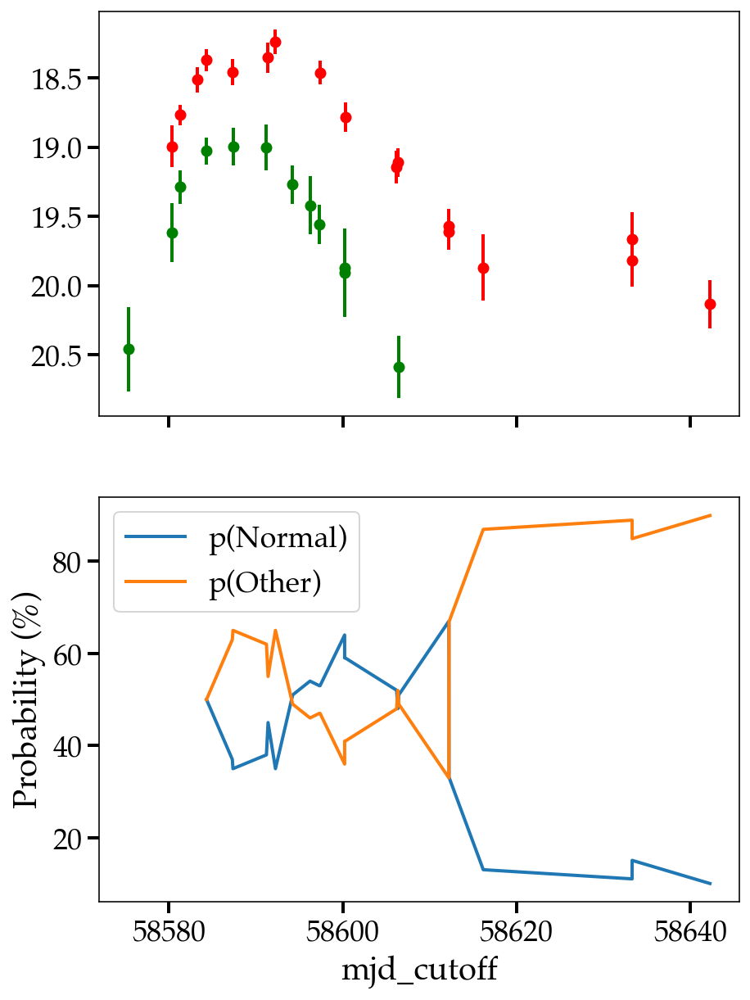

%%%%%%%%%%%%
SN Ic Other Other
max_anom_score = 87.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abcegvm


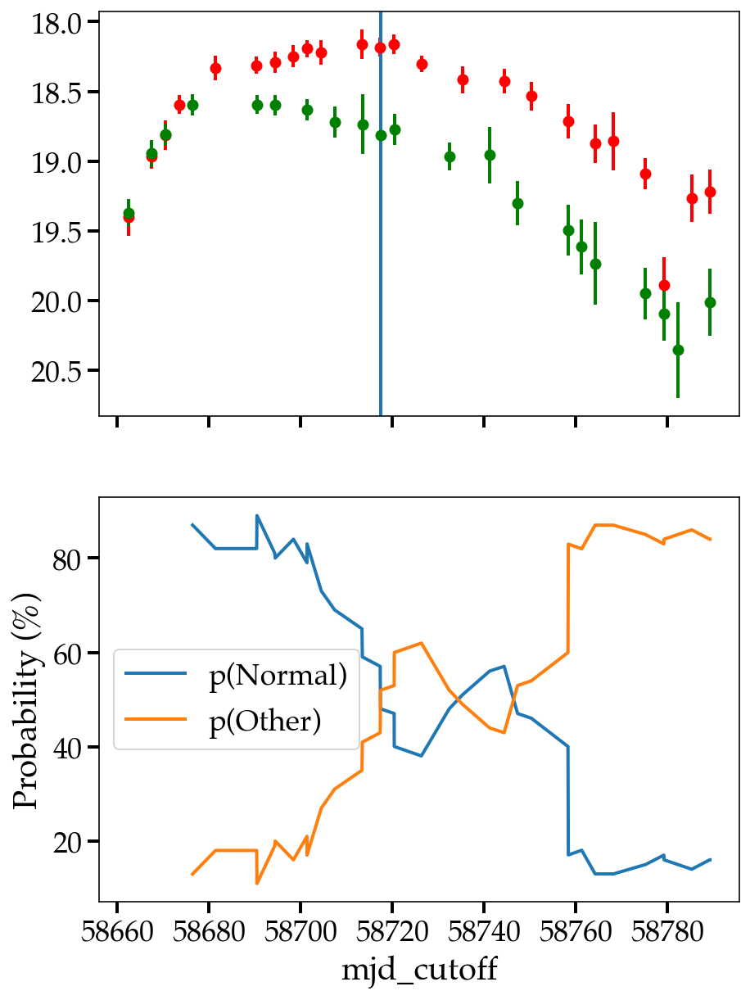

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 83.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aafljiq


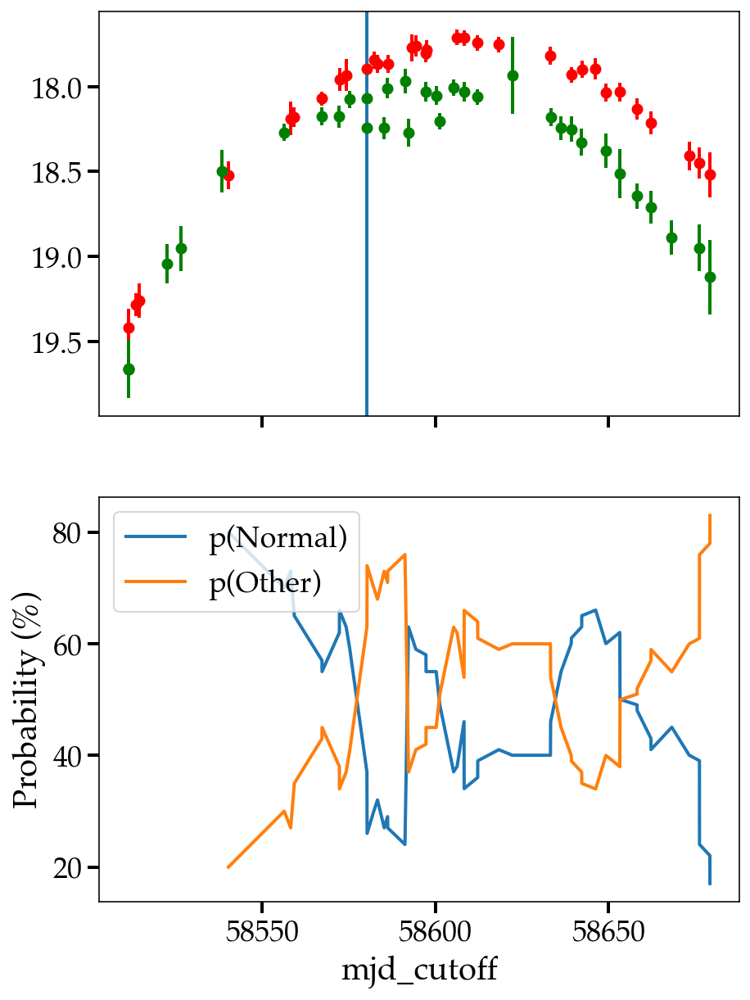

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 83.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aajbsxt


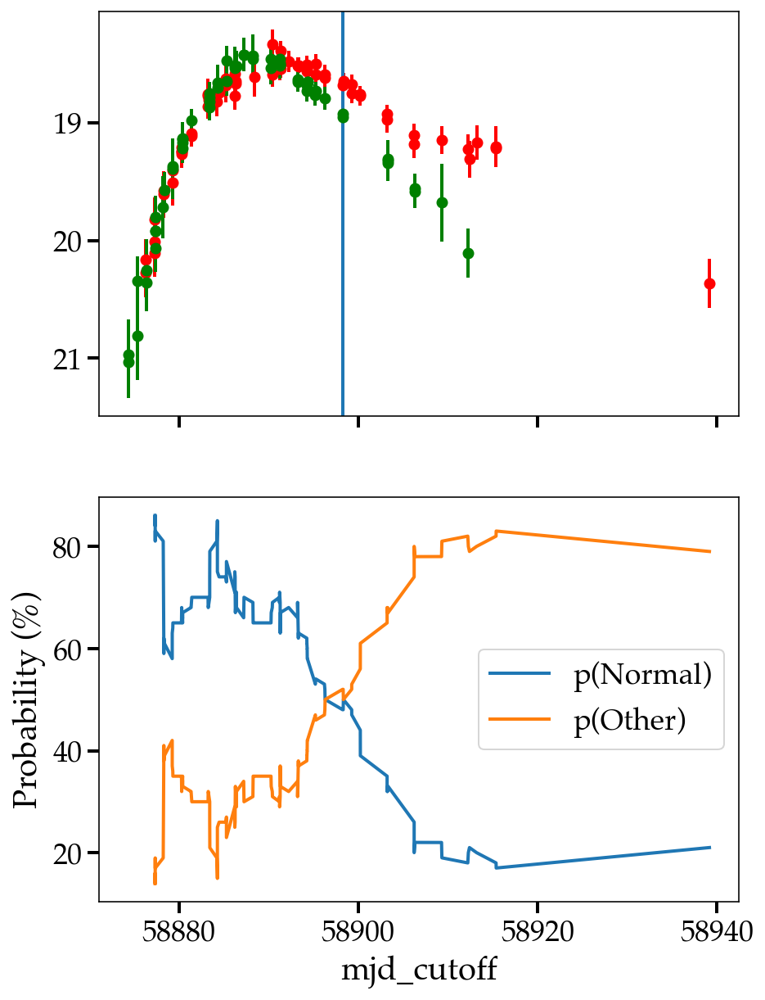

%%%%%%%%%%%%
SN II Normal Other
max_anom_score = 84.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abdkgwo


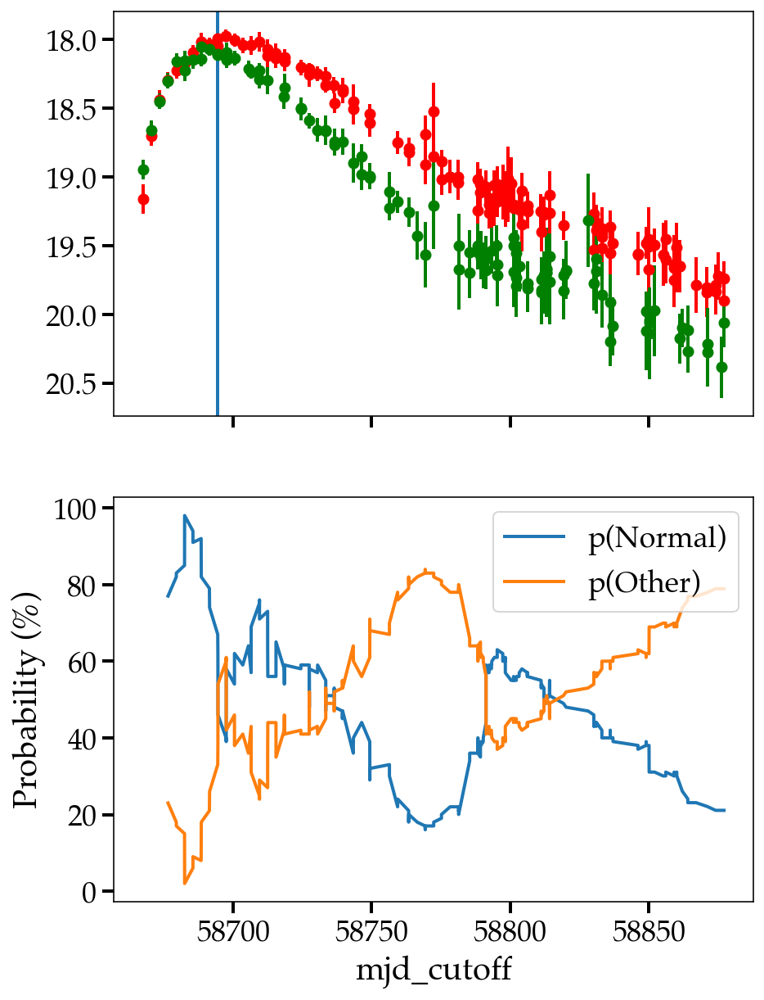

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 82.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19adcfsoc


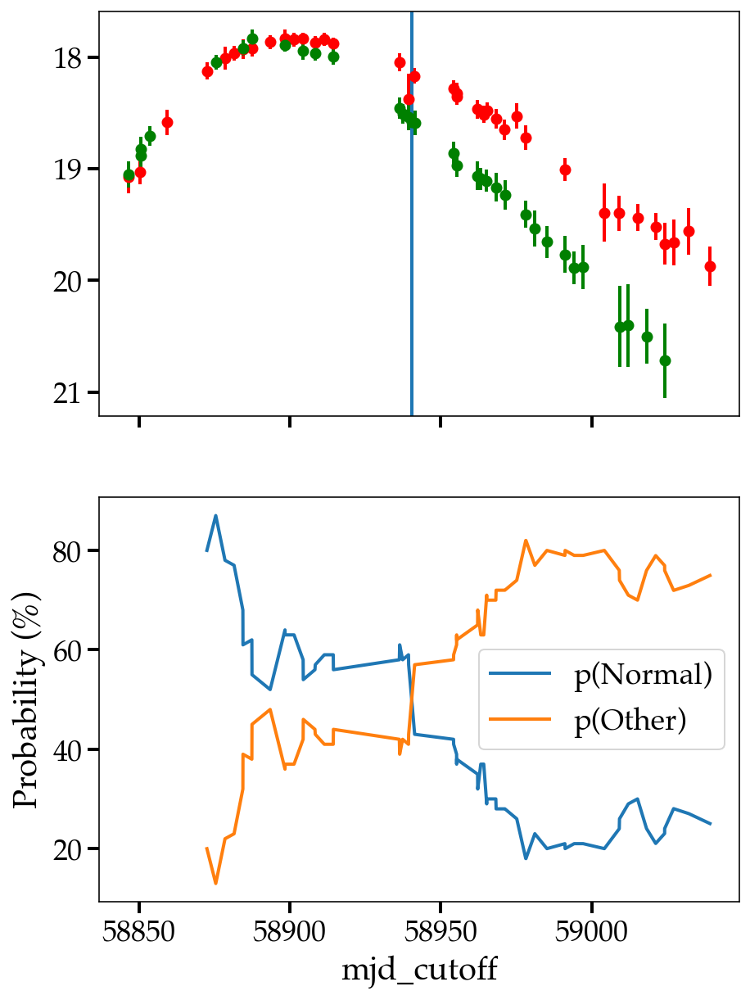

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 74.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abxfiev


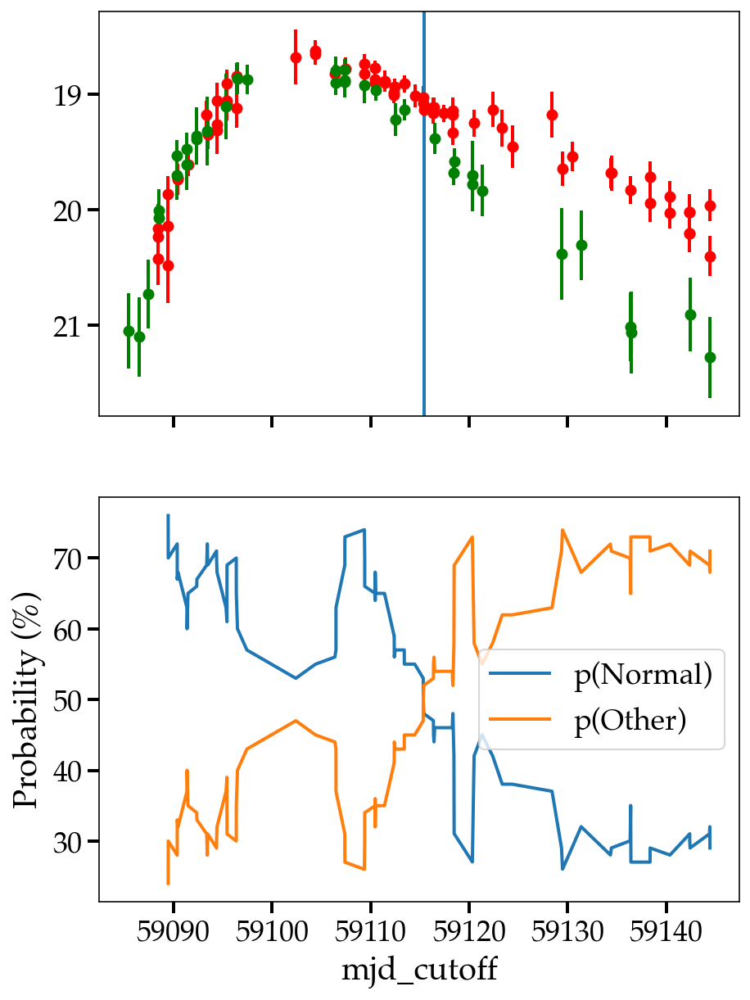

%%%%%%%%%%%%
SN II Normal Other
max_anom_score = 70.6


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abhduuo


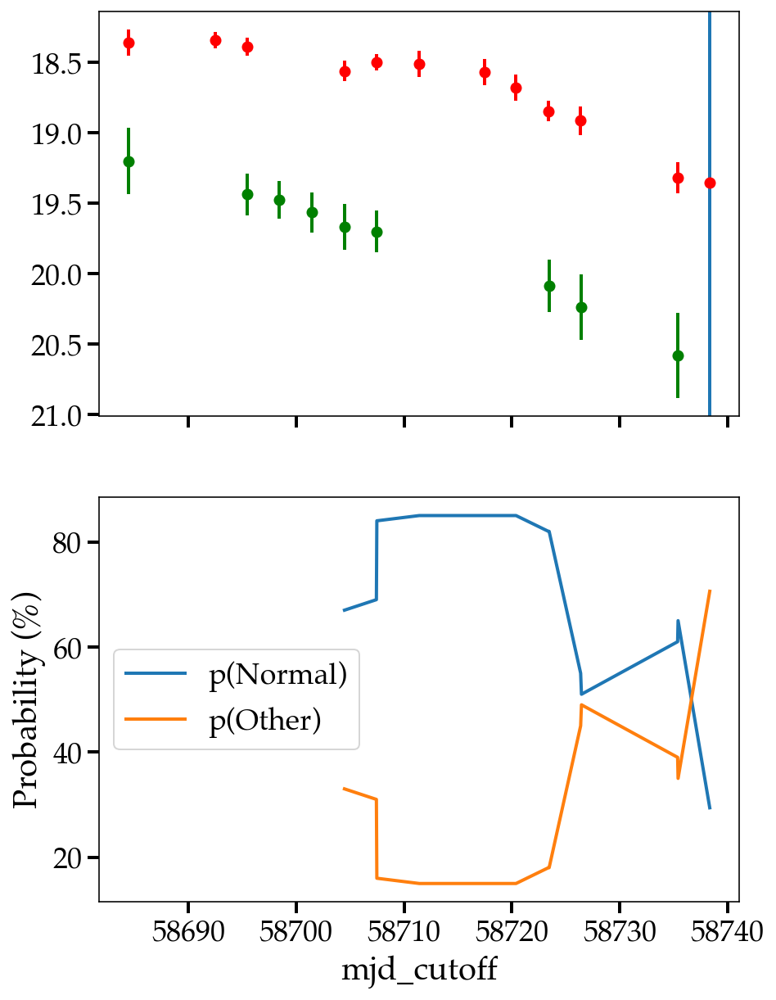

%%%%%%%%%%%%
SN IIn Other Other
max_anom_score = 70.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aalbfga


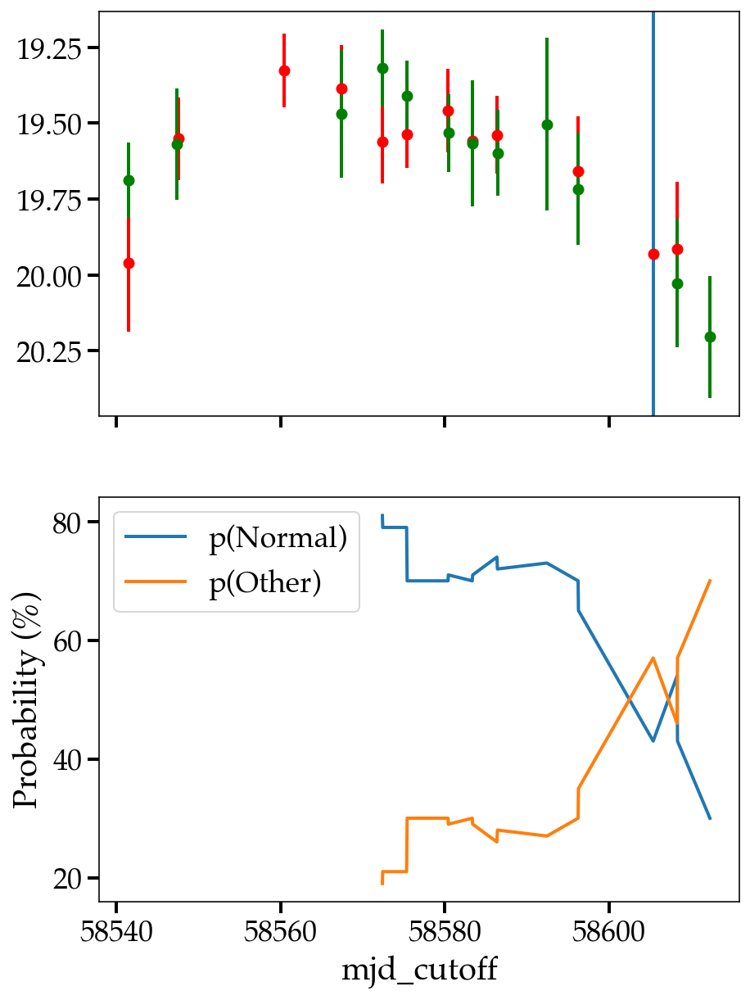

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 73.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abjkxwa


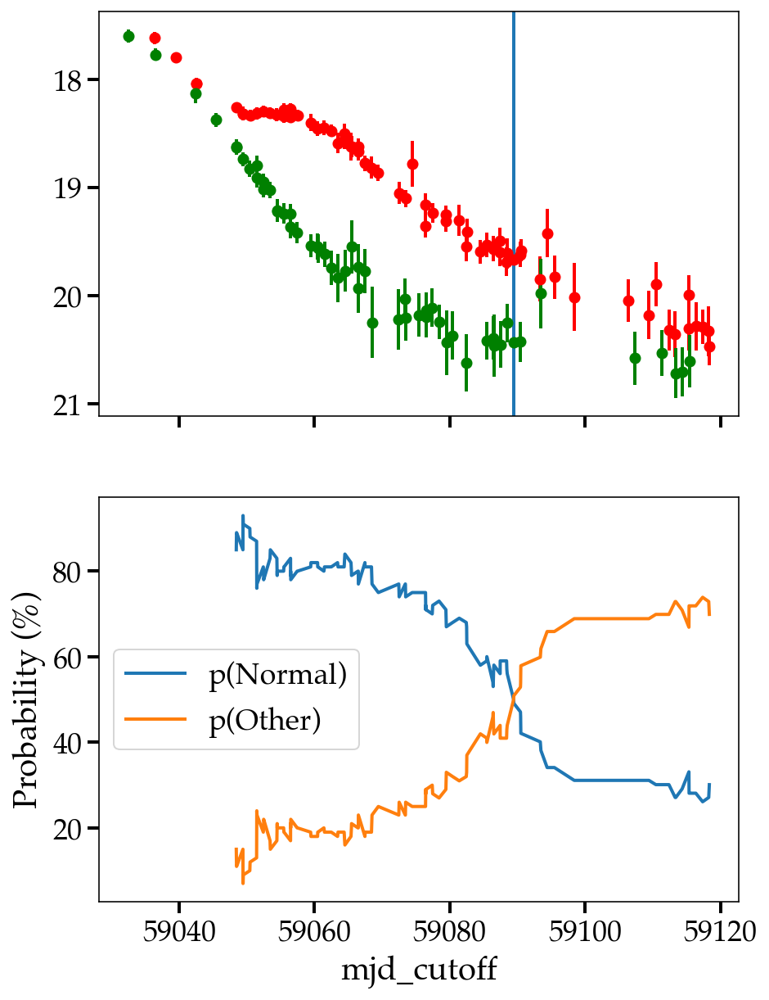

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 85.6


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acbpxwt


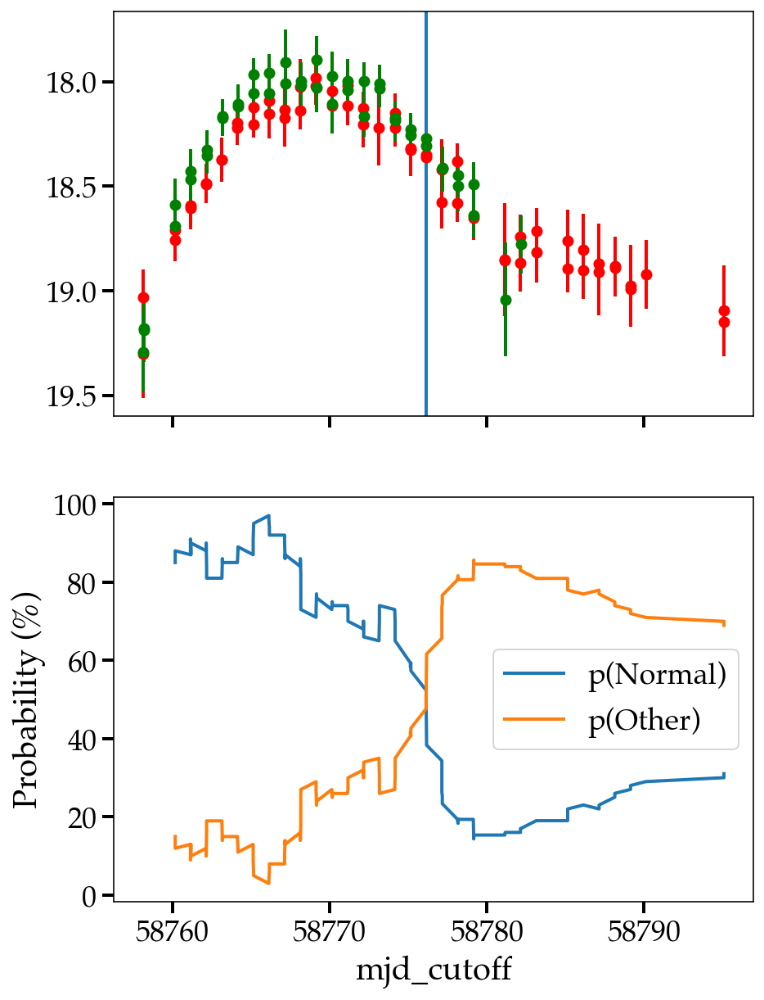

%%%%%%%%%%%%
SN II Normal Other
max_anom_score = 69.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


https://alerce.online/object/ZTF19abcejsg


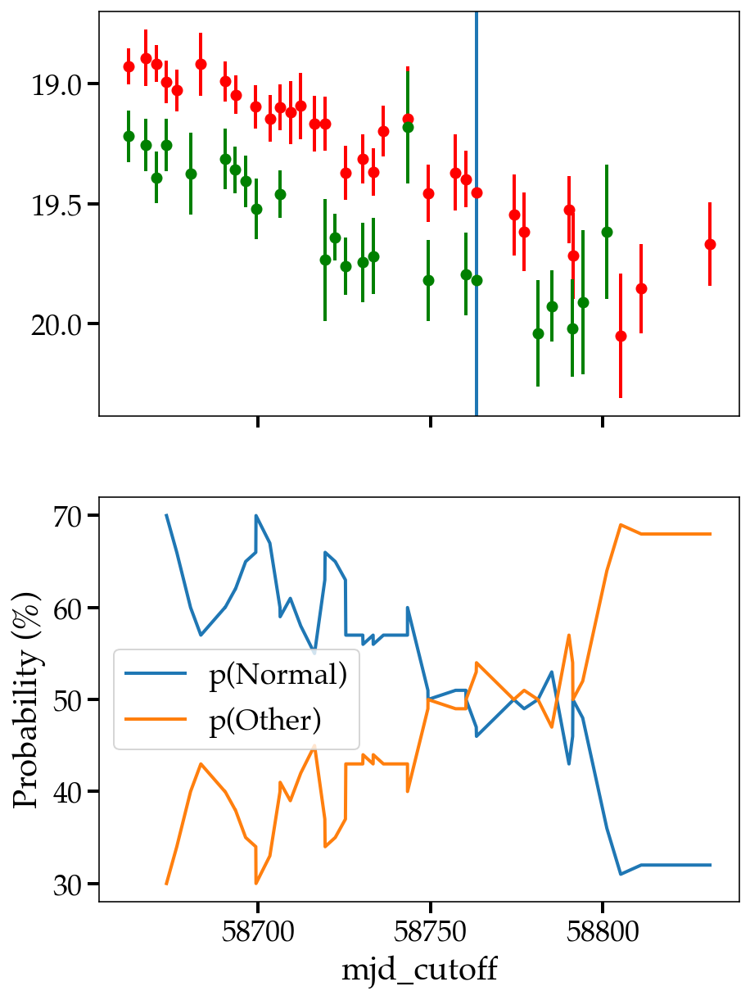

%%%%%%%%%%%%
SN Ib Other Other
max_anom_score = 68.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abztknu


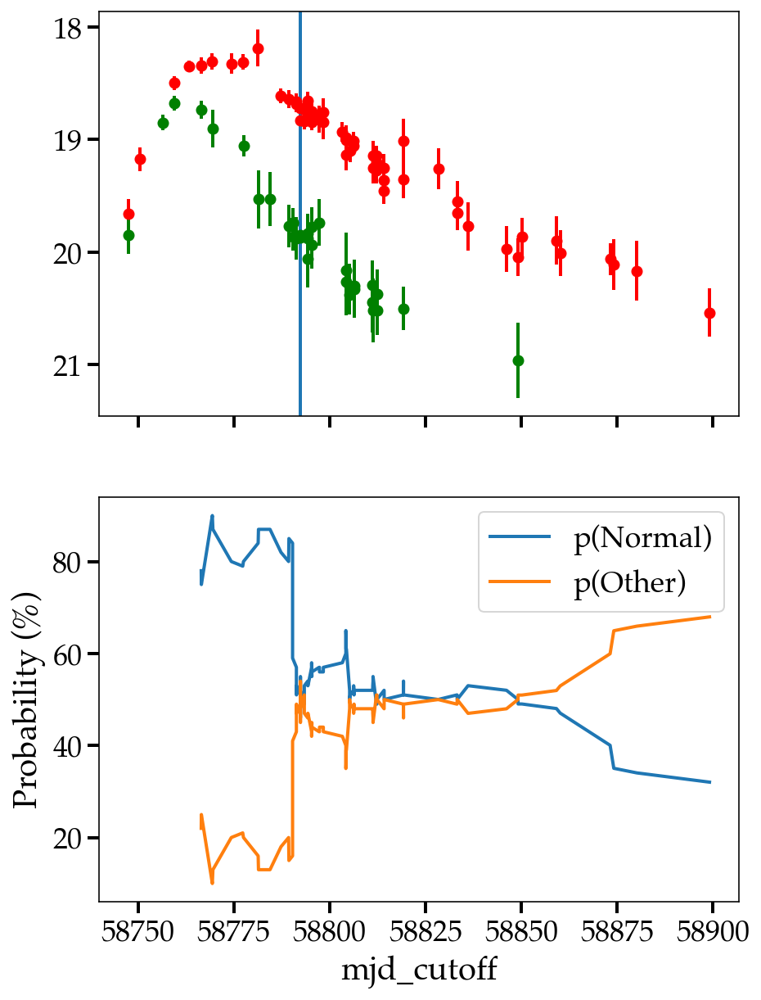

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 67.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acfsqjx


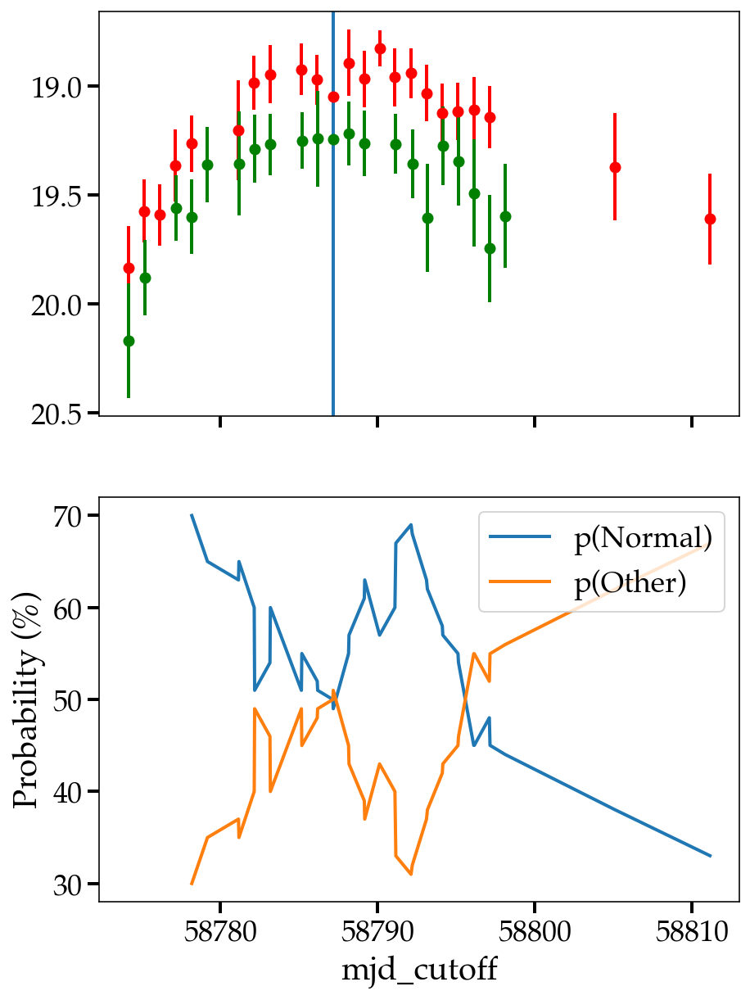

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 66.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aaaxrad


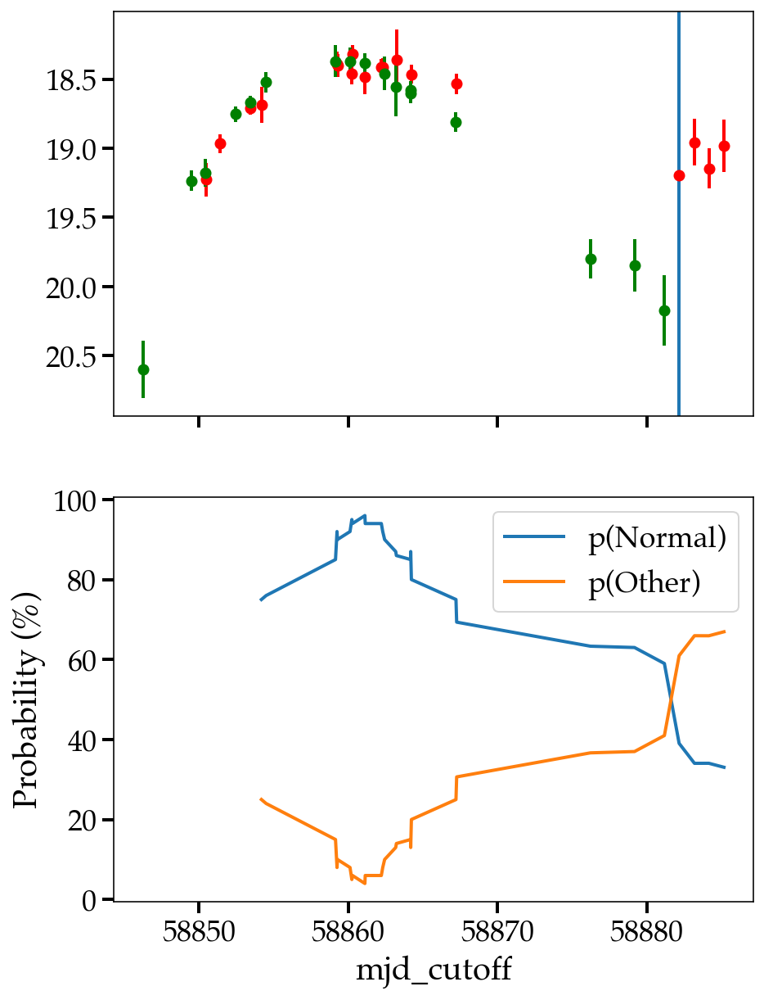

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 70.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aamrais


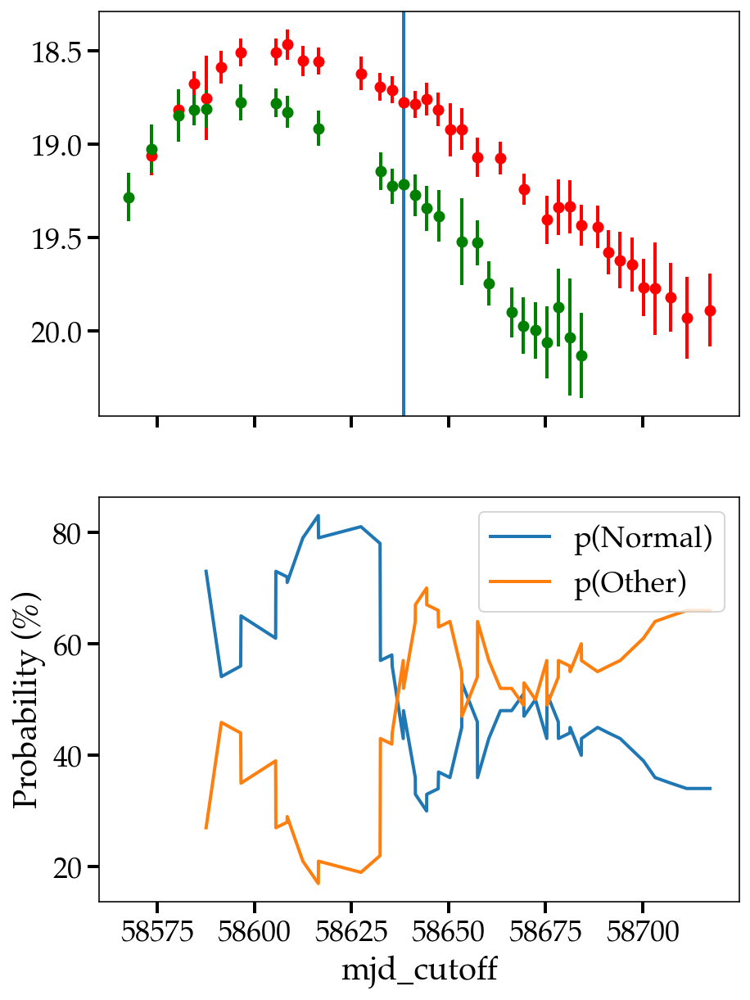

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 66.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acklbjr


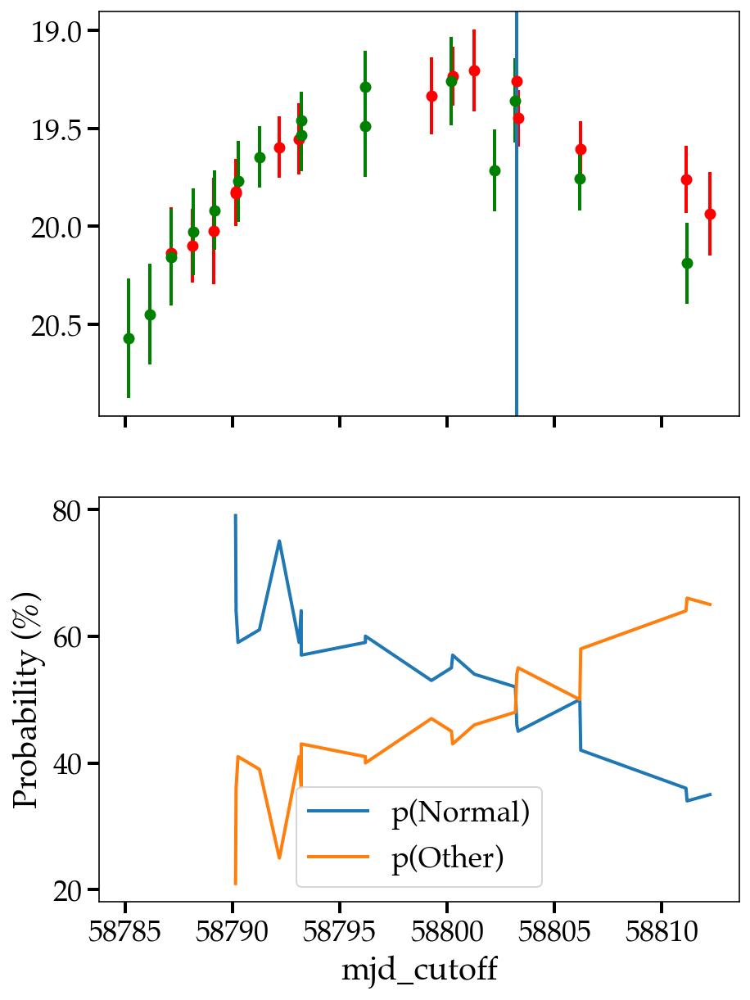

%%%%%%%%%%%%
SN Ia Normal Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20abpyxja.
max_anom_score = 77.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abpyxja


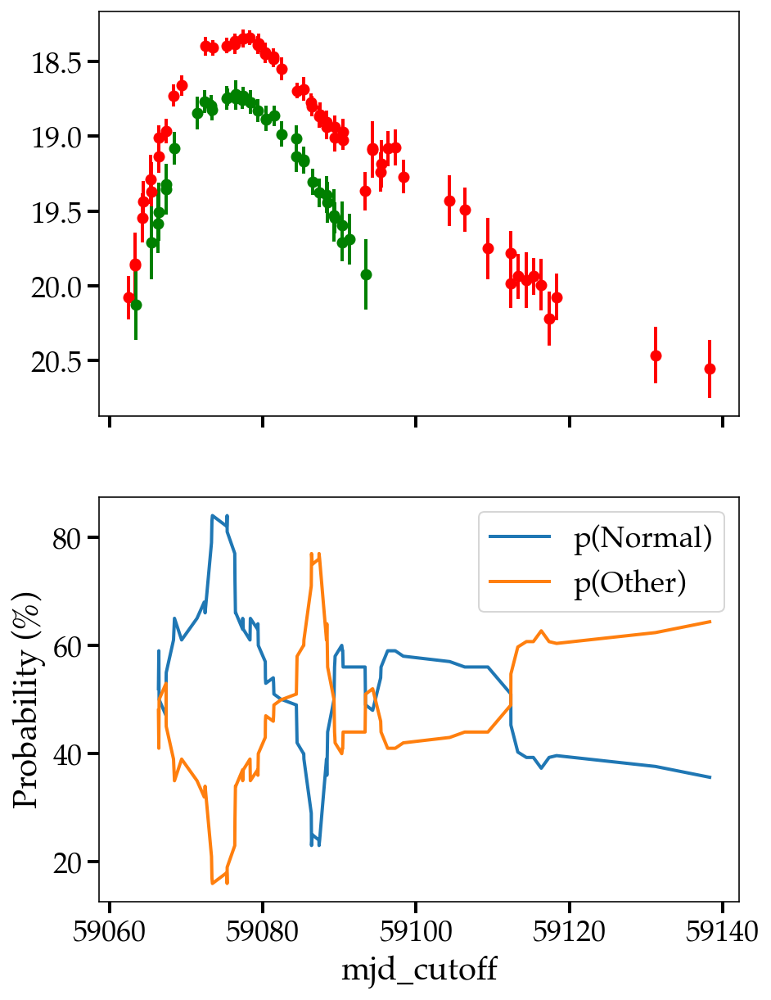

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 65.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abipuee


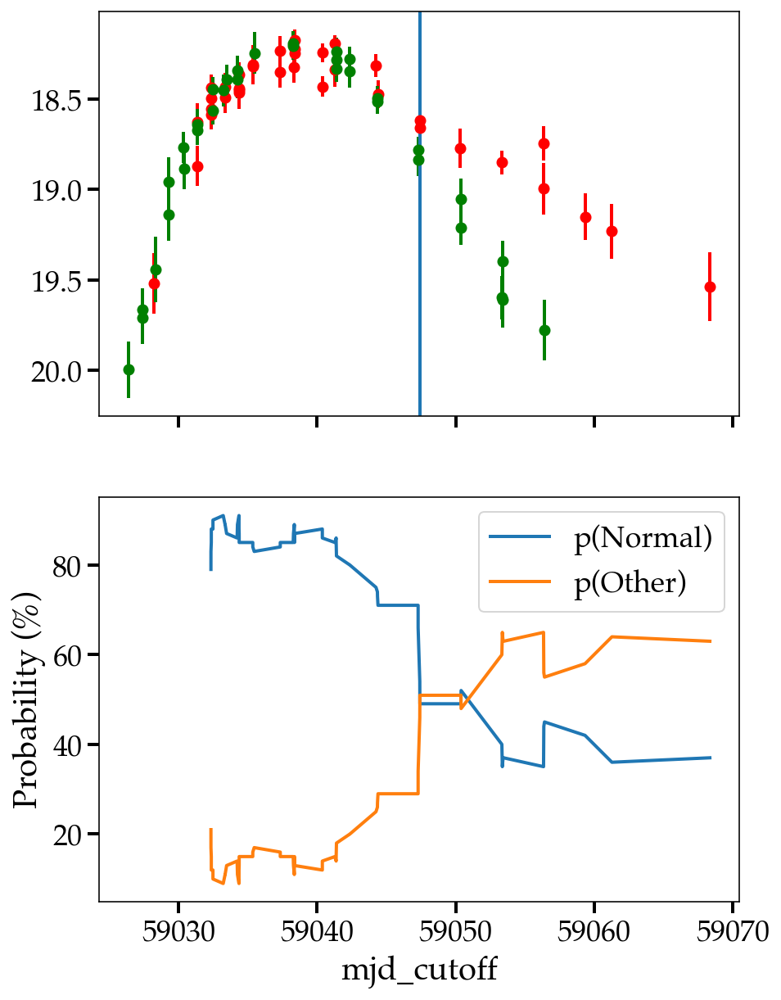

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 71.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aadcbvz


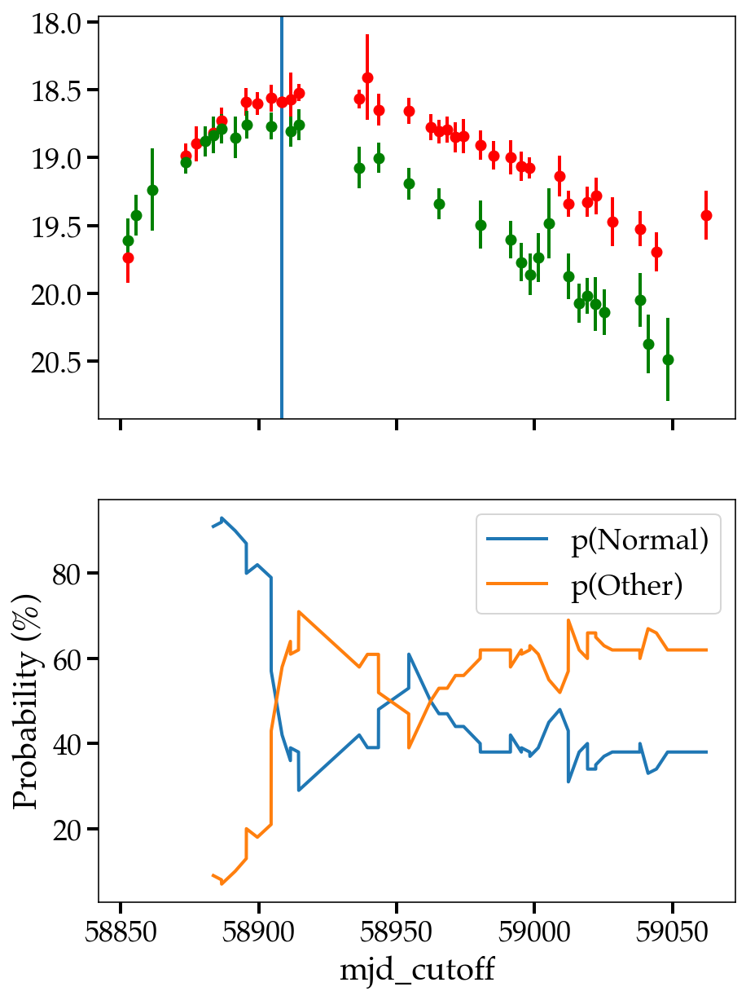

%%%%%%%%%%%%
SN IIn Other Other
max_anom_score = 62.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aadyyvk


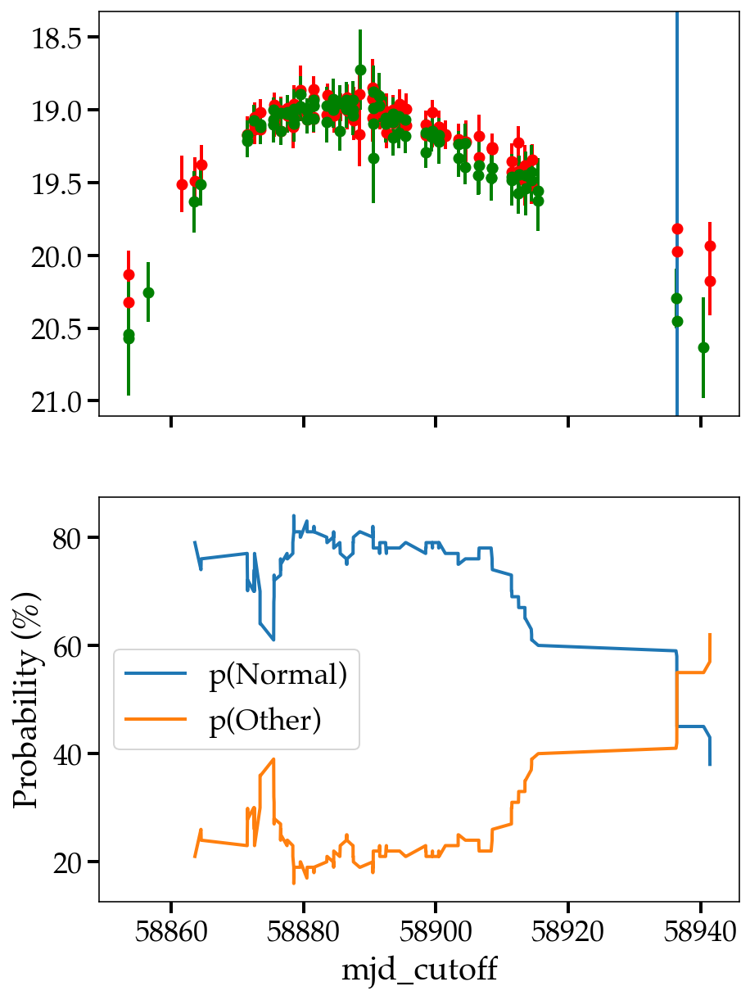

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 72.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aalbrgu


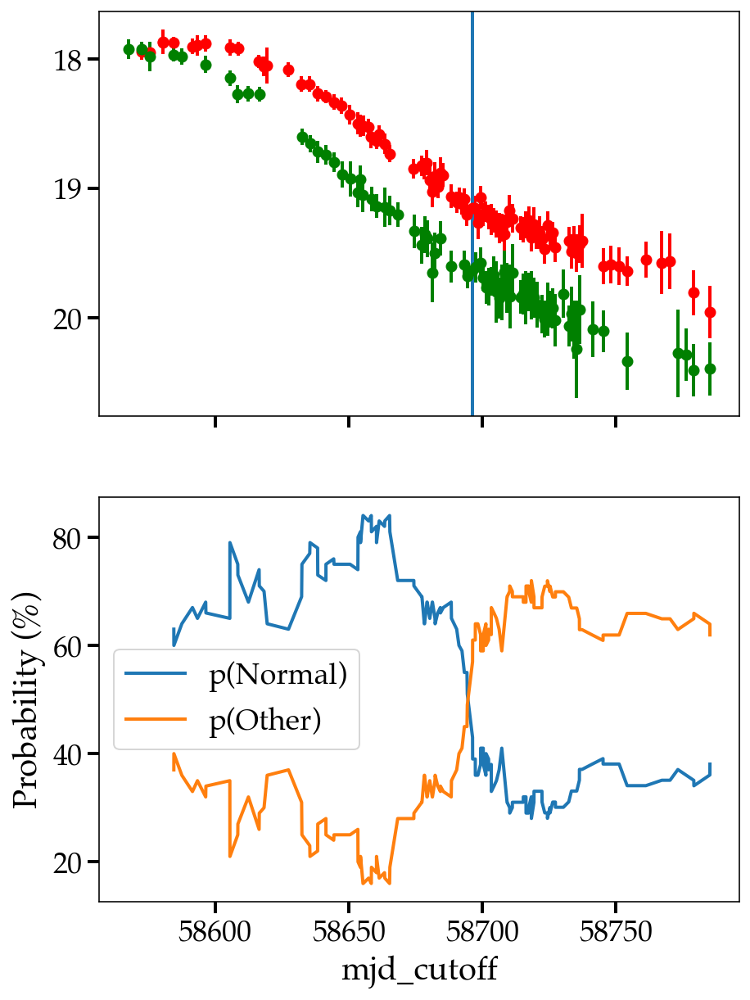

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 61.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abxmgny


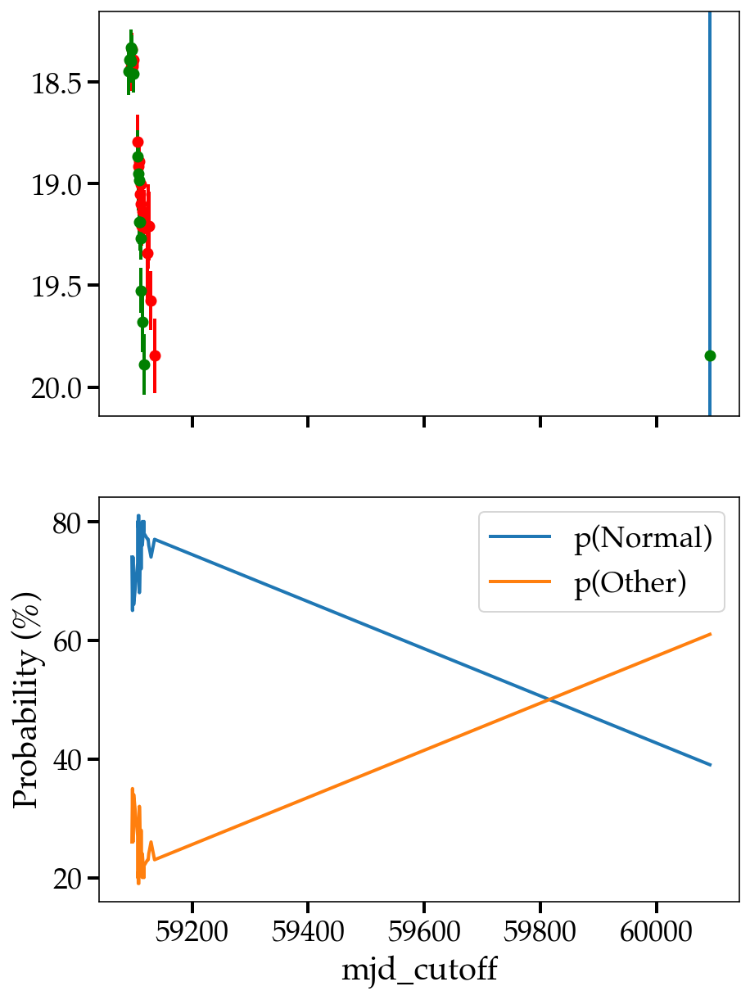

%%%%%%%%%%%%
SN Ic Other Other
max_anom_score = 60.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


https://alerce.online/object/ZTF20abvvnqh


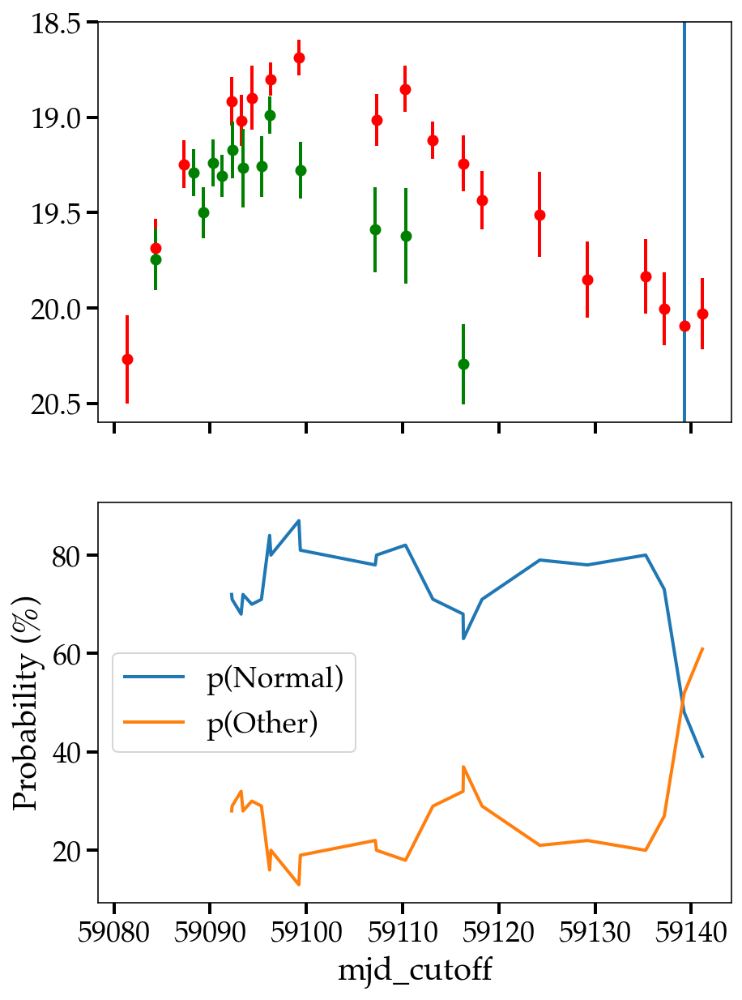

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 60.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abowcic


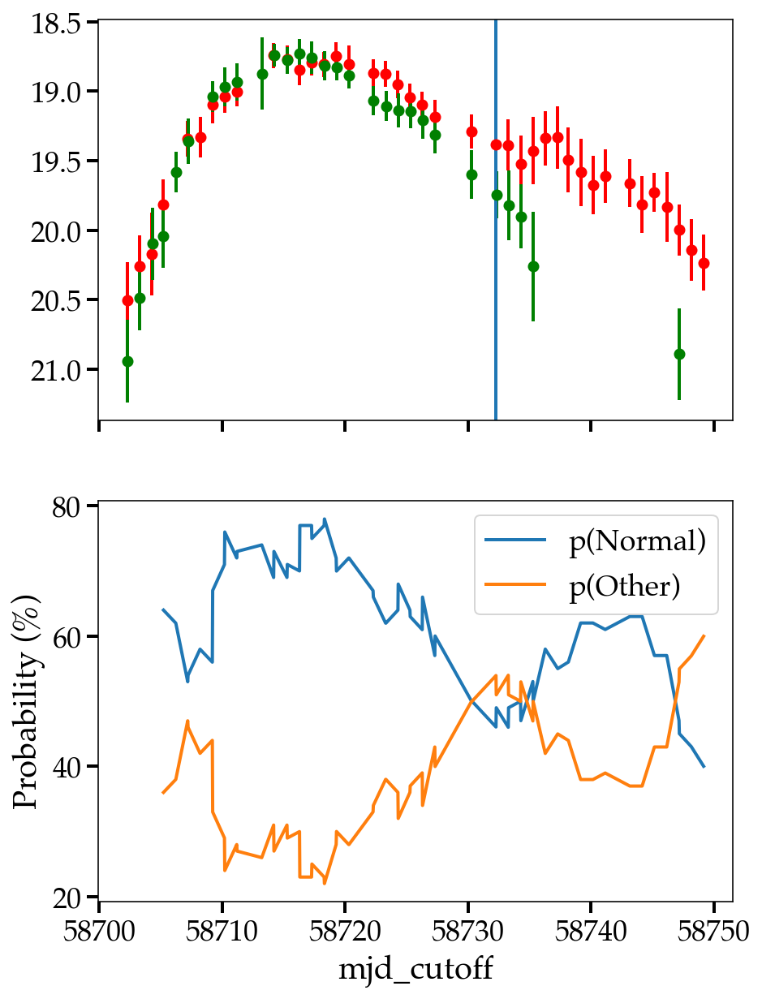

%%%%%%%%%%%%
SN II Normal Other
max_anom_score = 60.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abfcdkj


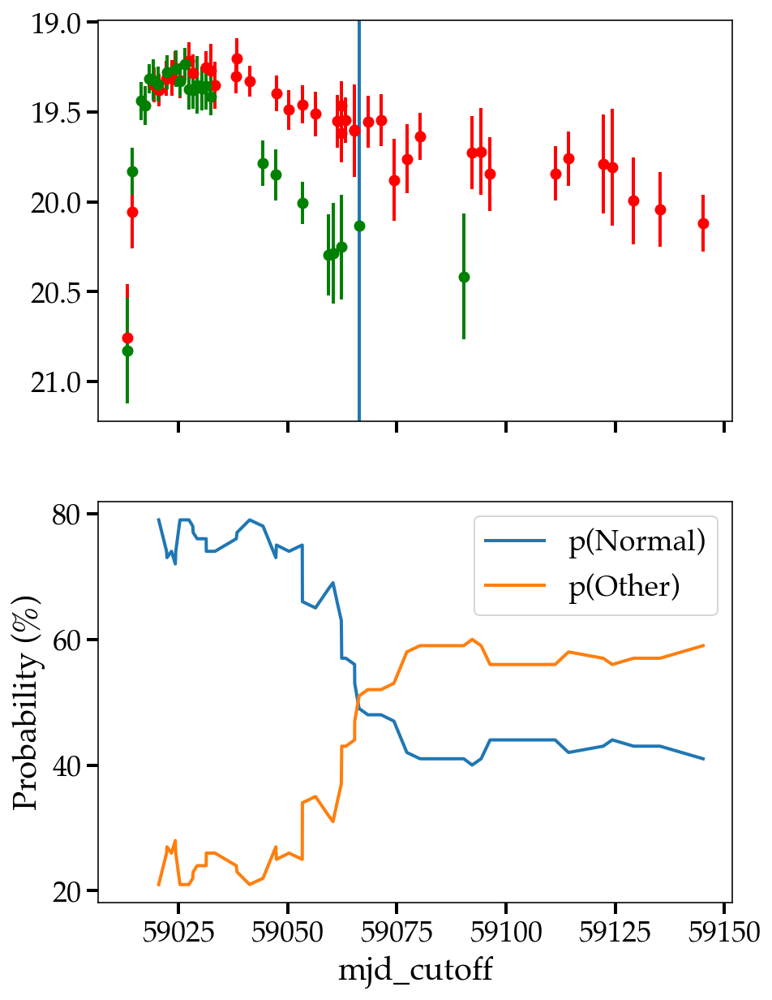

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 62.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acetxvq


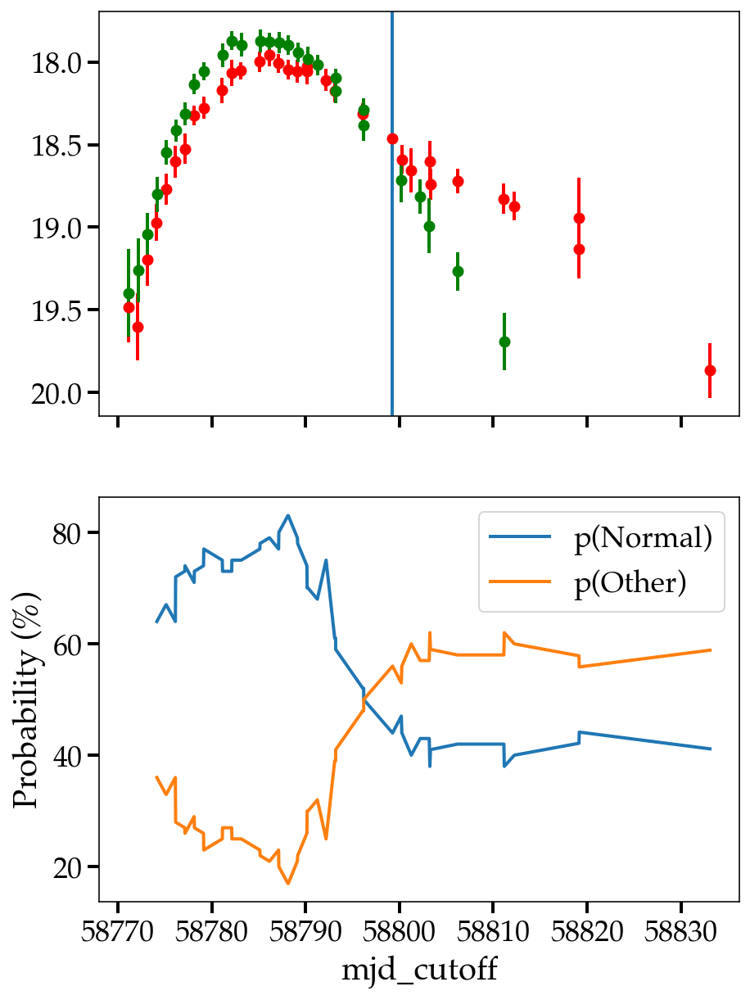

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 62.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aayxkqy


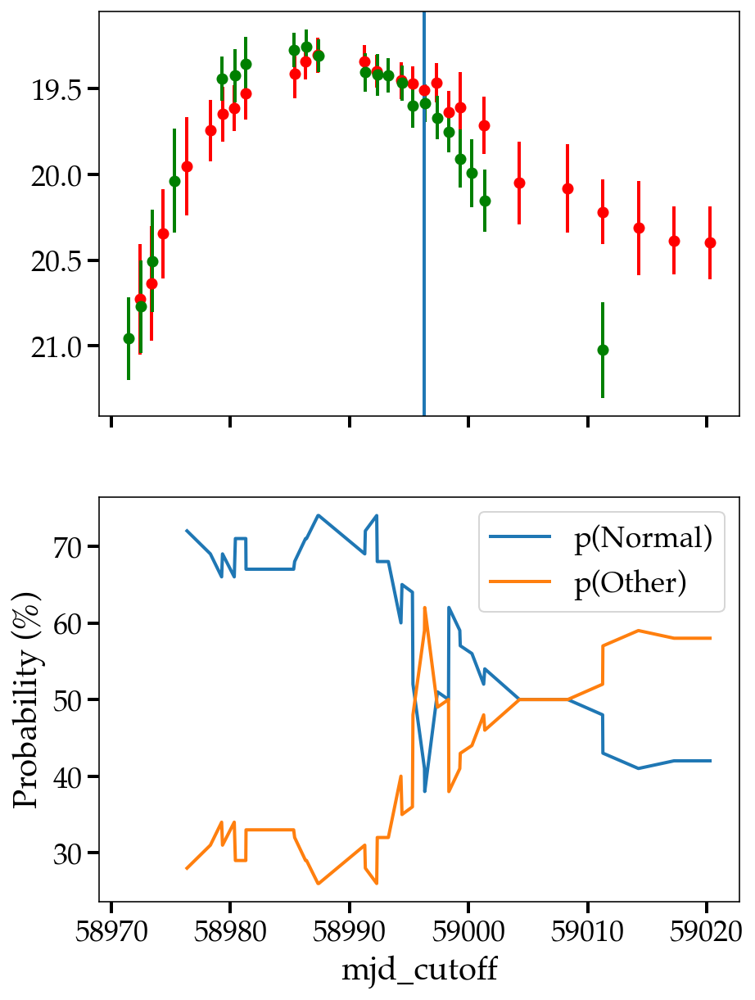

%%%%%%%%%%%%
SN Ia-pec Other Other
Prediction doesn't exceed anom_threshold of 50% for ZTF19acbmddl.
max_anom_score = 58.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acbmddl


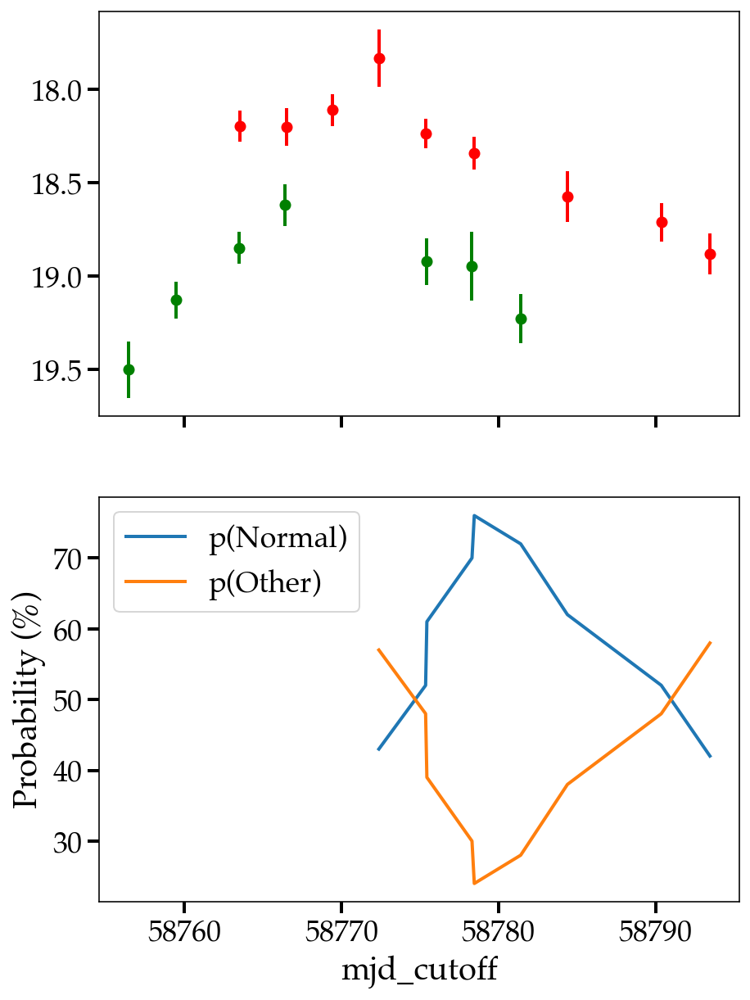

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 57.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aadvaoi


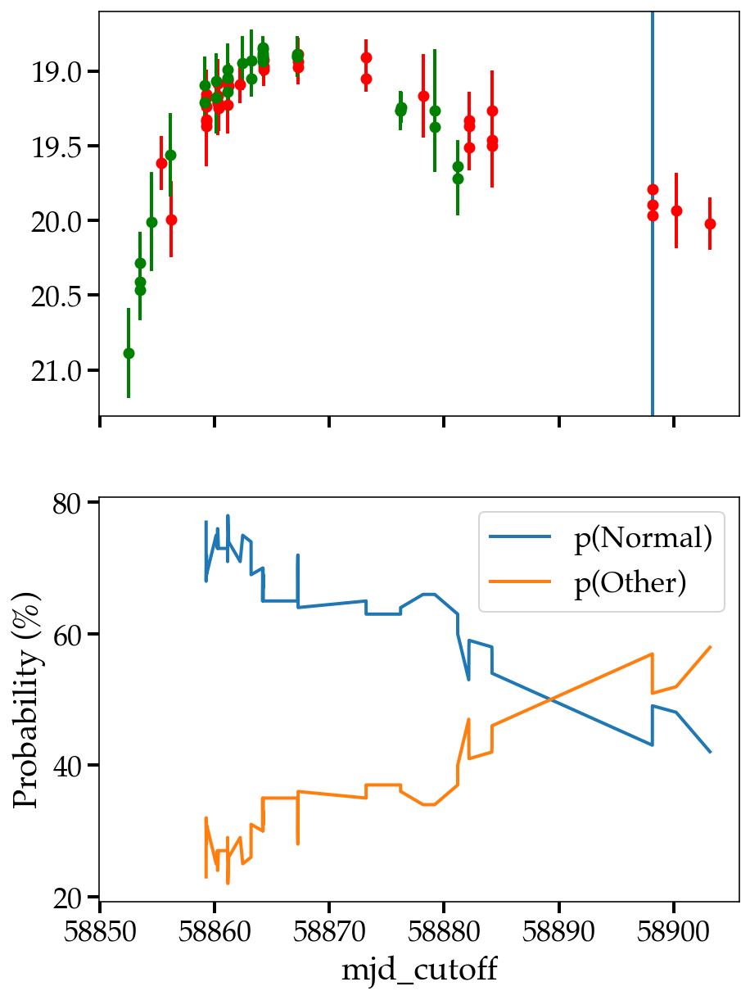

%%%%%%%%%%%%
SN IIP Normal Other
max_anom_score = 59.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aaduufr


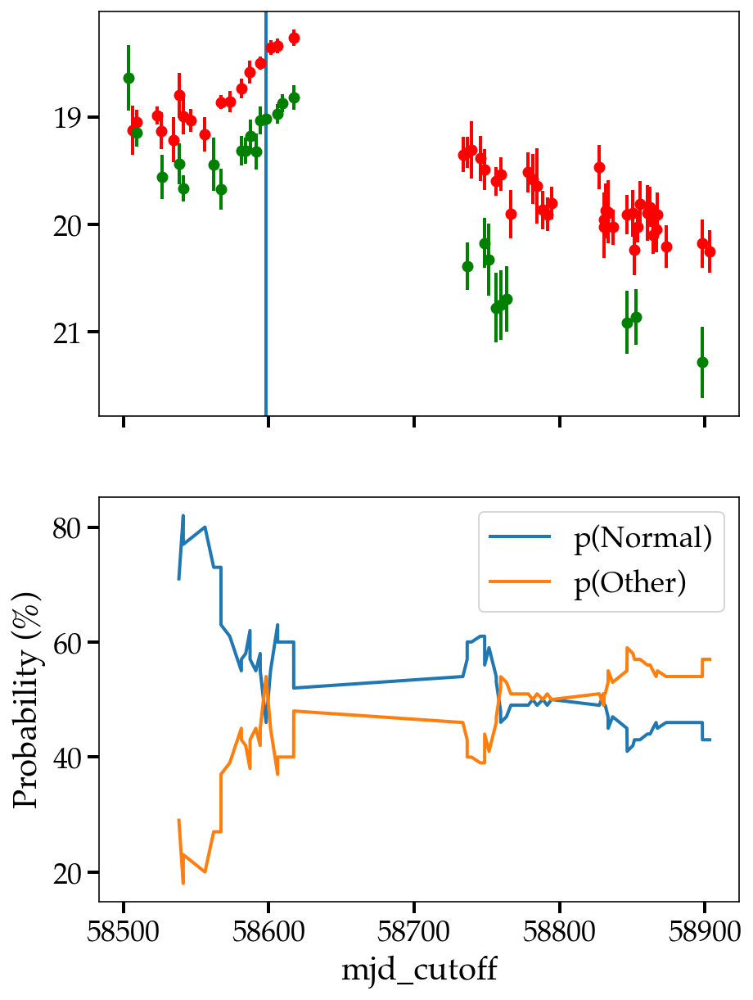

%%%%%%%%%%%%
SN II Normal Other
max_anom_score = 57.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abkfmjp


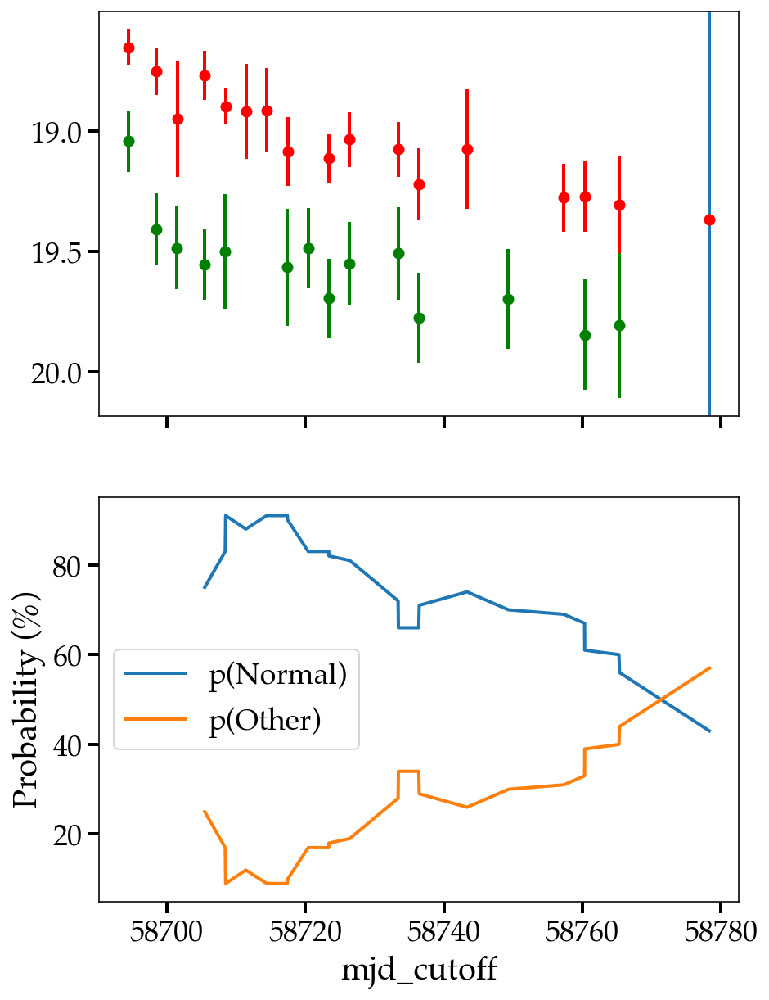

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 60.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abwynwj


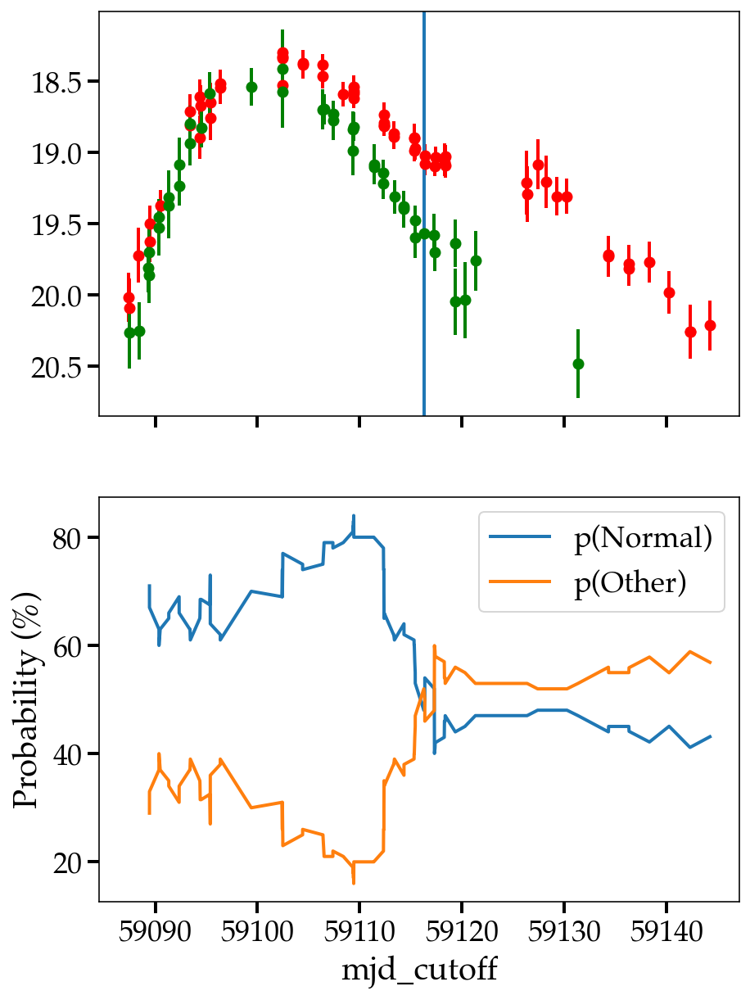

%%%%%%%%%%%%
SN Ia-pec Other Other
max_anom_score = 56.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aaputrv


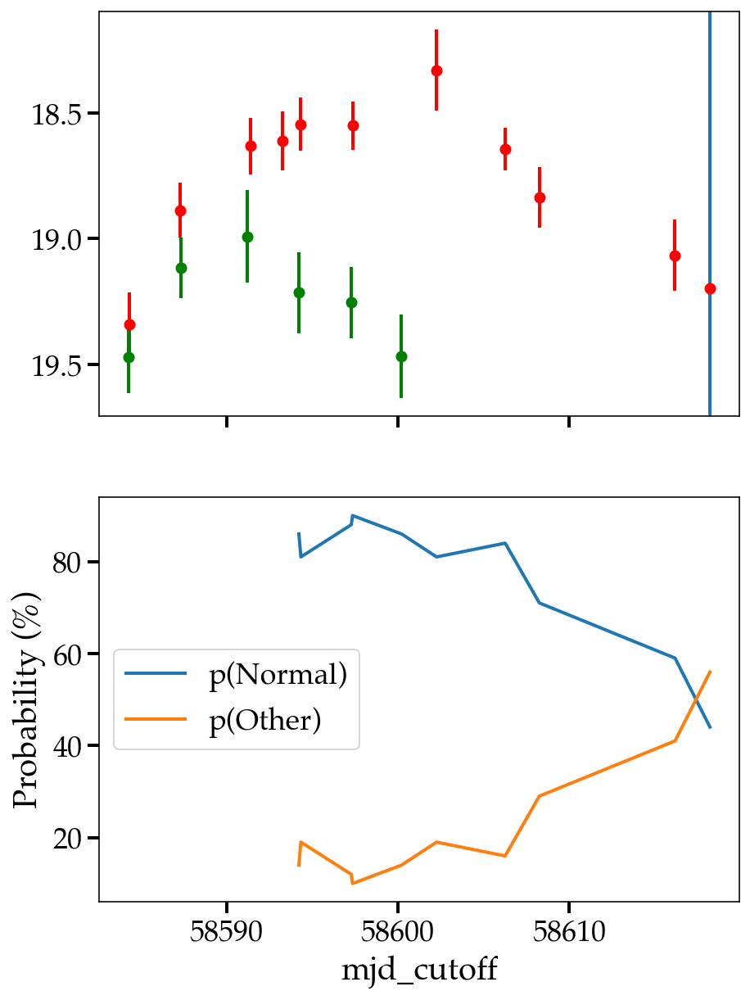

%%%%%%%%%%%%
TDE Other Other
max_anom_score = 56.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aabqihu


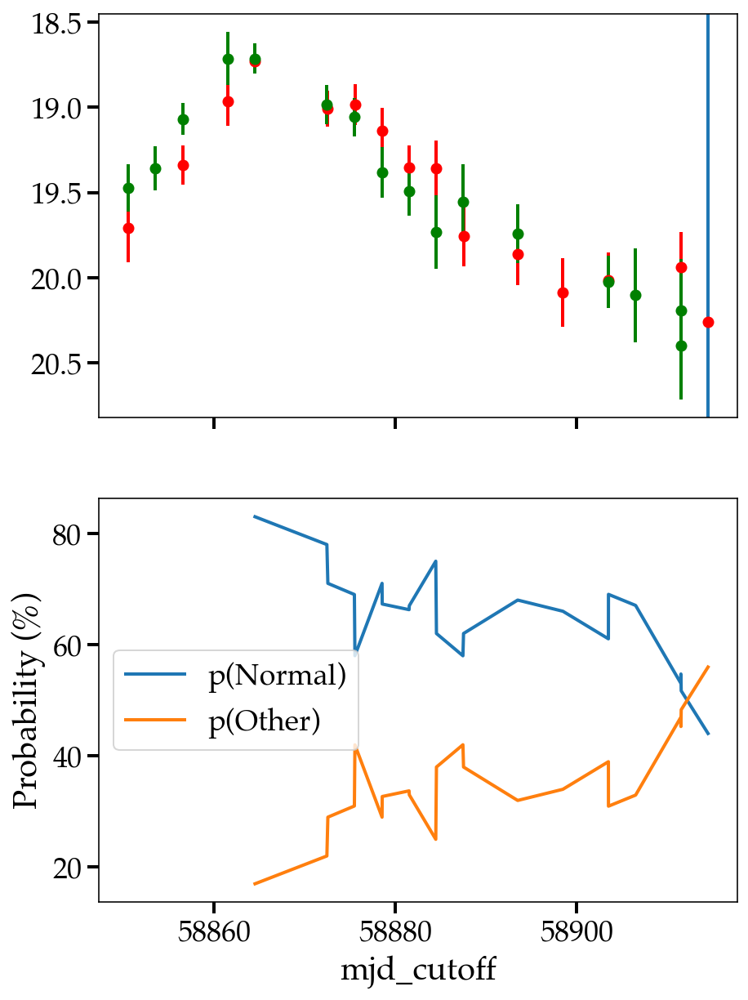

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 66.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acbwaah


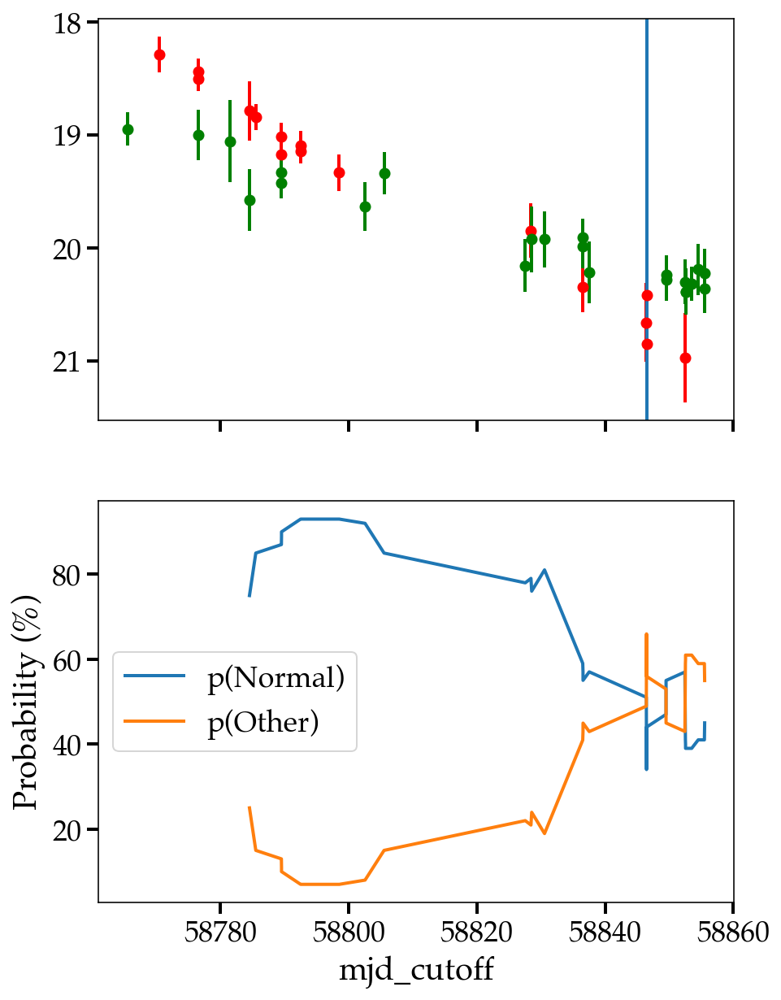

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 54.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


https://alerce.online/object/ZTF19aakyxsq


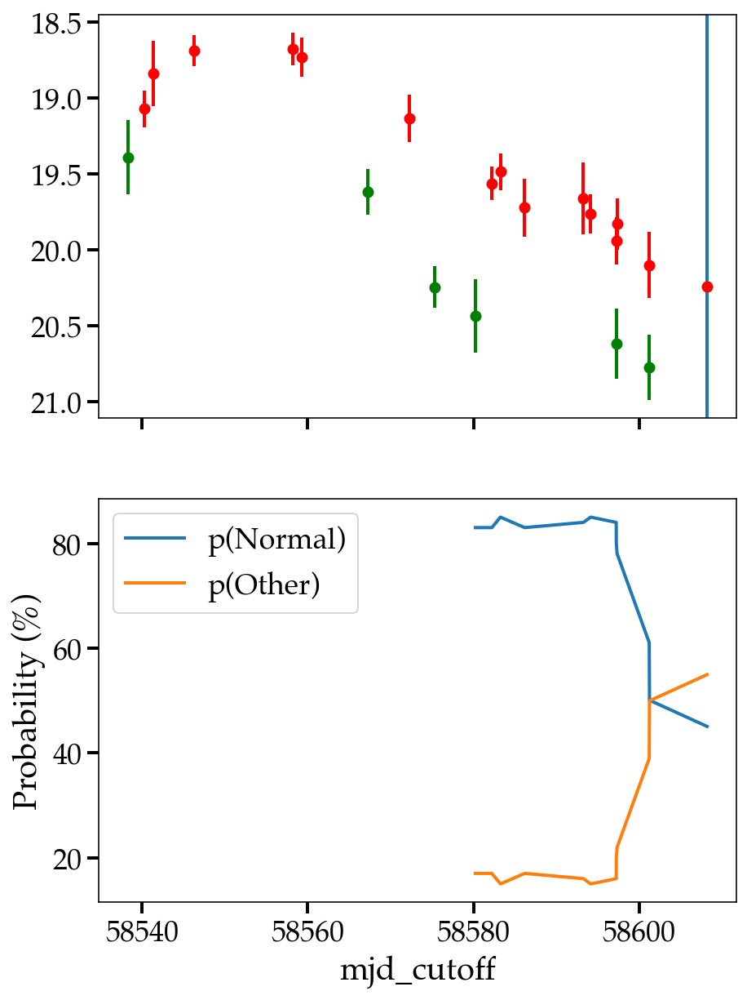

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 64.5


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abulzlj


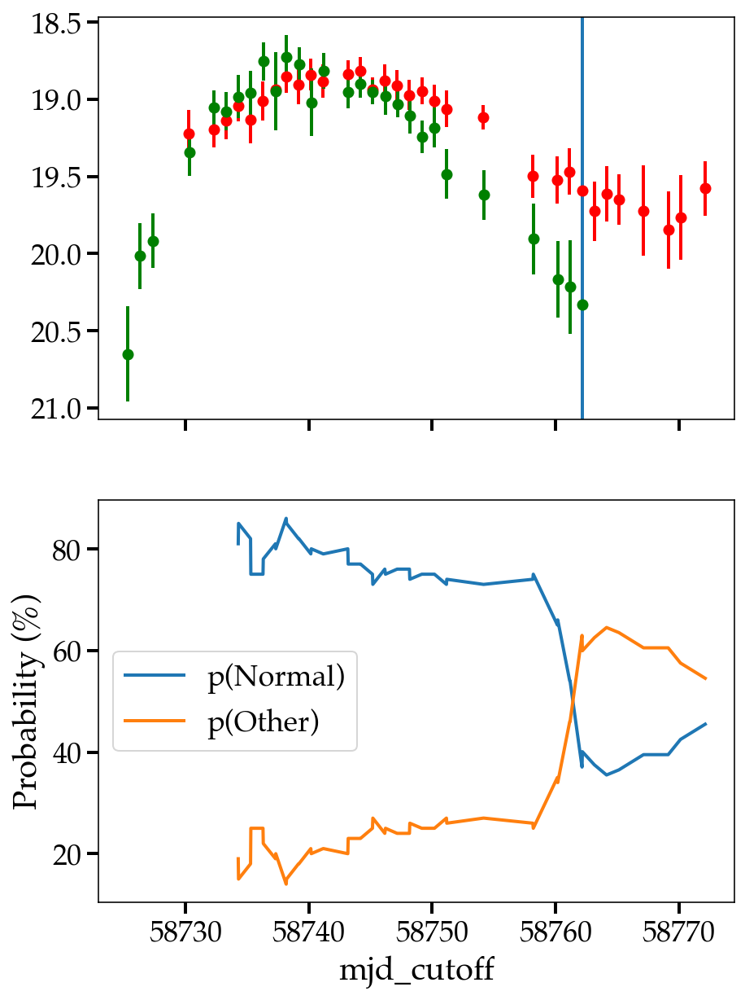

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 54.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abipmfl


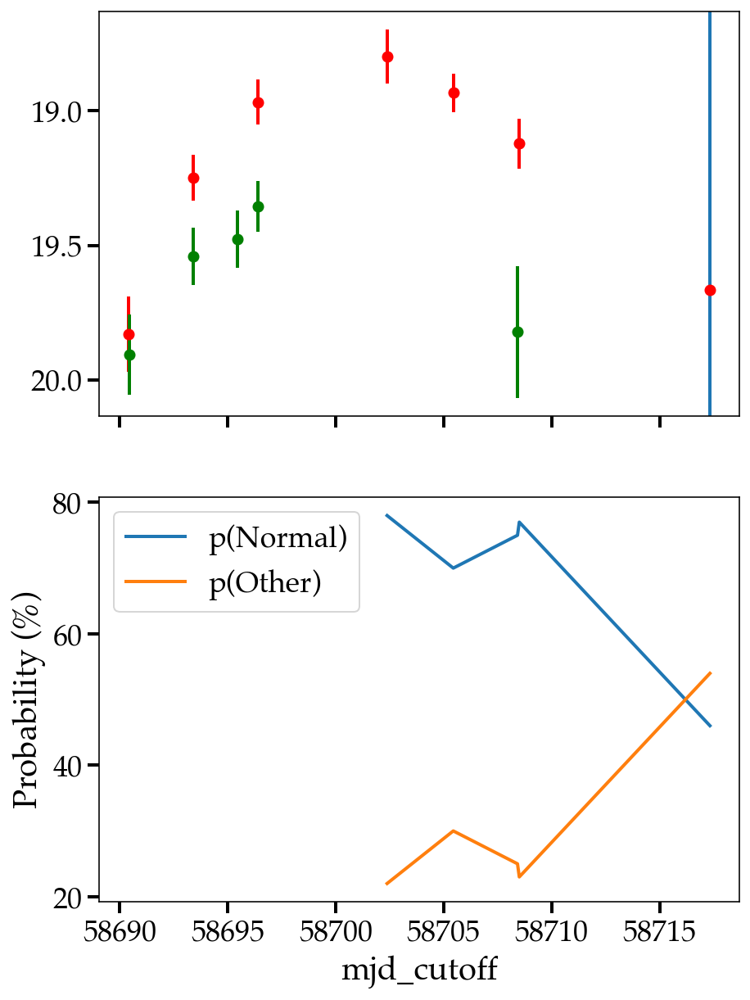

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 67.7


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aahdwze


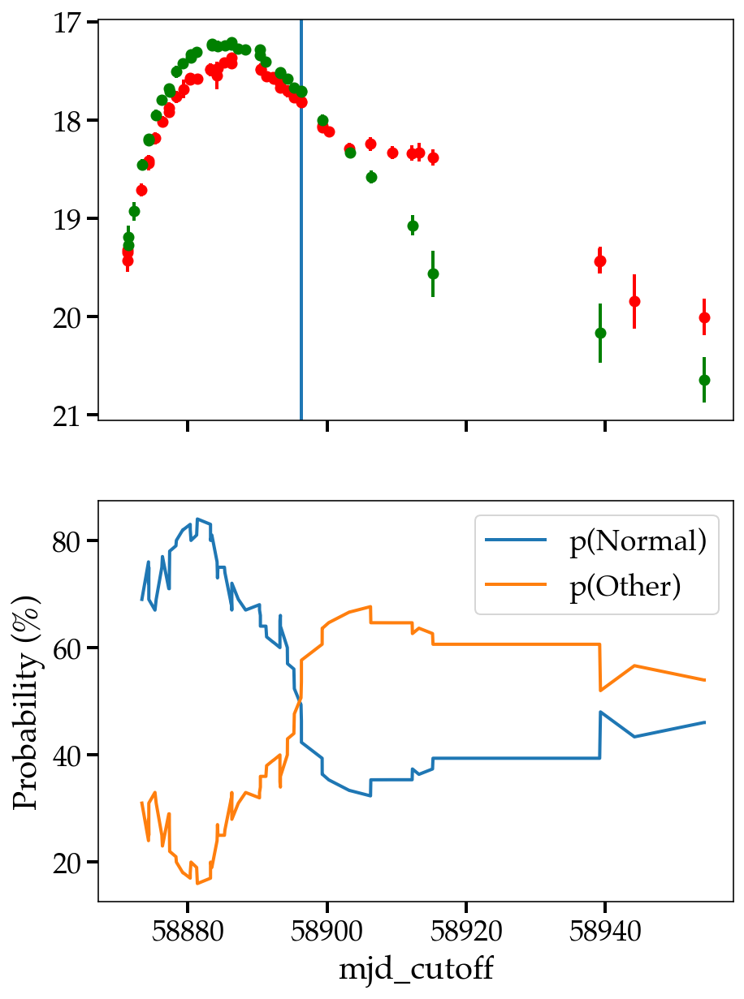

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 71.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acnfjyw


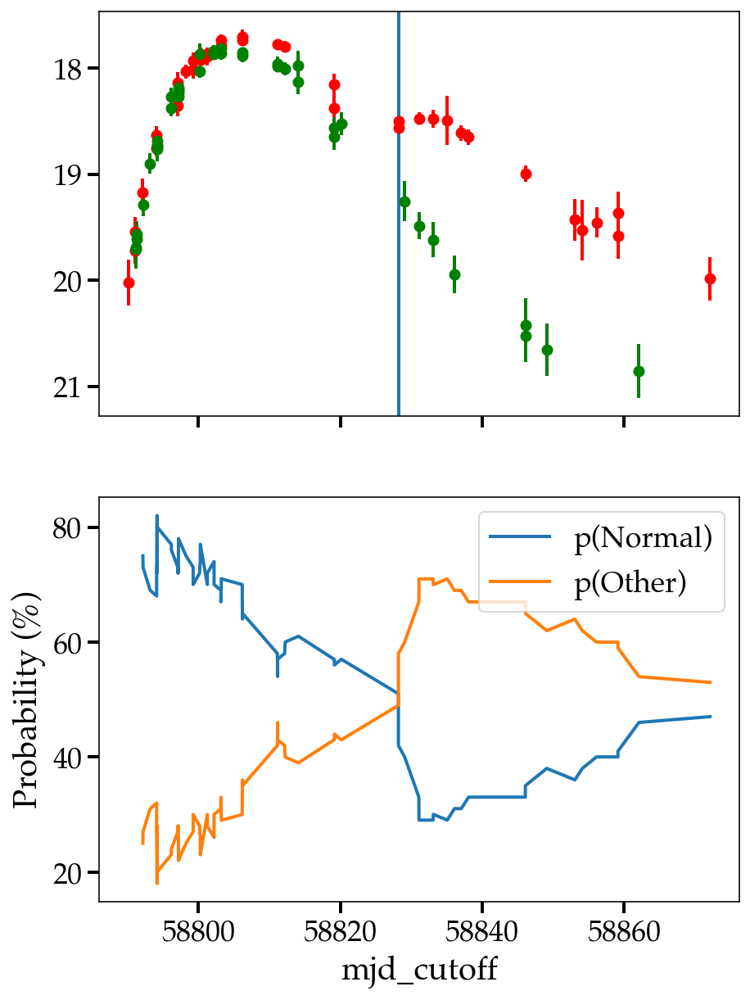

%%%%%%%%%%%%
SLSN-I Other Other
max_anom_score = 52.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19aaruixj


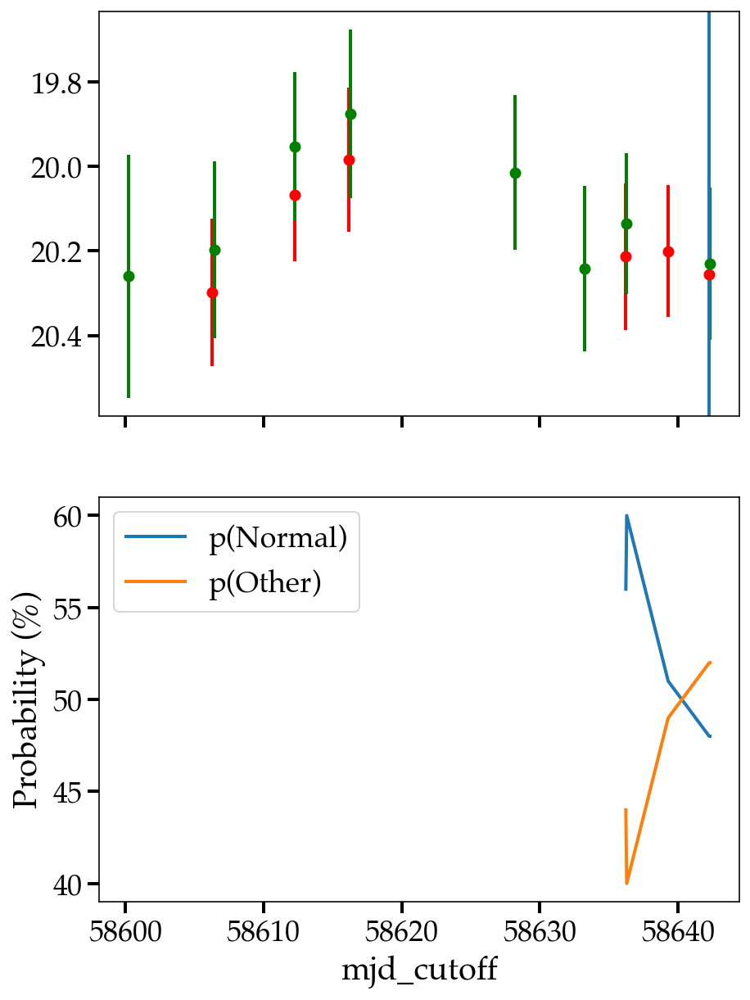

%%%%%%%%%%%%
SN IIn Other Other
max_anom_score = 52.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aaaddgy


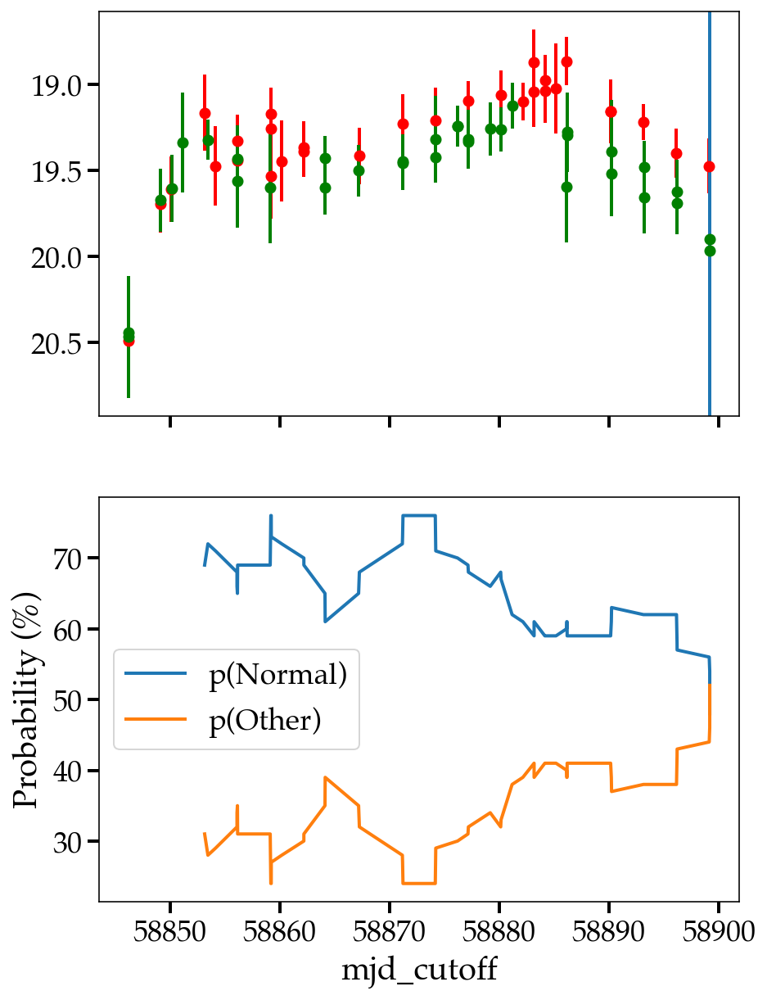

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 61.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


https://alerce.online/object/ZTF20abxcycq


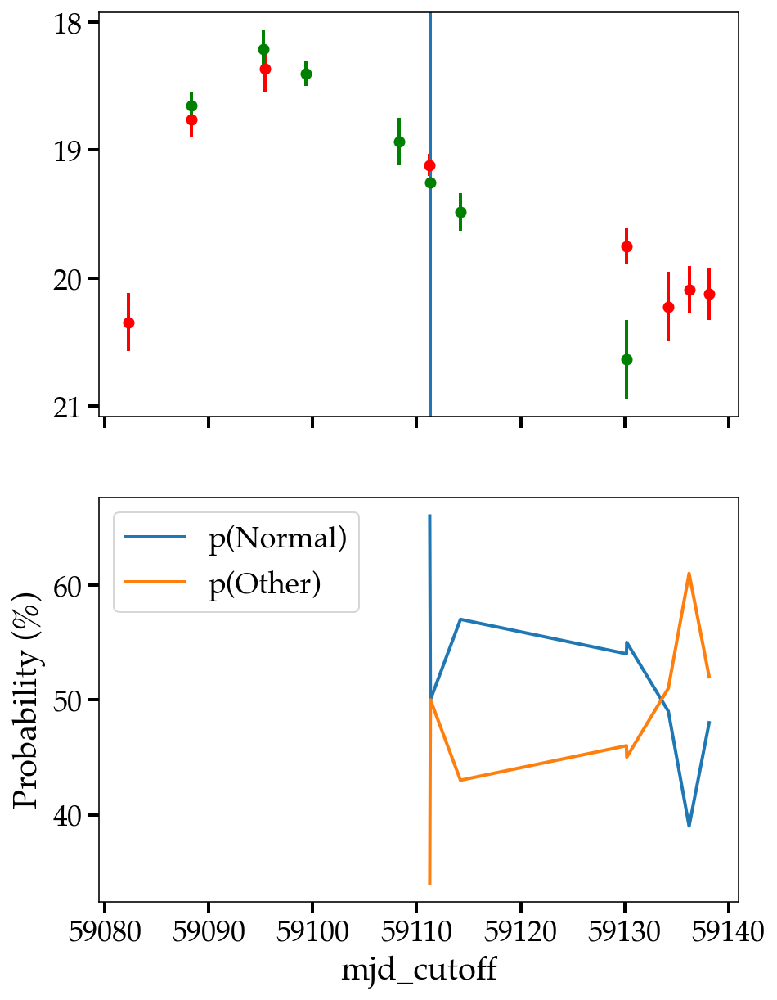

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 63.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20abxpzxg


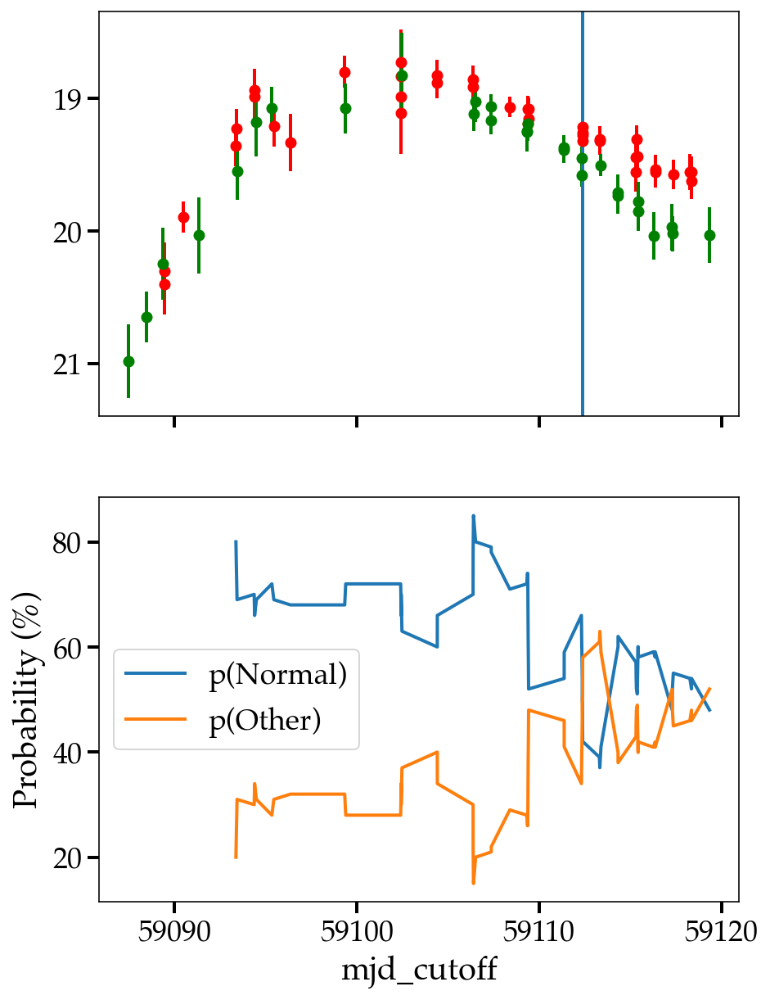

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 70.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF18aansqun


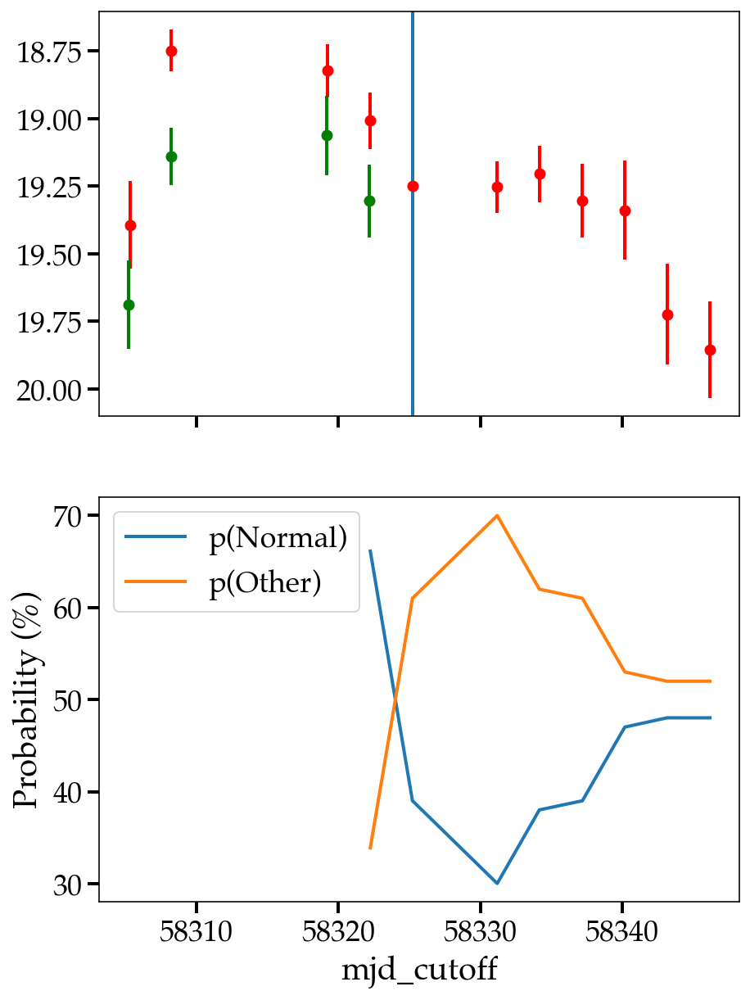

%%%%%%%%%%%%
SN Ib Other Other
max_anom_score = 51.9


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acmelor


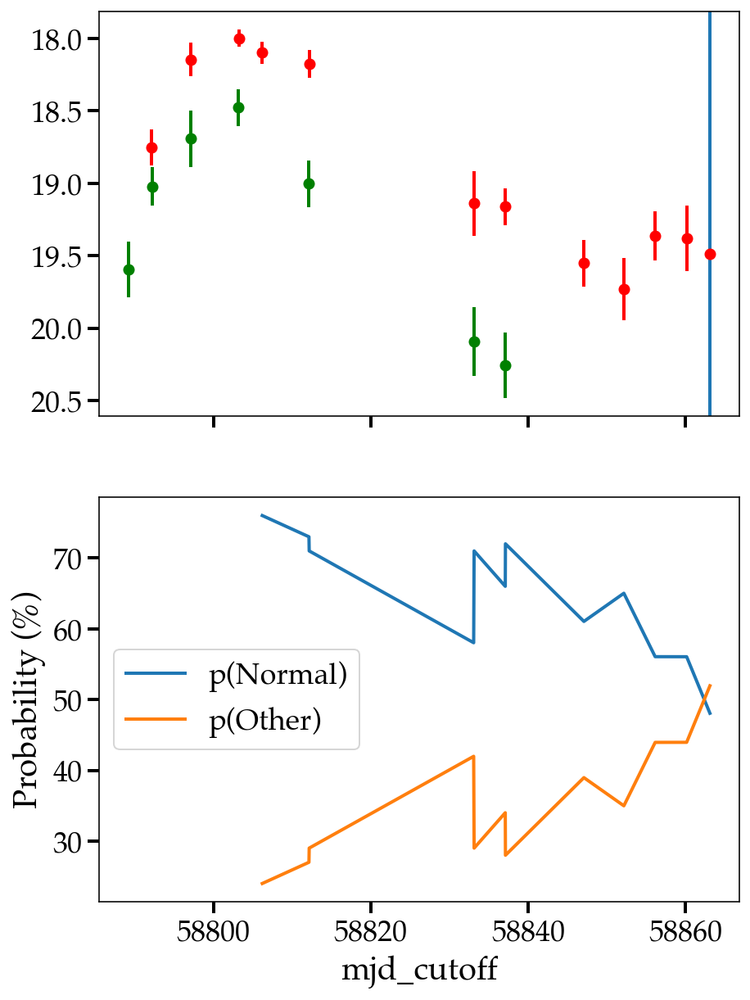

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 54.5


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acjjwsy


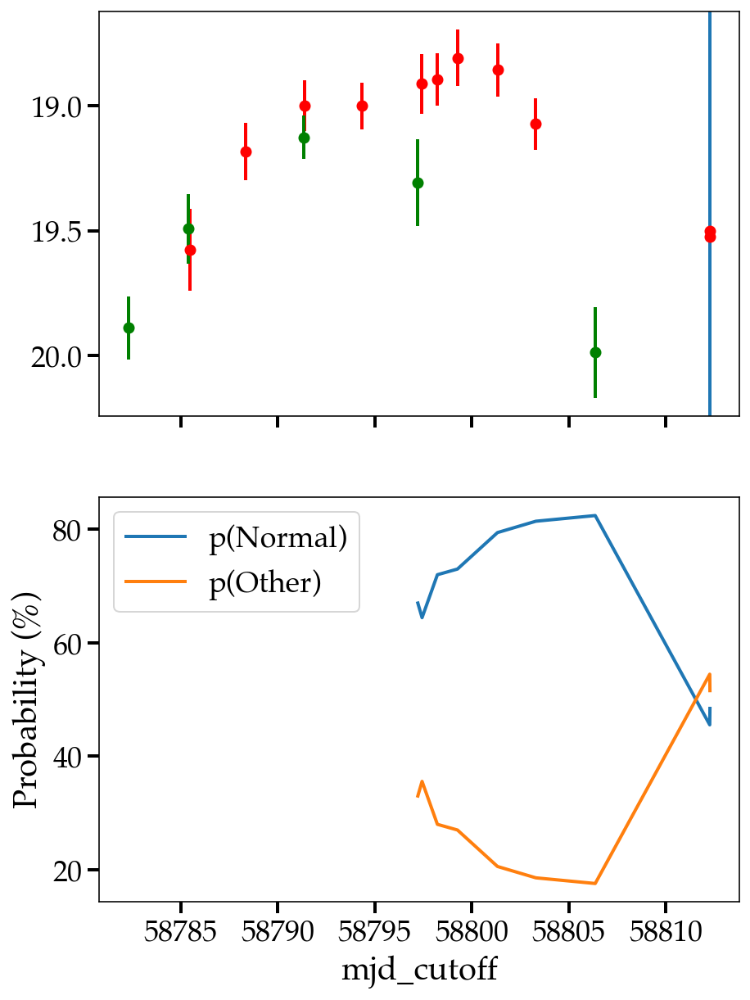

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 67.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19ackzvdp


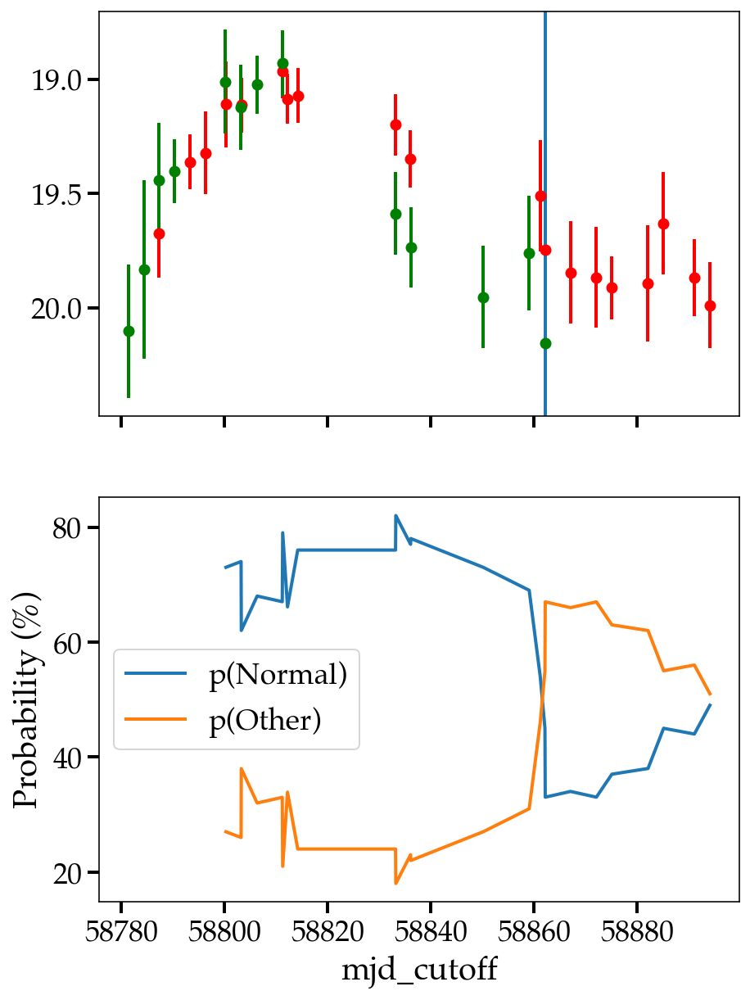

%%%%%%%%%%%%
SN Ia Normal Other
Prediction doesn't exceed anom_threshold of 50% for ZTF19abttstb.
max_anom_score = 61.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abttstb


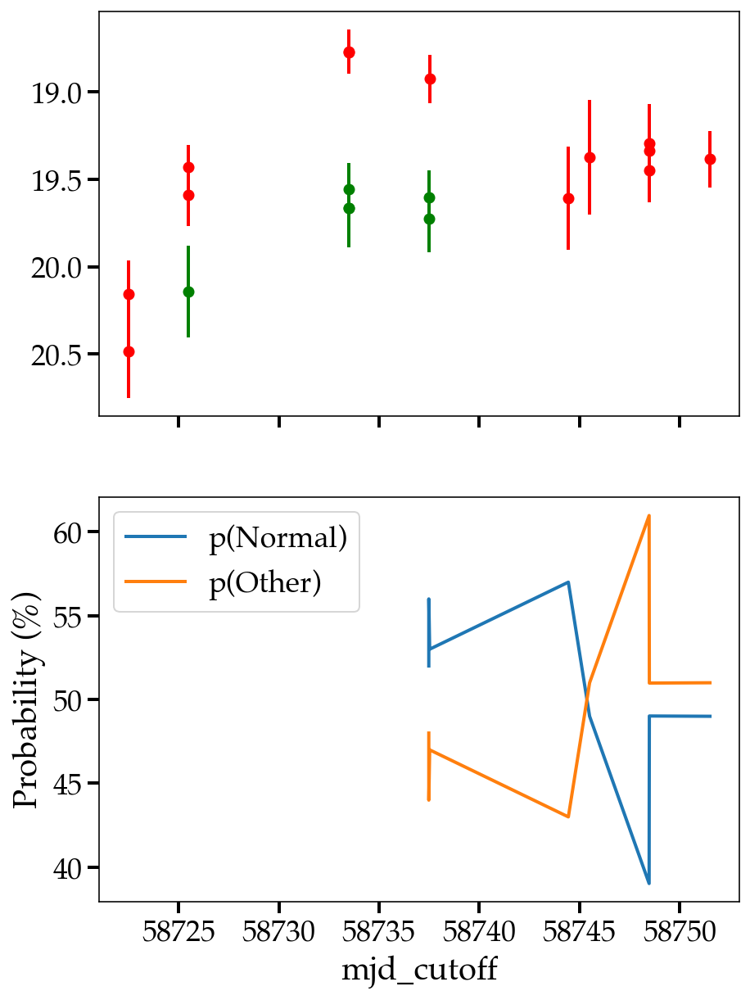

%%%%%%%%%%%%
SN II Normal Other
max_anom_score = 51.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abqgtqo


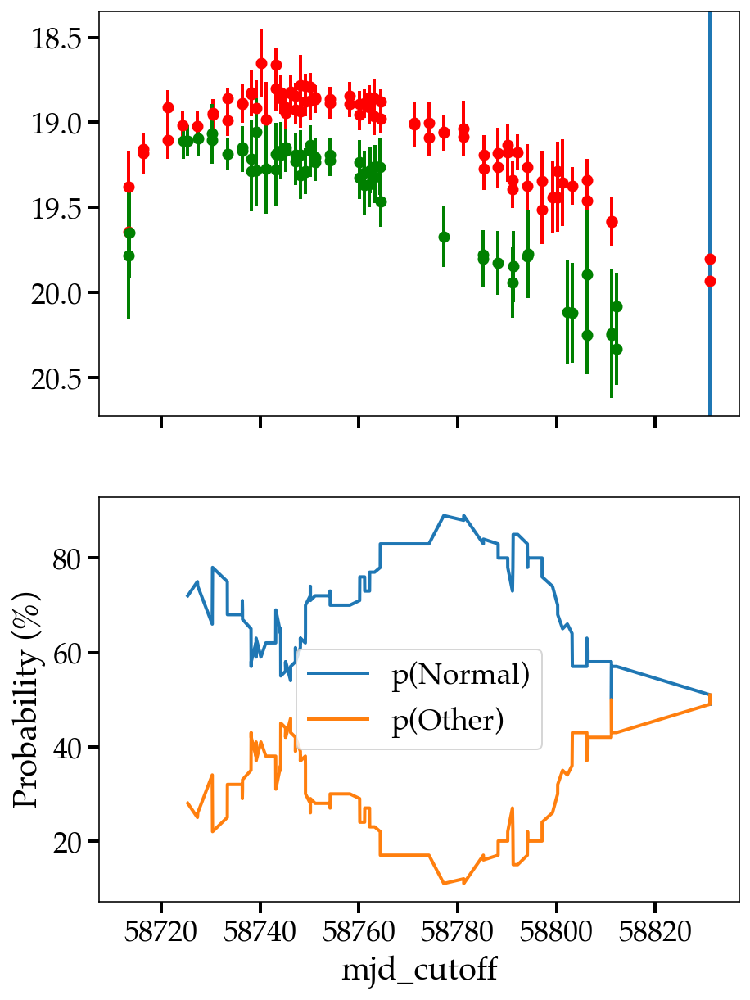

%%%%%%%%%%%%
SN Ic Other Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20aavgcnu.
max_anom_score = 59.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aavgcnu


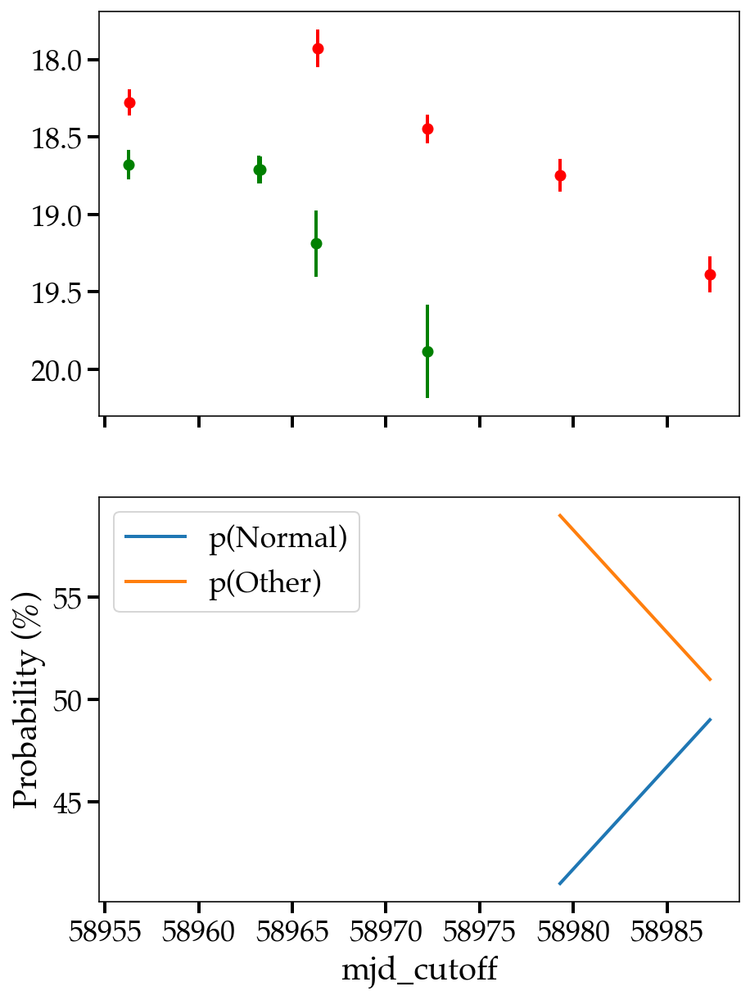

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 56.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aambbfn


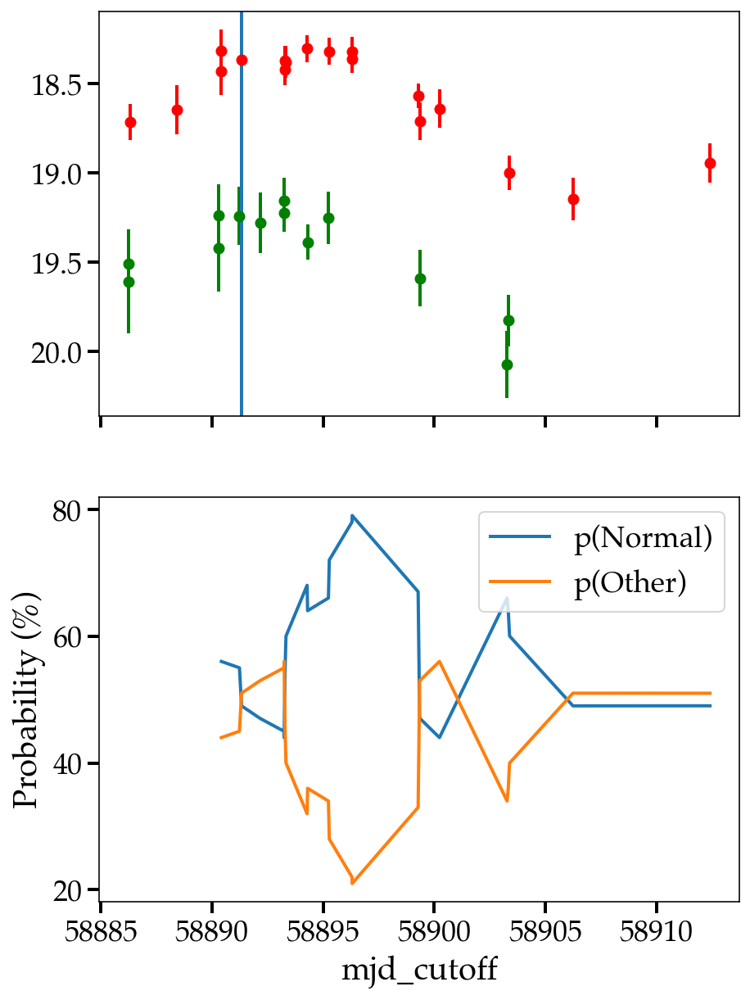

%%%%%%%%%%%%
SN IIn Other Other
max_anom_score = 55.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF20aartnkv


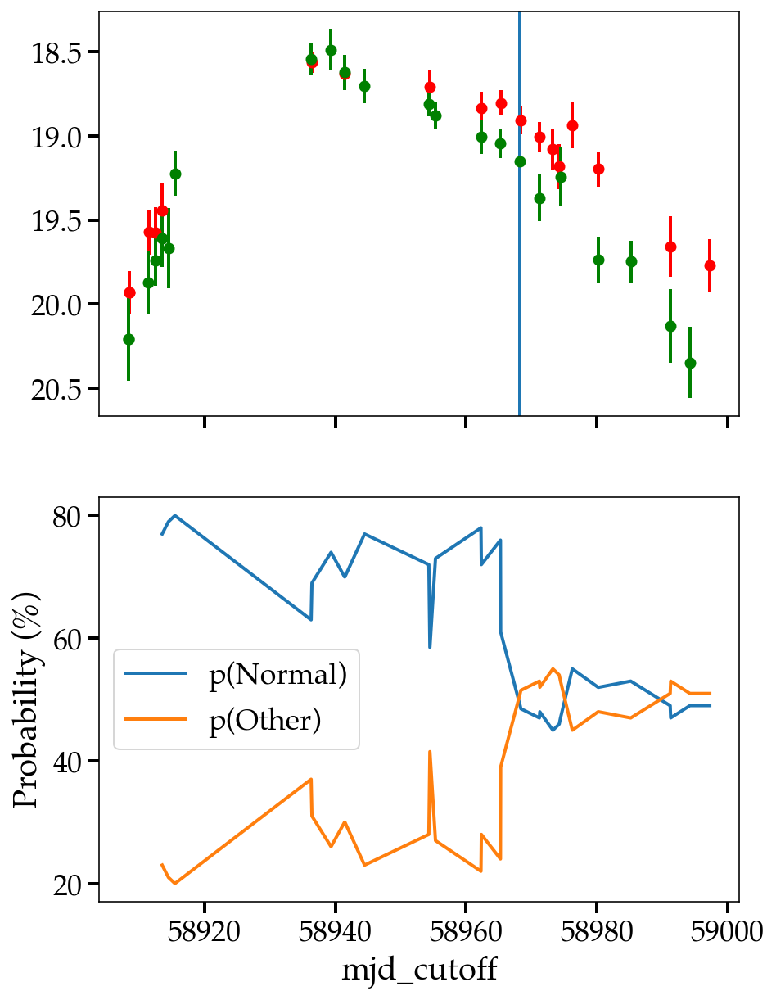

%%%%%%%%%%%%
SN Ia Normal Other
max_anom_score = 58.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19abwsxug


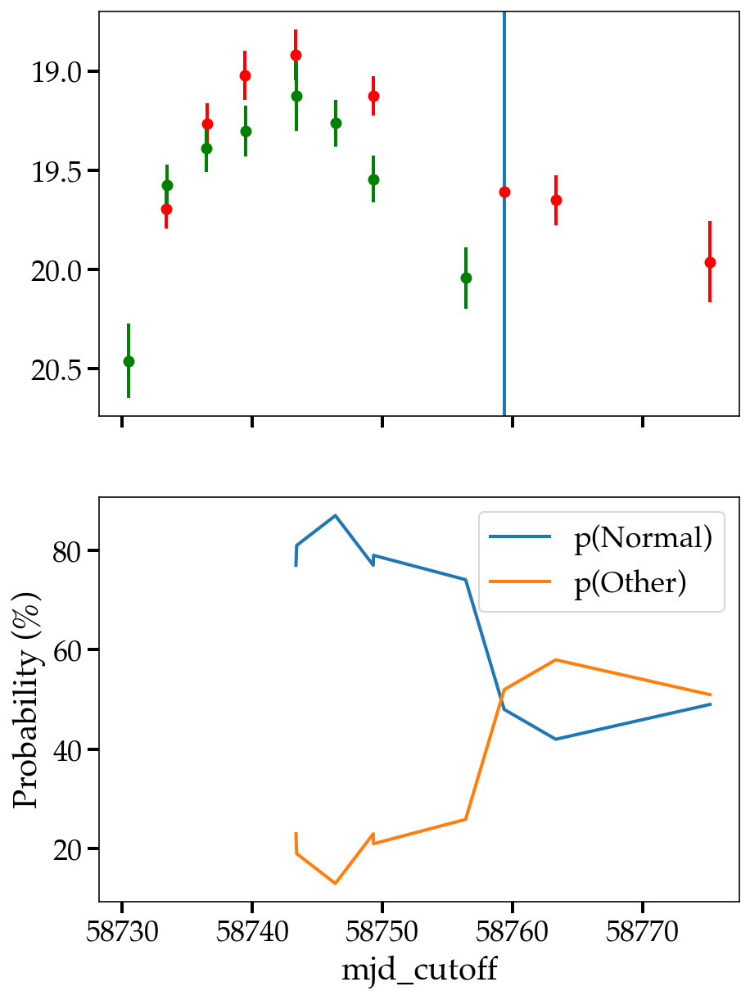

%%%%%%%%%%%%
SN IIn Other Other
max_anom_score = 64.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF19acyjviz


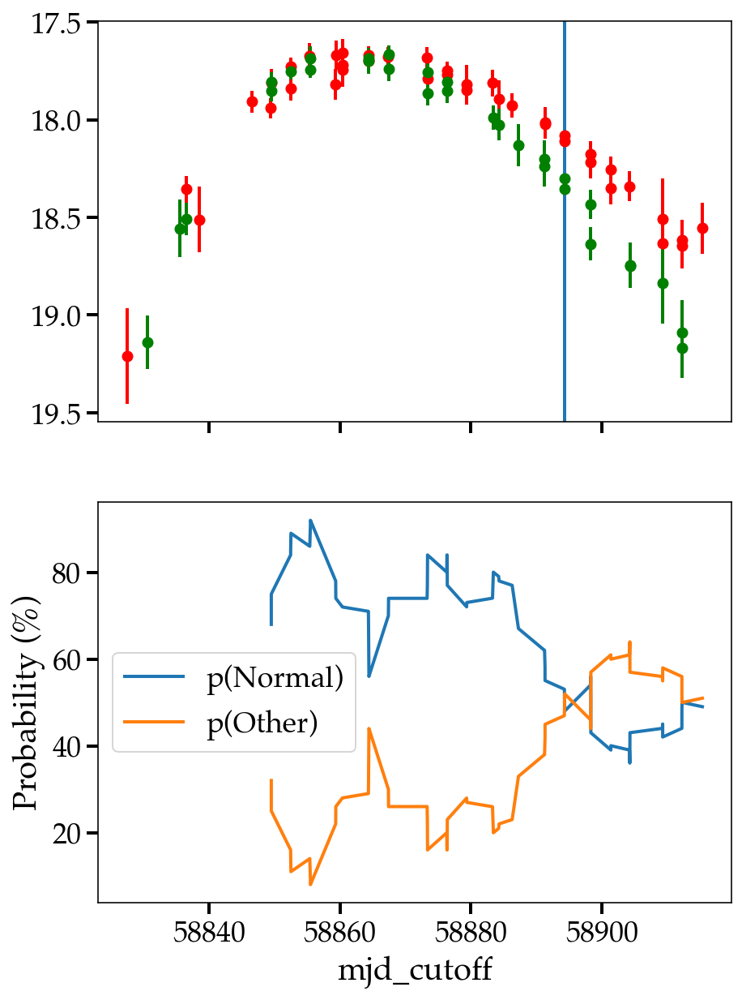

%%%%%%%%%%%%
SLSN-II Other Other
max_anom_score = 59.0


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


https://alerce.online/object/ZTF19aalvdeu


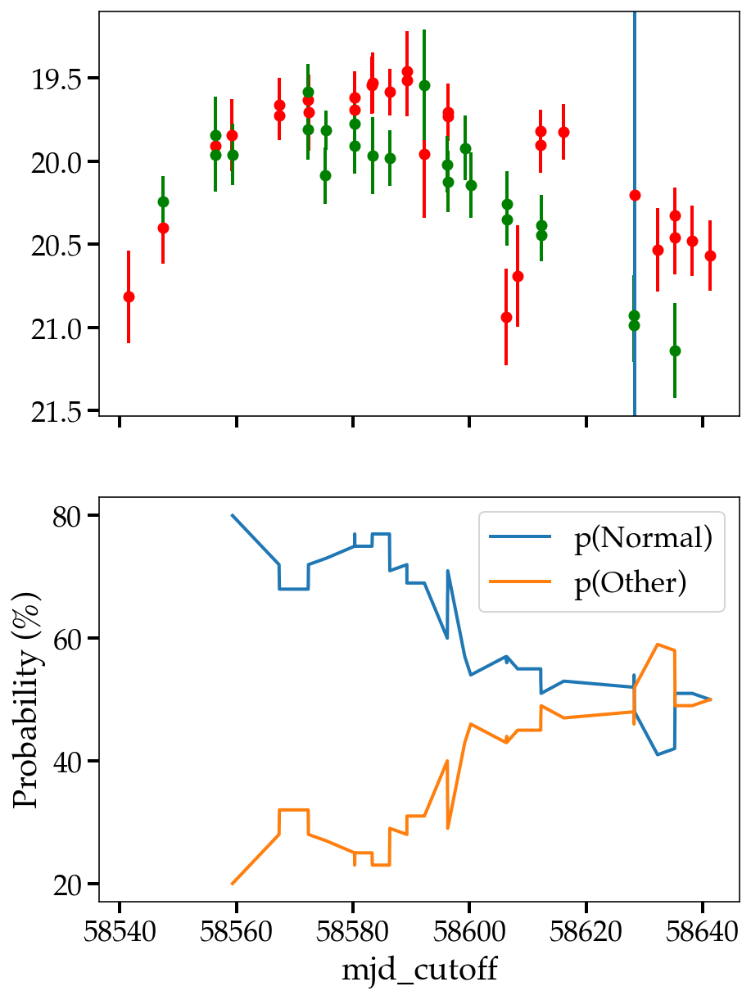

%%%%%%%%%%%%


In [43]:
for obj, score, cls, cls2, rfc_cls in zip(higest_anom_score_df.index, 
                                   higest_anom_score_df.max_anom_score,
                                   higest_anom_score_df["Obj. Type"], 
                                   higest_anom_score_df["Obj. Type 2cls"], 
                                   higest_anom_score_df.RFC_best_cls):
    print(cls, cls2, rfc_cls)
    plot_RFC_prob_vs_lc_ztfid(anom_ztfid=obj, 
                              anom_thresh=50, 
                              df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/repo/notebooks/YSEDR1/timeseries",
                             )
    print("%%%%%%%%%%%%")

In [35]:
mislabeled_df = merged_df[(merged_df['Obj. Type 2cls'] == "Normal") & (merged_df['RFC_best_cls'] == "Other")]
mislabeled_df

,Name,RA,DEC,Obj. Type,Redshift,Host Name,Host Redshift,Reporting Group/s,Discovery Data Source/s,Classifying Group/s,...,Discovery Mag/Flux,Discovery Filter,Discovery Date (UT),Sender,Remarks,Discovery Bibcode,Classification Bibcodes,Ext. catalog/s,RFC_best_cls,Obj. Type 2cls
Disc. Internal Name,,,,,,,,,,,,,,,,,,,,,
ZTF20abxpzxg,SN 2020sin,01:17:37.417,+16:52:50.61,SN Ia,0.077000,SDSS J011737.31+165254.3,0.094000,"ALeRCE, ZTF, Pan-STARRS, ATLAS","ZTF, Pan-STARRS, ATLAS",None,...,20.9838,g-ZTF,2020-08-26 11:25:34.997,ALeRCE,NaN,2020TNSTR2687....1F,2020TNSCR2902....1T,NaN,Other,Normal
ZTF20abxmgny,SN 2020sgc,18:43:44.524,+66:47:47.10,SN Ia,0.090000,2MASS J18434453+6647473,NaN,"ALeRCE, ZTF",ZTF,ZTF,...,18.4474,g-ZTF,2020-08-29 07:34:55.998,ALeRCE,NaN,2020TNSTR2667....1F,2020TNSCR2724....1D,NaN,Other,Normal
ZTF20abxfiev,SN 2020sfs,02:41:25.247,+13:20:22.34,SN Ia,0.080000,NaN,NaN,"ZTF, Pan-STARRS, ATLAS","ZTF, Pan-STARRS, ATLAS",ZTF,...,20.0000,g-ZTF,2020-08-27 12:00:06.048,ZTF_AMPEL_COMPLETE,NaN,2020TNSTR2670....1N,2020TNSCR2830....1G,NaN,Other,Normal
ZTF20abxcycq,SN 2020scn,22:07:52.435,-10:33:32.09,SN Ia,0.082073,NaN,NaN,"ZTF, Pan-STARRS","ZTF, Pan-STARRS",ZTF,...,20.3500,r-ZTF,2020-08-21 06:27:21.600,ZTF_Bot1,NaN,2020TNSTR2629....1F,2020TNSCR2724....1D,NaN,Other,Normal
ZTF20abwynwj,SN 2020sbx,01:17:50.390,+21:15:47.21,SN Ia,0.060000,SDSS J011750.43+211546.6,0.078000,"ALeRCE, ZTF, ATLAS","ZTF, ATLAS",ZTF,...,20.0195,r-ZTF,2020-08-26 09:12:25.001,ALeRCE,NaN,2020TNSTR2609....1F,2020TNSCR2799....1D,NaN,Other,Normal
ZTF20abpyxja,SN 2020riy,23:54:59.965,+49:28:54.89,SN Ia,0.050000,NaN,NaN,"SGLF, ATLAS","ZTF, ATLAS",ZTF,...,20.0790,r-ZTF,2020-08-01 11:44:40.000,Perez-Fournon,NaN,2020TNSTR2500....1P,2020TNSCR2525....1D,NaN,Other,Normal
ZTF20abjkxwa,SN 2020oao,01:43:49.838,+30:21:13.99,SN Ia,0.054000,NaN,NaN,ZTF,ZTF,ZTF,...,17.6000,g-ZTF,2020-07-02 11:30:09.792,ZTF_AMPEL_NEW,NaN,2020TNSTR2048....1N,2020TNSCR2169....1D,NaN,Other,Normal
ZTF20abipuee,SN 2020npt,19:04:26.237,+55:14:45.92,SN Ia,0.050000,NaN,NaN,ZTF,ZTF,ZTF,...,19.5200,r-ZTF,2020-06-28 05:35:53.664,ZTF_AMPEL_NEW,NaN,2020TNSTR1970....1N,2020TNSCR2127....1P,NaN,Other,Normal
ZTF20abfcdkj,SN 2020mst,18:47:10.541,+60:29:48.43,SN II,0.059000,NaN,NaN,"SGLF, ZTF, ATLAS","ZTF, ATLAS",ZTF,...,20.8280,g-ZTF,2020-06-13 06:00:21.000,Perez-Fournon,NaN,2020TNSTR1821....1A,2020TNSCR2128....1Z,NaN,Other,Normal


In [36]:
for obj, cls, cls2, rfc_cls in zip(mislabeled_df.index, mislabeled_df["Obj. Type"], mislabeled_df["Obj. Type 2cls"], mislabeled_df.RFC_best_cls):
    print(f"https://alerce.online/object/{obj}", cls, cls2, rfc_cls)

https://alerce.online/object/ZTF20abxpzxg SN Ia Normal Other
https://alerce.online/object/ZTF20abxmgny SN Ia Normal Other
https://alerce.online/object/ZTF20abxfiev SN Ia Normal Other
https://alerce.online/object/ZTF20abxcycq SN Ia Normal Other
https://alerce.online/object/ZTF20abwynwj SN Ia Normal Other
https://alerce.online/object/ZTF20abpyxja SN Ia Normal Other
https://alerce.online/object/ZTF20abjkxwa SN Ia Normal Other
https://alerce.online/object/ZTF20abipuee SN Ia Normal Other
https://alerce.online/object/ZTF20abfcdkj SN II Normal Other
https://alerce.online/object/ZTF20aayxkqy SN Ia Normal Other
https://alerce.online/object/ZTF20aambbfn SN Ia Normal Other
https://alerce.online/object/ZTF20aajbsxt SN Ia Normal Other
https://alerce.online/object/ZTF20aahdwze SN Ia Normal Other
https://alerce.online/object/ZTF20aadvaoi SN Ia Normal Other
https://alerce.online/object/ZTF20aaaxrad SN Ia Normal Other
https://alerce.online/object/ZTF19acklbjr SN Ia Normal Other
https://alerce.online/ob

In [48]:
for obj, cls, cls2, rfc_cls in zip(merged_df.index, merged_df["Obj. Type"], merged_df["Obj. Type 2cls"], merged_df.RFC_best_cls):
    if cls == "SN Ibn":
        print(f"https://alerce.online/object/{obj}", cls, cls2, rfc_cls)

https://alerce.online/object/ZTF20aalrqbu SN Ibn Other Normal
https://alerce.online/object/ZTF19acmbekd SN Ibn Other Normal
https://alerce.online/object/ZTF19abobxik SN Ibn Other Normal
https://alerce.online/object/ZTF19abamqxo SN Ibn Other Normal
https://alerce.online/object/ZTF19aapfmki SN Ibn Other Normal
